In [1]:
import itertools
import os
import re
from random import random

import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.patches import Patch
from scipy import stats  # We need this for the stats test
from scipy.cluster.hierarchy import cophenet
from scipy.optimize import curve_fit
from scipy.spatial.distance import squareform
from scipy.stats import levene, mannwhitneyu, pearsonr, spearmanr
from statannotations.Annotator import Annotator
from statsmodels.stats.multitest import multipletests
from supervenn import supervenn
from tqdm import tqdm  # For progress bars

plt.rcParams["svg.fonttype"] = "none"

import colorsys
import zlib

from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import (
    DistanceMatrix,
    PairwiseMatrix,
    SymmetricMatrix,
    permanova,
)
from sklearn.metrics import pairwise_distances

In [2]:
# --- 1. Global Visualization Parameters ---
GLOBAL_FONT_SIZE = 7.5
# Set general matplotlib defaults for all text
plt.rcParams.update(
    {
        "font.size": GLOBAL_FONT_SIZE,
        "axes.titlesize": GLOBAL_FONT_SIZE,
        "axes.labelsize": GLOBAL_FONT_SIZE,
        "xtick.labelsize": GLOBAL_FONT_SIZE,
        "ytick.labelsize": GLOBAL_FONT_SIZE,
        "legend.fontsize": GLOBAL_FONT_SIZE,
        "svg.fonttype": "none",
    }
)

In [3]:
pd.set_option("display.max_columns", 20)

# Palettes, general variables and utility functions

In [3]:
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]
modifications = [
    "CTCF",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
    "H3K27ac",
]
cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]

cell_line_p = {
    "Caco-2": "saddlebrown",
    "SJCRH30": "darkgreen",
    "BE2C": "grey",
    "SJSA1": "teal",
    "HAP-1": "royalblue",
    "HL-60": "cyan",
    "MG63": "lime",
    "VCaP": "gold",
    "C4-2B": "orangered",
    "RWPE2": "orange",
    "22Rv1": "lightcoral",
    "RWPE1": "deeppink",
}
modification_p = {
    "CTCF": "#e5d8bd",
    "H3K4me1": "#fdcdac",
    "H3K9me3": "#b3cde3",
    "H3K36me3": "#e6f5c9",
    "H3K27me3": "#decbe4",
    "H3K4me3": "#b3e2cd",
    "H3K27ac": "#fff2ae",
}

modification_p_richer = {
    "CTCF": "#d3c09b",
    "H3K4me1": "#fabd88",
    "H3K9me3": "#9ab7d3",
    "H3K36me3": "#d7f0a8",
    "H3K27me3": "#c7aed6",
    "H3K4me3": "#9ad1b5",
    "H3K27ac": "#ffe98c",
}

class_names_p = {
    "LINE": "#cc660b",
    "LTR": "#70453c",
    "SINE": "#ab1f20",
    "DNA": "#195f90",
    "Retroposon": "#765297",
    "RC": "#238023",
}


def format_p_value(p_val):
    """Formats p-value into scientific notation for small values."""
    if p_val < 0.001:
        # Format in scientific notation: 1.3e-208
        formatted_p = "{:.1e}".format(p_val)
        mantissa, exponent = formatted_p.split("e")
        # Use Mathtext for the exponent
        return f"$p = {mantissa} \\times 10^{{{int(exponent)}}}$"
    else:
        return f"$p = {p_val:.3f}$"


# --- 1. Global Visualization Parameters ---
GLOBAL_FONT_SIZE = 7.5


def get_subset_cophenetic(z, all_labels, target_labels):
    """
    Calculates the cophenetic distance matrix for a linkage tree and
    subsets it to only include specific target labels.
    """
    # 1. Calculate full cophenetic distances (condensed form)
    coph_full = cophenet(z)
    # 2. Convert to square form for indexing
    coph_sq = squareform(coph_full)

    # 3. Create a mapping of label to index in the original tree
    label_to_idx = {label: i for i, label in enumerate(all_labels)}

    # 4. Extract indices for the target labels (in fixed order)
    subset_indices = [label_to_idx[lbl] for lbl in target_labels]

    # 5. Subset the matrix and return to condensed form
    coph_subset_sq = coph_sq[np.ix_(subset_indices, subset_indices)]
    return squareform(coph_subset_sq)


def run_dendrogram_permutation(coph1, z2, labels2, intersection, method, n_perms):
    """
    Builds a null distribution by shuffling labels of the second tree
    and recalculating congruence on the intersection.
    """
    null_corrs = []
    print(f"Running {n_perms} permutations on common leaf subset...")

    for _ in range(n_perms):
        # Shuffle all original labels of tree 2
        shuffled_labels2 = np.random.permutation(labels2)

        # Calculate cophenetic for the shuffled tree subsetted to intersection
        coph2_null = get_subset_cophenetic(z2, shuffled_labels2, intersection)

        # Calculate correlation
        if method == "pearson":
            r, _ = pearsonr(coph1, coph2_null)
        else:
            r, _ = spearmanr(coph1, coph2_null)
        null_corrs.append(r)

    return np.array(null_corrs)


def test_dendrogram_congruence(g1, g2, method="spearman", n_permutations=999):
    """
    Tests the significance of the similarity between two row dendrograms,
    handling different leaf counts by taking the intersection of leaf names.
    """
    # 1. Extract Labels and Linkage
    labels1 = g1.data2d.index.tolist()
    labels2 = g2.data2d.index.tolist()
    z1 = g1.dendrogram_row.linkage
    z2 = g2.dendrogram_row.linkage

    # 2. Find common labels (intersection)
    intersection = sorted(list(set(labels1) & set(labels2)))
    n_common = len(intersection)

    if n_common < 3:
        raise ValueError(
            f"Insufficient common labels found (n={n_common}). Need at least 3."
        )

    print(f"Comparing trees based on {n_common} common terminal nodes.")

    # 3. Calculate observed cophenetic matrices for the intersection
    coph1 = get_subset_cophenetic(z1, labels1, intersection)
    coph2_obs = get_subset_cophenetic(z2, labels2, intersection)

    # 4. Calculate Observed Correlation
    if method == "pearson":
        obs_corr, _ = pearsonr(coph1, coph2_obs)
    else:
        obs_corr, _ = spearmanr(coph1, coph2_obs)

    # 5. Run Permutation Test
    null_corrs = run_dendrogram_permutation(
        coph1, z2, labels2, intersection, method, n_permutations
    )

    # Calculate p-value: proportion of null correlations >= observed
    p_value = (np.sum(null_corrs >= obs_corr) + 1) / (n_permutations + 1)

    return {
        "observed_correlation": obs_corr,
        "p_value": p_value,
        "null_distribution": null_corrs,
        "method": method,
        "n_common": n_common,
    }


def plot_test_results(results, output_path="plots/dendrogram_congruence_test.svg"):
    """Visualizes the permutation test results with unified font sizes."""
    plt.figure(figsize=(3, 2))

    # Plot the null distribution
    sns.histplot(
        results["null_distribution"], color="gray", kde=True, label="Null Distribution"
    )

    # Plot the observed value
    plt.axvline(
        results["observed_correlation"],
        color="red",
        lw=2,
        linestyle="--",
        label=f"Observed (r={results['observed_correlation']:.3f})",
    )

    # Unified Font Size Customization
    plt.title(
        f"Dendrogram Congruence (N={results['n_common']} common leaves)\np-value: {results['p_value']:.4f}",
        fontsize=GLOBAL_FONT_SIZE,
        fontweight="bold",
        pad=15,
    )
    plt.xlabel(
        f"Cophenetic Correlation ({results['method'].capitalize()})",
        fontsize=GLOBAL_FONT_SIZE,
    )
    plt.ylabel("Frequency", fontsize=GLOBAL_FONT_SIZE)

    # Tick labels
    plt.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)

    # Legend styling
    plt.legend(fontsize=GLOBAL_FONT_SIZE, frameon=False)

    # Saving as SVG
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    plt.savefig(output_path, format="svg", transparent=True, bbox_inches="tight")

    plt.show()
    print(f"Success: Permutation test plot saved to {output_path}")

# Repeat masker table analysis

In [12]:
repeat_masker = pd.read_csv("T2T_repeat_masker.csv")
splitted = repeat_masker["name"].str.split("#").str
repeat_masker["individual_name"] = splitted[0]
repeat_masker["family_name_agg"] = splitted[1]
repeat_masker["family_name_agg"][
    ~(repeat_masker["family_name_agg"].str.contains("/"))
] = (repeat_masker["family_name_agg"] + "/")
splitted_2 = repeat_masker["family_name_agg"].str.split("/").str
repeat_masker["family_name"] = splitted_2[1]
repeat_masker["class_name"] = splitted_2[0]
repeat_masker

/tmp/ipykernel_135/3336815846.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repeat_masker['family_name_agg'][~(repeat_masker['family_name_agg'].str.contains('/'))] = repeat_masker['family_name_agg'] + '/'


,"#""chrom""",chromStart,chromEnd,name,score,strand,thickStart,thickEnd,reserved,blockCount,blockSizes,blockStarts,id,description,individual_name,family_name_agg,family_name,class_name
0,chr1,0,2705,(ACCCTA)n#Simple_repeat,29,+,1,2705,0,3,"0,2704,0","-1,1,-1",1,2590 2.9 0.6 1.0 chr1 2 2705 (248384623) + (AC...,(ACCCTA)n,Simple_repeat/,,Simple_repeat
1,chr1,0,7536,L1MC3#LINE/L1,223,+,4663,7533,0,9,"4912,600,518,158,0,1001,108,392,3","-1,4663,-1,5528,-1,6131,-1,7141,-1",5,1304 19.6 8.0 2.0 chr1 4664 5263 (248382065) +...,L1MC3,LINE/L1,L1,LINE
2,chr1,2053,4402,TAR1#Satellite/subtelo,139,-,2709,4402,0,3,"656,1693,0","-1,656,-1",2,5119 13.9 3.6 2.7 chr1 2710 4402 (248382926) C...,TAR1,Satellite/subtelo,subtelo,Satellite
3,chr1,4082,4796,LTR60B#LTR/ERV1,273,-,4082,4533,0,3,"0,451,263","-1,0,-1",3,962 27.3 12.4 1.0 chr1 4083 4533 (248382795) C...,LTR60B,LTR/ERV1,ERV1,LTR
4,chr1,4082,4837,LTR60B#LTR/ERV1,205,-,4533,4660,0,3,"451,127,177","-1,451,-1",4,505 20.5 7.9 0.0 chr1 4534 4660 (248382668) C ...,LTR60B,LTR/ERV1,ERV1,LTR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4636648,chr22,51316748,51317061,AluSq2#SINE/Alu,108,-,51316752,51317059,0,3,"4,307,2","-1,4,-1",2621452,2290 10.8 0.3 0.3 chr22 51316753 51317059 (786...,AluSq2,SINE/Alu,Alu,SINE
4636649,chr22,51319294,51320377,LTR60B#LTR/ERV1,254,+,51319295,51320377,0,5,"0,217,0,560,0","-1,1,-1,523,-1",2621455,1402 25.4 9.6 11.5 chr22 51319296 51319512 (54...,LTR60B,LTR/ERV1,ERV1,LTR
4636650,chr22,51319507,51319826,AluYb8#SINE/Alu,16,+,51319512,51319817,0,3,"4,305,9","-1,5,-1",2621456,2826 1.6 0.0 0.0 chr22 51319513 51319817 (5109...,AluYb8,SINE/Alu,Alu,SINE
4636651,chr22,51320376,51322412,TAR1#Satellite/subtelo,111,+,51320377,51321954,0,3,"0,1577,458","-1,1,-1",2621457,7454 11.1 4.0 2.6 chr22 51320378 51321954 (297...,TAR1,Satellite/subtelo,subtelo,Satellite


In [18]:
repeat_masker["class_name"].unique()

array(['Simple_repeat', 'LINE', 'Satellite', 'LTR', 'SINE', 'DNA',
       'Low_complexity', 'Unknown', 'Retroposon', 'snRNA', 'srpRNA',
       'rRNA', 'scRNA', 'tRNA', 'RC', 'DNA?'], dtype=object)

In [7]:
repeat_masker["family_name"].unique()

array(['Simple_repeat', 'LINE/L1', 'Satellite/subtelo', 'LTR/ERV1',
       'LTR/ERVL-MaLR', 'SINE/Alu', 'SINE/MIR', 'DNA/hAT-Charlie',
       'DNA/MULE-MuDR', 'DNA/TcMar-Tigger', 'Low_complexity', 'LINE/L2',
       'LINE/RTE-X', 'LTR/ERVL', 'Unknown', 'LINE/CR1', 'LTR', 'LTR/ERVK',
       'Retroposon/SVA', 'snRNA', 'LTR/Gypsy', 'DNA/hAT-Blackjack',
       'Satellite', 'DNA/hAT-Tip100', 'srpRNA', 'DNA/hAT-Tag1', 'DNA',
       'rRNA', 'SINE/tRNA-Deu', 'LINE/RTE-BovB', 'DNA/hAT-Ac', 'scRNA',
       'SINE/5S-Deu-L2', 'DNA/PiggyBac', 'DNA/hAT', 'tRNA',
       'SINE/tRNA-RTE', 'RC/Helitron', 'DNA/TcMar-Mariner',
       'DNA/TcMar-Tc2', 'SINE/tRNA', 'LINE/I-Jockey', 'LINE/Penelope',
       'LINE/Dong-R4', 'DNA/TcMar', 'DNA/Kolobok', 'DNA/TcMar-Tc1',
       'Satellite/centr', 'DNA/Merlin', 'DNA/hAT?', 'DNA?',
       'DNA/TcMar-Pogo', 'LINE/L1-Tx1', 'DNA/Crypton', 'DNA/Crypton-A',
       'DNA/PIF-Harbinger', 'DNA/hAT-Tip100?', 'DNA?/hAT-Tip100?',
       'Satellite/acro', 'DNA/hAT-hAT19'], dtype

In [6]:
splitted = repeat_masker["name"].str.split("#").str
repeat_masker["individual_name"] = splitted[0]
repeat_masker["family_name"] = splitted[1]
repeat_masker

,"#""chrom""",chromStart,chromEnd,name,score,strand,thickStart,thickEnd,reserved,blockCount,blockSizes,blockStarts,id,description,individual_name,family_name
0,chr1,0,2705,(ACCCTA)n#Simple_repeat,29,+,1,2705,0,3,"0,2704,0","-1,1,-1",1,2590 2.9 0.6 1.0 chr1 2 2705 (248384623) + (AC...,(ACCCTA)n,Simple_repeat
1,chr1,0,7536,L1MC3#LINE/L1,223,+,4663,7533,0,9,"4912,600,518,158,0,1001,108,392,3","-1,4663,-1,5528,-1,6131,-1,7141,-1",5,1304 19.6 8.0 2.0 chr1 4664 5263 (248382065) +...,L1MC3,LINE/L1
2,chr1,2053,4402,TAR1#Satellite/subtelo,139,-,2709,4402,0,3,"656,1693,0","-1,656,-1",2,5119 13.9 3.6 2.7 chr1 2710 4402 (248382926) C...,TAR1,Satellite/subtelo
3,chr1,4082,4796,LTR60B#LTR/ERV1,273,-,4082,4533,0,3,"0,451,263","-1,0,-1",3,962 27.3 12.4 1.0 chr1 4083 4533 (248382795) C...,LTR60B,LTR/ERV1
4,chr1,4082,4837,LTR60B#LTR/ERV1,205,-,4533,4660,0,3,"451,127,177","-1,451,-1",4,505 20.5 7.9 0.0 chr1 4534 4660 (248382668) C ...,LTR60B,LTR/ERV1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4636648,chr22,51316748,51317061,AluSq2#SINE/Alu,108,-,51316752,51317059,0,3,"4,307,2","-1,4,-1",2621452,2290 10.8 0.3 0.3 chr22 51316753 51317059 (786...,AluSq2,SINE/Alu
4636649,chr22,51319294,51320377,LTR60B#LTR/ERV1,254,+,51319295,51320377,0,5,"0,217,0,560,0","-1,1,-1,523,-1",2621455,1402 25.4 9.6 11.5 chr22 51319296 51319512 (54...,LTR60B,LTR/ERV1
4636650,chr22,51319507,51319826,AluYb8#SINE/Alu,16,+,51319512,51319817,0,3,"4,305,9","-1,5,-1",2621456,2826 1.6 0.0 0.0 chr22 51319513 51319817 (5109...,AluYb8,SINE/Alu
4636651,chr22,51320376,51322412,TAR1#Satellite/subtelo,111,+,51320377,51321954,0,3,"0,1577,458","-1,1,-1",2621457,7454 11.1 4.0 2.6 chr22 51320378 51321954 (297...,TAR1,Satellite/subtelo


In [48]:
repeat_masker['family_name'][!(repeat_masker['family_name'].str.contains('/'))] = repeat_masker['family_name'] + '/'

SyntaxError: invalid syntax (2841234344.py, line 1)

In [7]:
repeat_masker = pd.read_csv("T2T_repeat_masker_processed.csv")

In [6]:
repeat_masker.class_name.value_counts()

SINE          1706485
LINE          1005214
LTR            531410
DNA            458177
Retroposon       6274
RC               1869
Name: class_name, dtype: int64

In [21]:
class_query = 'class_name in ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]'
repeat_masker = repeat_masker.query(class_query)
repeat_masker.to_csv("T2T_repeat_masker_processed.csv")
repeat_masker

,"#""chrom""",chromStart,chromEnd,name,score,strand,thickStart,thickEnd,reserved,blockCount,blockSizes,blockStarts,id,description,individual_name,family_name_agg,family_name,class_name
1,chr1,0,7536,L1MC3#LINE/L1,223,+,4663,7533,0,9,"4912,600,518,158,0,1001,108,392,3","-1,4663,-1,5528,-1,6131,-1,7141,-1",5,1304 19.6 8.0 2.0 chr1 4664 5263 (248382065) +...,L1MC3,LINE/L1,L1,LINE
3,chr1,4082,4796,LTR60B#LTR/ERV1,273,-,4082,4533,0,3,"0,451,263","-1,0,-1",3,962 27.3 12.4 1.0 chr1 4083 4533 (248382795) C...,LTR60B,LTR/ERV1,ERV1,LTR
4,chr1,4082,4837,LTR60B#LTR/ERV1,205,-,4533,4660,0,3,"451,127,177","-1,451,-1",4,505 20.5 7.9 0.0 chr1 4534 4660 (248382668) C ...,LTR60B,LTR/ERV1,ERV1,LTR
5,chr1,5267,5850,MER34C_v#LTR/ERV1,147,+,5274,5528,0,3,"6,254,322","-1,7,-1",6,1403 14.7 2.0 0.8 chr1 5275 5528 (248381800) +...,MER34C_v,LTR/ERV1,ERV1,LTR
6,chr1,5685,6131,MSTA1#LTR/ERVL-MaLR,148,+,5686,6131,0,3,"0,445,0","-1,1,-1",7,2442 14.8 5.8 1.3 chr1 5687 6131 (248381197) +...,MSTA1,LTR/ERVL-MaLR,ERVL-MaLR,LTR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4636646,chr22,51316429,51324176,L1MC#LINE/L1,211,-,51318668,51319279,0,3,"2239,611,4897","-1,2239,-1",2621454,1504 21.1 8.0 1.6 chr22 51318669 51319279 (564...,L1MC,LINE/L1,L1,LINE
4636647,chr22,51316699,51317699,MER72#LTR/ERV1,149,-,51316699,51317699,0,5,"0,53,0,640,0","-1,0,-1,360,-1",2621451,3917 14.9 7.3 3.2 chr22 51316700 51316752 (817...,MER72,LTR/ERV1,ERV1,LTR
4636648,chr22,51316748,51317061,AluSq2#SINE/Alu,108,-,51316752,51317059,0,3,"4,307,2","-1,4,-1",2621452,2290 10.8 0.3 0.3 chr22 51316753 51317059 (786...,AluSq2,SINE/Alu,Alu,SINE
4636649,chr22,51319294,51320377,LTR60B#LTR/ERV1,254,+,51319295,51320377,0,5,"0,217,0,560,0","-1,1,-1,523,-1",2621455,1402 25.4 9.6 11.5 chr22 51319296 51319512 (54...,LTR60B,LTR/ERV1,ERV1,LTR


## Adjusted divergence estimation by MBE reviewers download and analyze

### Prompt

In [6]:
# Pre-compile regex patterns for performance and memory efficiency
RE_KIMURA = re.compile(r"=\s*([\d\.]+)")
RE_CPG = re.compile(r"CpG sites\s*=\s*(\d+)")
RE_KIMURA_UNADJ = re.compile(r"Kimura unadjustedunadjusted\s*=\s*([\d\.]+)")
RE_TS_TV = re.compile(r"=\s*([\d\.]+)")
RE_RATIO = re.compile(r"(\d+)/(\d+)(\d+)/(\d+)")
RE_GAP_RATE = re.compile(r"Gap_init rate\s*=\s*([\d\.]+)")
RE_AVG_GAP = re.compile(r"avg\.\s*gap\s*size\s*=\s*([\d\.]+)")


def block_generator(file_path):
    """
    Streams the file and yields blocks of lines separated by empty lines.
    This prevents loading the entire 2.5GB file into memory.
    """
    with open(file_path, "r") as f:
        current_block = []
        for line in f:
            line = line.strip()
            if not line:
                if current_block:
                    yield current_block
                    current_block = []
            else:
                current_block.append(line)
        if current_block:
            yield current_block


def parse_rmsk_simplified_align(file_path):
    """
    Parses the simplified RepeatMasker alignment file into a structured DataFrame.
    Uses a generator to process the file block-by-block for memory efficiency.
    """
    data = []

    if not os.path.exists(file_path):
        print(f"Error: File {file_path} not found.")
        return pd.DataFrame()

    print(f"Starting memory-efficient parse of {file_path}...")

    # Process blocks one at a time via generator
    for lines in block_generator(file_path):
        # --- 1. Parse Header Line ---
        header = lines[0].split()
        if len(header) < 10:
            continue

        record = {}
        try:
            # Standard fields at the start
            record["sw_score"] = int(header[0])
            record["perc_div"] = float(header[1])
            record["perc_del"] = float(header[2])
            record["perc_ins"] = float(header[3])
            record["chrom"] = header[4]
            record["chrom_start"] = int(header[5])
            record["chrom_end"] = int(header[6])
            record["chrom_left"] = header[7]

            # Handle optional strand and repeat info
            if header[8] == "C":
                record["strand"] = "C"
                repeat_info = header[9]
                record["rep_left"] = header[10]
                record["rep_start"] = int(header[11])
                record["rep_end"] = int(header[12])
                record["align_id"] = header[13]
            else:
                record["strand"] = "+"
                repeat_info = header[8]
                record["rep_start"] = int(header[9])
                record["rep_end"] = int(header[10])
                record["rep_left"] = header[11]
                record["align_id"] = header[12]

            # Split repeat name and class
            if "#" in repeat_info:
                record["repeat_name"], record["repeat_class_family"] = (
                    repeat_info.split("#", 1)
                )
            else:
                record["repeat_name"] = repeat_info
                record["repeat_class_family"] = None

            # --- 2. Parse Metadata Lines ---
            for line in lines[1:]:
                if line.startswith("Matrix ="):
                    record["matrix"] = line.split("=")[1].strip()
                elif "Kimura (with divCpGMod) =" in line:
                    match = RE_KIMURA.search(line)
                    if match:
                        record["kimura_divCpGMod"] = float(match.group(1))
                elif "CpG sites =" in line:
                    cpg_match = RE_CPG.search(line)
                    kim_match = RE_KIMURA_UNADJ.search(line)
                    if cpg_match:
                        record["cpg_sites"] = int(cpg_match.group(1))
                    if kim_match:
                        record["kimura_unadjusted"] = float(kim_match.group(1))
                elif "Transitions / transversions =" in line:
                    match = RE_TS_TV.search(line)
                    ratio_match = RE_RATIO.search(line)
                    if match:
                        record["ts_tv_ratio"] = float(match.group(1))
                    if ratio_match:
                        record["transitions"] = int(ratio_match.group(1))
                        record["transversions"] = int(ratio_match.group(2))
                elif "Gap_init rate =" in line:
                    rate_match = RE_GAP_RATE.search(line)
                    avg_size_match = RE_AVG_GAP.search(line)
                    if rate_match:
                        record["gap_init_rate"] = float(rate_match.group(1))
                    if avg_size_match:
                        record["avg_gap_size"] = float(avg_size_match.group(1))

            data.append(record)

        except (ValueError, IndexError):
            # Skip malformed headers or lines
            continue

    print("Converting list to DataFrame...")
    return pd.DataFrame(data)

In [7]:
repeat_masker_true_div = parse_rmsk_simplified_align("hs1_simplified_alignments.txt")
repeat_masker_true_div

Starting memory-efficient parse of hs1_simplified_alignments.txt...
Converting list to DataFrame...


,sw_score,perc_div,perc_del,perc_ins,chrom,chrom_start,chrom_end,chrom_left,strand,rep_start,...,repeat_class_family,matrix,ts_tv_ratio,transitions,transversions,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted
0,2590,2.92,0.55,0.97,chr1,2,2705,(248384623),+,1,...,Simple_repeat,Unknown,0.62,29.0,47.0,0.01,1.08,NaN,NaN,NaN
1,5135,9.93,0.91,3.37,chr1,2710,3803,(248383525),C,1454,...,Satellite/subtelomeric,20p47g.matrix,0.75,45.0,60.0,0.04,1.12,9.56,45.0,10.74
2,1555,16.86,1.94,2.80,chr1,3484,3843,(248383485),C,763,...,Satellite/subtelomeric,20p47g.matrix,2.11,40.0,19.0,0.04,1.13,16.51,40.0,19.76
3,1268,19.99,4.61,2.39,chr1,3542,3910,(248383418),C,763,...,Satellite/subtelomeric,20p47g.matrix,1.77,46.0,26.0,0.04,2.00,21.86,46.0,24.08
4,1196,20.77,4.63,2.95,chr1,3602,3968,(248383360),C,762,...,Satellite/subtelomeric,20p47g.matrix,1.39,43.0,31.0,0.04,2.15,22.03,43.0,25.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8650223,1011,4.73,5.06,5.06,chrM,2345,2522,(13899),+,2255,...,rRNA,20p43g.matrix,1.67,5.0,3.0,0.08,1.29,4.03,5.0,5.26
8650224,650,5.13,0.00,0.00,chrM,2653,2730,(13839),+,1,...,tRNA,18p43g.matrix,3.00,3.0,1.0,0.00,0.00,5.35,3.0,5.35
8650225,465,13.89,0.00,0.00,chrM,3752,3823,(12746),C,72,...,tRNA,18p43g.matrix,9.00,9.0,1.0,0.00,0.00,14.35,9.0,16.02
8650226,432,13.43,1.49,0.00,chrM,6871,6937,(9632),C,68,...,tRNA,18p43g.matrix,8.00,8.0,1.0,0.02,1.00,15.39,8.0,15.39


In [10]:
repeat_masker_true_div[
    [
        "sw_score",
        "perc_div",
        "perc_del",
        "perc_ins",
        "chrom",
        "chrom_start",
        "chrom_end",
        "chrom_left",
        "strand",
        "rep_start",
        "rep_end",
        "rep_left",
        "align_id",
        "repeat_name",
        "repeat_class_family",
    ]
]

,sw_score,perc_div,perc_del,perc_ins,chrom,chrom_start,chrom_end,chrom_left,strand,rep_start,rep_end,rep_left,align_id,repeat_name,repeat_class_family
0,2590,2.92,0.55,0.97,chr1,2,2705,(248384623),+,1,2693,(0),c_b1s251i0,(ACCCTA)n,Simple_repeat
1,5135,9.93,0.91,3.37,chr1,2710,3803,(248383525),C,1454,387,(656),m_b1s502i0,TAR1,Satellite/subtelomeric
2,1555,16.86,1.94,2.80,chr1,3484,3843,(248383485),C,763,407,(1347),m_b1s502i1,TAR1,Satellite/subtelomeric
3,1268,19.99,4.61,2.39,chr1,3542,3910,(248383418),C,763,387,(1347),m_b1s502i2,TAR1,Satellite/subtelomeric
4,1196,20.77,4.63,2.95,chr1,3602,3968,(248383360),C,762,390,(1348),m_b1s502i3,TAR1,Satellite/subtelomeric
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8650223,1011,4.73,5.06,5.06,chrM,2345,2522,(13899),+,2255,2432,(0),m_b53757s502i0,LSU-rRNA_Cel,rRNA
8650224,650,5.13,0.00,0.00,chrM,2653,2730,(13839),+,1,78,(0),c_b53757s401i0,tRNA-Leu-TTA(m),tRNA
8650225,465,13.89,0.00,0.00,chrM,3752,3823,(12746),C,72,1,(0),c_b53757s401i1,tRNA-Gln-CAA_v,tRNA
8650226,432,13.43,1.49,0.00,chrM,6871,6937,(9632),C,68,1,(5),m_b53757s357i0,tRNA-Ser-TCA(m),tRNA


In [11]:
len(repeat_masker_true_div["repeat_name"].unique())

17591

In [9]:
repeat_masker_true_div.columns

Index(['sw_score', 'perc_div', 'perc_del', 'perc_ins', 'chrom', 'chrom_start',
       'chrom_end', 'chrom_left', 'strand', 'rep_start', 'rep_end', 'rep_left',
       'align_id', 'repeat_name', 'repeat_class_family', 'matrix',
       'ts_tv_ratio', 'transitions', 'transversions', 'gap_init_rate',
       'avg_gap_size', 'kimura_divCpGMod', 'cpg_sites', 'kimura_unadjusted'],
      dtype='object')

In [8]:
repeat_masker_true_div.to_csv("repeat_masker_true_div.csv")

In [6]:
repeat_masker_true_div = pd.read_csv("repeat_masker_true_div.csv")
repeat_masker_true_div

,Unnamed: 0,sw_score,perc_div,perc_del,perc_ins,chrom,chrom_start,chrom_end,chrom_left,strand,...,repeat_class_family,matrix,ts_tv_ratio,transitions,transversions,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted
0,0,2590,2.92,0.55,0.97,chr1,2,2705,(248384623),+,...,Simple_repeat,Unknown,0.62,29.0,47.0,0.01,1.08,NaN,NaN,NaN
1,1,5135,9.93,0.91,3.37,chr1,2710,3803,(248383525),C,...,Satellite/subtelomeric,20p47g.matrix,0.75,45.0,60.0,0.04,1.12,9.56,45.0,10.74
2,2,1555,16.86,1.94,2.80,chr1,3484,3843,(248383485),C,...,Satellite/subtelomeric,20p47g.matrix,2.11,40.0,19.0,0.04,1.13,16.51,40.0,19.76
3,3,1268,19.99,4.61,2.39,chr1,3542,3910,(248383418),C,...,Satellite/subtelomeric,20p47g.matrix,1.77,46.0,26.0,0.04,2.00,21.86,46.0,24.08
4,4,1196,20.77,4.63,2.95,chr1,3602,3968,(248383360),C,...,Satellite/subtelomeric,20p47g.matrix,1.39,43.0,31.0,0.04,2.15,22.03,43.0,25.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8650223,8650223,1011,4.73,5.06,5.06,chrM,2345,2522,(13899),+,...,rRNA,20p43g.matrix,1.67,5.0,3.0,0.08,1.29,4.03,5.0,5.26
8650224,8650224,650,5.13,0.00,0.00,chrM,2653,2730,(13839),+,...,tRNA,18p43g.matrix,3.00,3.0,1.0,0.00,0.00,5.35,3.0,5.35
8650225,8650225,465,13.89,0.00,0.00,chrM,3752,3823,(12746),C,...,tRNA,18p43g.matrix,9.00,9.0,1.0,0.00,0.00,14.35,9.0,16.02
8650226,8650226,432,13.43,1.49,0.00,chrM,6871,6937,(9632),C,...,tRNA,18p43g.matrix,8.00,8.0,1.0,0.02,1.00,15.39,8.0,15.39


In [6]:
repeat_masker_true_div[
    [
        "sw_score",
        "perc_div",
        "perc_del",
        "perc_ins",
        "chrom",
        "chrom_start",
        "chrom_end",
        "chrom_left",
        "strand",
        "rep_start",
        "rep_end",
        "rep_left",
        "align_id",
        "repeat_name",
        "repeat_class_family",
    ]
]

,sw_score,perc_div,perc_del,perc_ins,chrom,chrom_start,chrom_end,chrom_left,strand,rep_start,rep_end,rep_left,align_id,repeat_name,repeat_class_family
0,2590,2.92,0.55,0.97,chr1,2,2705,(248384623),+,1,2693,(0),c_b1s251i0,(ACCCTA)n,Simple_repeat
1,5135,9.93,0.91,3.37,chr1,2710,3803,(248383525),C,1454,387,(656),m_b1s502i0,TAR1,Satellite/subtelomeric
2,1555,16.86,1.94,2.80,chr1,3484,3843,(248383485),C,763,407,(1347),m_b1s502i1,TAR1,Satellite/subtelomeric
3,1268,19.99,4.61,2.39,chr1,3542,3910,(248383418),C,763,387,(1347),m_b1s502i2,TAR1,Satellite/subtelomeric
4,1196,20.77,4.63,2.95,chr1,3602,3968,(248383360),C,762,390,(1348),m_b1s502i3,TAR1,Satellite/subtelomeric
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8650223,1011,4.73,5.06,5.06,chrM,2345,2522,(13899),+,2255,2432,(0),m_b53757s502i0,LSU-rRNA_Cel,rRNA
8650224,650,5.13,0.00,0.00,chrM,2653,2730,(13839),+,1,78,(0),c_b53757s401i0,tRNA-Leu-TTA(m),tRNA
8650225,465,13.89,0.00,0.00,chrM,3752,3823,(12746),C,72,1,(0),c_b53757s401i1,tRNA-Gln-CAA_v,tRNA
8650226,432,13.43,1.49,0.00,chrM,6871,6937,(9632),C,68,1,(5),m_b53757s357i0,tRNA-Ser-TCA(m),tRNA


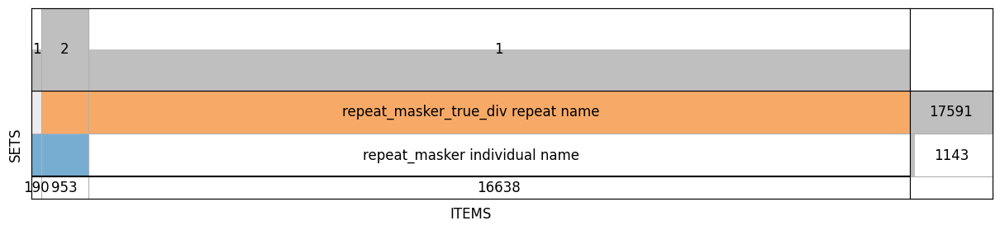

In [8]:
sets = [
    set(repeat_masker.individual_name.unique()),
    set(repeat_masker_true_div.repeat_name.unique()),
]
labels = ["repeat_masker individual name", "repeat_masker_true_div repeat name"]
fig = plt.figure(figsize=(15, 3))
supervenn(sets, labels)

In [12]:
repeat_masker[
    repeat_masker.individual_name.isin(
        set(repeat_masker.individual_name.unique())
        - set(repeat_masker_true_div.repeat_name.unique())
    )
]

,Unnamed: 0,"#""chrom""",chromStart,chromEnd,score,individual_name,family_name,class_name
0,0,chr1,0,7536,223,L1MC3,L1,LINE
7,7,chr1,10217,16335,223,L1M5,L1,LINE
9,9,chr1,11433,18315,164,L1MA4,L1,LINE
22,22,chr1,20459,26585,276,L1M5,L1,LINE
29,29,chr1,23992,34590,243,L1MD3,L1,LINE
...,...,...,...,...,...,...,...,...
3709392,3709392,chr22,51289252,51292542,270,L2a,L2,LINE
3709407,3709407,chr22,51300707,51304081,310,L2b,L2,LINE
3709411,3709411,chr22,51306669,51314638,219,L1MC3,L1,LINE
3709423,3709423,chr22,51315888,51323672,276,L1MC,L1,LINE


In [34]:
for i in list(
    set(repeat_masker_true_div.repeat_name.unique())
    - set(repeat_masker.individual_name.unique())
):
    if i[0] != "(":
        print(i)

L1MA3_3end
tRNA-Thr-ACG_
MSTD-int
LSAU
L1MC5a_3end
MARE9
tRNA-Ser-TCA_
CR1_Amni-1
L1MC4_5end
amalthea
L1PA17_3end
tRNA-Leu-TTA(m)
LTR12G
L1MEj_5end
MER41E-int
BSR
HERVK11
LTR7B0
L1MEg1_5end
LTR7d1
UCON66
U3
tRNA-Met_v
HUERS-P2
tRNA-Phe-TTY
COMP-subunit_ACRO_rnd-5_family-1624
tRNA-Glu-GAA
UCON17
cyllene
HSAT5v2
HSAT4
L1MB4_3end
L1MC1_3end
UCON68
tRNA-Gly-GGA
tRNA-Pro-CCA
L1ME1_3end
HSAT5v1
HERVS71
HERVIP10FH
LTR17b
L1MA5A_3end
LTR7a1
L1PBb_5end
L1PA4_3end
UCON87
L1PA7_3end
UCON92
MLT1O-int
tRNA-Ala-GCY_v
ERV24_Prim
L1MD2_3end
AluY_short_
HERV9NC
UCON25
HSAT5_
tRNA-Met-i
UCON41
tRNA-Ile-ATT
UCON28a
tRNA-Val-GTY
GSAT
sinpoe
tRNA-Pro-CCG
HERVK14
L1PBa_5end
L3b_3end
L1ME3A_3end
UCON96
ERVL
FLAM_C_short_
L1P4_orf2
tRNA-Ser-AGY
UCON101
U7
LTR7BC
HERVK14_C4
HERVK9B
L1MEf_5end
tRNA-Leu-TTA
ALRa
U2
HSAT5
L1PA16_3end
tRNA-Thr-ACA
U1
HERVK22
HERVH48
L1MB5_3end
L1M2_orf2
L1MC4_3end
MLT1I-int
ERV-Han_LTR
HERVK13
COMP-subunit_ACRO_rnd-5_family-38
BSRa
U14
COMP-subunit_TELO_rnd-6_family-10479
HERVIP10

In [11]:
set(repeat_masker.individual_name.unique()) - set(
    repeat_masker_true_div.repeat_name.unique()
)

{'Alu',
 'Alu-VAR_rnd-5_family-1084',
 'AluYi6_4d',
 'AluYj4',
 'AluYk2',
 'Charlie7b_Mars',
 'ERV24B_Prim-int',
 'ERV24_Prim-int',
 'ERVL-B4-int',
 'ERVL-E-int',
 'ERVL-int',
 'ERVL47-int',
 'HERV-Fc1-int',
 'HERV-Fc2-int',
 'HERV15-int',
 'HERV16-int',
 'HERV3-int',
 'HERV30-int',
 'HERV35I-int',
 'HERV9-int',
 'HERV9N-int',
 'HERV9NC-int',
 'HERVE-int',
 'HERVE_a-int',
 'HERVFH19-int',
 'HERVFH21-int',
 'HERVH-int',
 'HERVH48-int',
 'HERVI-int',
 'HERVIP10B3-int',
 'HERVIP10F-int',
 'HERVIP10FH-int',
 'HERVK-int',
 'HERVK11-int',
 'HERVK11D-int',
 'HERVK13-int',
 'HERVK14-int',
 'HERVK14C-int',
 'HERVK22-int',
 'HERVK3-int',
 'HERVK9-int',
 'HERVKC4-int',
 'HERVL-int',
 'HERVL18-int',
 'HERVL32-int',
 'HERVL40-int',
 'HERVL66-int',
 'HERVL74-int',
 'HERVP71A-int',
 'HERVS71-int',
 'HUERS-P1-int',
 'HUERS-P2-int',
 'HUERS-P3-int',
 'HUERS-P3b-int',
 'Harlequin-int',
 'L1HS',
 'L1M',
 'L1M1',
 'L1M2',
 'L1M2a',
 'L1M2a1',
 'L1M2b',
 'L1M2c',
 'L1M3',
 'L1M3a',
 'L1M3b',
 'L1M3c',
 'L1

In [9]:
repeat_masker_true_div

,Unnamed: 0,sw_score,perc_div,perc_del,perc_ins,chrom,chrom_start,chrom_end,chrom_left,strand,...,repeat_class_family,matrix,ts_tv_ratio,transitions,transversions,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted
0,0,2590,2.92,0.55,0.97,chr1,2,2705,(248384623),+,...,Simple_repeat,Unknown,0.62,29.0,47.0,0.01,1.08,NaN,NaN,NaN
1,1,5135,9.93,0.91,3.37,chr1,2710,3803,(248383525),C,...,Satellite/subtelomeric,20p47g.matrix,0.75,45.0,60.0,0.04,1.12,9.56,45.0,10.74
2,2,1555,16.86,1.94,2.80,chr1,3484,3843,(248383485),C,...,Satellite/subtelomeric,20p47g.matrix,2.11,40.0,19.0,0.04,1.13,16.51,40.0,19.76
3,3,1268,19.99,4.61,2.39,chr1,3542,3910,(248383418),C,...,Satellite/subtelomeric,20p47g.matrix,1.77,46.0,26.0,0.04,2.00,21.86,46.0,24.08
4,4,1196,20.77,4.63,2.95,chr1,3602,3968,(248383360),C,...,Satellite/subtelomeric,20p47g.matrix,1.39,43.0,31.0,0.04,2.15,22.03,43.0,25.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8650223,8650223,1011,4.73,5.06,5.06,chrM,2345,2522,(13899),+,...,rRNA,20p43g.matrix,1.67,5.0,3.0,0.08,1.29,4.03,5.0,5.26
8650224,8650224,650,5.13,0.00,0.00,chrM,2653,2730,(13839),+,...,tRNA,18p43g.matrix,3.00,3.0,1.0,0.00,0.00,5.35,3.0,5.35
8650225,8650225,465,13.89,0.00,0.00,chrM,3752,3823,(12746),C,...,tRNA,18p43g.matrix,9.00,9.0,1.0,0.00,0.00,14.35,9.0,16.02
8650226,8650226,432,13.43,1.49,0.00,chrM,6871,6937,(9632),C,...,tRNA,18p43g.matrix,8.00,8.0,1.0,0.02,1.00,15.39,8.0,15.39


In [19]:
repeat_masker_true_div[
    [
        "chrom",
        "chrom_start",
        "chrom_end",
        "sw_score",
        "perc_div",
        "perc_del",
        "perc_ins",
        "chrom_left",
        "strand",
        "rep_start",
        "rep_end",
        "rep_left",
        "align_id",
        "repeat_name",
        "repeat_class_family",
        "matrix",
        "ts_tv_ratio",
        "transitions",
        "transversions",
        "gap_init_rate",
        "avg_gap_size",
        "kimura_divCpGMod",
        "cpg_sites",
        "kimura_unadjusted",
    ]
].fillna(".").to_csv("repeat_masker_true_div.bed", sep="\t", header=False, index=False)

In [13]:
len(
    [
        "sw_score",
        "perc_div",
        "perc_del",
        "perc_ins",
        "chrom_left",
        "strand",
        "rep_start",
        "rep_end",
        "rep_left",
        "align_id",
        "repeat_name",
        "repeat_class_family",
        "matrix",
        "ts_tv_ratio",
        "transitions",
        "transversions",
        "gap_init_rate",
        "avg_gap_size",
        "kimura_divCpGMod",
        "cpg_sites",
        "kimura_unadjusted",
    ]
)

21

In [14]:
len("4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25".split(","))

22

In [17]:
",".join(["collapse" for i in range(0, 21)])

'collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse,collapse'

In [5]:
repeat_masker

,Unnamed: 0,"#""chrom""",chromStart,chromEnd,score,individual_name,family_name,class_name
0,0,chr1,0,7536,223,L1MC3,L1,LINE
1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR
2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR
3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR
4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR
...,...,...,...,...,...,...,...,...
3709424,3709424,chr22,51316429,51324176,211,L1MC,L1,LINE
3709425,3709425,chr22,51316699,51317699,149,MER72,ERV1,LTR
3709426,3709426,chr22,51316748,51317061,108,AluSq2,Alu,SINE
3709427,3709427,chr22,51319294,51320377,254,LTR60B,ERV1,LTR


### Mapped alignment data reading and analysis

In [19]:
repeat_masker_with_div

NameError: name 'repeat_masker_with_div' is not defined

In [3]:
repeat_masker_with_div = pd.read_csv(
    "T2T_repeat_masker_true_div_mapped.bed", sep="\t", header=None
)

In [8]:
repeat_masker_with_div.columns = [
    "chromosome",
    "start",
    "end",
    "score",
    "subfamily_name",
    "family_name",
    "class_name",
] + [
    "rep_chromosome",
    "rep_start",
    "rep_end",
    "sw_score",
    "perc_div",
    "perc_del",
    "perc_ins",
    "chrom_left",
    "strand",
    "rep_index1",
    "rep_index2",
    "rep_left",
    "align_id",
    "repeat_name",
    "repeat_class_family",
    "matrix",
    "ts_tv_ratio",
    "transitions",
    "transversions",
    "gap_init_rate",
    "avg_gap_size",
    "kimura_divCpGMod",
    "cpg_sites",
    "kimura_unadjusted",
]
repeat_masker_with_div

,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,rep_start,rep_end,...,repeat_class_family,matrix,ts_tv_ratio,transitions,transversions,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted
0,chr1,0,7536,223,L1MC3,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...","2,2710,3484,3542,3602,3663,4083,4534,4664,4998...","2705,3803,3843,3910,3968,4402,4533,4660,5139,5...",...,"Simple_repeat,Satellite/subtelomeric,Satellite...","Unknown,20p47g.matrix,20p47g.matrix,20p47g.mat...","0.62,0.75,2.11,1.77,1.39,1.24,1.98,1.0,0.98,1....","29.0,45.0,40.0,46.0,43.0,46.0,81.0,13.0,53.0,2...","47.0,60.0,19.0,26.0,31.0,37.0,41.0,13.0,54.0,1...","0.01,0.04,0.04,0.04,0.04,0.03,0.05,0.03,0.04,0...","1.08,1.12,1.13,2.0,2.15,2.33,2.77,2.5,1.42,2.3...",".,9.56,16.51,21.86,22.03,11.52,30.73,22.06,26....",".,45.0,40.0,46.0,43.0,46.0,81.0,13.0,53.0,23.0...",".,10.74,19.76,24.08,25.05,12.74,35.76,24.07,27..."
1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1","3663,4083,4534,4664","4402,4533,4660,5139",...,"Satellite/subtelomeric,LTR/ERV1,LTR/ERV1,LINE/L1","20p47g.matrix,20p47g.matrix,20p47g.matrix,20p4...","1.24,1.98,1.0,0.98","46.0,81.0,13.0,53.0","37.0,41.0,13.0,54.0","0.03,0.05,0.03,0.04","2.33,2.77,2.5,1.42","11.52,30.73,22.06,26.36","46.0,81.0,13.0,53.0","12.74,35.76,24.07,27.55"
2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1","3663,4083,4534,4664","4402,4533,4660,5139",...,"Satellite/subtelomeric,LTR/ERV1,LTR/ERV1,LINE/L1","20p47g.matrix,20p47g.matrix,20p47g.matrix,20p4...","1.24,1.98,1.0,0.98","46.0,81.0,13.0,53.0","37.0,41.0,13.0,54.0","0.03,0.05,0.03,0.04","2.33,2.77,2.5,1.42","11.52,30.73,22.06,26.36","46.0,81.0,13.0,53.0","12.74,35.76,24.07,27.55"
3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"chr1,chr1,chr1","5275,5529,5687","5528,5686,6131",...,"LTR/ERV1,LINE/L1,LTR/ERVL-MaLR","20p47g.matrix,20p47g.matrix,18p47g.matrix","3.11,1.29,2.42","28.0,22.0,46.0","9.0,17.0,19.0","0.02,0.04,0.03","1.4,1.0,2.13","16.85,29.4,13.51","28.0,159.0,46.0","16.85,30.43,17.06"
4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"chr1,chr1","5529,5687","5686,6131",...,"LINE/L1,LTR/ERVL-MaLR","20p47g.matrix,18p47g.matrix","1.29,2.42","22.0,46.0","17.0,19.0","0.04,0.03","1.0,2.13","29.4,13.51","159.0,46.0","30.43,17.06"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3709424,chrY,62443446,62449578,84,L1P1,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY","62442892,62443469,62444838,62445989,62447049,6...","62443483,62444835,62445192,62446130,62447080,6...",...,"LINE/L1,LINE/L1,Simple_repeat,LINE/L2,Simple_r...","20p49g.matrix,20p49g.matrix,Unknown,25p49g.mat...","1.53,1.74,1.62,2.0,0.33,0.33,1.0,1.67,2.6","81.0,73.0,13.0,32.0,1.0,1.0,2.0,15.0,13.0","53.0,42.0,8.0,16.0,3.0,3.0,2.0,9.0,5.0","0.03,0.0,0.03,0.04,0.0,0.03,0.03,0.03,0.03","2.0,6.5,1.0,3.5,0.0,1.0,1.0,1.33,1.5","26.66,6.87,.,41.04,.,.,.,30.14,26.46","81.0,73.0,.,32.0,.,.,.,15.0,13.0","28.14,9.06,.,47.82,.,.,.,33.49,28.3"
3709425,chrY,62445666,62449071,338,L2a,L2,LINE,"chrY,chrY,chrY,chrY,chrY,chrY","62445989,62447049,62447967,62447969,62448441,6...","62446130,62447080,62448002,62447998,62448531,6...",...,"LINE/L2,Simple_repeat,Simple_repeat,Simple_rep...","25p49g.matrix,Unknown,Unknown,Unknown,25p49g.m...","2.0,0.33,0.33,1.0,1.67,2.6","32.0,1.0,1.0,2.0,15.0,13.0","16.0,3.0,3.0,2.0,9.0,5.0","0.04,0.0,0.03,0.03,0.03,0.03","3.5,0.0,1.0,1.0,1.33,1.5","41.04,.,.,.,30.14,26.46","32.0,.,.,.,15.0,13.0","47.82,.,.,.,33.49,28.3"
3709426,chrY,62446656,62452812,204,L1MC5a,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY","62447049,62447967,62447969,62448441,62448451,6...","62447080,62448002,62447998,62448531,62448530,6...",...,"Simple_repeat,Simple_repeat,Simple_repeat,SINE...","Unknown,Unknown,Unknown,25p49g.matrix,25p49g.m...","0.33,0.33,1.0,1.67,2.6,1.14,3.0,1.44,0.67,0.91","1.0,1.0,2.0,15.0,13.0,16.0,24.0,26.0,26.0,59.0","3.0,3.0,2.0,9.0,5.0,14.0,8.0,18.0,39.0,65.0","0.0,0.03,0.03,0.03,0.03,0.02,0.08,

In [18]:
repeat_masker_with_div[
    [
        "chromosome",
        "start",
        "end",
        "score",
        "subfamily_name",
        "family_name",
        "class_name",
        "rep_start",
        "rep_end",
        "repeat_name",
        "repeat_class_family",
        "kimura_divCpGMod",
        "cpg_sites",
        "kimura_unadjusted",
    ]
]

,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_start,rep_end,repeat_name,repeat_class_family,kimura_divCpGMod,cpg_sites,kimura_unadjusted
0,chr1,0,7536,223,L1MC3,L1,LINE,"2,2710,3484,3542,3602,3663,4083,4534,4664,4998...","2705,3803,3843,3910,3968,4402,4533,4660,5139,5...","(ACCCTA)n,TAR1,TAR1,TAR1,TAR1,TAR1,LTR60B,LTR6...","Simple_repeat,Satellite/subtelomeric,Satellite...",".,9.56,16.51,21.86,22.03,11.52,30.73,22.06,26....",".,45.0,40.0,46.0,43.0,46.0,81.0,13.0,53.0,23.0...",".,10.74,19.76,24.08,25.05,12.74,35.76,24.07,27..."
1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"3663,4083,4534,4664","4402,4533,4660,5139","TAR1,LTR60B,LTR60B,L1MC_orf2","Satellite/subtelomeric,LTR/ERV1,LTR/ERV1,LINE/L1","11.52,30.73,22.06,26.36","46.0,81.0,13.0,53.0","12.74,35.76,24.07,27.55"
2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"3663,4083,4534,4664","4402,4533,4660,5139","TAR1,LTR60B,LTR60B,L1MC_orf2","Satellite/subtelomeric,LTR/ERV1,LTR/ERV1,LINE/L1","11.52,30.73,22.06,26.36","46.0,81.0,13.0,53.0","12.74,35.76,24.07,27.55"
3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"5275,5529,5687","5528,5686,6131","MER34C_v,L1MC3_3end,MSTA1","LTR/ERV1,LINE/L1,LTR/ERVL-MaLR","16.85,29.4,13.51","28.0,159.0,46.0","16.85,30.43,17.06"
4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"5529,5687","5686,6131","L1MC3_3end,MSTA1","LINE/L1,LTR/ERVL-MaLR","29.4,13.51","159.0,46.0","30.43,17.06"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3709424,chrY,62443446,62449578,84,L1P1,L1,LINE,"62442892,62443469,62444838,62445989,62447049,6...","62443483,62444835,62445192,62446130,62447080,6...","L1MC_orf2,L1P1_5end,(GGGTCA)n,L2a_3end,(CAC)n,...","LINE/L1,LINE/L1,Simple_repeat,LINE/L2,Simple_r...","26.66,6.87,.,41.04,.,.,.,30.14,26.46","81.0,73.0,.,32.0,.,.,.,15.0,13.0","28.14,9.06,.,47.82,.,.,.,33.49,28.3"
3709425,chrY,62445666,62449071,338,L2a,L2,LINE,"62445989,62447049,62447967,62447969,62448441,6...","62446130,62447080,62448002,62447998,62448531,6...","L2a_3end,(CAC)n,(GGAGAA)n,(AGA)n,MIRb,MIR3","LINE/L2,Simple_repeat,Simple_repeat,Simple_rep...","41.04,.,.,.,30.14,26.46","32.0,.,.,.,15.0,13.0","47.82,.,.,.,33.49,28.3"
3709426,chrY,62446656,62452812,204,L1MC5a,L1,LINE,"62447049,62447967,62447969,62448441,62448451,6...","62447080,62448002,62447998,62448531,62448530,6...","(CAC)n,(GGAGAA)n,(AGA)n,MIRb,MIR3,MER5B,L1MC5a...","Simple_repeat,Simple_repeat,Simple_repeat,SINE...",".,.,.,30.14,26.46,38.51,23.11,39.28,7.42,11.03",".,.,.,15.0,13.0,16.0,24.0,26.0,26.0,59.0",".,.,.,33.49,28.3,38.51,23.11,40.48,8.72,13.91"
3709427,chrY,62448384,62448649,230,MIR3,MIR,SINE,"62448441,62448451","62448531,62448530","MIRb,MIR3","SINE/MIR,SINE/MIR","30.14,26.46","15.0,13.0","33.49,28.3"


In [16]:
def filter_te_alignment_hits(df):
    """
    Filters comma-separated alignment hit columns to only include entries
    where the hit's 'repeat_name' matches the row's 'subfamily_name',
    allowing for independent sets of postfixes to be stripped from both.
    """

    # Specified columns containing comma-separated series
    cols_to_filter = [
        "sw_score",
        "perc_div",
        "perc_del",
        "perc_ins",
        "chrom_left",
        "strand",
        "rep_start",
        "rep_end",
        "rep_left",
        "align_id",
        "repeat_name",
        "repeat_class_family",
        "matrix",
        "ts_tv_ratio",
        "transitions",
        "transversions",
        "gap_init_rate",
        "avg_gap_size",
        "kimura_divCpGMod",
        "cpg_sites",
        "kimura_unadjusted",
    ]

    # Independent sets of postfixes to strip for comparison purposes
    hit_postfixes = ["_5end", "_3end", "-int", "_orf2", "_short_", "_"]
    subfam_postfixes = ["-int"]  # Example independent variants for subfamily names

    def filter_row(row):
        # 1. Clean the target subfamily name from the subfamily_name column
        raw_target = str(row["subfamily_name"])
        clean_target = raw_target
        for pf in subfam_postfixes:
            if raw_target.endswith(pf):
                clean_target = raw_target[: -len(pf)]
                break

        # 2. Extract and prepare the hit names list
        hit_names = str(row["repeat_name"]).split(",")

        # 3. Identify indices where the cleaned hit name matches the cleaned target
        match_idx = []
        for i, name in enumerate(hit_names):
            # Clean the hit name
            clean_hit = name
            for pf in hit_postfixes:
                if name.endswith(pf):
                    clean_hit = name[: -len(pf)]
                    break

            # Compare the two cleaned versions
            if clean_hit == clean_target:
                match_idx.append(i)

        if not match_idx:
            # If no hits match, return None/Empty for those columns
            for col in cols_to_filter:
                row[col] = None
            return row

        # 4. Synchronize all specified columns based on matching indices
        for col in cols_to_filter:
            all_vals = str(row[col]).split(",")
            # Filter the list and join back into a comma-separated string
            filtered_list = [all_vals[i] for i in match_idx if i < len(all_vals)]
            row[col] = ",".join(filtered_list)

        return row

    # Apply the filtering logic across the dataframe
    return df.apply(filter_row, axis=1)

In [17]:
repeat_masker_with_div_filtered_short = filter_te_alignment_hits(
    repeat_masker_with_div[:100000]
)

In [20]:
repeat_masker_with_div_filtered = filter_te_alignment_hits(repeat_masker_with_div)

In [22]:
repeat_masker_with_div_filtered.to_csv("repeat_masker_with_div_filtered.csv")

In [3]:
repeat_masker_with_div_filtered = pd.read_csv("repeat_masker_with_div_filtered.csv")
repeat_masker_with_div_filtered

,Unnamed: 0,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,rep_start,...,repeat_class_family,matrix,ts_tv_ratio,transitions,transversions,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted
0,0,chr1,0,7536,223,L1MC3,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...","4998,5529,6132,7142",...,"LINE/L1,LINE/L1,LINE/L1,LINE/L1","20p47g.matrix,20p47g.matrix,20p47g.matrix,20p4...","1.35,1.29,1.28,1.24","23.0,22.0,137.0,41.0","17.0,17.0,107.0,33.0","0.07,0.04,0.03,0.09","2.33,1.0,2.96,1.33","17.61,29.4,29.4,23.5","23.0,159.0,159.0,41.0","17.61,30.43,30.43,24.22"
1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1","4083,4534",...,"LTR/ERV1,LTR/ERV1","20p47g.matrix,20p47g.matrix","1.98,1.0","81.0,13.0","41.0,13.0","0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07"
2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1","4083,4534",...,"LTR/ERV1,LTR/ERV1","20p47g.matrix,20p47g.matrix","1.98,1.0","81.0,13.0","41.0,13.0","0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07"
3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"chr1,chr1,chr1",5275,...,LTR/ERV1,20p47g.matrix,3.11,28.0,9.0,0.02,1.4,16.85,28.0,16.85
4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"chr1,chr1",5687,...,LTR/ERVL-MaLR,18p47g.matrix,2.42,46.0,19.0,0.03,2.13,13.51,46.0,17.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3709424,3709424,chrY,62443446,62449578,84,L1P1,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",62443469,...,LINE/L1,20p49g.matrix,1.74,73.0,42.0,0.0,6.5,6.87,73.0,9.06
3709425,3709425,chrY,62445666,62449071,338,L2a,L2,LINE,"chrY,chrY,chrY,chrY,chrY,chrY",62445989,...,LINE/L2,25p49g.matrix,2.0,32.0,16.0,0.04,3.5,41.04,32.0,47.82
3709426,3709426,chrY,62446656,62452812,204,L1MC5a,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",62452109,...,LINE/L1,20p49g.matrix,3.0,24.0,8.0,0.08,2.77,23.11,24.0,23.11
3709427,3709427,chrY,62448384,62448649,230,MIR3,MIR,SINE,"chrY,chrY",62448451,...,SINE/MIR,25p49g.matrix,2.6,13.0,5.0,0.03,1.5,26.46,13.0,28.3


In [21]:
repeat_masker_with_div_filtered[repeat_masker_with_div_filtered.rep_start.isna()][
    [
        "chromosome",
        "start",
        "end",
        "score",
        "subfamily_name",
        "family_name",
        "class_name",
        "rep_chromosome",
        "rep_start",
        "rep_end",
        "repeat_name",
        "repeat_class_family",
        "kimura_divCpGMod",
        "cpg_sites",
        "kimura_unadjusted",
    ]
]

,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,rep_start,rep_end,repeat_name,repeat_class_family,kimura_divCpGMod,cpg_sites,kimura_unadjusted
7,chr1,10217,16335,223,L1M5,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...",None,None,None,None,None,None,None
22,chr1,20459,26585,276,L1M5,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...",None,None,None,None,None,None,None
25,chr1,21728,22068,195,MER46C,TcMar-Tigger,DNA,"chr1,chr1",None,None,None,None,None,None,None
40,chr1,41539,42136,279,MLT1K,ERVL-MaLR,LTR,chr1,None,None,None,None,None,None,None
62,chr1,52100,52412,74,Alu,Alu,SINE,"chr1,chr1,chr1,chr1",None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3709347,chrY,62381059,62381524,39,LTR7B,ERV1,LTR,"chrY,chrY",None,None,None,None,None,None,None
3709370,chrY,62403010,62412239,50,HERVK14-int,ERVK,LTR,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,c...",None,None,None,None,None,None,None
3709402,chrY,62423707,62427086,303,L2c,L2,LINE,"chrY,chrY,chrY,chrY,chrY",None,None,None,None,None,None,None
3709408,chrY,62430753,62430979,270,MIR1_Amn,MIR,SINE,.,None,None,None,None,None,None,None


In [19]:
for index in repeat_masker_with_div[:100000][
    repeat_masker_with_div_filtered_short.rep_start.isna()
].index[:100]:
    print(
        repeat_masker_with_div[:100000]["subfamily_name"][index],
        repeat_masker_with_div[:100000]["repeat_name"][index],
    )

L1M5 MLT1I,L1ME4a_3end,MLT1H,MLT1H2,MLT1H,(CTGT)n,AluY,MER4D1,MER4C,MER4A,MER4CL34,PRIMA4_LTR,MER4D1,MIRb,(CCT)n,(CACA)n,MER31A,MER31B,MER31B,AluJb,L1M2_orf2
L1M5 L1ME4a_3end,Ricksha_0,Ricksha_0,MIRb,MIR3,Tigger4b,Charlie20a,(TACACACTCA)n,Charlie20a,AluSg,(A)n,L1MD3_3end,L1MD3_3end
MER46C MIR3,Tigger4b
MLT1K LTR9B
Alu AluJb,MSTA,AluSx,(GT)n
L1P4 L1M5_orf2,L1MA8_3end,L1MA2_3end,L1MA8_3end,L1M2_orf2,LTR22C2,L1PA15-16_5end,L1PA10_3end,DNM1r,DNM1r,AluSq2,DNM1r,DNM1r,DNM1r,L1PA8A_3end
L1M5 L1MA8_3end,L1MA2_3end,L1MA8_3end,L1M2_orf2,LTR22C2,L1PA15-16_5end,L1PA10_3end,DNM1r,DNM1r,AluSq2,DNM1r,DNM1r,DNM1r,L1PA8A_3end,L1PA10_3end,L1PA10_3end,L1PA8_3end,L1PA10_3end,L1PA10_3end,L1PA10_3end,L1PA13_3end,L1PA10_3end
L2c MIRc,MIRb,L1MA4_3end,L1MA4_3end,(AAAT)n,MIRb,AluSz,(GA)n,(AATG)n
L2a THE1-int,THE1B,MLT1H1,MLT1F-int,MLT1H-int,MLT1F-int,MLT1H-int,LTR64,L1PA14_3end,AluSx
AluYk2 AluY
L1M2c (AACTGT)n,L2a_3end,L2,L2c_3end,AluJb,L1M1_5end,L1MA5_3end,L1M4_5end,L2a_3end,AluSz,L2a_3end,AluSq2,L2a_3end,Alu

In [ ]:
repeat_masker_with_div[repeat_masker_with_div_filtered.rep_start.isna()][[]]

### Mapped alignment hits averaging

In [4]:
def calculate_weighted_averages(df):
    """
    Calculates weighted averages for numeric columns using hit length as weight.
    Length is calculated as abs(rep_end - rep_start).
    """

    # Columns expected to contain numeric data or "."
    numeric_cols = [
        "sw_score",
        "perc_div",
        "perc_del",
        "perc_ins",
        "ts_tv_ratio",
        "transitions",
        "transversions",
        "gap_init_rate",
        "avg_gap_size",
        "kimura_divCpGMod",
        "cpg_sites",
        "kimura_unadjusted",
    ]

    def process_weighted_avg(row):
        # 1. Calculate Weights (Length of each hit)
        try:
            starts = [
                float(x) if x != "." else np.nan
                for x in str(row["rep_start"]).split(",")
            ]
            ends = [
                float(x) if x != "." else np.nan for x in str(row["rep_end"]).split(",")
            ]

            # Weight = |end - start|
            weights = np.abs(np.array(ends) - np.array(starts))
        except (ValueError, TypeError):
            # If coordinates are missing or malformed, return row as is
            return row

        # 2. Iterate through each numeric column to calculate the average
        for col in numeric_cols:
            if col not in row or row[col] is None or str(row[col]) == "None":
                row[f"{col}_weighted_average"] = np.nan
                continue

            try:
                # Convert comma string to numeric array, treating "." as NaN
                vals = np.array(
                    [float(x) if x != "." else np.nan for x in str(row[col]).split(",")]
                )

                # Mask out NaNs from both values and weights
                mask = ~np.isnan(vals) & ~np.isnan(weights)

                valid_vals = vals[mask]
                valid_weights = weights[mask]

                if len(valid_vals) > 0 and np.sum(valid_weights) > 0:
                    weighted_avg = np.average(valid_vals, weights=valid_weights)
                    row[f"{col}_weighted_average"] = weighted_avg
                else:
                    row[f"{col}_weighted_average"] = np.nan
            except (ValueError, ZeroDivisionError):
                row[f"{col}_weighted_average"] = np.nan

        return row

    # Apply calculations row-wise
    return df.apply(process_weighted_avg, axis=1)

In [6]:
repeat_masker_with_div_filtered.columns

Index(['Unnamed: 0', 'chromosome', 'start', 'end', 'score', 'subfamily_name',
       'family_name', 'class_name', 'rep_chromosome', 'rep_start', 'rep_end',
       'sw_score', 'perc_div', 'perc_del', 'perc_ins', 'chrom_left', 'strand',
       'rep_index1', 'rep_index2', 'rep_left', 'align_id', 'repeat_name',
       'repeat_class_family', 'matrix', 'ts_tv_ratio', 'transitions',
       'transversions', 'gap_init_rate', 'avg_gap_size', 'kimura_divCpGMod',
       'cpg_sites', 'kimura_unadjusted'],
      dtype='object')

In [ ]:
repeat_masker_with_div_filtered_average_short = calculate_weighted_averages(
    repeat_masker_with_div_filtered[:100000]
)

In [13]:
repeat_masker_with_div_filtered_average_short

,Unnamed: 0,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,rep_start,...,perc_del_weighted_average,perc_ins_weighted_average,ts_tv_ratio_weighted_average,transitions_weighted_average,transversions_weighted_average,gap_init_rate_weighted_average,avg_gap_size_weighted_average,kimura_divCpGMod_weighted_average,cpg_sites_weighted_average,kimura_unadjusted_weighted_average
0,0,chr1,0,7536,223,L1MC3,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...","4998,5529,6132,7142",...,7.203839,2.51690,1.282471,89.674573,70.092113,0.049653,2.346652,26.404275,113.672918,27.216867
1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1","4083,4534",...,11.424687,0.78125,1.765625,66.125000,34.875000,0.045625,2.710938,28.833438,66.125000,33.202813
2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1","4083,4534",...,11.424687,0.78125,1.765625,66.125000,34.875000,0.045625,2.710938,28.833438,66.125000,33.202813
3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"chr1,chr1,chr1",5275,...,1.970000,0.78000,3.110000,28.000000,9.000000,0.020000,1.400000,16.850000,28.000000,16.850000
4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"chr1,chr1",5687,...,5.840000,1.29000,2.420000,46.000000,19.000000,0.030000,2.130000,13.510000,46.000000,17.060000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,chr1,59443552,59444118,318,MIR,MIR,SINE,"chr1,chr1,chr1","59443627,59444041",...,1.120000,5.23000,1.848409,19.250000,10.295455,0.060682,1.000000,41.440000,35.000000,43.760000
99996,99996,chr1,59443726,59444040,82,AluY,Alu,SINE,"chr1,chr1",59443744,...,0.000000,1.02000,2.000000,16.000000,8.000000,0.010000,1.000000,5.290000,16.000000,8.710000
99997,99997,chr1,59443743,59447335,290,L2c,L2,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1",59447085,...,15.550000,2.61000,1.670000,45.000000,27.000000,0.070000,2.590000,40.290000,45.000000,42.750000
99998,99998,chr1,59443996,59452084,196,L1MC4,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...",59451435,...,6.450000,3.34000,1.570000,47.000000,30.000000,0.060000,1.770000,19.470000,47.000000,20.320000


#### python code

In [ ]:
import os
import re

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from scipy import stats
from supervenn import supervenn
from tqdm import tqdm


def calculate_weighted_averages(df):
    """
    Calculates weighted averages for numeric columns using hit length as weight.
    Length is calculated as abs(rep_end - rep_start).
    """

    # Columns expected to contain numeric data or "."
    numeric_cols = [
        # "sw_score",
        "perc_div",
        # "perc_del",
        # "perc_ins",
        "ts_tv_ratio",
        # "transitions",
        # "transversions",
        # "gap_init_rate",
        # "avg_gap_size",
        "kimura_divCpGMod",
        # "cpg_sites",
        "kimura_unadjusted",
    ]

    def process_weighted_avg(row):
        # 1. Calculate Weights (Length of each hit)
        try:
            starts = [
                float(x) if x != "." else np.nan
                for x in str(row["rep_start"]).split(",")
            ]
            ends = [
                float(x) if x != "." else np.nan for x in str(row["rep_end"]).split(",")
            ]

            # Weight = |end - start|
            weights = np.abs(np.array(ends) - np.array(starts))
        except (ValueError, TypeError):
            # If coordinates are missing or malformed, return row as is
            return row

        # 2. Iterate through each numeric column to calculate the average
        for col in numeric_cols:
            if col not in row or row[col] is None or str(row[col]) == "None":
                row[f"{col}_weighted_average"] = np.nan
                continue

            try:
                # Convert comma string to numeric array, treating "." as NaN
                vals = np.array(
                    [float(x) if x != "." else np.nan for x in str(row[col]).split(",")]
                )

                # Mask out NaNs from both values and weights
                mask = ~np.isnan(vals) & ~np.isnan(weights)

                valid_vals = vals[mask]
                valid_weights = weights[mask]

                if len(valid_vals) > 0 and np.sum(valid_weights) > 0:
                    weighted_avg = np.average(valid_vals, weights=valid_weights)
                    row[f"{col}_weighted_average"] = weighted_avg
                else:
                    row[f"{col}_weighted_average"] = np.nan
            except (ValueError, ZeroDivisionError):
                row[f"{col}_weighted_average"] = np.nan

        return row

    # Apply calculations row-wise
    return df.apply(process_weighted_avg, axis=1)


repeat_masker_with_div_filtered = pd.read_csv("repeat_masker_with_div_filtered.csv")
repeat_masker_with_div_filtered_average = calculate_weighted_averages(
    repeat_masker_with_div_filtered
)
repeat_masker_with_div_filtered_average.to_csv(
    "repeat_masker_with_div_filtered_average.csv"
)

In [14]:
repeat_masker_with_div_filtered_average_short

,Unnamed: 0,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,rep_start,...,perc_del_weighted_average,perc_ins_weighted_average,ts_tv_ratio_weighted_average,transitions_weighted_average,transversions_weighted_average,gap_init_rate_weighted_average,avg_gap_size_weighted_average,kimura_divCpGMod_weighted_average,cpg_sites_weighted_average,kimura_unadjusted_weighted_average
0,0,chr1,0,7536,223,L1MC3,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...","4998,5529,6132,7142",...,7.203839,2.51690,1.282471,89.674573,70.092113,0.049653,2.346652,26.404275,113.672918,27.216867
1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1","4083,4534",...,11.424687,0.78125,1.765625,66.125000,34.875000,0.045625,2.710938,28.833438,66.125000,33.202813
2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1","4083,4534",...,11.424687,0.78125,1.765625,66.125000,34.875000,0.045625,2.710938,28.833438,66.125000,33.202813
3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"chr1,chr1,chr1",5275,...,1.970000,0.78000,3.110000,28.000000,9.000000,0.020000,1.400000,16.850000,28.000000,16.850000
4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"chr1,chr1",5687,...,5.840000,1.29000,2.420000,46.000000,19.000000,0.030000,2.130000,13.510000,46.000000,17.060000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,chr1,59443552,59444118,318,MIR,MIR,SINE,"chr1,chr1,chr1","59443627,59444041",...,1.120000,5.23000,1.848409,19.250000,10.295455,0.060682,1.000000,41.440000,35.000000,43.760000
99996,99996,chr1,59443726,59444040,82,AluY,Alu,SINE,"chr1,chr1",59443744,...,0.000000,1.02000,2.000000,16.000000,8.000000,0.010000,1.000000,5.290000,16.000000,8.710000
99997,99997,chr1,59443743,59447335,290,L2c,L2,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1",59447085,...,15.550000,2.61000,1.670000,45.000000,27.000000,0.070000,2.590000,40.290000,45.000000,42.750000
99998,99998,chr1,59443996,59452084,196,L1MC4,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...",59451435,...,6.450000,3.34000,1.570000,47.000000,30.000000,0.060000,1.770000,19.470000,47.000000,20.320000


## Divergence analysis with true Kimura scores

In [16]:
repeat_masker_with_div_filtered_average_short.columns

Index(['Unnamed: 0', 'chromosome', 'start', 'end', 'score', 'subfamily_name',
       'family_name', 'class_name', 'rep_chromosome', 'rep_start', 'rep_end',
       'sw_score', 'perc_div', 'perc_del', 'perc_ins', 'chrom_left', 'strand',
       'rep_index1', 'rep_index2', 'rep_left', 'align_id', 'repeat_name',
       'repeat_class_family', 'matrix', 'ts_tv_ratio', 'transitions',
       'transversions', 'gap_init_rate', 'avg_gap_size', 'kimura_divCpGMod',
       'cpg_sites', 'kimura_unadjusted', 'sw_score_weighted_average',
       'perc_div_weighted_average', 'perc_del_weighted_average',
       'perc_ins_weighted_average', 'ts_tv_ratio_weighted_average',
       'transitions_weighted_average', 'transversions_weighted_average',
       'gap_init_rate_weighted_average', 'avg_gap_size_weighted_average',
       'kimura_divCpGMod_weighted_average', 'cpg_sites_weighted_average',
       'kimura_unadjusted_weighted_average'],
      dtype='object')

In [31]:
repeat_masker_average_true_div.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'chromosome', 'start', 'end', 'score',
       'subfamily_name', 'family_name', 'class_name', 'rep_chromosome',
       'rep_start', 'rep_end', 'sw_score', 'perc_div', 'perc_del', 'perc_ins',
       'chrom_left', 'strand', 'rep_index1', 'rep_index2', 'rep_left',
       'align_id', 'repeat_name', 'repeat_class_family', 'matrix',
       'ts_tv_ratio', 'transitions', 'transversions', 'gap_init_rate',
       'avg_gap_size', 'kimura_divCpGMod', 'cpg_sites', 'kimura_unadjusted',
       'perc_div_weighted_average', 'ts_tv_ratio_weighted_average',
       'kimura_divCpGMod_weighted_average',
       'kimura_unadjusted_weighted_average', 'length'],
      dtype='object')

In [34]:
# --- 1. Global Parameters ---
GLOBAL_FONT_SIZE = 10
DOT_SIZE = 4.5  # Customizable dot size
DOT_ALPHA = 0.05  # Transparency to handle overplotting
PLOT_HEIGHT = 2  # Height of each facet

numeric_cols = [
    "score",
    "perc_div_weighted_average",
    "ts_tv_ratio_weighted_average",
    "kimura_divCpGMod_weighted_average",
    "kimura_unadjusted_weighted_average",
]

# --- 3. Visualization with PairGrid ---

# Initialize the Grid
# We define hue here so the lower facets can access class colors
g = sns.PairGrid(
    data=repeat_masker_average_true_div,
    vars=numeric_cols,
    hue="class_name",
    palette=class_names_p,
    height=PLOT_HEIGHT,
)

# A) Lower Facets: Scatter plot with hue
g.map_lower(sns.scatterplot, alpha=DOT_ALPHA, s=DOT_SIZE, edgecolor="none")

# B) Upper Facets: 2D Histogram of all classes combined (no hue)
# We pass hue=None to override the Grid's default hue mapping
g.map_upper(sns.histplot, hue=None, color="#555555", alpha=1, bins=100)

# C) Diagonal Facets: 1D Histogram of all classes combined (no hue)
g.map_diag(
    sns.histplot,
    hue=None,
    # color='#555555',
    alpha=1,
    bins=25,
)

# Add the legend manually since we switched to PairGrid
g.add_legend(title="TE Class")

# --- 4. Customizing Font Sizes (Unifying all text blocks) ---

# Update labels and ticks for every subplot
for ax in g.axes.flatten():
    if ax is not None:
        # Axis labels
        ax.xaxis.label.set_size(GLOBAL_FONT_SIZE)
        ax.yaxis.label.set_size(GLOBAL_FONT_SIZE)
        # Tick labels
        ax.tick_params(labelsize=GLOBAL_FONT_SIZE)

# Update Legend font size
if g.legend:
    plt.setp(g.legend.get_texts(), fontsize=GLOBAL_FONT_SIZE)
    plt.setp(g.legend.get_title(), fontsize=GLOBAL_FONT_SIZE, fontweight="bold")

# Add a figure-level title
g.fig.suptitle(
    "TE Divergence Metrics: Combined Distributions (Upper/Diag) vs. Class-Specific Correlations (Lower)",
    y=1.02,
    fontsize=GLOBAL_FONT_SIZE,
    fontweight="bold",
)

# --- 5. Saving as PNG ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/TE_divergence_pairplot_all.png"
save_path_svg = "plots/TE_divergence_pairplot_all.svg"

g.fig.savefig(
    save_path,
    format="png",
    dpi=300,
    bbox_inches="tight",
    transparent=False,
    facecolor="white",
)
# save_path = "./plots/average_divergence_vs_evol_age_TE_individuals.svg"
g.fig.savefig(save_path_svg, format="svg", transparent=True)

plt.show()

print(f"Success: Refactored mixed-mode pairplot saved to {save_path}")

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)

KeyboardInterr

Error in callback <function _draw_all_if_interactive at 0x7efe35ec3b50> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7efc1aa3c790> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



In [34]:
g.fig.savefig(save_path_svg, format="svg", transparent=True)

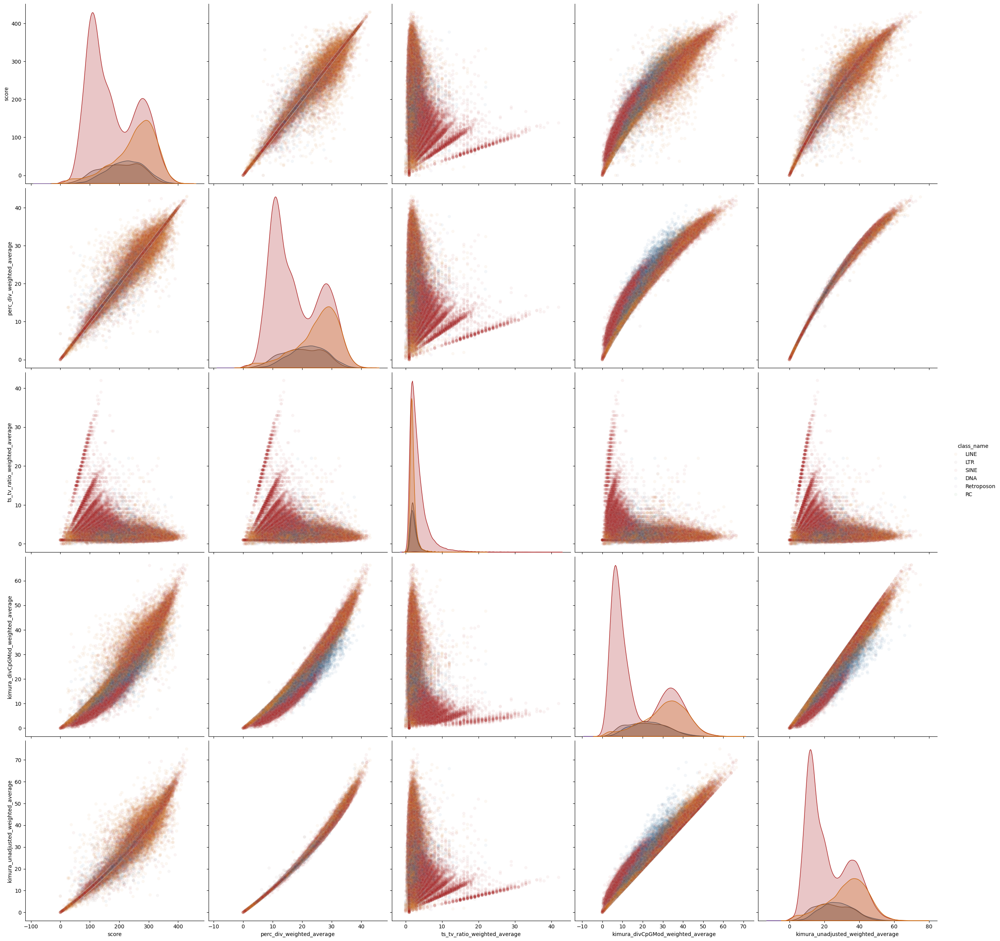

In [23]:
sns.pairplot(
    data=repeat_masker_with_div_filtered_average_short[
        [
            "score",
            "perc_div_weighted_average",
            "ts_tv_ratio_weighted_average",
            "kimura_divCpGMod_weighted_average",
            "kimura_unadjusted_weighted_average",
            "class_name",
        ]
    ],
    hue="class_name",
    height=5,
    plot_kws={"alpha": 0.05},
    palette=class_names_p,
)

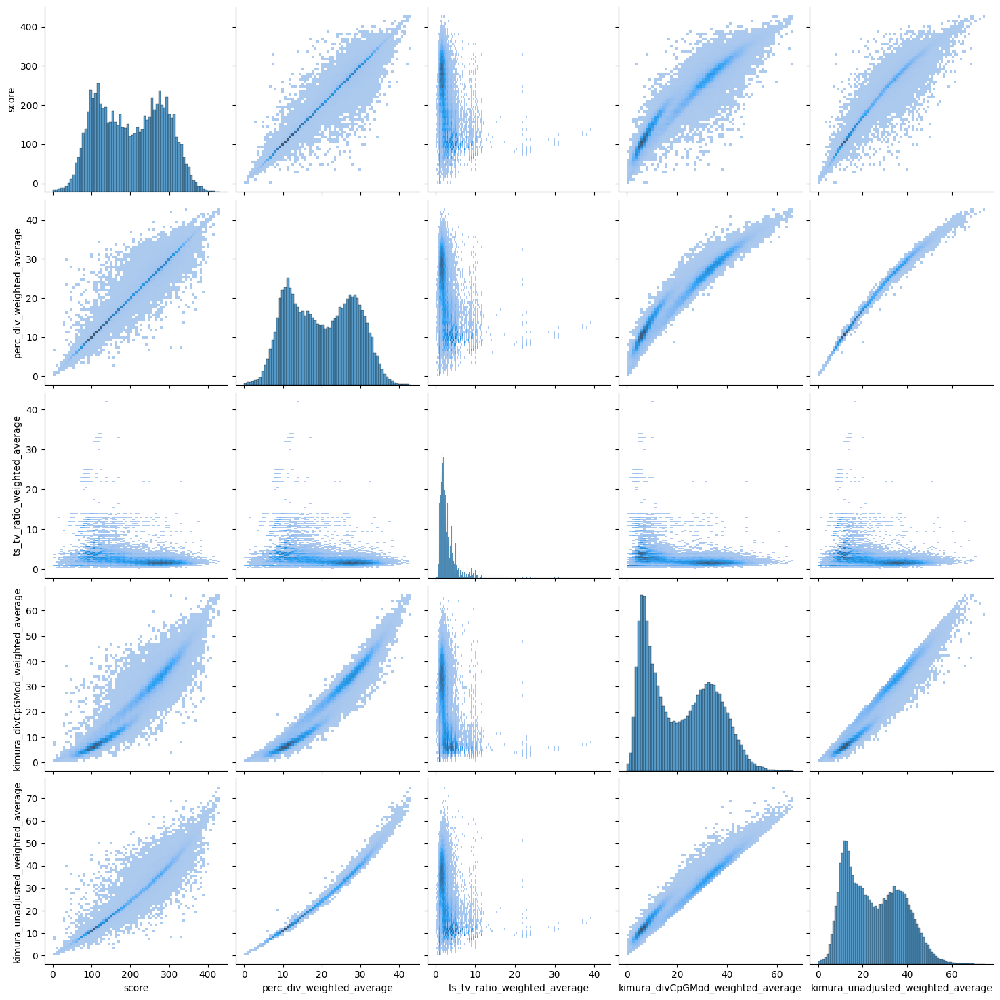

In [27]:
sns.pairplot(
    data=repeat_masker_with_div_filtered_average_short[
        [
            "score",
            "perc_div_weighted_average",
            "ts_tv_ratio_weighted_average",
            "kimura_divCpGMod_weighted_average",
            "kimura_unadjusted_weighted_average",
            "class_name",
        ]
    ],
    # hue="class_name",
    height=3,
    plot_kws={"alpha": 1},
    # palette = class_names_p,
    kind="hist",
)

The "ts to tv ratio" (transition to transversion ratio) in RepeatMasker alignment results is not typically a single fixed value reported in the file header. Instead, it is a metric derived from the individual substitutions observed within each sequence alignment, used primarily to calculate the Kimura 2-parameter (K2P) distance.1. Definition and Calculation in RepeatMaskerIn the context of RepeatMasker .align files (such as the hs1/T2T-CHM13 results), the ratio represents the frequency of transitions (mutations within the same chemical class: $A \leftrightarrow G$ or $C \leftrightarrow T$) compared to transversions (mutations between purines and pyrimidines).Because transitions occur more frequently in biological sequences—often due to the methylation and subsequent deamination of CpG dinucleotides—this ratio is essential for estimating the "age" of a transposable element. RepeatMasker utility scripts, such as calcDivergenceFromAlign.pl, iterate through the .align file to count these specific mutation types for every repeat fragment.2. Role in Kimura DivergenceThe transition ($p$) and transversion ($q$) rates calculated from these alignments are used to generate the Kimura distance ($K$), which adjusts for the fact that multiple mutations may have occurred at the same site over long evolutionary periods. The formula used by RepeatMasker's utility scripts is:
$$K = -1/2 \ln(1 - 2p - q) - 1/4 \ln(1 - 2q)$$
where $p$ is the proportion of sites with transitions and $q$ is the proportion of sites with transversions.3. Observed Ratios in Human (hs1) DataWhile the ratio varies by the age and type of the transposable element, studies of the human genome (including the T2T-CHM13/hs1 assembly) report the following standard benchmarks:Whole Genome Variants: For the T2T-CHM13 (hs1) reference, the observed Ts/Tv ratio for variant sites is approximately 1.50.Benchmarking Sets: High-confidence benchmarking sets for human somatic and germline variants often display a Ts/Tv ratio around 1.86.Expected Biological Range: In whole-genome sequencing, a ratio of approximately 2.1 is generally expected; significantly lower values in a dataset can indicate a higher rate of false positives or sequencing errors.4. Summary of Output FilesIf you are analyzing the hs1 .align.gz file, you can obtain the exact ts/tv metrics by running the RepeatMasker utility tools:.align file: Contains the raw base-by-base alignment and substitution data.calcDivergenceFromAlign.pl: Processes the .align file to calculate the specific transition and transversion counts for each repeat.createRepeatLandscape.pl: Uses these calculated ratios to plot the "Repeat Landscape," showing the distribution of TEs by their K2P-adjusted evolutionary age.

### Weighted average divergence analysis

In [4]:
repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
repeat_masker_average_true_div

,Unnamed: 0.1,Unnamed: 0,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,...,transversions,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted,perc_div_weighted_average,ts_tv_ratio_weighted_average,kimura_divCpGMod_weighted_average,kimura_unadjusted_weighted_average
0,0,0,chr1,0,7536,223,L1MC3,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...",...,"17.0,17.0,107.0,33.0","0.07,0.04,0.03,0.09","2.33,1.0,2.96,1.33","17.61,29.4,29.4,23.5","23.0,159.0,159.0,41.0","17.61,30.43,30.43,24.22",22.354286,1.282471,26.404275,27.216867
1,1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1",...,"41.0,13.0","0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07",25.821562,1.765625,28.833437,33.202813
2,2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1",...,"41.0,13.0","0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07",25.821562,1.765625,28.833437,33.202813
3,3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"chr1,chr1,chr1",...,9.0,0.02,1.4,16.85,28.0,16.85,14.680000,3.110000,16.850000,16.850000
4,4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"chr1,chr1",...,19.0,0.03,2.13,13.51,46.0,17.06,14.800000,2.420000,13.510000,17.060000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3709424,3709424,3709424,chrY,62443446,62449578,84,L1P1,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",...,42.0,0.0,6.5,6.87,73.0,9.06,8.420000,1.740000,6.870000,9.060000
3709425,3709425,3709425,chrY,62445666,62449071,338,L2a,L2,LINE,"chrY,chrY,chrY,chrY,chrY,chrY",...,16.0,0.04,3.5,41.04,32.0,47.82,33.800000,2.000000,41.040000,47.820000
3709426,3709426,3709426,chrY,62446656,62452812,204,L1MC5a,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",...,8.0,0.08,2.77,23.11,24.0,23.11,19.200000,3.000000,23.110000,23.110000
3709427,3709427,3709427,chrY,62448384,62448649,230,MIR3,MIR,SINE,"chrY,chrY",...,5.0,0.03,1.5,26.46,13.0,28.3,22.500000,2.600000,26.460000,28.300000


In [7]:
repeat_masker_average_true_div.dropna(
    subset="kimura_divCpGMod_weighted_average"
).class_name.value_counts()

class_name
SINE          1660854
LINE           949629
LTR            499814
DNA            434591
Retroposon       4972
RC               1710
Name: count, dtype: int64

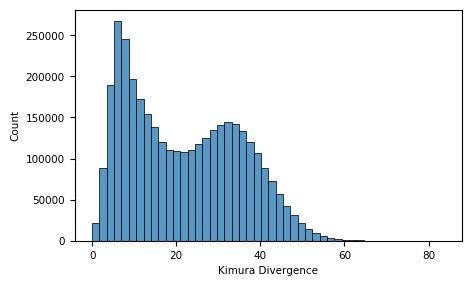

In [18]:
GLOBAL_FONT_SIZE = 7.5

figure, ax = plt.subplots(
    nrows=1,
    ncols=1,
    sharex=True,
    sharey=False,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(5, 3),
)
sns.histplot(
    repeat_masker_average_true_div.kimura_divCpGMod_weighted_average, ax=ax, bins=48
)

# Axis Labels
ax.set_xlabel("Kimura Divergence", fontsize=GLOBAL_FONT_SIZE)
ax.set_ylabel("Count", fontsize=GLOBAL_FONT_SIZE)

# Tick Labels (X and Y)
ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)


plt.savefig("plots/Divergence_score_dist_all_true.svg")

In [7]:
1

1

In [12]:
10 / 13.33

0.7501875468867216

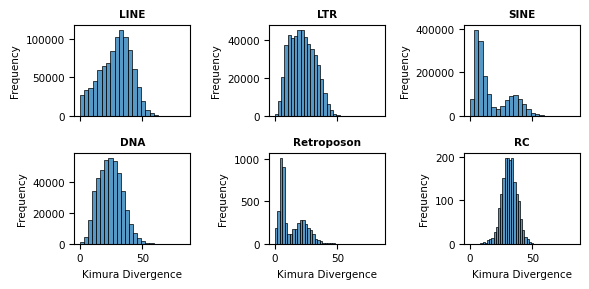

Success: Class divergence grid saved to plots/Divergence_score_dist_by_class_true.svg with font size 7.5


In [16]:
GLOBAL_FONT_SIZE = 7.5
FIGURE_SIZE = (6, 3)
BINS = 24

# --- 3. Visualization ---

figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=True,
    sharey=False,
    squeeze=True,
    figsize=FIGURE_SIZE,
)

# Flatten axes for iteration
flat_axs = axs.flatten()

for class_name, ax in zip(class_names, flat_axs):
    # Filter the data
    repeat_masker_local = repeat_masker_average_true_div[
        repeat_masker_average_true_div["class_name"] == class_name
    ]

    # Plot histogram
    sns.histplot(
        data=repeat_masker_local,
        x="kimura_divCpGMod_weighted_average",
        ax=ax,
        bins=BINS,
        # color="#555555",
        # edgecolor='white',
        linewidth=0.5,
    )

    # --- Unified Font Size Customization ---

    # Subplot Title
    ax.set_title(class_name, fontsize=GLOBAL_FONT_SIZE, fontweight="bold")

    # Axis Labels
    ax.set_xlabel("Kimura Divergence", fontsize=GLOBAL_FONT_SIZE)
    ax.set_ylabel("Frequency", fontsize=GLOBAL_FONT_SIZE)

    # Tick Labels (X and Y)
    ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)

# Adjust layout to prevent overlap
plt.tight_layout()

# --- 4. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/Divergence_score_dist_by_class_true.svg"

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()

print(
    f"Success: Class divergence grid saved to {save_path} with font size {GLOBAL_FONT_SIZE}"
)

### Analysis of average divergence by subfamilies

In [3]:
repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
repeat_masker_average_true_div

,Unnamed: 0.1,Unnamed: 0,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,...,transversions,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted,perc_div_weighted_average,ts_tv_ratio_weighted_average,kimura_divCpGMod_weighted_average,kimura_unadjusted_weighted_average
0,0,0,chr1,0,7536,223,L1MC3,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...",...,"17.0,17.0,107.0,33.0","0.07,0.04,0.03,0.09","2.33,1.0,2.96,1.33","17.61,29.4,29.4,23.5","23.0,159.0,159.0,41.0","17.61,30.43,30.43,24.22",22.354286,1.282471,26.404275,27.216867
1,1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1",...,"41.0,13.0","0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07",25.821562,1.765625,28.833437,33.202813
2,2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1",...,"41.0,13.0","0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07",25.821562,1.765625,28.833437,33.202813
3,3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"chr1,chr1,chr1",...,9.0,0.02,1.4,16.85,28.0,16.85,14.680000,3.110000,16.850000,16.850000
4,4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"chr1,chr1",...,19.0,0.03,2.13,13.51,46.0,17.06,14.800000,2.420000,13.510000,17.060000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3709424,3709424,3709424,chrY,62443446,62449578,84,L1P1,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",...,42.0,0.0,6.5,6.87,73.0,9.06,8.420000,1.740000,6.870000,9.060000
3709425,3709425,3709425,chrY,62445666,62449071,338,L2a,L2,LINE,"chrY,chrY,chrY,chrY,chrY,chrY",...,16.0,0.04,3.5,41.04,32.0,47.82,33.800000,2.000000,41.040000,47.820000
3709426,3709426,3709426,chrY,62446656,62452812,204,L1MC5a,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",...,8.0,0.08,2.77,23.11,24.0,23.11,19.200000,3.000000,23.110000,23.110000
3709427,3709427,3709427,chrY,62448384,62448649,230,MIR3,MIR,SINE,"chrY,chrY",...,5.0,0.03,1.5,26.46,13.0,28.3,22.500000,2.600000,26.460000,28.300000


In [4]:
individuals_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

divergence_average = (
    repeat_masker_average_true_div[
        ["kimura_divCpGMod_weighted_average", "subfamily_name"]
    ]
    .groupby("subfamily_name")
    .mean()["kimura_divCpGMod_weighted_average"]
)


public_age = pd.read_excel(
    "41598_2024_73752_MOESM2_ESM.xlsx", sheet_name="TE subfamily"
)
individuals_by_classes = individuals_by_classes.set_index("individual_name").reindex(
    public_age["repeat subfamily name"]
)

public_age["average_divergence"] = list(
    divergence_average.reindex(public_age["repeat subfamily name"])
)
public_age["class_name"] = list(individuals_by_classes["class_name"])
public_age["class_name_random"] = (
    public_age["class_name"].sample(frac=1, random_state=1).set_axis(public_age.index)
)
public_age.dropna(subset="average_divergence")

,repeat subfamily name,repeat family name,repeat class,repeat classification,repeat region,repeat consensus length,repeat copy count,repeat copy count after filtering,emergence era,evolutionary age,average_divergence,class_name,class_name_random
1,AluJr,AluJ,SINE,Alu,NaN,312,145275,38637,Haplorrhini,63.0,11.755427,SINE,NaN
2,AluJo,AluJ,SINE,Alu,NaN,312,195492,70049,Haplorrhini,63.0,11.181294,SINE,LTR
3,AluJr4,AluJ,SINE,Alu,NaN,312,114761,23441,Haplorrhini,63.0,12.952660,SINE,NaN
4,AluJb,AluJ,SINE,Alu,NaN,312,115377,78827,Haplorrhini,63.0,12.864931,SINE,DNA
5,AluSq2,AluS,SINE,Alu,NaN,313,49840,44294,Haplorrhini,63.0,6.398210,SINE,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1264,hAT-4b_Ther,hAT-4b_Ther,DNA,hAT-Tip100,NaN,1263,134,5,Eutheria,105.0,32.848108,DNA,LTR
1265,hAT-5_Mam,hAT-5_Mam,DNA,hAT-Tag1,NaN,3540,464,3,Eutheria,105.0,31.779747,DNA,LTR
1266,hAT-N1_Mam,hAT-N1_Mam,DNA,hAT-Tip100,NaN,340,170,23,Eutheria,105.0,32.993352,DNA,DNA
1267,hAT-N1a_Mam,hAT-N1_Mam,DNA,hAT-Tip100,NaN,362,372,35,Theria,159.0,30.628825,DNA,NaN


Generating plot...
Plot saved to ./plots/average_divergence_true_vs_evol_age_TE_subfamilies.svg


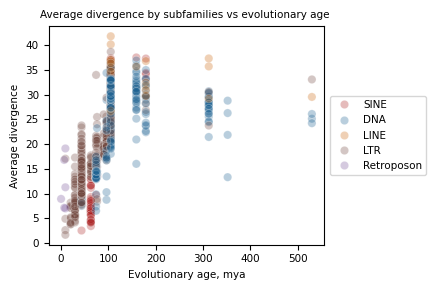

In [9]:
GLOBAL_FONT_SIZE = 7.5


# --- 5. Create the Plot ---
print("Generating plot...")
# Create the figure and axes (for figsize customization)
fig, ax = plt.subplots(figsize=(5.25, 3))

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=public_age,
    hue="class_name",
    x="evolutionary age",
    y="average_divergence",
    palette=class_names_p,
    ax=ax,
    alpha=0.3,
)

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=GLOBAL_FONT_SIZE)
ax.set_title(
    "Average divergence by subfamilies vs evolutionary age ", fontsize=GLOBAL_FONT_SIZE
)
ax.set_xlabel("Evolutionary age, mya", fontsize=GLOBAL_FONT_SIZE)
ax.set_ylabel("Average divergence", fontsize=GLOBAL_FONT_SIZE)

# Tick Labels (X and Y)
ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)

# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = "./plots/average_divergence_true_vs_evol_age_TE_subfamilies.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

In [8]:
??ax.legend

Signature: ax.legend(*args, **kwargs)
Docstring:
Place a legend on the Axes.

Call signatures::

    legend()
    legend(handles, labels)
    legend(handles=handles)
    legend(labels)

The call signatures correspond to the following different ways to use
this method:

**1. Automatic detection of elements to be shown in the legend**

The elements to be added to the legend are automatically determined,
when you do not pass in any extra arguments.

In this case, the labels are taken from the artist. You can specify
them either at artist creation or by calling the
:meth:`~.Artist.set_label` method on the artist::

    ax.plot([1, 2, 3], label='Inline label')
    ax.legend()

or::

    line, = ax.plot([1, 2, 3])
    line.set_label('Label via method')
    ax.legend()

.. note::
    Specific artists can be excluded from the automatic legend element
    selection by using a label starting with an underscore, "_".
    A string starting with an underscore is the default label for all
    artist

### Analysis of length by divergence and by class

In [ ]:
repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)

LINE -0.47998269579632075 0.0
LTR 0.11075538782918427 0.0
SINE -0.5196352362570823 0.0
DNA -0.04213194386043754 6.208294548680738e-170
Retroposon -0.2949821028392367 2.1669283433826627e-100
RC -0.23910582983243067 1.1706833087985503e-23
Plot saved to ./plots/length_vs_kimura_divCpGMod_weighted_average_spearman_true_TE_all_histplot.svg


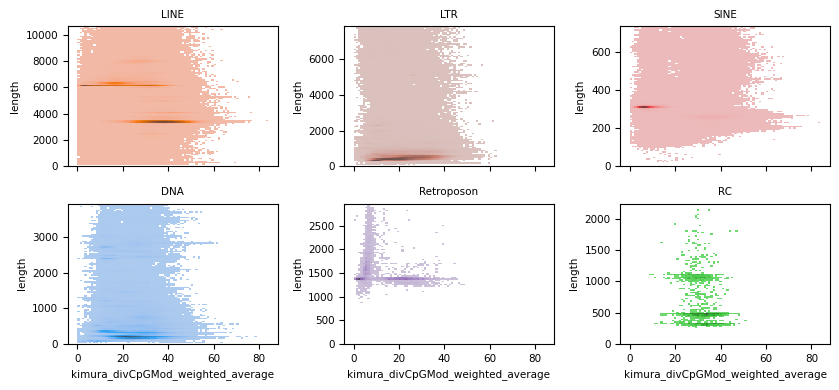

In [38]:
x_column = "kimura_divCpGMod_weighted_average"
y_column = "length"

figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=True,
    sharey=False,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(10, 4),
)

data_to_plot = repeat_masker_average_true_div  # [:1000000]

GLOBAL_FONT_SIZE = 7.5

for class_name, ax in zip(class_names, axs.flatten()):
    data_to_plot_local = data_to_plot[data_to_plot["class_name"] == class_name]
    corr_data = data_to_plot_local.dropna(subset=[x_column, y_column])
    corr_result = stats.spearmanr(corr_data[x_column], corr_data[y_column])
    corr_r = corr_result.statistic

    corr_p = corr_result.pvalue
    print(class_name, corr_r, corr_p)
    # Format the statistics string
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"

    stats_text = f"Spearman R: {corr_r:.3f}\n{p_val_str}"

    # Use ax.set_title() to set the title for the subplot
    ax.set_title(class_name, fontsize=GLOBAL_FONT_SIZE)

    # Draw the scatterplot onto the axis
    # sns.scatterplot
    sns.histplot(
        data=data_to_plot_local,
        hue="class_name",
        x=x_column,
        y=y_column,
        palette=class_names_p,
        ax=ax,
        # bins=(100, 100),
        binwidth=(1, corr_data[y_column].quantile(0.99) / 100),
        # alpha=0.01,
        legend=False,
    )
    if False:
        ax.text(
            0.05,
            0.95,  # Position: 5% from left, 95% from bottom
            stats_text,
            transform=ax.transAxes,
            fontsize=GLOBAL_FONT_SIZE,
            verticalalignment="top",
            bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
        )
    ax.set_ylim((0, corr_data[y_column].quantile(0.99)))

    # ax.set(yscale="log")

    ax.set_xlabel(x_column, fontsize=GLOBAL_FONT_SIZE)
    ax.set_ylabel(y_column, fontsize=GLOBAL_FONT_SIZE)
    ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)


plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{y_column}_vs_{x_column}_spearman_true_TE_all_histplot.svg"
save_path_png = f"./plots/{y_column}_vs_{x_column}_spearman_true_TE_all_histplot.png"
figure.savefig(save_path, format="svg", transparent=True)
figure.savefig(save_path_png, format="png", dpi=300)

print(f"Plot saved to {save_path}")

plt.show()

Fitting sigmoidal curve...
0.0
Generating plot...
Plot saved to ./plots/length_vs_kimura_divCpGMod_weighted_average_spearman_true_TE_100000.svg


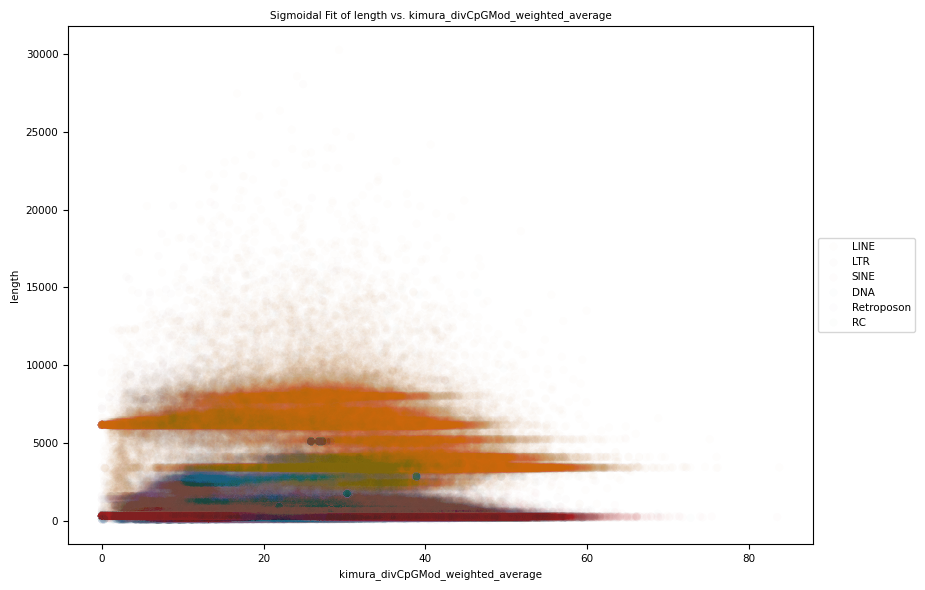

In [15]:
x_column = "kimura_divCpGMod_weighted_average"
y_column = "length"
data_to_plot = repeat_masker_average_true_div[:1000000]

GLOBAL_FONT_SIZE = 7.5


# --- 2. Define the sigmoidal function ---
def sigmoid(x, L, k, x0):
    """
    Sigmoidal (logistic) function.
    L: maximum value (the asymptote)
    k: steepness of the curve
    x0: the x-value of the sigmoid's midpoint
    """
    return L / (1 + np.exp(-k * (x - x0)))


# --- 3. Prepare data and perform the fit ---
print("Fitting sigmoidal curve...")


# Drop NaNs to ensure alignment and prevent errors
fit_data = data_to_plot[[x_column, y_column]].dropna()
x_data = fit_data[x_column]
y_data = fit_data[y_column]

# Provide initial guesses for the parameters [L, k, x0]
# L: guess the max value of y
# k: guess 1 (steepness)
# x0: guess the median value of x
p0 = [y_data.max(), 1, x_data.median()]

try:
    # Fit the curve
    popt, pcov = curve_fit(sigmoid, x_data, y_data, p0=p0, maxfev=5000)
    L, k, x0 = popt
    fit_successful = True

    # --- 4. Calculate Statistics (R-squared and p-value) ---
    # Get the predicted y-values from the fit
    y_pred = sigmoid(x_data, *popt)

    # Calculate R-squared
    # (using Pearson correlation between actual and predicted)
    corr, p_value = stats.pearsonr(y_data, y_pred)
    r_squared = corr**2

    # Format p-value for display
    if p_value < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_value:.3f}"

    # Create the equation string for the plot
    equation_text = (
        f"y = {L:.2f} / (1 + exp(-{k:.2f} $\\cdot$ (x - {x0:.2f})))\n"
        f"$R^2$ = {r_squared:.3f}\n"
        f"{p_val_str}"
    )
    print(p_value)

except RuntimeError:
    # This happens if the curve fit fails to converge
    print("Sigmoidal curve fit failed to converge.")
    fit_successful = False
    equation_text = "Fit failed to converge"


# --- 5. Create the Plot ---
print("Generating plot...")
# Create the figure and axes (for figsize customization)
fig, ax = plt.subplots(figsize=(11, 6))

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x=x_column,
    y=y_column,
    palette=class_names_p,
    ax=ax,
    alpha=0.01,
)

if fit_successful and False:
    # --- 6. Plot the Fitted Curve ---
    # Create a smooth x-axis for the curve
    x_fit = np.linspace(x_data.min(), x_data.max(), 200)
    y_fit = sigmoid(x_fit, *popt)

    # Plot the curve
    ax.plot(x_fit, y_fit, color="black", ls="--", lw=2.5, label="Sigmoid Fit")

    # --- 7. Add the Equation Textbox ---
    ax.text(
        0.05,
        0.95,  # Position in (x, y) coordinates (0.05=5% from left, 0.95=95% from top)
        equation_text,
        transform=ax.transAxes,  # Use axis-relative coordinates
        fontsize=GLOBAL_FONT_SIZE,
        verticalalignment="top",
        ha="left",
        # Add a light background box
        bbox=dict(facecolor="white", alpha=0.7, boxstyle="round,pad=0.5"),
    )

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=GLOBAL_FONT_SIZE)
ax.set_title(f"Sigmoidal Fit of {y_column} vs. {x_column}", fontsize=GLOBAL_FONT_SIZE)
ax.set_xlabel(x_column, fontsize=GLOBAL_FONT_SIZE)
ax.set_ylabel(y_column, fontsize=GLOBAL_FONT_SIZE)
ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
# ax.set_ylim((0, 0.225))


plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{y_column}_vs_{x_column}_spearman_true_TE_100000.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

## Divergence analysis

In [22]:
repeat_masker = pd.read_csv("T2T_repeat_masker_processed.csv")

In [ ]:
# repeat_masker.to_csv("T2T_repeat_masker_processed.bed", sep="\t", header=False, index=False)

In [10]:
# repeat_masker[['#"chrom"', 'chromStart', 'chromEnd', 'score', 'individual_name','family_name','class_name']].to_csv('T2T_repeat_masker_processed.csv')

In [14]:
repeat_masker

,Unnamed: 0,"#""chrom""",chromStart,chromEnd,score,individual_name,family_name,class_name
0,0,chr1,0,7536,223,L1MC3,L1,LINE
1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR
2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR
3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR
4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR
...,...,...,...,...,...,...,...,...
3709424,3709424,chr22,51316429,51324176,211,L1MC,L1,LINE
3709425,3709425,chr22,51316699,51317699,149,MER72,ERV1,LTR
3709426,3709426,chr22,51316748,51317061,108,AluSq2,Alu,SINE
3709427,3709427,chr22,51319294,51320377,254,LTR60B,ERV1,LTR


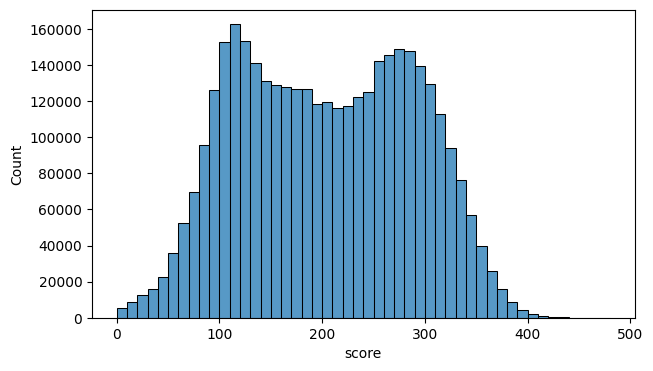

In [32]:
figure, ax = plt.subplots(
    nrows=1,
    ncols=1,
    sharex=True,
    sharey=False,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(7, 4),
)
sns.histplot(repeat_masker.score, ax=ax, bins=48)


plt.savefig("plots/Divergence_score_dist_all.svg")

In [27]:
repeat_masker.score.max()

480

In [33]:
(repeat_masker["class_name"] + " / " + repeat_masker["family_name"]).value_counts()

SINE / Alu             1164096
LINE / L1               565459
SINE / MIR              534149
LINE / L2               373176
LTR / ERVL-MaLR         259882
DNA / hAT-Charlie       232104
LTR / ERV1              116610
LTR / ERVL              116199
DNA / TcMar-Tigger      106067
DNA / hAT-Tip100         57232
LINE / CR1               49193
LTR / Gypsy              18413
DNA / hAT-Blackjack      16167
DNA / TcMar-Mariner      15617
LINE / RTE-X             10790
LTR / ERVK                7870
DNA / TcMar-Tc2           6918
Retroposon / SVA          6274
LINE / RTE-BovB           5031
SINE / tRNA-RTE           4154
DNA / hAT-Ac              3692
DNA / hAT                 3038
DNA / MULE-MuDR           2459
DNA / PiggyBac            2156
SINE / 5S-Deu-L2          2019
RC / Helitron             1869
DNA / hAT-Tag1            1849
SINE / tRNA               1612
LINE / Penelope            779
DNA / TcMar-Tc1            701
LINE / Dong-R4             503
SINE / tRNA-Deu            455
DNA / Ko

In [32]:
pd.crosstab(repeat_masker["class_name"], repeat_masker["family_name"])

family_name,5S-Deu-L2,Alu,CR1,Crypton,Crypton-A,Dong-R4,ERV1,ERVK,ERVL,ERVL-MaLR,...,hAT-Blackjack,hAT-Charlie,hAT-Tag1,hAT-Tip100,hAT-Tip100?,hAT-hAT19,hAT?,tRNA,tRNA-Deu,tRNA-RTE
class_name,,,,,,,,,,,,,,,,,,,,,
DNA,0,0,0,305,150,0,0,0,0,0,...,16167,232104,1849,57232,67,18,34,0,0,0
LINE,0,0,49193,0,0,503,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
LTR,0,0,0,0,0,0,116610,7870,116199,259882,...,0,0,0,0,0,0,0,0,0,0
RC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Retroposon,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SINE,2019,1164096,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1612,455,4154


In [13]:
repeat_masker[["class_name", "family_name"]].drop_duplicates().to_csv(
    "families_by_classes_TE.csv"
)

In [14]:
repeat_masker[["class_name", "individual_name"]].drop_duplicates().to_csv(
    "individuals_by_classes_TE.csv"
)

In [25]:
repeat_masker["individual_name"].value_counts().to_csv(
    "individuals_counts.csv", index=True
)
repeat_masker["family_name"].value_counts().to_csv("families_counts.csv", index=True)

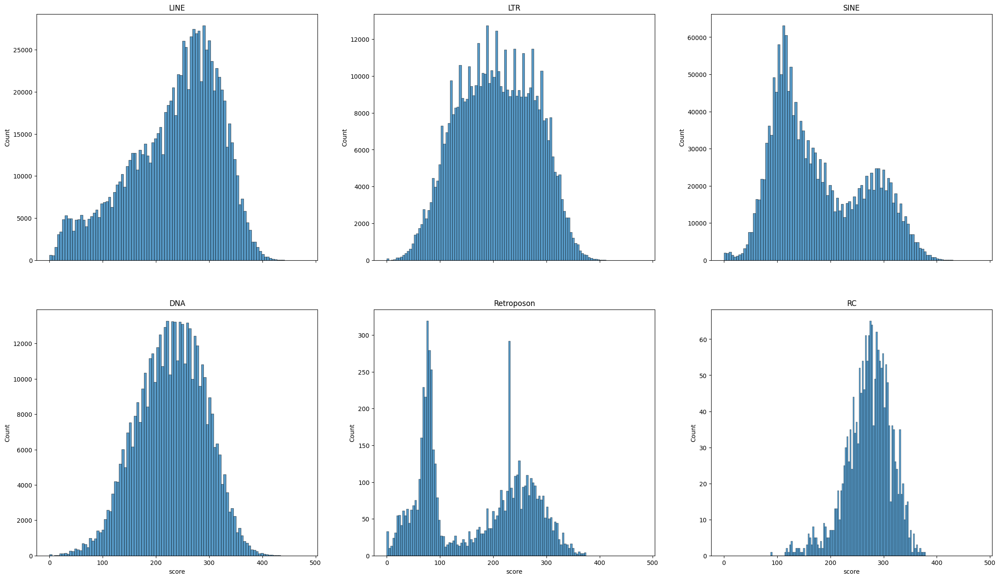

In [4]:
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=True,
    sharey=False,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(14, 16),
)

# Use zip to iterate over class names and the flattened axes array
# axs.flatten() converts the 2x3 array into a 1D array of 6 axes
for class_name, ax in zip(class_names, axs.flatten()):

    # Filter the data
    query_local = f'class_name == "{class_name}"'
    repeat_masker_local = repeat_masker.query(query_local)

    # Use sns.histplot (axes-level) instead of sns.displot (figure-level)
    sns.histplot(repeat_masker_local.score, ax=ax, bins=100)

    # Use ax.set_title() to set the title for the subplot
    ax.set_title(class_name)

# Save the final figure
# plt.savefig("plots/Divergence_score_dist_by_class.svg")

/home/jovyan/venvs/bioreactor/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/home/jovyan/venvs/bioreactor/lib/python3.10/site-packages/seaborn/axisgrid.py:854: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_a

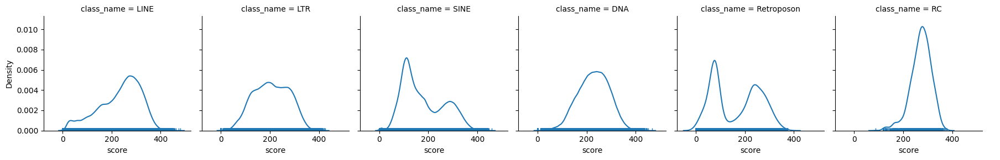

In [23]:
g = sns.FacetGrid(repeat_masker, col="class_name")
p1 = g.map(sns.distplot, "score", hist=False, rug=True).add_legend()

### Concordance between divergence and evolutionary age

In [3]:
individuals_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

repeat_masker = pd.read_csv("T2T_repeat_masker_processed.csv")
divergence_average = (
    repeat_masker[["score", "individual_name"]]
    .groupby("individual_name")
    .mean()["score"]
)


public_age = pd.read_excel(
    "41598_2024_73752_MOESM2_ESM.xlsx", sheet_name="TE subfamily"
)
individuals_by_classes = individuals_by_classes.set_index("individual_name").reindex(
    public_age["repeat subfamily name"]
)

public_age["average_divergence"] = list(
    divergence_average.reindex(public_age["repeat subfamily name"])
)
public_age["class_name"] = list(individuals_by_classes["class_name"])
public_age["class_name_random"] = (
    public_age["class_name"].sample(frac=1, random_state=1).set_axis(public_age.index)
)
public_age.dropna(subset="average_divergence")

,repeat subfamily name,repeat family name,repeat class,repeat classification,repeat region,repeat consensus length,repeat copy count,repeat copy count after filtering,emergence era,evolutionary age,average_divergence,class_name,class_name_random
1,AluJr,AluJ,SINE,Alu,NaN,312,145275,38637,Haplorrhini,63.0,164.110565,SINE,NaN
2,AluJo,AluJ,SINE,Alu,NaN,312,195492,70049,Haplorrhini,63.0,159.136869,SINE,LTR
3,AluJr4,AluJ,SINE,Alu,NaN,312,114761,23441,Haplorrhini,63.0,168.305085,SINE,NaN
4,AluJb,AluJ,SINE,Alu,NaN,312,115377,78827,Haplorrhini,63.0,176.103257,SINE,DNA
5,AluSq2,AluS,SINE,Alu,NaN,313,49840,44294,Haplorrhini,63.0,107.051696,SINE,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1264,hAT-4b_Ther,hAT-4b_Ther,DNA,hAT-Tip100,NaN,1263,134,5,Eutheria,105.0,266.937500,DNA,LTR
1265,hAT-5_Mam,hAT-5_Mam,DNA,hAT-Tag1,NaN,3540,464,3,Eutheria,105.0,257.001460,DNA,LTR
1266,hAT-N1_Mam,hAT-N1_Mam,DNA,hAT-Tip100,NaN,340,170,23,Eutheria,105.0,272.766355,DNA,DNA
1267,hAT-N1a_Mam,hAT-N1_Mam,DNA,hAT-Tip100,NaN,362,372,35,Theria,159.0,257.520788,DNA,NaN


In [36]:
public_age["class_name"]

0        NaN
1       SINE
2       SINE
3       SINE
4       SINE
        ... 
1264     DNA
1265     DNA
1266     DNA
1267     DNA
1268    LINE
Name: class_name, Length: 1269, dtype: object

In [41]:
public_age["class_name"].sample(frac=1, random_state=1).reset_index(drop=True)

0       DNA
1       NaN
2       LTR
3       NaN
4       DNA
       ... 
1264    LTR
1265    LTR
1266    DNA
1267    NaN
1268    LTR
Name: class_name, Length: 1269, dtype: object

<Axes: xlabel='evolutionary age', ylabel='average_divergence'>

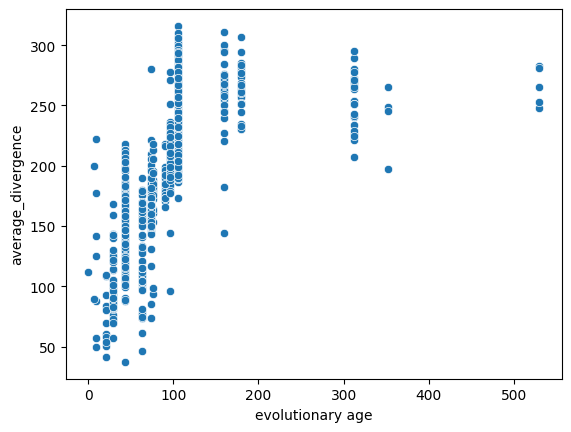

In [5]:
sns.scatterplot(data=public_age, x="evolutionary age", y="average_divergence")

In [7]:
from scipy import stats

public_age_young = public_age[public_age["evolutionary age"] < 150][
    ["evolutionary age", "average_divergence"]
].dropna()

stats.pearsonr(
    public_age_young["evolutionary age"], public_age_young["average_divergence"]
)

PearsonRResult(statistic=0.8378551967501433, pvalue=3.8166192497127716e-200)

Generating plot...
Plot saved to ./plots/average_divergence_vs_evol_age_TE_individuals.svg


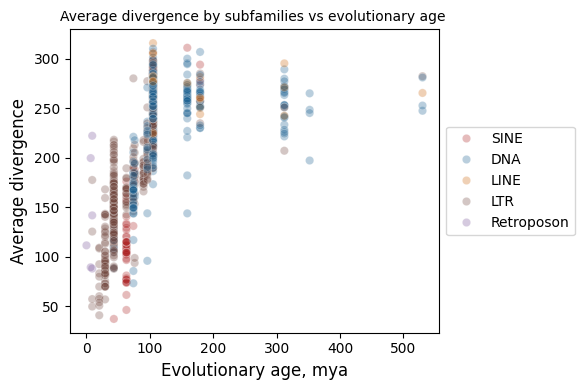

In [33]:
# --- 5. Create the Plot ---
print("Generating plot...")
# Create the figure and axes (for figsize customization)
fig, ax = plt.subplots(figsize=(7, 4))

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=public_age,
    hue="class_name",
    x="evolutionary age",
    y="average_divergence",
    palette=class_names_p,
    ax=ax,
    alpha=0.3,
)

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title("Average divergence by subfamilies vs evolutionary age ", fontsize=10)
ax.set_xlabel("Evolutionary age, mya", fontsize=12)
ax.set_ylabel("Average divergence", fontsize=12)
# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = "./plots/average_divergence_vs_evol_age_TE_individuals.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

INFO: Generating Venn diagram...
INFO: Saving plot to plots/TE_name_overlap_families.svg...


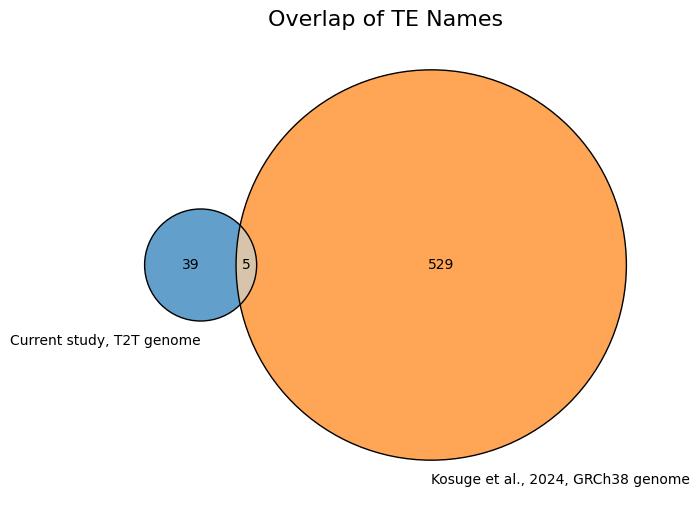

SUCCESS: Plot saved.


In [34]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib_venn import venn2, venn2_circles

divergence_average = (
    repeat_masker[["score", "family_name"]].groupby("family_name").mean()["score"]
)


# --- 2. Define your sets and labels ---
sets = [set(divergence_average.index), set(public_age["repeat family name"])]
labels = (
    "Current study, T2T genome",
    "Kosuge et al., 2024, GRCh38 genome",
)  # Use a tuple for labels

# --- 3. Create the plot with configurable figsize ---
print("INFO: Generating Venn diagram...")
# You can change the figsize here
fig, ax = plt.subplots(figsize=(8, 6))

# --- 4. Plot the Venn diagram ---
v = venn2(
    subsets=sets,
    set_labels=labels,
    ax=ax,
    # Customize colors
    set_colors=("#1f77b4", "#ff7f0e"),  # Blue and Orange
    alpha=0.7,
)

# Add circles with black outlines
venn2_circles(subsets=sets, linestyle="solid", linewidth=1.0, color="black", ax=ax)

# Customize label fonts
for text in v.set_labels:
    text.set_fontsize(10)
for text in v.subset_labels:
    text.set_fontsize(10)

# Add a title
ax.set_title("Overlap of TE Names", fontsize=16)

# --- 5. Save to SVG ---
save_path = "plots/TE_name_overlap_families.svg"
print(f"INFO: Saving plot to {save_path}...")

# Ensure the directory exists
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save with tight_layout and transparent background
fig.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()
print("SUCCESS: Plot saved.")

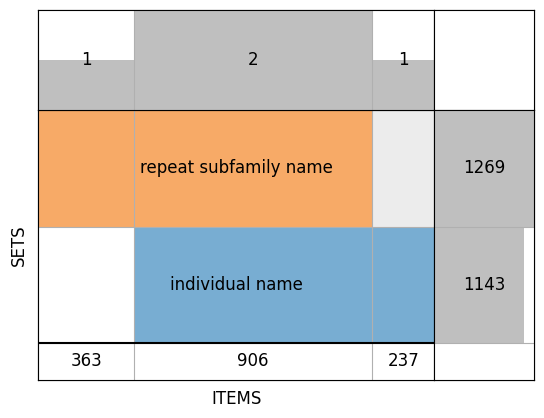

In [30]:
sets = [set(divergence_average.index), set(public_age["repeat subfamily name"])]
labels = ["individual name", "repeat subfamily name"]
supervenn(sets, labels)

In [27]:
set(divergence_average.index) - set(public_age["repeat subfamily name"])

{'Alu',
 'Alu-VAR_rnd-5_family-1084',
 'Charlie18a',
 'Charlie7b_Mars',
 'ERV24B_Prim-int',
 'ERV24_Prim-int',
 'ERVL-B4-int',
 'ERVL-E-int',
 'ERVL-int',
 'ERVL47-int',
 'HERV-Fc1-int',
 'HERV-Fc2-int',
 'HERV15-int',
 'HERV16-int',
 'HERV17-int',
 'HERV3-int',
 'HERV30-int',
 'HERV35I-int',
 'HERV9-int',
 'HERV9N-int',
 'HERV9NC-int',
 'HERVE-int',
 'HERVE_a-int',
 'HERVFH19-int',
 'HERVFH21-int',
 'HERVH-int',
 'HERVH48-int',
 'HERVI-int',
 'HERVIP10B3-int',
 'HERVIP10F-int',
 'HERVIP10FH-int',
 'HERVK-int',
 'HERVK11-int',
 'HERVK11D-int',
 'HERVK13-int',
 'HERVK14-int',
 'HERVK14C-int',
 'HERVK22-int',
 'HERVK3-int',
 'HERVK9-int',
 'HERVKC4-int',
 'HERVL-int',
 'HERVL18-int',
 'HERVL32-int',
 'HERVL40-int',
 'HERVL66-int',
 'HERVL74-int',
 'HERVP71A-int',
 'HERVS71-int',
 'HSMAR2',
 'HUERS-P1-int',
 'HUERS-P2-int',
 'HUERS-P3-int',
 'HUERS-P3b-int',
 'Harlequin-int',
 'Helitron1Na_Mam',
 'Helitron1Nb_Mam',
 'Helitron2Na_Mam',
 'Helitron3Na_Mam',
 'Kanga2_a',
 'L1HS',
 'L1M',
 'L1

In [28]:
set(public_age["repeat subfamily name"]) - set(divergence_average.index)

{'7SLRNA',
 'BC200_0',
 'BC200_1',
 'CR1_Amni-1',
 'Charlie18a_0',
 'Charlie18a_1',
 'DIRS-1a_Amnio',
 'DIRS-1b_Amnio',
 'DIRS-1c_Amnio',
 'ERV24B_Prim',
 'ERV24_Prim',
 'ERVL',
 'ERVL-B4',
 'ERVL-E',
 'ERVL47',
 'HERV-Fc1',
 'HERV-Fc2_0',
 'HERV-Fc2_1',
 'HERV15',
 'HERV16',
 'HERV17_0',
 'HERV17_1',
 'HERV30',
 'HERV35I',
 'HERV3_0',
 'HERV3_1',
 'HERV9',
 'HERV9N',
 'HERV9NC',
 'HERVE',
 'HERVE_a',
 'HERVFH19',
 'HERVFH21',
 'HERVH48',
 'HERVH_0',
 'HERVH_1',
 'HERVH_2',
 'HERVH_3',
 'HERVH_4',
 'HERVI',
 'HERVIP10B3',
 'HERVIP10F',
 'HERVIP10FH',
 'HERVK11',
 'HERVK11D',
 'HERVK13',
 'HERVK14',
 'HERVK14C',
 'HERVK22_0',
 'HERVK22_1',
 'HERVK3_0',
 'HERVK3_1',
 'HERVK9_0',
 'HERVK9_1',
 'HERVK9_2',
 'HERVKC4',
 'HERVK_0',
 'HERVK_1',
 'HERVL',
 'HERVL18_0',
 'HERVL18_1',
 'HERVL18_2',
 'HERVL32',
 'HERVL40',
 'HERVL66',
 'HERVL74',
 'HERVP71_0',
 'HERVP71_1',
 'HERVS71_0',
 'HERVS71_1',
 'HERVS71_2',
 'HSMAR2_0',
 'HSMAR2_1',
 'HSMAR2_2',
 'HUERS-P1_0',
 'HUERS-P1_1',
 'HUERS-P1_2'

In [5]:
public_age = pd.read_excel(
    "41598_2024_73752_MOESM2_ESM.xlsx", sheet_name="TE subfamily"
)
public_age[["repeat class", "repeat copy count"]].groupby("repeat class").sum()

,repeat copy count
repeat class,
DNA,389060
ERV/LTR,701405
LINE,1152399
Retroposon,128872
SINE,2031756


# Gene table analysis

In [9]:
gene_table = pd.read_csv("T2T_refseq_all_genes.csv")
gene_table = gene_table[
    (gene_table.geneName.str.startswith("NM"))
    | (gene_table.geneName.str.startswith("NR"))
    | (gene_table.geneName.str.startswith("NP"))
    | (gene_table.geneName.str.startswith("NP"))
]
gene_table["thick_length"] = gene_table["thickEnd"] - gene_table["thickStart"]
gene_table["TSS_start"] = gene_table["chromStart"] - 5000
gene_table["TSS_end"] = gene_table["chromStart"] + 5000

gene_table["TSS_start"][gene_table["strand"] == "-"] = (
    gene_table["chromEnd"][gene_table["strand"] == "-"] - 5000
)
gene_table["TSS_end"][gene_table["strand"] == "-"] = (
    gene_table["chromEnd"][gene_table["strand"] == "-"] + 5000
)

gene_table[['#"chrom"', "TSS_start", "TSS_end", "geneName2"]].to_csv(
    "TSS.bed", sep="\t", header=False, index=False
)

gene_table["TSS_start"][gene_table.TSS_start < 0] = 0

gene_table  # [(gene_table['thick_length'] > 3000) & (gene_table['strand'] == '+')]
# gene_table[(gene_table['thick_length'] > 3000) & (gene_table['strand'] == '+')]

/tmp/ipykernel_172/1446679063.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_table['TSS_start'][gene_table['strand'] == '-'] = gene_table['chromEnd'][gene_table['strand'] == '-'] - 5000
/tmp/ipykernel_172/1446679063.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_table['TSS_end'][gene_table['strand'] == '-'] = gene_table['chromEnd'][gene_table['strand'] == '-'] + 5000
/tmp/ipykernel_172/1446679063.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

,"#""chrom""",chromStart,chromEnd,name,score,strand,thickStart,thickEnd,reserved,blockCount,...,cdsStartStat,cdsEndStat,exonFrames,type,geneName,geneName2,geneType,thick_length,TSS_start,TSS_end
0,chr1,7505,13582,NR_182076.1,0,-,13582,13582,0,2,...,none,none,"-1,-1,",NaN,NR_182076.1,LOC127239154,NaN,0,8582,18582
1,chr1,7505,137287,NR_182075.1,0,-,137287,137287,0,5,...,none,none,"-1,-1,-1,-1,-1,",NaN,NR_182075.1,LOC127239154,NaN,0,132287,142287
2,chr1,7505,138480,NR_182074.1,0,-,138480,138480,0,5,...,none,none,"-1,-1,-1,-1,-1,",NaN,NR_182074.1,LOC127239154,NaN,0,133480,143480
4,chr1,52978,54612,NR_125957.1,0,-,54612,54612,0,3,...,none,none,"-1,-1,-1,",NaN,NR_125957.1,LOC101928626,NaN,0,49612,59612
5,chr1,111939,112877,NM_001005277.1,0,-,111939,112877,0,2,...,cmpl,cmpl,"2,0,",NaN,NM_001005277.1,OR4F16,NaN,938,107877,117877
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178149,chr22,51281002,51297133,NM_001350017.2,0,-,51282272,51295791,0,10,...,cmpl,cmpl,"0,0,1,0,1,2,2,0,-1,-1,",NaN,NM_001350017.2,RABL2B,NaN,13519,51292133,51302133
178150,chr22,51281002,51297133,NM_001394054.1,0,-,51282272,51295791,0,10,...,cmpl,cmpl,"0,0,1,0,1,2,2,0,-1,-1,",NaN,NM_001394054.1,RABL2B,NaN,13519,51292133,51302133
178151,chr22,51281002,51297133,NM_001394055.1,0,-,51282272,51295791,0,9,...,cmpl,cmpl,"0,0,1,0,1,2,2,0,-1,",NaN,NM_001394055.1,RABL2B,NaN,13519,51292133,51302133
178152,chr22,51281002,51297133,NM_007081.4,0,-,51282272,51295791,0,9,...,cmpl,cmpl,"0,0,1,0,1,2,2,0,-1,",NaN,NM_007081.4,RABL2B,NaN,13519,51292133,51302133


In [10]:
gene_table[gene_table.TSS_start < 0]

,"#""chrom""",chromStart,chromEnd,name,score,strand,thickStart,thickEnd,reserved,blockCount,...,cdsStartStat,cdsEndStat,exonFrames,type,geneName,geneName2,geneType,thick_length,TSS_start,TSS_end


In [11]:
gene_table[['#"chrom"', "TSS_start", "TSS_end", "geneName2"]].drop_duplicates().to_csv(
    "T2T_genes.bed", index=False, header=False, sep="\t"
)

In [3]:
len(gene_table.geneName2.unique())

28738

In [55]:
gene_table.type.unique()

array([nan])

<Axes: xlabel='thick_length', ylabel='Count'>

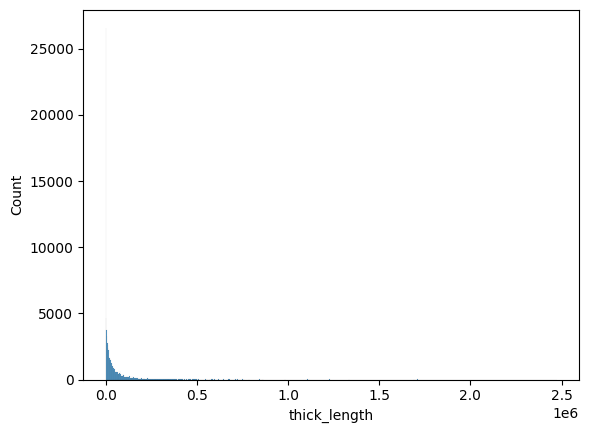

In [57]:
sns.histplot(gene_table["thick_length"])

# Analysis of epigenetic profiles mapped on retroelements

## Analysis of a sample bedGraph file

In [12]:
sample_mapping = pd.read_csv(
    "22Rv1.CTCF.chm13v2.0.sample.bedGraph", sep="\t", header=None
)
sample_mapping.columns = ["Chromosome", "Start", "End", "Signal"]
sample_mapping

,Chromosome,Start,End,Signal
0,chr1,750,800,0.214125
1,chr1,800,850,1.822150
2,chr1,850,900,2.304510
3,chr1,900,950,1.979820
4,chr1,950,1000,-0.286881
...,...,...,...,...
99995,chr1,5170400,5170450,-0.251979
99996,chr1,5170450,5170500,-0.845025
99997,chr1,5170500,5170550,-0.468675
99998,chr1,5170550,5170600,0.213956


<Axes: xlabel='Signal', ylabel='Count'>

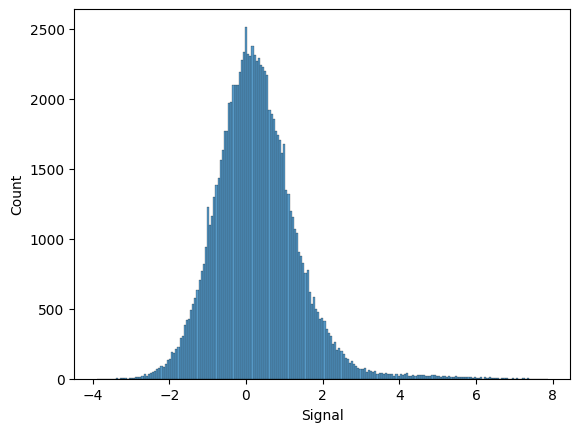

In [13]:
sns.histplot(sample_mapping.Signal)

## Analysis of sample mapping on retroelements

In [12]:
sample_enrichment = pd.read_csv(
    "./epigenomic_files/RWPE1.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph",
    sep="\t",
    header=None,
)
sample_enrichment.columns = [
    "Chromosome",
    "Start",
    "End",
    "Divergence",
    "Name",
    "Family",
    "Class",
    "Signal",
]
sample_enrichment["Signal"] = pd.to_numeric(
    sample_enrichment["Signal"], errors="coerce"
)
sample_enrichment["Divergence"] = repeat_masker_average_true_div[
    "kimura_divCpGMod_weighted_average"
]

sample_enrichment

,Chromosome,Start,End,Divergence,Name,Family,Class,Signal
0,chr1,0,7536,26.404275,L1MC3,L1,LINE,-0.848371
1,chr1,4082,4796,28.833437,LTR60B,ERV1,LTR,0.927262
2,chr1,4082,4837,28.833437,LTR60B,ERV1,LTR,0.927262
3,chr1,5267,5850,16.850000,MER34C_v,ERV1,LTR,-3.505368
4,chr1,5685,6131,13.510000,MSTA1,ERVL-MaLR,LTR,-2.454698
...,...,...,...,...,...,...,...,...
3709424,chrY,62443446,62449578,6.870000,L1P1,L1,LINE,NaN
3709425,chrY,62445666,62449071,41.040000,L2a,L2,LINE,NaN
3709426,chrY,62446656,62452812,23.110000,L1MC5a,L1,LINE,1.786149
3709427,chrY,62448384,62448649,26.460000,MIR3,MIR,SINE,NaN


In [11]:
repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
sample_enrichment["Divergence"] = repeat_masker_average_true_div[
    "kimura_divCpGMod_weighted_average"
]
repeat_masker_average_true_div

,Unnamed: 0.1,Unnamed: 0,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,...,transversions,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted,perc_div_weighted_average,ts_tv_ratio_weighted_average,kimura_divCpGMod_weighted_average,kimura_unadjusted_weighted_average
0,0,0,chr1,0,7536,223,L1MC3,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...",...,"17.0,17.0,107.0,33.0","0.07,0.04,0.03,0.09","2.33,1.0,2.96,1.33","17.61,29.4,29.4,23.5","23.0,159.0,159.0,41.0","17.61,30.43,30.43,24.22",22.354286,1.282471,26.404275,27.216867
1,1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1",...,"41.0,13.0","0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07",25.821562,1.765625,28.833437,33.202813
2,2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1",...,"41.0,13.0","0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07",25.821562,1.765625,28.833437,33.202813
3,3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"chr1,chr1,chr1",...,9.0,0.02,1.4,16.85,28.0,16.85,14.680000,3.110000,16.850000,16.850000
4,4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"chr1,chr1",...,19.0,0.03,2.13,13.51,46.0,17.06,14.800000,2.420000,13.510000,17.060000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3709424,3709424,3709424,chrY,62443446,62449578,84,L1P1,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",...,42.0,0.0,6.5,6.87,73.0,9.06,8.420000,1.740000,6.870000,9.060000
3709425,3709425,3709425,chrY,62445666,62449071,338,L2a,L2,LINE,"chrY,chrY,chrY,chrY,chrY,chrY",...,16.0,0.04,3.5,41.04,32.0,47.82,33.800000,2.000000,41.040000,47.820000
3709426,3709426,3709426,chrY,62446656,62452812,204,L1MC5a,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",...,8.0,0.08,2.77,23.11,24.0,23.11,19.200000,3.000000,23.110000,23.110000
3709427,3709427,3709427,chrY,62448384,62448649,230,MIR3,MIR,SINE,"chrY,chrY",...,5.0,0.03,1.5,26.46,13.0,28.3,22.500000,2.600000,26.460000,28.300000


In [48]:
sample_enrichment["Signal"].mean()

-1.3790889990931086

In [13]:
sample_enrichment = pd.read_csv(
    "22Rv1.CTCF.chm13v2.0.repeats_mapped.bed", sep="\t", header=None
)
sample_enrichment.columns = [
    "Chromosome",
    "Start",
    "End",
    "Divergence",
    "Name",
    "Family",
    "Class",
    "Signal",
]
sample_enrichment["Signal"] = pd.to_numeric(
    sample_enrichment["Signal"], errors="coerce"
)
sample_enrichment["Divergence"] = pd.to_numeric(
    sample_enrichment["Divergence"], errors="coerce"
)

sample_enrichment

/tmp/ipykernel_167/2191255271.py:1: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(


,Chromosome,Start,End,Divergence,Name,Family,Class,Signal
0,chr1,0,7536,223,L1MC3,L1,LINE,0.915146
1,chr1,4082,4796,273,LTR60B,ERV1,LTR,2.283021
2,chr1,4082,4837,205,LTR60B,ERV1,LTR,2.283021
3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,-0.506971
4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,-0.157703
...,...,...,...,...,...,...,...,...
3303650,chr17,68277913,68278255,182,MER58B,hAT-Charlie,DNA,-0.224869
3303651,chr17,68278542,68278854,117,AluSx1,Alu,SINE,-0.990039
3303652,chr17,68278996,68279120,163,FLAM_C,Alu,SINE,-0.281071
3303653,chr17,68279432,68279961,262,MIRb,MIR,SINE,-0.258490


In [22]:
a = sample_enrichment[["Class", "Signal"]].groupby("Class").mean()["Signal"].to_dict()
a.update({"a": 1, "b": 2})
a

{'DNA': -0.12277176643212367,
 'LINE': -0.1280531134693799,
 'LTR': -0.061174624960485945,
 'RC': -0.1812589908126175,
 'Retroposon': 0.08292652602970388,
 'SINE': 0.005907916280593598,
 'a': 1,
 'b': 2}

<Axes: xlabel='Signal', ylabel='Count'>

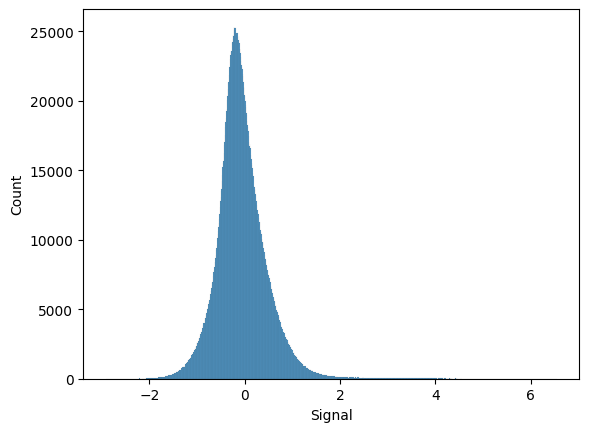

In [34]:
# non_zero_query = 'Signal != 0'
# sample_enrichment_non_zero = sample_enrichment.query(non_zero_query)

sns.histplot(sample_enrichment.Signal)

This image displays a leptokurtic (sharply peaked, heavy-tailed) and slightly right-skewed distribution. The vast majority of the "Signal" values are centered at 0, with long tails of less frequent values on both the positive and negative sides.This type of distribution is most likely derived from a Log-fold Change (logFC) calculation, a standard normalization method for epigenomic enrichment data.What the Distribution Shape MeansThe Peak at 0: This sharp, massive peak represents the genomic "background." It's the vast majority of the genome where there is no significant difference in the signal (e.g., no enrichment or depletion) compared to the control.The Right Tail (Positive Values): This tail represents regions of enrichment. These are the areas where the epigenomic mark (like a histone modification or transcription factor binding) is significantly more present than in the control sample.The Left Tail (Negative Values): This tail represents regions of depletion, where the mark is significantly less present than in the control.The Skew: The right tail extends further than the left tail, which is common for "enrichment" tracks. It indicates that the high-enrichment signals are stronger (further from 0) than the depletion signals.How This Normalization is DerivedThis "Signal" value is almost certainly a log-fold change (or a very similar log-ratio), which normalizes a "treatment" sample against a "control" sample.The calculation is typically:$$Signal = \log_{2} \left( \frac{\text{Signal in Treatment Sample}}{\text{Signal in Control Sample}} \right)$$Here's how this calculation creates the distribution you see:If Treatment = Control: (No change) The ratio is 1. $\log_{2}(1) = 0$. This creates the massive peak at 0.If Treatment > Control: (Enrichment) The ratio is > 1. $\log_{2}(>1)$ gives a positive value. This creates the right tail.If Treatment < Control: (Depletion) The ratio is < 1. $\log_{2}(<1)$ gives a negative value. This creates the left tail.This log-ratio is the most common way to represent "enrichment" data from sources like ChIP-seq or ATAC-seq because it provides a single, intuitive metric centered at zero, showing both the direction (enrichment/depletion) and magnitude of the change.Note: A related possibility is a log-likelihood ratio, which also produces positive and negative values centered around zero and is used in some signal-processing pipelines (like MACS2). However, log-fold change is the most straightforward and common interpretation.

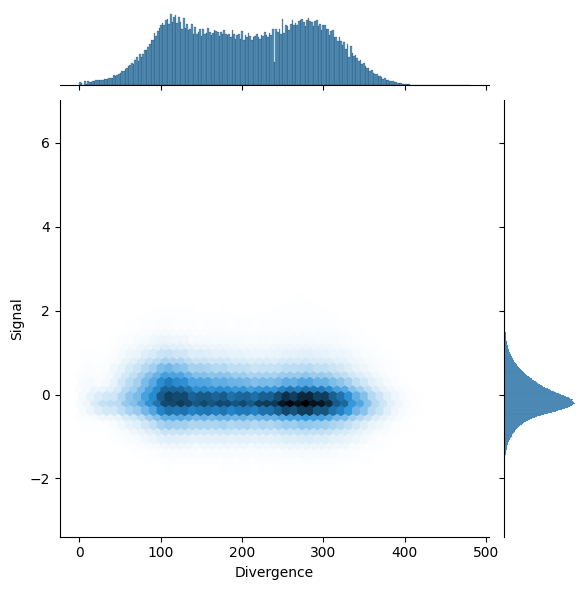

In [37]:
sns.jointplot(data=sample_enrichment, x="Divergence", y="Signal", kind="hex")

### Good plot of Signal vs Divergence correlation by classes of TE

In [10]:
sample_enrichment

,Chromosome,Start,End,Divergence,Name,Family,Class,Signal
0,chr1,0,7536,223,L1MC3,L1,LINE,0.915146
1,chr1,4082,4796,273,LTR60B,ERV1,LTR,2.283021
2,chr1,4082,4837,205,LTR60B,ERV1,LTR,2.283021
3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,-0.506971
4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,-0.157703
...,...,...,...,...,...,...,...,...
3303650,chr17,68277913,68278255,182,MER58B,hAT-Charlie,DNA,-0.224869
3303651,chr17,68278542,68278854,117,AluSx1,Alu,SINE,-0.990039
3303652,chr17,68278996,68279120,163,FLAM_C,Alu,SINE,-0.281071
3303653,chr17,68279432,68279961,262,MIRb,MIR,SINE,-0.258490


LINE
LTR
SINE
DNA
Retroposon
RC


/tmp/ipykernel_2243/1648285916.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  figure.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust rect to make space for suptitle


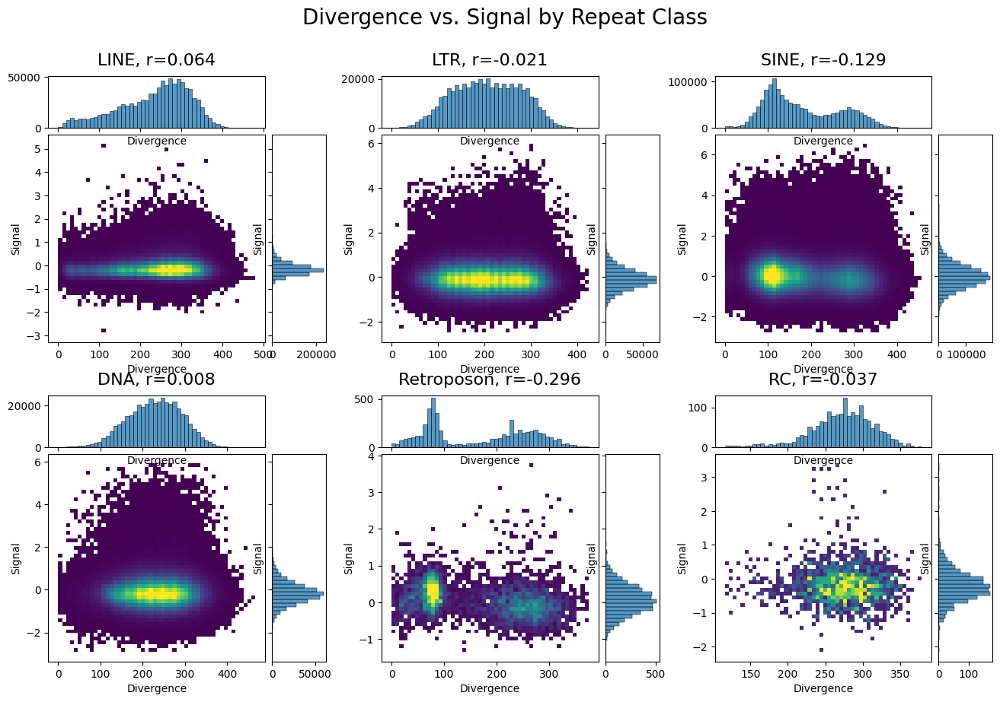

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

# --- Main Plotting Logic ---
figure = plt.figure(figsize=(16, 10))
# Create the main 2x3 grid for the entire figure
outer_grid = GridSpec(2, 3, figure=figure, wspace=0.2, hspace=0.2)
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

for i, class_name in enumerate(class_names):
    print(class_name)
    # For each cell in the outer grid, create a nested GridSpec for the jointplot
    inner_grid = GridSpecFromSubplotSpec(
        2,
        2,
        subplot_spec=outer_grid[i],
        width_ratios=[4, 1],
        height_ratios=[1, 4],
        wspace=0.05,
        hspace=0.05,
    )

    # Create the axes for the main plot and the two marginal plots
    ax_main = figure.add_subplot(inner_grid[1, 0])
    ax_hist_x = figure.add_subplot(inner_grid[0, 0], sharex=ax_main)
    ax_hist_y = figure.add_subplot(inner_grid[1, 1], sharey=ax_main)

    # Filter the data for the current class
    query_local = f'Class == "{class_name}"'
    sample_enrichment_local = sample_enrichment.query(query_local)

    # --- Plot the data on the created axes ---
    # 1. Main hexbin plot (axes-level equivalent of jointplot's kind="hex")
    sns.histplot(
        data=sample_enrichment_local,
        x="Divergence",
        y="Signal",
        bins=50,
        pmax=0.9,
        cmap="viridis",
        ax=ax_main,
    )

    # 2. Top marginal histogram for 'Divergence'
    sns.histplot(data=sample_enrichment_local, x="Divergence", ax=ax_hist_x, bins=50)

    # 3. Right marginal histogram for 'Signal'
    sns.histplot(data=sample_enrichment_local, y="Signal", ax=ax_hist_y, bins=50)

    # --- Tidy up the plot ---
    # Remove ticks and labels from the marginal plots for a cleaner look
    ax_hist_x.tick_params(axis="x", labelbottom=False)
    ax_hist_x.tick_params(axis="y", labelbottom=False)
    ax_hist_x.set_ylabel("")
    ax_hist_y.tick_params(axis="y", labelleft=False)
    ax_hist_y.tick_params(axis="x", labelleft=False)
    ax_hist_y.set_xlabel("")

    corr_coef = np.corrcoef(
        sample_enrichment_local.dropna()["Divergence"],
        sample_enrichment_local.dropna()["Signal"],
    )[0, 1]
    corr_coef = str(round(corr_coef, 3))

    # Set the title for this entire "jointplot" cell
    ax_hist_x.set_title(class_name + f", r={corr_coef}", fontsize=16, pad=10)

# Adjust layout to prevent labels from overlapping
plt.suptitle("Divergence vs. Signal by Repeat Class", fontsize=20, y=0.97)
figure.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust rect to make space for suptitle

# Save the final figure
# plt.savefig("plots/Divergence_vs_Signal_grid.svg")
plt.show()

Plotting: LINE (Row 0, Col 0)
Plotting: LTR (Row 0, Col 1)
Plotting: SINE (Row 0, Col 2)
Plotting: DNA (Row 1, Col 0)
Plotting: Retroposon (Row 1, Col 1)
Plotting: RC (Row 1, Col 2)


/tmp/ipykernel_143/3016580181.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  figure.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect to make space for suptitle


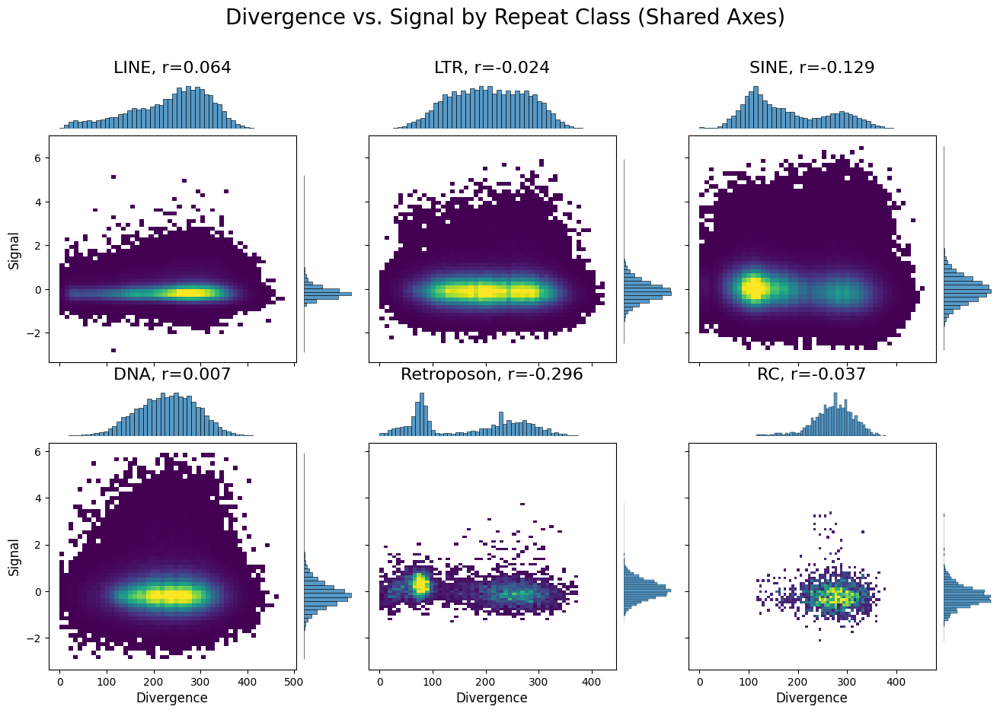

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

# --- Main Plotting Logic ---
figure = plt.figure(figsize=(16, 10))
class_names_grid = np.array(class_names).reshape((2, 3))

# Create the main 2x3 grid for the entire figure
outer_grid = GridSpec(2, 3, figure=figure, wspace=0.05, hspace=0.1)

# --- Store references to the first axis in each row/column ---
shared_x_axes = [None] * 3  # One for each column
shared_y_axes = [None] * 2  # One for each row

for r in range(2):
    for c in range(3):
        class_name = class_names_grid[r, c]
        print(f"Plotting: {class_name} (Row {r}, Col {c})")

        # For each cell in the outer grid, create a nested GridSpec
        inner_grid = GridSpecFromSubplotSpec(
            2,
            2,
            subplot_spec=outer_grid[r, c],
            width_ratios=[5, 1],
            height_ratios=[1, 5],
            wspace=0.05,
            hspace=0.05,
        )

        # --- Create axes with sharing logic ---
        ax_main = figure.add_subplot(
            inner_grid[1, 0], sharex=shared_x_axes[c], sharey=shared_y_axes[r]
        )
        ax_hist_x = figure.add_subplot(inner_grid[0, 0], sharex=ax_main)
        ax_hist_y = figure.add_subplot(inner_grid[1, 1], sharey=ax_main)

        # --- Store the first axis of each row/col as reference ---
        if r == 0:
            shared_x_axes[c] = ax_main
        if c == 0:
            shared_y_axes[r] = ax_main

        # Filter the data for the current class
        query_local = f'Class == "{class_name}"'
        sample_enrichment_local = sample_enrichment.query(query_local)

        # --- Plot the data ---
        sns.histplot(
            data=sample_enrichment_local,
            x="Divergence",
            y="Signal",
            bins=48,
            pmax=0.9,
            cmap="viridis",
            ax=ax_main,
        )
        sns.histplot(
            data=sample_enrichment_local, x="Divergence", ax=ax_hist_x, bins=50
        )
        sns.histplot(data=sample_enrichment_local, y="Signal", ax=ax_hist_y, bins=50)

        # --- START: MODIFIED TIDY-UP BLOCK ---
        # Tidy up: Remove all ticks, labels, and borders from marginal plots

        # Top histogram (ax_hist_x)
        ax_hist_x.set_ylabel("")
        ax_hist_x.set_xlabel("")
        ax_hist_x.tick_params(
            axis="both", bottom=False, left=False, labelbottom=False, labelleft=False
        )
        for spine in ax_hist_x.spines.values():
            spine.set_visible(False)

        # Right histogram (ax_hist_y)
        ax_hist_y.set_xlabel("")
        ax_hist_y.set_ylabel("")
        ax_hist_y.tick_params(
            axis="both", bottom=False, left=False, labelbottom=False, labelleft=False
        )
        for spine in ax_hist_y.spines.values():
            spine.set_visible(False)
        # --- END: MODIFIED TIDY-UP BLOCK ---

        # --- Tidy up: Main plot ticks/labels (for shared axes) ---
        if c > 0:  # Not in the first column
            ax_main.tick_params(axis="y", labelleft=False)
            ax_main.set_ylabel("")
        else:
            ax_main.set_ylabel("Signal", fontsize=12)  # Only show Y label on first col

        if r < 1:  # Not in the bottom row
            ax_main.tick_params(axis="x", labelbottom=False)
            ax_main.set_xlabel("")
        else:
            ax_main.set_xlabel(
                "Divergence", fontsize=12
            )  # Only show X label on bottom row

        # Calculate correlation
        clean_data = sample_enrichment_local.dropna(subset=["Divergence", "Signal"])
        if len(clean_data) > 1:
            corr_coef = np.corrcoef(clean_data["Divergence"], clean_data["Signal"])[
                0, 1
            ]
            corr_str = f"r={corr_coef:.3f}"
        else:
            corr_str = "r=N/A"

        # Set the title for this "jointplot" cell
        ax_hist_x.set_title(f"{class_name}, {corr_str}", fontsize=16, pad=10)

# Adjust layout to prevent labels from overlapping
plt.suptitle("Divergence vs. Signal by Repeat Class (Shared Axes)", fontsize=20, y=0.98)
figure.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust rect to make space for suptitle

# Save the final figure
# plt.savefig("plots/Divergence_vs_Signal_grid_shared_axes.svg")
plt.show()

## Build distplots of the TE mapping by modification and cell line

INFO: Starting batch plot generation for the 39 plots...


Processing Cell Lines:   0%|          | 0/12 [00:00<?, ?it/s]
                                                             
Processing Cell Lines:   0%|          | 0/12 [00:00<?, ?it/s]
                                                             
Processing Cell Lines:   0%|          | 0/12 [00:00<?, ?it/s]
                                                             
ods for Caco-2:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/Caco-2.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/Caco-2.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/Caco-2.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                             it]
ods for Caco-2:  43%|████▎     | 3/7 [00:04<00:06,  1.65s/it]

  -> Loading data from: ./epigenomic_files/Caco-2.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                             it]
Processing Cell Lines:   0%|          | 0/12 [00:14<?, ?it/s]   
                                                             it]
Processing Cell Lines:   0%|          | 0/12 [00:14<?, ?it/s]   
                                                             it]
Processing Cell Lines:   8%|▊         | 1/12 [00:14<02:37, 14.29s/it]

  -> Loading data from: ./epigenomic_files/Caco-2.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/Caco-2.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/Caco-2.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:   8%|▊         | 1/12 [00:14<02:37, 14.29s/it]
                                                                     
ods for SJCRH30:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/SJCRH30.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/SJCRH30.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

                                                                     
ods for SJCRH30:  29%|██▊       | 2/7 [00:09<00:23,  4.64s/it]

  -> Loading data from: ./epigenomic_files/SJCRH30.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

                                                                     
ods for SJCRH30:  43%|████▎     | 3/7 [00:18<00:26,  6.60s/it]

  -> Loading data from: ./epigenomic_files/SJCRH30.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

                                                                     
ods for SJCRH30:  57%|█████▋    | 4/7 [00:27<00:22,  7.60s/it]

  -> Loading data from: ./epigenomic_files/SJCRH30.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

                                                                     
ods for SJCRH30:  71%|███████▏  | 5/7 [00:37<00:16,  8.21s/it]

  -> Loading data from: ./epigenomic_files/SJCRH30.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

                                                                     
ods for SJCRH30:  86%|████████▌ | 6/7 [00:46<00:08,  8.60s/it]

  -> Loading data from: ./epigenomic_files/SJCRH30.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

Processing Cell Lines:  17%|█▋        | 2/12 [01:10<06:28, 38.80s/it]
                                                                     
Processing Cell Lines:  17%|█▋        | 2/12 [01:10<06:28, 38.80s/it]
                                                                     
Processing Cell Lines:  17%|█▋        | 2/12 [01:10<06:28, 38.80s/it]
                                                                     
ods for BE2C:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/BE2C.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/BE2C.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/BE2C.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for BE2C:  43%|████▎     | 3/7 [00:09<00:12,  3.07s/it]

  -> Loading data from: ./epigenomic_files/BE2C.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for BE2C:  57%|█████▋    | 4/7 [00:18<00:15,  5.04s/it]

  -> Loading data from: ./epigenomic_files/BE2C.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for BE2C:  71%|███████▏  | 5/7 [00:27<00:12,  6.37s/it]

  -> Loading data from: ./epigenomic_files/BE2C.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:  25%|██▌       | 3/12 [01:47<05:41, 37.96s/it]

  -> Loading data from: ./epigenomic_files/BE2C.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:  25%|██▌       | 3/12 [01:47<05:41, 37.96s/it]
                                                                     
ods for SJSA1:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/SJSA1.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/SJSA1.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:  25%|██▌       | 3/12 [01:56<05:41, 37.96s/it]
                                                                     
ods for SJSA1:  29%|██▊       | 2/7 [00:09<00:23,  4.73s/it]

  -> Loading data from: ./epigenomic_files/SJSA1.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/SJSA1.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for SJSA1:  57%|█████▋    | 4/7 [00:18<00:14,  4.69s/it]

  -> Loading data from: ./epigenomic_files/SJSA1.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for SJSA1:  71%|███████▏  | 5/7 [00:28<00:12,  6.08s/it]

  -> Loading data from: ./epigenomic_files/SJSA1.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for SJSA1:  86%|████████▌ | 6/7 [00:37<00:07,  7.05s/it]

  -> Loading data from: ./epigenomic_files/SJSA1.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



Processing Cell Lines:  33%|███▎      | 4/12 [02:34<05:32, 41.50s/it]
                                                                     
Processing Cell Lines:  33%|███▎      | 4/12 [02:34<05:32, 41.50s/it]
                                                                     
ods for HAP-1:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/HAP-1.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/HAP-1.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for HAP-1:  29%|██▊       | 2/7 [00:09<00:23,  4.66s/it]

  -> Loading data from: ./epigenomic_files/HAP-1.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for HAP-1:  43%|████▎     | 3/7 [00:18<00:26,  6.56s/it]

  -> Loading data from: ./epigenomic_files/HAP-1.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for HAP-1:  57%|█████▋    | 4/7 [00:27<00:22,  7.64s/it]

  -> Loading data from: ./epigenomic_files/HAP-1.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for HAP-1:  71%|███████▏  | 5/7 [00:36<00:16,  8.07s/it]

  -> Loading data from: ./epigenomic_files/HAP-1.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for HAP-1:  86%|████████▌ | 6/7 [00:45<00:08,  8.30s/it]

  -> Loading data from: ./epigenomic_files/HAP-1.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



Processing Cell Lines:  42%|████▏     | 5/12 [03:28<05:23, 46.18s/it]
                                                                     
Processing Cell Lines:  42%|████▏     | 5/12 [03:28<05:23, 46.18s/it]
                                                                     
ods for HL-60:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/HL-60.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/HL-60.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:  42%|████▏     | 5/12 [03:37<05:23, 46.18s/it]
                                                                     
Processing Cell Lines:  42%|████▏     | 5/12 [03:37<05:23, 46.18s/it]
                                                                     
Processing Cell Lines:  42%|████▏     | 5/12 [03:37<05:23, 46.18s/it]
                                                                     
Processing Cell Lines:  42%|████▏     | 5/12 [03:37<05:23, 46.18s/it]
                                                                     
Processing Cell Lines:  50%|█████     | 6/12 [03:37<03:20, 33.49s/it]

  -> Loading data from: ./epigenomic_files/HL-60.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/HL-60.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/HL-60.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/HL-60.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/HL-60.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:  50%|█████     | 6/12 [03:37<03:20, 33.49s/it]
                                                                     
Processing Cell Lines:  50%|█████     | 6/12 [03:37<03:20, 33.49s/it]
                                                                     
Processing Cell Lines:  50%|█████     | 6/12 [03:37<03:20, 33.49s/it]
                                                                     
ods for MG63:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/MG63.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/MG63.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/MG63.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/MG63.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

                                                                     
ods for MG63:  57%|█████▋    | 4/7 [00:08<00:06,  2.21s/it]

  -> Loading data from: ./epigenomic_files/MG63.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for MG63:  71%|███████▏  | 5/7 [00:17<00:07,  3.97s/it]

  -> Loading data from: ./epigenomic_files/MG63.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for MG63:  86%|████████▌ | 6/7 [00:26<00:05,  5.33s/it]

  -> Loading data from: ./epigenomic_files/MG63.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



Processing Cell Lines:  58%|█████▊    | 7/12 [04:13<02:51, 34.26s/it]
                                                                     
ods for VCaP:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/VCaP.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for VCaP:  14%|█▍        | 1/7 [00:09<00:55,  9.17s/it]

  -> Loading data from: ./epigenomic_files/VCaP.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

                                                                     
Processing Cell Lines:  58%|█████▊    | 7/12 [04:31<02:51, 34.26s/it]
                                                                     
Processing Cell Lines:  58%|█████▊    | 7/12 [04:31<02:51, 34.26s/it]
                                                                     
Processing Cell Lines:  58%|█████▊    | 7/12 [04:31<02:51, 34.26s/it]
                                                                     
Processing Cell Lines:  58%|█████▊    | 7/12 [04:31<02:51, 34.26s/it]
                                                                     
Processing Cell Lines:  67%|██████▋   | 8/12 [04:31<01:56, 29.20s/it]

  -> Loading data from: ./epigenomic_files/VCaP.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/VCaP.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/VCaP.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/VCaP.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/VCaP.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for C4-2B:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/C4-2B.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for C4-2B:  14%|█▍        | 1/7 [00:09<00:54,  9.16s/it]

  -> Loading data from: ./epigenomic_files/C4-2B.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:  67%|██████▋   | 8/12 [04:49<01:56, 29.20s/it]
                                                                     
Processing Cell Lines:  67%|██████▋   | 8/12 [04:49<01:56, 29.20s/it]
                                                                     
Processing Cell Lines:  67%|██████▋   | 8/12 [04:49<01:56, 29.20s/it]
                                                                     
Processing Cell Lines:  67%|██████▋   | 8/12 [04:49<01:56, 29.20s/it]
                                                                     
Processing Cell Lines:  75%|███████▌  | 9/12 [04:49<01:17, 25.79s/it]

  -> Loading data from: ./epigenomic_files/C4-2B.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/C4-2B.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/C4-2B.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/C4-2B.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/C4-2B.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for RWPE2:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/RWPE2.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
ods for RWPE2:  14%|█▍        | 1/7 [00:09<00:55,  9.21s/it]

  -> Loading data from: ./epigenomic_files/RWPE2.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:  75%|███████▌  | 9/12 [05:08<01:17, 25.79s/it]
                                                                     
Processing Cell Lines:  75%|███████▌  | 9/12 [05:08<01:17, 25.79s/it]
                                                                     
ods for RWPE2:  29%|██▊       | 2/7 [00:18<00:46,  9.20s/it]

  -> Loading data from: ./epigenomic_files/RWPE2.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/RWPE2.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/RWPE2.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                     
Processing Cell Lines:  75%|███████▌  | 9/12 [05:17<01:17, 25.79s/it]
                                                                     
Processing Cell Lines:  83%|████████▎ | 10/12 [05:17<00:52, 26.41s/it]

  -> Loading data from: ./epigenomic_files/RWPE2.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/RWPE2.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                      
ods for 22Rv1:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/22Rv1.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                      
ods for 22Rv1:  14%|█▍        | 1/7 [00:09<00:56,  9.37s/it]

  -> Loading data from: ./epigenomic_files/22Rv1.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                      
Processing Cell Lines:  83%|████████▎ | 10/12 [05:36<00:52, 26.41s/it]
                                                                      
Processing Cell Lines:  83%|████████▎ | 10/12 [05:36<00:52, 26.41s/it]
                                                                      
Processing Cell Lines:  83%|████████▎ | 10/12 [05:36<00:52, 26.41s/it]
                                                                      
Processing Cell Lines:  83%|████████▎ | 10/12 [05:36<00:52, 26.41s/it]
                                                                      
Processing Cell Lines:  92%|█████████▏| 11/12 [05:36<00:24, 24.07s/it]

  -> Loading data from: ./epigenomic_files/22Rv1.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/22Rv1.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/22Rv1.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/22Rv1.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/22Rv1.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                      
ods for RWPE1:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/RWPE1.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_167/1843603136.py:96: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(

                                                                      
ods for RWPE1:  14%|█▍        | 1/7 [00:09<00:55,  9.28s/it]

  -> Loading data from: ./epigenomic_files/RWPE1.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph



                                                                      
Processing Cell Lines:  92%|█████████▏| 11/12 [05:50<00:24, 24.07s/it]
                                                                      
Processing Cell Lines:  92%|█████████▏| 11/12 [05:50<00:24, 24.07s/it]
                                                                      
Processing Cell Lines:  92%|█████████▏| 11/12 [05:50<00:24, 24.07s/it]
                                                                      
Processing Cell Lines:  92%|█████████▏| 11/12 [05:50<00:24, 24.07s/it]
                                                                      
Processing Cell Lines: 100%|██████████| 12/12 [05:50<00:00, 29.20s/it]


  -> Loading data from: ./epigenomic_files/RWPE1.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/RWPE1.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/RWPE1.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/RWPE1.H3K27me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/RWPE1.H3K4me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
SUCCESS: All plots saved.


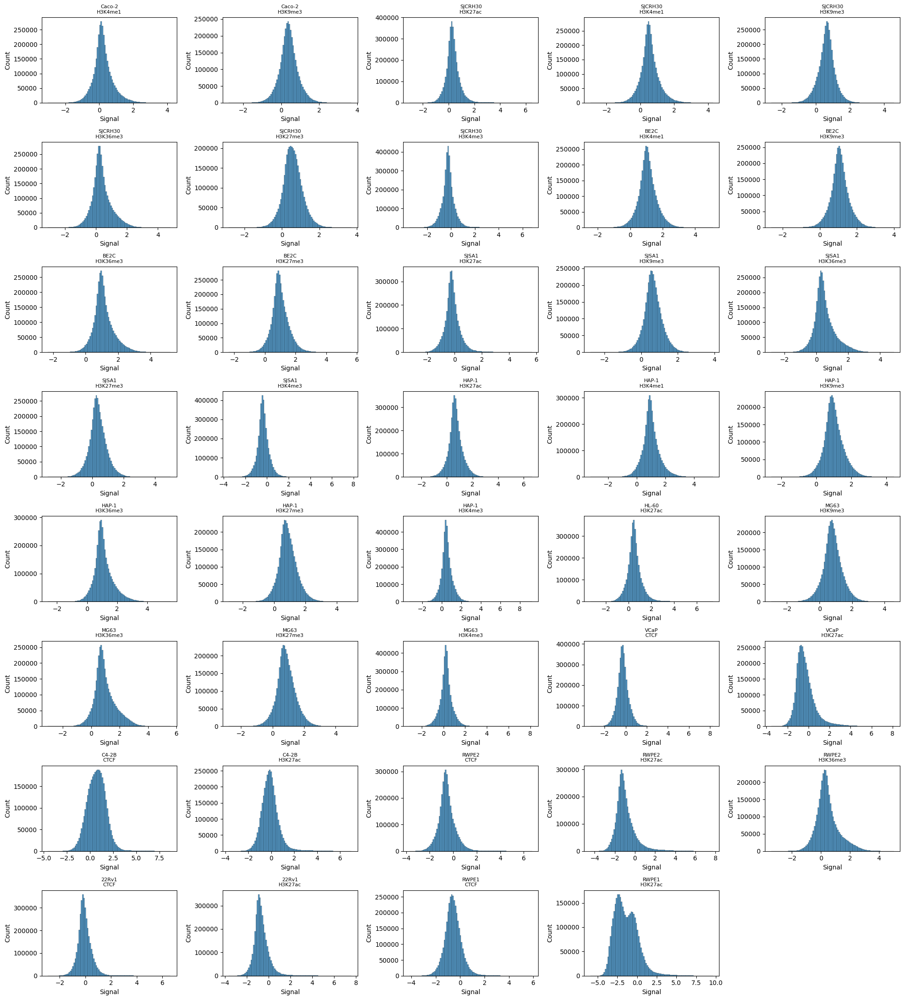

In [58]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm  # For progress bars

# Removed unused imports: GridSpec, GridSpecFromSubplotSpec

plt.rcParams["svg.fonttype"] = "none"


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        # Use tqdm.write() to print from within a loop
        tqdm.write(f"  -> {message}")


cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K27ac",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
    # "H3K27ac",
]
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]


figure, axs = plt.subplots(
    nrows=8,
    ncols=5,
    sharex=False,
    sharey=False,
    squeeze=True,
    figsize=(20, 24),  # Adjusted figsize for the larger grid
)

# --- CORRECTED: Create an iterator from the flattened axes list ---
axes_iter = iter(axs.flatten())

# --- Main Script ---
Logger.info(f"Starting batch plot generation for the 39 plots...")
correlation_df_list = []
# Use tqdm for the outer loop progress bar
for cell_line in tqdm(cell_lines, desc="Processing Cell Lines"):

    # Use a nested tqdm for the inner loop
    for modification in tqdm(
        modifications, desc=f"  Mods for {cell_line}", leave=False
    ):

        filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
        # --- Data Loading ---
        # Use Logger.step (which uses tqdm.write) for in-loop logging
        Logger.step(f"Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            # Logger.success("File loaded successfully.") # Too noisy for a loop
        except FileNotFoundError:
            Logger.warning(f"File not found, skipping: {filepath}")
            continue  # Skip to the next modification
        except Exception as e:
            Logger.warning(
                f"An unexpected error occurred while reading {filepath}: {e}"
            )
            continue

        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )

        # --- CORRECTED: Indentation and Iterator ---
        # Get the next available axis
        try:
            ax = next(axes_iter)
        except StopIteration:
            # This should not happen if grid is sized correctly, but it's safe
            Logger.warning("Ran out of axes, stopping early.")
            break

        # Use sns.histplot (axes-level)
        sns.histplot(sample_enrichment["Signal"].dropna(), ax=ax, bins=100)

        # --- CORRECTED: Use the correct variables for the title ---
        ax.set_title(f"{cell_line}\n{modification}", fontsize=8)

# Clean up any remaining empty axes at the end
# This loop will turn off axes that were never used
while True:
    try:
        ax = next(axes_iter)
        ax.axis("off")
    except StopIteration:
        break

figure.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("plots/Signal_distribution_all_samples.svg")
Logger.success("All plots saved.")
plt.show()

## Build good plots for all marks and cell lines and record pearson correlation coefficient

In [18]:
cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
    "H3K27ac",
]
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

In [ ]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from tqdm import tqdm  # For progress bars

plt.rcParams["svg.fonttype"] = "none"


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        print(f"  -> {message}")


cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K27ac",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
    #    "H3K27ac",
]
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

# --- Main Script ---
Logger.info("Starting batch plot generation...")
correlation_df_list = []
# Use tqdm for the outer loop progress bar
for cell_line in tqdm(cell_lines, desc="Processing Cell Lines"):

    # Use a nested tqdm for the inner loop
    for modification in tqdm(
        modifications, desc=f"  Mods for {cell_line}", leave=False
    ):

        filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
        save_path_png = f"plots/Epigenetic_signal_vs_divergence_by_class/Divergence_vs_Signal_by_classes_{cell_line}_{modification}_tidy.png"
        save_path_svg = f"plots/Epigenetic_signal_vs_divergence_by_class/Divergence_vs_Signal_by_classes_{cell_line}_{modification}_tidy.svg"
        # --- Data Loading ---
        Logger.step(f"Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            Logger.success("File loaded successfully.")
        except FileNotFoundError:
            Logger.warning(f"File not found, skipping: {filepath}")
            continue  # Skip to the next modification
        except Exception as e:
            Logger.warning(
                f"An unexpected error occurred while reading {filepath}: {e}"
            )
            continue

        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            sample_enrichment["Divergence"], errors="coerce"
        )

        # --- Main Plotting Logic ---
        Logger.step("Generating jointplot grid...")
        correlations = {"cell_line": cell_line, "modification": modification}
        figure = plt.figure(figsize=(16, 10))
        class_names_grid = np.array(class_names).reshape((2, 3))

        # Create the main 2x3 grid for the entire figure
        outer_grid = GridSpec(2, 3, figure=figure, wspace=0.1, hspace=0.1)

        # --- Store references to the first axis in each row/column ---
        shared_x_axes = [None] * 3  # One for each column
        shared_y_axes = [None] * 2  # One for each row

        for r in range(2):
            for c in range(3):
                class_name = class_names_grid[r, c]
                tqdm.write(f"Plotting: {class_name} (Row {r}, Col {c})")

                # For each cell in the outer grid, create a nested GridSpec
                inner_grid = GridSpecFromSubplotSpec(
                    2,
                    2,
                    subplot_spec=outer_grid[r, c],
                    width_ratios=[5, 1],
                    height_ratios=[1, 5],
                    wspace=0.05,
                    hspace=0.05,
                )

                # --- Create axes with sharing logic ---
                ax_main = figure.add_subplot(
                    inner_grid[1, 0], sharex=shared_x_axes[c], sharey=shared_y_axes[r]
                )
                ax_hist_x = figure.add_subplot(inner_grid[0, 0], sharex=ax_main)
                ax_hist_y = figure.add_subplot(inner_grid[1, 1], sharey=ax_main)

                # --- Store the first axis of each row/col as reference ---
                if r == 0:
                    shared_x_axes[c] = ax_main
                if c == 0:
                    shared_y_axes[r] = ax_main

                # Filter the data for the current class
                query_local = f'Class == "{class_name}"'
                sample_enrichment_local = sample_enrichment.query(query_local)

                # --- Plot the data ---
                sns.histplot(
                    data=sample_enrichment_local,
                    x="Divergence",
                    y="Signal",
                    bins=48,
                    pmax=0.9,
                    cmap="viridis",
                    ax=ax_main,
                )
                sns.histplot(
                    data=sample_enrichment_local, x="Divergence", ax=ax_hist_x, bins=50
                )
                sns.histplot(
                    data=sample_enrichment_local, y="Signal", ax=ax_hist_y, bins=50
                )

                # --- START: MODIFIED TIDY-UP BLOCK ---
                # Tidy up: Remove all ticks, labels, and borders from marginal plots

                # Top histogram (ax_hist_x)
                ax_hist_x.set_ylabel("")
                ax_hist_x.set_xlabel("")
                ax_hist_x.tick_params(
                    axis="both",
                    bottom=False,
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                )
                for spine in ax_hist_x.spines.values():
                    spine.set_visible(False)

                # Right histogram (ax_hist_y)
                ax_hist_y.set_xlabel("")
                ax_hist_y.set_ylabel("")
                ax_hist_y.tick_params(
                    axis="both",
                    bottom=False,
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                )
                for spine in ax_hist_y.spines.values():
                    spine.set_visible(False)
                # --- END: MODIFIED TIDY-UP BLOCK ---

                # --- Tidy up: Main plot ticks/labels (for shared axes) ---
                if c > 0:  # Not in the first column
                    ax_main.tick_params(axis="y", labelleft=False)
                    ax_main.set_ylabel("")
                else:
                    ax_main.set_ylabel(
                        "Signal", fontsize=12
                    )  # Only show Y label on first col

                if r < 1:  # Not in the bottom row
                    ax_main.tick_params(axis="x", labelbottom=False)
                    ax_main.set_xlabel("")
                else:
                    ax_main.set_xlabel(
                        "Divergence", fontsize=12
                    )  # Only show X label on bottom row

                # Calculate correlation
                clean_data = sample_enrichment_local.dropna(
                    subset=["Divergence", "Signal"]
                )
                if len(clean_data) > 1:
                    corr_coef = np.corrcoef(
                        clean_data["Divergence"], clean_data["Signal"]
                    )[0, 1]
                    corr_str = f"r={corr_coef:.3f}"
                else:
                    corr_str = "r=N/A"

                # Set the title for this "jointplot" cell
                ax_hist_x.set_title(f"{class_name}, {corr_str}", fontsize=16, pad=10)
                correlations.update({class_name: corr_coef})

        correlation_df_list.append(pd.Series(correlations))

        # Final figure adjustments
        figure.suptitle(
            f"Divergence vs. Signal for {cell_line} - {modification}",
            fontsize=20,
            y=0.98,
        )
        figure.tight_layout(rect=[0, 0.03, 1, 0.95])

        # Save the final figure
        Logger.step(f"Saving plot to: {save_path_png}")
        # Ensure the directory exists
        os.makedirs(os.path.dirname(save_path_png), exist_ok=True)
        plt.savefig(save_path_png)
        plt.savefig(save_path_svg)
        plt.close(figure)  # IMPORTANT: Close the figure to free up memory
        Logger.success("Plot saved.")
# correlation_df = pd.concat(correlation_df_list)
# correlation_df.to_csv('Signal_vs_divergence_correlation_by_lines_mods_classes.csv')
Logger.info("All processing complete!")

### Record coefficient correlation by TE class, cell line and epigenetic modality with plots

In [ ]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from scipy import stats
from tqdm import tqdm  # For progress bars

GLOBAL_FONT_SIZE = 7.5


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        print(f"  -> {message}")


repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)

cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
    "H3K27ac",
]
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

# --- Main Script ---
Logger.info("Starting batch plot generation...")
correlation_df_list = []
# Use tqdm for the outer loop progress bar
for cell_line in tqdm(cell_lines, desc="Processing Cell Lines"):

    # Use a nested tqdm for the inner loop
    for modification in tqdm(
        modifications, desc=f"  Mods for {cell_line}", leave=False
    ):

        filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
        save_path_png = f"plots/Epigenetic_signal_vs_divergence_by_class/Divergence_vs_Signal_by_classes_{cell_line}_{modification}_spearman_true.png"
        save_path_svg = f"plots/Epigenetic_signal_vs_divergence_by_class/Divergence_vs_Signal_by_classes_{cell_line}_{modification}_spearman_true.svg"
        # --- Data Loading ---
        Logger.step(f"Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            Logger.success("File loaded successfully.")
        except FileNotFoundError:
            Logger.warning(f"File not found, skipping: {filepath}")
            continue  # Skip to the next modification
        except Exception as e:
            Logger.warning(
                f"An unexpected error occurred while reading {filepath}: {e}"
            )
            continue

        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            repeat_masker_average_true_div["kimura_divCpGMod_weighted_average"],
            errors="coerce",
        )

        # --- Main Plotting Logic ---
        Logger.step("Generating jointplot grid...")
        # --- Main Plotting Logic ---
        figure = plt.figure(figsize=(16, 10))
        class_names_grid = np.array(class_names).reshape((2, 3))

        # Create the main 2x3 grid for the entire figure
        outer_grid = GridSpec(2, 3, figure=figure, wspace=0.1, hspace=0.1)

        # --- Store references to the first axis in each row/column ---
        shared_x_axes = [None] * 3  # One for each column
        shared_y_axes = [None] * 2  # One for each row

        for r in range(2):
            for c in range(3):
                class_name = class_names_grid[r, c]
                print(f"Plotting: {class_name} (Row {r}, Col {c})")

                # For each cell in the outer grid, create a nested GridSpec
                inner_grid = GridSpecFromSubplotSpec(
                    2,
                    2,
                    subplot_spec=outer_grid[r, c],
                    width_ratios=[5, 1],
                    height_ratios=[1, 5],
                    wspace=0.05,
                    hspace=0.05,
                )

                # --- Create axes with sharing logic ---
                ax_main = figure.add_subplot(
                    inner_grid[1, 0], sharex=shared_x_axes[c], sharey=shared_y_axes[r]
                )
                ax_hist_x = figure.add_subplot(inner_grid[0, 0], sharex=ax_main)
                ax_hist_y = figure.add_subplot(inner_grid[1, 1], sharey=ax_main)

                # --- Store the first axis of each row/col as reference ---
                if r == 0:
                    shared_x_axes[c] = ax_main
                if c == 0:
                    shared_y_axes[r] = ax_main

                # Filter the data for the current class
                query_local = f'Class == "{class_name}"'
                sample_enrichment_local = sample_enrichment.query(query_local)

                # --- Plot the data ---
                sns.histplot(
                    data=sample_enrichment_local,
                    x="Divergence",
                    y="Signal",
                    bins=48,
                    pmax=0.9,
                    cmap="viridis",
                    ax=ax_main,
                )
                sns.histplot(
                    data=sample_enrichment_local, x="Divergence", ax=ax_hist_x, bins=50
                )
                sns.histplot(
                    data=sample_enrichment_local, y="Signal", ax=ax_hist_y, bins=50
                )

                # --- START: MODIFIED TIDY-UP BLOCK ---
                # Tidy up: Remove all ticks, labels, and borders from marginal plots

                # Top histogram (ax_hist_x)
                ax_hist_x.set_ylabel("")
                ax_hist_x.set_xlabel("")
                ax_hist_x.tick_params(
                    axis="both",
                    bottom=False,
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                )
                for spine in ax_hist_x.spines.values():
                    spine.set_visible(False)

                # Right histogram (ax_hist_y)
                ax_hist_y.set_xlabel("")
                ax_hist_y.set_ylabel("")
                ax_hist_y.tick_params(
                    axis="both",
                    bottom=False,
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                )
                for spine in ax_hist_y.spines.values():
                    spine.set_visible(False)
                # --- END: MODIFIED TIDY-UP BLOCK ---

                # --- Tidy up: Main plot ticks/labels (for shared axes) ---
                if c > 0:  # Not in the first column
                    ax_main.tick_params(axis="y", labelleft=False)
                    ax_main.set_ylabel("")
                else:
                    ax_main.set_ylabel(
                        "Signal", fontsize=GLOBAL_FONT_SIZE
                    )  # Only show Y label on first col
                    ax_main.tick_params(
                        axis="both", which="major", labelsize=GLOBAL_FONT_SIZE
                    )

                if r < 1:  # Not in the bottom row
                    ax_main.tick_params(axis="x", labelbottom=False)
                    ax_main.set_xlabel("")
                else:
                    ax_main.set_xlabel(
                        "Divergence", fontsize=GLOBAL_FONT_SIZE
                    )  # Only show X label on bottom row

                    # Tick Labels (X and Y)
                    ax_main.tick_params(
                        axis="both", which="major", labelsize=GLOBAL_FONT_SIZE
                    )

                # Calculate correlation
                clean_data = sample_enrichment_local.dropna(
                    subset=["Divergence", "Signal"]
                )
                if len(clean_data) > 1:
                    corr_coef = stats.spearmanr(
                        clean_data["Divergence"], clean_data["Signal"]
                    )[0]
                    corr_str = f"r={corr_coef:.3f}"
                else:
                    corr_str = "r=N/A"

                # Set the title for this "jointplot" cell
                ax_hist_x.set_title(
                    f"{class_name}, {corr_str}", fontsize=GLOBAL_FONT_SIZE, pad=10
                )

        # Adjust layout to prevent labels from overlapping
        plt.suptitle(
            "Divergence vs. Signal by Repeat Class (Shared Axes)",
            fontsize=GLOBAL_FONT_SIZE,
            y=0.98,
        )
        figure.tight_layout(
            rect=[0, 0.03, 1, 0.95]
        )  # Adjust rect to make space for suptitle

        # Save the final figure
        Logger.step(f"Saving plot to: {save_path_png}")
        # Ensure the directory exists
        os.makedirs(os.path.dirname(save_path_png), exist_ok=True)
        plt.savefig(save_path_png)
        plt.savefig(save_path_svg)
        plt.close(figure)  # IMPORTANT: Close the figure to free up memory
        Logger.success("Plot saved.")
correlation_df = pd.concat(correlation_df_list, axis=1)
correlation_df.to_csv(
    "Signal_vs_divergence_correlation_by_lines_mods_classes_spearman.csv"
)
Logger.info("All processing complete!")

    VCaP
        CTCF
        H3K4me1
        H3K9me3
        H3K36me3
        H3K27me3
        H3K4me3
        H3K27ac
    SJCRH30
        CTCF
        H3K4me1
        H3K9me3
        H3K36me3
        H3K27me3
        H3K4me3
        H3K27ac
    SJSA1
        CTCF
        H3K4me1
        H3K9me3
        H3K36me3
        H3K27me3
        H3K4me3
        H3K27ac
    HAP-1
        CTCF
        H3K4me1
        H3K9me3
        H3K36me3
        H3K27me3
        H3K4me3
        H3K27ac
    BE2C
        CTCF
        H3K4me1


In [12]:
        GLOBAL_FONT_SIZE = 7.5
        cell_line = 'RWPE1'
        modification = 'H3K27ac'
        repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)

        filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
        save_path_png = f"plots/Epigenetic_signal_vs_divergence_by_class/Divergence_vs_Signal_by_classes_{cell_line}_{modification}_spearman_true.png"
        save_path_svg = f"plots/Epigenetic_signal_vs_divergence_by_class/Divergence_vs_Signal_by_classes_{cell_line}_{modification}_spearman_true.svg"
        # --- Data Loading ---
        sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None)


        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            repeat_masker_average_true_div["kimura_divCpGMod_weighted_average"],
            errors="coerce",
        )

        # --- Main Plotting Logic ---

        # --- Main Plotting Logic ---
        figure = plt.figure(figsize=(9, 4))
        class_names_grid = np.array(class_names).reshape((2, 3))

        # Create the main 2x3 grid for the entire figure
        outer_grid = GridSpec(2, 3, figure=figure, wspace=0.1, hspace=0.1)

        # --- Store references to the first axis in each row/column ---
        shared_x_axes = [None] * 3  # One for each column
        shared_y_axes = [None] * 2  # One for each row

        for r in range(2):
            for c in range(3):
                class_name = class_names_grid[r, c]
                print(f"Plotting: {class_name} (Row {r}, Col {c})")

                # For each cell in the outer grid, create a nested GridSpec
                inner_grid = GridSpecFromSubplotSpec(
                    2,
                    2,
                    subplot_spec=outer_grid[r, c],
                    width_ratios=[5, 1],
                    height_ratios=[1, 5],
                    wspace=0.05,
                    hspace=0.05,
                )

                # --- Create axes with sharing logic ---
                ax_main = figure.add_subplot(
                    inner_grid[1, 0], sharex=shared_x_axes[c], sharey=shared_y_axes[r]
                )
                ax_hist_x = figure.add_subplot(inner_grid[0, 0], sharex=ax_main)
                ax_hist_y = figure.add_subplot(inner_grid[1, 1], sharey=ax_main)

                # --- Store the first axis of each row/col as reference ---
                if r == 0:
                    shared_x_axes[c] = ax_main
                if c == 0:
                    shared_y_axes[r] = ax_main

                # Filter the data for the current class
                query_local = f'Class == "{class_name}"'
                sample_enrichment_local = sample_enrichment.query(query_local)

                # --- Plot the data ---
                sns.histplot(
                    data=sample_enrichment_local,
                    x="Divergence",
                    y="Signal",
                    bins=48,
                    pmax=0.9,
                    cmap="viridis",
                    ax=ax_main,
                )
                sns.histplot(
                    data=sample_enrichment_local, x="Divergence", ax=ax_hist_x, bins=50
                )
                sns.histplot(
                    data=sample_enrichment_local, y="Signal", ax=ax_hist_y, bins=50
                )

                # --- START: MODIFIED TIDY-UP BLOCK ---
                # Tidy up: Remove all ticks, labels, and borders from marginal plots

                # Top histogram (ax_hist_x)
                ax_hist_x.set_ylabel("")
                ax_hist_x.set_xlabel("")
                ax_hist_x.tick_params(
                    axis="both",
                    bottom=False,
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                )
                for spine in ax_hist_x.spines.values():
                    spine.set_visible(False)

                # Right histogram (ax_hist_y)
                ax_hist_y.set_xlabel("")
                ax_hist_y.set_ylabel("")
                ax_hist_y.tick_params(
                    axis="both",
                    bottom=False,
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                )
                for spine in ax_hist_y.spines.values():
                    spine.set_visible(False)
                # --- END: MODIFIED TIDY-UP BLOCK ---

                # --- Tidy up: Main plot ticks/labels (for shared axes) ---
                if c > 0:  # Not in the first column
                    ax_main.tick_params(axis="y", labelleft=False)
                    ax_main.set_ylabel("")
                else:
                    ax_main.set_ylabel(
                        "Signal", fontsize=GLOBAL_FONT_SIZE
                    )  # Only show Y label on first col
                    ax_main.tick_params(
                        axis="both", which="major", labelsize=GLOBAL_FONT_SIZE
                    )

                if r < 1:  # Not in the bottom row
                    ax_main.tick_params(axis="x", labelbottom=False)
                    ax_main.set_xlabel("")
                else:
                    ax_main.set_xlabel(
                        "Divergence", fontsize=GLOBAL_FONT_SIZE
                    )  # Only show X label on bottom row

                    # Tick Labels (X and Y)
                    ax_main.tick_params(
                        axis="both", which="major", labelsize=GLOBAL_FONT_SIZE
                    )

                # Calculate correlation
                clean_data = sample_enrichment_local.dropna(
                    subset=["Divergence", "Signal"]
                )
                if len(clean_data) > 1:
                    corr_coef = stats.spearmanr(
                        clean_data["Divergence"], clean_data["Signal"]
                    )[0]
                    corr_str = f"r={corr_coef:.3f}"
                else:
                    corr_str = "r=N/A"

                # Set the title for this "jointplot" cell
                ax_hist_x.set_title(
                    f"{class_name}, {corr_str}", fontsize=GLOBAL_FONT_SIZE, pad=10
                )

        # Adjust layout to prevent labels from overlapping
        plt.suptitle(
            "Divergence vs. Signal by Repeat Class (Shared Axes)",
            fontsize=GLOBAL_FONT_SIZE,
            y=0.98,
        )
        figure.tight_layout(
            rect=[0, 0.03, 1, 0.95]
        )  # Adjust rect to make space for suptitle

        # Save the final figure
        # Ensure the directory exists
        os.makedirs(os.path.dirname(save_path_png), exist_ok=True)
        plt.savefig(save_path_png)
        plt.savefig(save_path_svg)
        plt.close(figure)  # IMPORTANT: Close the figure to free up memory

Plotting: LINE (Row 0, Col 0)
Plotting: LTR (Row 0, Col 1)
Plotting: SINE (Row 0, Col 2)
Plotting: DNA (Row 1, Col 0)
Plotting: Retroposon (Row 1, Col 1)
Plotting: RC (Row 1, Col 2)


/tmp/ipykernel_134/3072757287.py:177: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  figure.tight_layout(


#### Record correlation of signal with true div by classes, cut by divergence score

INFO: Starting batch plot generation...


ods for Caco-2:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/Caco-2.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/Caco-2.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
SUCCESS: File loaded successfully.
  -> Generating jointplot grid...
Plotting: LINE (Row 0, Col 0)



Processing Cell Lines:   0%|          | 0/12 [00:03<?, ?it/s]


TypeError: tuple indices must be integers or slices, not tuple

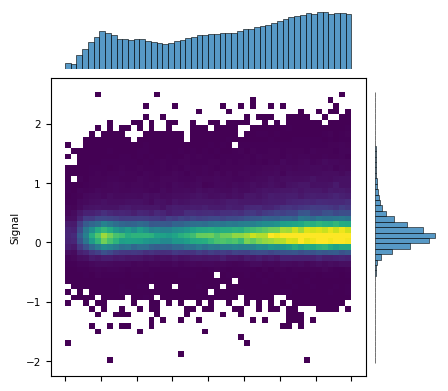

In [15]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from scipy import stats
from tqdm import tqdm  # For progress bars

DIV_THRESHOLD = 100

GLOBAL_FONT_SIZE = 7.5


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        print(f"  -> {message}")


repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)

cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
    "H3K27ac",
]
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

# --- Main Script ---
Logger.info("Starting batch plot generation...")
correlation_df_list = []
# Use tqdm for the outer loop progress bar
for cell_line in tqdm(cell_lines, desc="Processing Cell Lines"):

    # Use a nested tqdm for the inner loop
    for modification in tqdm(
        modifications, desc=f"  Mods for {cell_line}", leave=False
    ):

        filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
        save_path_png = f"plots/Epigenetic_signal_vs_divergence_by_class/Div_vs_Signal_by_classes_{cell_line}_{modification}_spearman_true_cut_{str(DIV_THRESHOLD)}.png"
        save_path_svg = f"plots/Epigenetic_signal_vs_divergence_by_class/Div_vs_Signal_by_classes_{cell_line}_{modification}_spearman_true_cut_{str(DIV_THRESHOLD)}.svg"
        # --- Data Loading ---
        Logger.step(f"Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            Logger.success("File loaded successfully.")
        except FileNotFoundError:
            Logger.warning(f"File not found, skipping: {filepath}")
            continue  # Skip to the next modification
        except Exception as e:
            Logger.warning(
                f"An unexpected error occurred while reading {filepath}: {e}"
            )
            continue

        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            repeat_masker_average_true_div["kimura_divCpGMod_weighted_average"],
            errors="coerce",
        )
        sample_enrichment = sample_enrichment[
            sample_enrichment["Divergence"] < DIV_THRESHOLD
        ]

        # --- Main Plotting Logic ---
        Logger.step("Generating jointplot grid...")
        # --- Main Plotting Logic ---
        figure = plt.figure(figsize=(10, 6))
        class_names_grid = np.array(class_names).reshape((2, 3))

        # Create the main 2x3 grid for the entire figure
        outer_grid = GridSpec(2, 3, figure=figure, wspace=0.1, hspace=0.1)

        # --- Store references to the first axis in each row/column ---
        shared_x_axes = [None] * 3  # One for each column
        shared_y_axes = [None] * 2  # One for each row
        correlations = {"cell_line": cell_line, "modification": modification}

        for r in range(2):
            for c in range(3):
                class_name = class_names_grid[r, c]
                print(f"Plotting: {class_name} (Row {r}, Col {c})")

                # For each cell in the outer grid, create a nested GridSpec
                inner_grid = GridSpecFromSubplotSpec(
                    2,
                    2,
                    subplot_spec=outer_grid[r, c],
                    width_ratios=[5, 1],
                    height_ratios=[1, 5],
                    wspace=0.05,
                    hspace=0.05,
                )

                # --- Create axes with sharing logic ---
                ax_main = figure.add_subplot(
                    inner_grid[1, 0], sharex=shared_x_axes[c], sharey=shared_y_axes[r]
                )
                ax_hist_x = figure.add_subplot(inner_grid[0, 0], sharex=ax_main)
                ax_hist_y = figure.add_subplot(inner_grid[1, 1], sharey=ax_main)

                # --- Store the first axis of each row/col as reference ---
                if r == 0:
                    shared_x_axes[c] = ax_main
                if c == 0:
                    shared_y_axes[r] = ax_main

                # Filter the data for the current class
                query_local = f'Class == "{class_name}"'
                sample_enrichment_local = sample_enrichment.query(query_local)

                # --- Plot the data ---
                sns.histplot(
                    data=sample_enrichment_local,
                    x="Divergence",
                    y="Signal",
                    bins=48,
                    pmax=0.9,
                    cmap="viridis",
                    ax=ax_main,
                )
                sns.histplot(
                    data=sample_enrichment_local, x="Divergence", ax=ax_hist_x, bins=50
                )
                sns.histplot(
                    data=sample_enrichment_local, y="Signal", ax=ax_hist_y, bins=50
                )

                # --- START: MODIFIED TIDY-UP BLOCK ---
                # Tidy up: Remove all ticks, labels, and borders from marginal plots

                # Top histogram (ax_hist_x)
                ax_hist_x.set_ylabel("")
                ax_hist_x.set_xlabel("")
                ax_hist_x.tick_params(
                    axis="both",
                    bottom=False,
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                )
                for spine in ax_hist_x.spines.values():
                    spine.set_visible(False)

                # Right histogram (ax_hist_y)
                ax_hist_y.set_xlabel("")
                ax_hist_y.set_ylabel("")
                ax_hist_y.tick_params(
                    axis="both",
                    bottom=False,
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                )
                for spine in ax_hist_y.spines.values():
                    spine.set_visible(False)
                # --- END: MODIFIED TIDY-UP BLOCK ---

                # --- Tidy up: Main plot ticks/labels (for shared axes) ---
                if c > 0:  # Not in the first column
                    ax_main.tick_params(axis="y", labelleft=False)
                    ax_main.set_ylabel("")
                else:
                    ax_main.set_ylabel(
                        "Signal", fontsize=GLOBAL_FONT_SIZE
                    )  # Only show Y label on first col
                    ax_main.tick_params(
                        axis="both", which="major", labelsize=GLOBAL_FONT_SIZE
                    )

                if r < 1:  # Not in the bottom row
                    ax_main.tick_params(axis="x", labelbottom=False)
                    ax_main.set_xlabel("")
                else:
                    ax_main.set_xlabel(
                        "Divergence", fontsize=GLOBAL_FONT_SIZE
                    )  # Only show X label on bottom row

                    # Tick Labels (X and Y)
                    ax_main.tick_params(
                        axis="both", which="major", labelsize=GLOBAL_FONT_SIZE
                    )

                # Calculate correlation
                clean_data = sample_enrichment_local.dropna(
                    subset=["Divergence", "Signal"]
                )
                if len(clean_data) > 1:
                    corr_coef = stats.spearmanr(
                        clean_data["Divergence"], clean_data["Signal"]
                    )[0]
                    corr_str = f"r={corr_coef:.3f}"
                else:
                    corr_str = "r=N/A"

                # Set the title for this "jointplot" cell
                ax_hist_x.set_title(
                    f"{class_name}, {corr_str}", fontsize=GLOBAL_FONT_SIZE, pad=10
                )
                correlations.update({class_name: corr_coef})

        # Adjust layout to prevent labels from overlapping
        plt.suptitle(
            "Divergence vs. Signal by Repeat Class (Shared Axes)",
            fontsize=GLOBAL_FONT_SIZE,
            y=0.98,
        )
        figure.tight_layout(
            rect=[0, 0.03, 1, 0.95]
        )  # Adjust rect to make space for suptitle

        # Save the final figure
        Logger.step(f"Saving plot to: {save_path_png}")
        # Ensure the directory exists
        os.makedirs(os.path.dirname(save_path_png), exist_ok=True)
        plt.savefig(save_path_png)
        plt.savefig(save_path_svg)
        plt.close(figure)  # IMPORTANT: Close the figure to free up memory
        Logger.success("Plot saved.")
        correlation_df_list.append(pd.Series(correlations))
correlation_df = pd.concat(correlation_df_list, axis=1)
correlation_df.to_csv(
    f"Signal_vs_divergence_correlation_by_lines_mods_classes_spearman_cut_{str(DIV_THRESHOLD)}.csv"
)
Logger.info("All processing complete!")

In [18]:
stats.spearmanr(clean_data["Divergence"], clean_data["Signal"])

SignificanceResult(statistic=np.float64(0.05169261971544624), pvalue=np.float64(2.6708509226695852e-145))

In [6]:
pd.concat([pd.Series({"a": 1, "b": 1}), pd.Series({"a": 1, "b": 1})], axis=1)

,0,1
a,1,1
b,1,1


In [32]:
list(sample_enrichment.Signal[0:100000])

[0.9151455848,
 2.283020833,
 2.283020833,
 -0.5069714167,
 -0.1577028,
 0.2202762429,
 0.8299625,
 0.572213,
 nan,
 0.5469095429,
 2.11115,
 1.31632,
 1.18903,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.00938184,
 1.616895,
 0.470444775,
 0.09902655161,
 0.1587085872,
 -0.494109,
 nan,
 0.631517,
 0.5526419333,
 0.001645657143,
 0.7009303333,
 0.0786959184,
 0.0934337871,
 0.08335099716,
 0.08335099716,
 -0.861386,
 0.03765572857,
 0.0008353571429,
 nan,
 0.8303805714,
 0.23949892,
 0.678072,
 -0.03177093333,
 0.2913796,
 0.568752,
 nan,
 -1.176774767,
 -0.7730564,
 nan,
 -0.4165149545,
 0.177422835,
 0.085335,
 0.8156656667,
 1.0,
 0.4724386174,
 nan,
 nan,
 nan,
 0.5349553862,
 0.5349995909,
 nan,
 nan,
 0.4715055,
 0.7139975,
 0.7417905714,
 0.3958225714,
 nan,
 nan,
 nan,
 0.1814283467,
 0.9069213333,
 0.2110354174,
 0.3456410839,
 0.775566715,
 0.3456410839,
 nan,
 1.44361,
 0.8410908833,
 -0.5406792714,
 -0.08639451667,
 -0.08639451667,
 -0.4488358276,
 nan,
 -1.096735,
 0.5456485636,
 0.

### Set up cell lines and modifications palettes, save as legends for figures

In [6]:
import matplotlib.colors as mcolors

cmap = matplotlib.cm.get_cmap("Pastel1")
# Access the .colors attribute (a list of RGBA tuples)
rgba_colors = cmap.colors

# Convert each RGBA tuple to a hex string
hex_colors = [mcolors.to_hex(c) for c in rgba_colors]

# Print the list of hex color strings
print(hex_colors)

['#fbb4ae', '#b3cde3', '#ccebc5', '#decbe4', '#fed9a6', '#ffffcc', '#e5d8bd', '#fddaec', '#f2f2f2']


/tmp/ipykernel_143/1430621250.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('Pastel1')


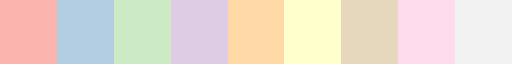

In [5]:
cmap

In [7]:
cmap = matplotlib.cm.get_cmap("Pastel2")
# Access the .colors attribute (a list of RGBA tuples)
rgba_colors = cmap.colors

# Convert each RGBA tuple to a hex string
hex_colors = [mcolors.to_hex(c) for c in rgba_colors]

# Print the list of hex color strings
print(hex_colors)

['#b3e2cd', '#fdcdac', '#cbd5e8', '#f4cae4', '#e6f5c9', '#fff2ae', '#f1e2cc', '#cccccc']


/tmp/ipykernel_143/634515531.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('Pastel2')


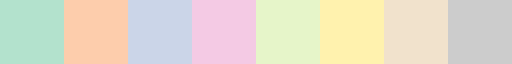

In [8]:
cmap

In [8]:
cell_line_p = {
    "Caco-2": "saddlebrown",
    "SJCRH30": "darkgreen",
    "BE2C": "grey",
    "SJSA1": "teal",
    "HAP-1": "royalblue",
    "HL-60": "cyan",
    "MG63": "lime",
    "VCaP": "gold",
    "C4-2B": "orangered",
    "RWPE2": "orange",
    "22Rv1": "lightcoral",
    "RWPE1": "deeppink",
}
modification_p = {
    "CTCF": "#e5d8bd",
    "H3K4me1": "#fdcdac",
    "H3K9me3": "#b3cde3",
    "H3K36me3": "#e6f5c9",
    "H3K27me3": "#decbe4",
    "H3K4me3": "#b3e2cd",
    "H3K27ac": "#fff2ae",
}

modification_p_richer = {
    "CTCF": "#d3c09b",
    "H3K4me1": "#fabd88",
    "H3K9me3": "#9ab7d3",
    "H3K36me3": "#d7f0a8",
    "H3K27me3": "#c7aed6",
    "H3K4me3": "#9ad1b5",
    "H3K27ac": "#ffe98c",
}

In [11]:
import os

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

# 1. Create a list of 'Patch' objects for the legend handles
# A Patch is just a colored rectangle
patches = [
    mpatches.Patch(color=color, label=label) for label, color in cell_line_p.items()
]

# 2. Create a figure and a single axis
# We can make the figure small, as we will crop it tightly
fig, ax = plt.subplots(figsize=(4, 2))

# 3. Create the legend on the axis
# We place it in the 'center' of the invisible axis
legend = ax.legend(
    handles=patches,
    loc="center",
    frameon=False,  # Remove the legend box frame
    fontsize=12,
    ncol=1,  # Arrange in a single column
)

# 4. Turn off the axis (spines, ticks, etc.)
ax.axis("off")

# 5. Define the save path
save_path = "./plots/cell_line_legend.svg"

# Ensure the 'plots' directory exists (if you want to save it there)
# os.makedirs(os.path.dirname(save_path), exist_ok=True)

# 6. Save the figure as an SVG
# bbox_inches='tight' is the key to cropping the output
# to the legend's bounding box.
plt.savefig(
    save_path,
    format="svg",
    bbox_inches="tight",
    pad_inches=0.1,  # Add a small amount of padding
    transparent=True,  # Make the background transparent
)

plt.close(fig)  # Close the figure to free memory

print(f"Legend saved successfully to {save_path}")

Legend saved successfully to ./plots/cell_line_legend.svg


## Analyze correlation coefficients of signal vs divergence by TE class, line and modification

In [16]:
correlation_df = (
    pd.read_csv(
        "Signal_vs_divergence_correlation_by_lines_mods_classes_spearman_cut_100.csv"
    )
    .set_index("Unnamed: 0")
    .T
)
correlation_df.index = correlation_df.cell_line + "_" + correlation_df.modification
correlation_df[class_names] = correlation_df[class_names].apply(
    pd.to_numeric, errors="coerce"
)
correlation_df.to_csv

Unnamed: 0,cell_line,modification,LINE,LTR,SINE,DNA,Retroposon,RC
Caco-2_H3K4me1,Caco-2,H3K4me1,0.043044,-0.010054,0.045418,0.018543,-0.082326,-0.024023
Caco-2_H3K9me3,Caco-2,H3K9me3,-0.167569,-0.159021,-0.119095,-0.026303,-0.438770,0.046998
SJCRH30_H3K4me1,SJCRH30,H3K4me1,0.046560,0.028618,0.085636,0.021258,0.236518,-0.035680
SJCRH30_H3K9me3,SJCRH30,H3K9me3,-0.118742,-0.086384,0.079307,-0.043312,-0.325958,-0.030649
SJCRH30_H3K36me3,SJCRH30,H3K36me3,-0.021790,-0.024871,-0.057420,-0.042470,0.070763,0.013019
SJCRH30_H3K27me3,SJCRH30,H3K27me3,0.036461,0.014110,0.004028,0.023475,0.209093,-0.066192
SJCRH30_H3K4me3,SJCRH30,H3K4me3,-0.011755,-0.008426,0.047622,-0.010177,0.072158,-0.053218
SJCRH30_H3K27ac,SJCRH30,H3K27ac,0.011320,-0.001005,0.019545,0.013687,0.091561,-0.038217
BE2C_H3K4me1,BE2C,H3K4me1,0.081025,0.007012,0.107396,0.019142,0.155276,0.009727
BE2C_H3K9me3,BE2C,H3K9me3,-0.085695,-0.089858,-0.063244,-0.015561,-0.280786,0.020045


In [21]:
correlation_df.reindex(
    ["SJSA1_H3K9me3", "MG63_H3K9me3", "BE2C_H3K9me3", "SJCRH30_H3K9me3"]
)

Unnamed: 0,cell_line,modification,LINE,LTR,SINE,DNA,Retroposon,RC
SJSA1_H3K9me3,SJSA1,H3K9me3,-0.069834,-0.090781,0.002493,-0.011445,-0.212881,0.033365
MG63_H3K9me3,MG63,H3K9me3,-0.149876,-0.132850,-0.040550,-0.032702,-0.160689,0.030369
BE2C_H3K9me3,BE2C,H3K9me3,-0.085695,-0.089858,-0.063244,-0.015561,-0.280786,0.020045
SJCRH30_H3K9me3,SJCRH30,H3K9me3,-0.118742,-0.086384,0.079307,-0.043312,-0.325958,-0.030649


In [22]:
correlation_df.reindex(
    [
        "RWPE1_CTCF",
        "BE2C_H3K4me1",
        "SJCRH30_H3K4me1",
        "SJCRH30_H3K27me3",
        "HL-60_H3K27ac",
    ]
)

Unnamed: 0,cell_line,modification,LINE,LTR,SINE,DNA,Retroposon,RC
RWPE1_CTCF,RWPE1,CTCF,-0.052174,0.085659,0.027368,0.015525,0.343485,0.000771
BE2C_H3K4me1,BE2C,H3K4me1,0.081025,0.007012,0.107396,0.019142,0.155276,0.009727
SJCRH30_H3K4me1,SJCRH30,H3K4me1,0.046560,0.028618,0.085636,0.021258,0.236518,-0.035680
SJCRH30_H3K27me3,SJCRH30,H3K27me3,0.036461,0.014110,0.004028,0.023475,0.209093,-0.066192
HL-60_H3K27ac,HL-60,H3K27ac,-0.005026,0.002149,0.031971,-0.005662,0.169809,-0.016023


In [23]:
correlation_df.drop(["C4-2B_CTCF", "RWPE1_H3K27ac"]).min()

Unnamed: 0
cell_line          22Rv1
modification        CTCF
LINE           -0.167569
LTR            -0.159021
SINE           -0.207749
DNA            -0.053172
Retroposon      -0.43877
RC             -0.077999
dtype: object

In [24]:
correlation_df.drop(["C4-2B_CTCF", "RWPE1_H3K27ac"]).max()

Unnamed: 0
cell_line           VCaP
modification     H3K9me3
LINE            0.151752
LTR             0.085659
SINE            0.107396
DNA             0.031126
Retroposon      0.343485
RC              0.046998
dtype: object

In [25]:
correlation_df[class_names].max()  # .max()

Unnamed: 0
LINE          0.151752
LTR           0.101788
SINE          0.458195
DNA           0.031126
Retroposon    0.420540
RC            0.046998
dtype: float64

In [26]:
correlation_df[class_names].min()  # .min()

Unnamed: 0
LINE         -0.167569
LTR          -0.159021
SINE         -0.501758
DNA          -0.053172
Retroposon   -0.438770
RC           -0.077999
dtype: float64

In [9]:
data_to_plot

,Caco-2_H3K4me1,Caco-2_H3K9me3,SJCRH30_H3K4me1,SJCRH30_H3K9me3,SJCRH30_H3K36me3,SJCRH30_H3K27me3,SJCRH30_H3K4me3,SJCRH30_H3K27ac,BE2C_H3K4me1,BE2C_H3K9me3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
LINE,0.043044,-0.167569,0.046560,-0.118742,-0.021790,0.036461,-0.011755,0.011320,0.081025,-0.085695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LTR,-0.010054,-0.159021,0.028618,-0.086384,-0.024871,0.014110,-0.008426,-0.001005,0.007012,-0.089858,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SINE,0.045418,-0.119095,0.085636,0.079307,-0.057420,0.004028,0.047622,0.019545,0.107396,-0.063244,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DNA,0.018543,-0.026303,0.021258,-0.043312,-0.042470,0.023475,-0.010177,0.013687,0.019142,-0.015561,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Retroposon,-0.082326,-0.438770,0.236518,-0.325958,0.070763,0.209093,0.072158,0.091561,0.155276,-0.280786,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RC,-0.024023,0.046998,-0.035680,-0.030649,0.013019,-0.066192,-0.053218,-0.038217,0.009727,0.020045,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


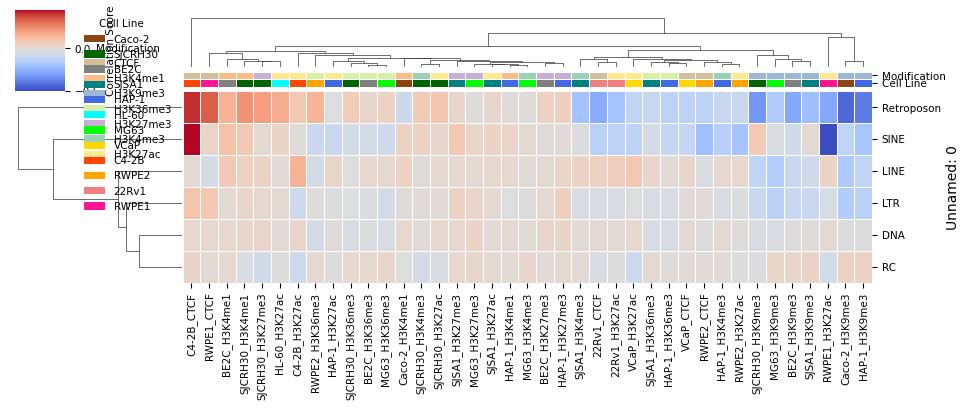

In [22]:
GLOBAL_FONT_SIZE = 7.5

# --- 3. Prepare Visual Mapping ---

# Map the metadata to colors
mapped_cell_colors = correlation_df["cell_line"].map(cell_line_p)
mapped_mod_colors = correlation_df["modification"].map(modification_p_richer)

# Create color annotation dataframe
# Note: Since the transpose .T is plotted, metadata describing the original rows
# now describes the columns of the transposed matrix.
col_colors_df = pd.DataFrame(
    {"Modification": mapped_mod_colors, "Cell Line": mapped_cell_colors}
)
col_colors_df.index = correlation_df.index

# Prepare data
data_to_plot = correlation_df[class_names].T

# --- 4. Plotting ---

g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    figsize=(10, 4.5),
    col_colors=col_colors_df[["Modification", "Cell Line"]],
    linewidths=0.5,
    cbar_kws={"label": "Correlation Score"},
    # Standardizing font sizes via keyword arguments where supported
    tree_kws={"linewidths": 0.5},
)

# --- 5. Unified Font Size Refactoring (Post-processing) ---

# A) Heatmap Tick Labels
g.ax_heatmap.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, fontsize=GLOBAL_FONT_SIZE)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=GLOBAL_FONT_SIZE)

# B) Colorbar Styling
g.ax_cbar.set_ylabel("Correlation Score", fontsize=GLOBAL_FONT_SIZE)
g.ax_cbar.tick_params(labelsize=GLOBAL_FONT_SIZE)

# C) Column Color labels (Modification / Cell Line labels on the axis)
# FIXED: We removed the .axes.flatten() call which caused the AttributeError.
# Seaborn clustermap typically uses a single Axes object for col_colors.
if g.ax_col_colors is not None:
    g.ax_col_colors.tick_params(labelsize=GLOBAL_FONT_SIZE)
    # Update the axis labels (e.g., "Modification", "Cell Line")
    g.ax_col_colors.yaxis.label.set_size(GLOBAL_FONT_SIZE)
    # In some versions/configurations, these might be rendered as tick labels
    plt.setp(g.ax_col_colors.get_yticklabels(), fontsize=GLOBAL_FONT_SIZE)

# D) Manual Legends (Crucial for explaining the color strips)
cell_legend = [Patch(facecolor=c, label=l) for l, c in cell_line_p.items()]
mod_legend = [Patch(facecolor=c, label=l) for l, c in modification_p_richer.items()]

# Legend 1: Cell Line
l1 = plt.legend(
    handles=cell_legend,
    title="Cell Line",
    loc="upper left",
    bbox_to_anchor=(1.2, 1.0),
    frameon=False,
    fontsize=GLOBAL_FONT_SIZE,
    title_fontsize=GLOBAL_FONT_SIZE,
)
g.fig.add_artist(l1)

# Legend 2: Modification
plt.legend(
    handles=mod_legend,
    title="Modification",
    loc="upper left",
    bbox_to_anchor=(1.2, 0.7),
    frameon=False,
    fontsize=GLOBAL_FONT_SIZE,
    title_fontsize=GLOBAL_FONT_SIZE,
)

# --- 6. Saving ---
os.makedirs("./plots", exist_ok=True)
save_path = "./plots/signal_to_divergence_corr_clustermap_spearman.svg"
g.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()

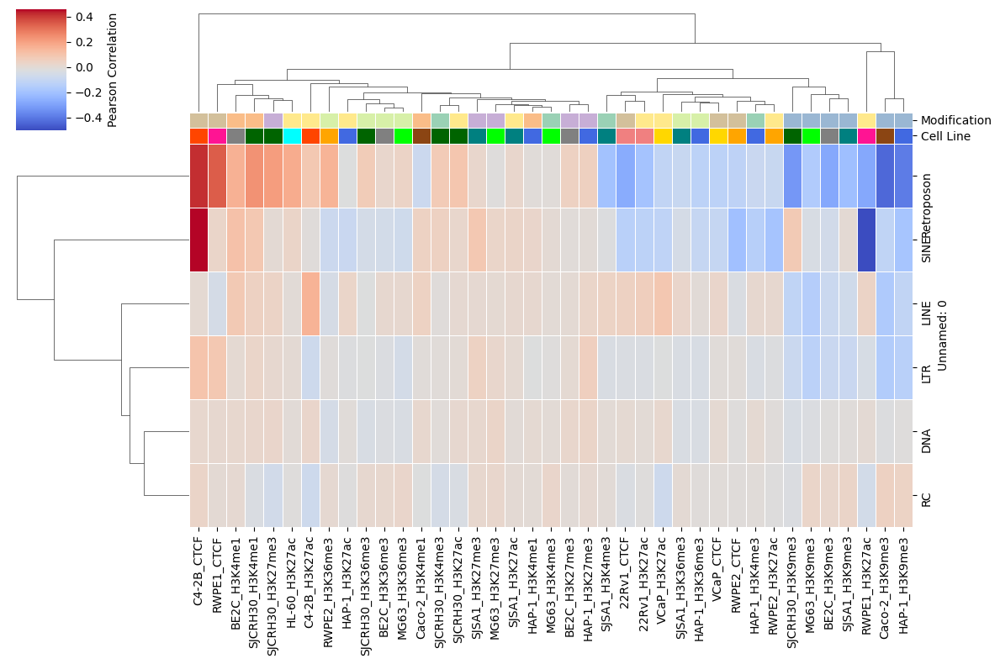

In [11]:
# --- 1. Prepare Row Colors ---
# Map the 'cell_line' and 'modification' columns to their respective colors
mapped_cell_colors = correlation_df["cell_line"].map(cell_line_p)
mapped_mod_colors = correlation_df["modification"].map(modification_p_richer)

# Create a DataFrame for the row_colors argument
# The column names (e.g., 'Cell Line') will appear as labels.
row_colors_df = pd.DataFrame(
    {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
)
# Important: The index must align with the data being plotted
row_colors_df.index = correlation_df.index


# --- 2. Plot the Clustermap ---
data_to_plot = correlation_df[class_names].T


g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    # Goal 1: Customize figsize
    figsize=(12, 8),
    # Goal 2 & 3: Add row colors using the mapped palettes
    # We use row_colors, as 'cell_line' and 'modification' describe the rows
    col_colors=row_colors_df[["Modification", "Cell Line"]],
    # Other aesthetic improvements
    # vmin=-1, vmax=1,          # Set colorbar limits for correlation
    linewidths=0.5,
    cbar_kws={"label": "Pearson Correlation"},
    # metric='correlation'      # Use correlation for clustering distance
)

# --- 3. Save the Figure ---
save_path = "./plots/signal_to_divergence_corr_clustermap_spearman.svg"


# Goal 4: Save as SVG
g.savefig(save_path, format="svg")


plt.show()

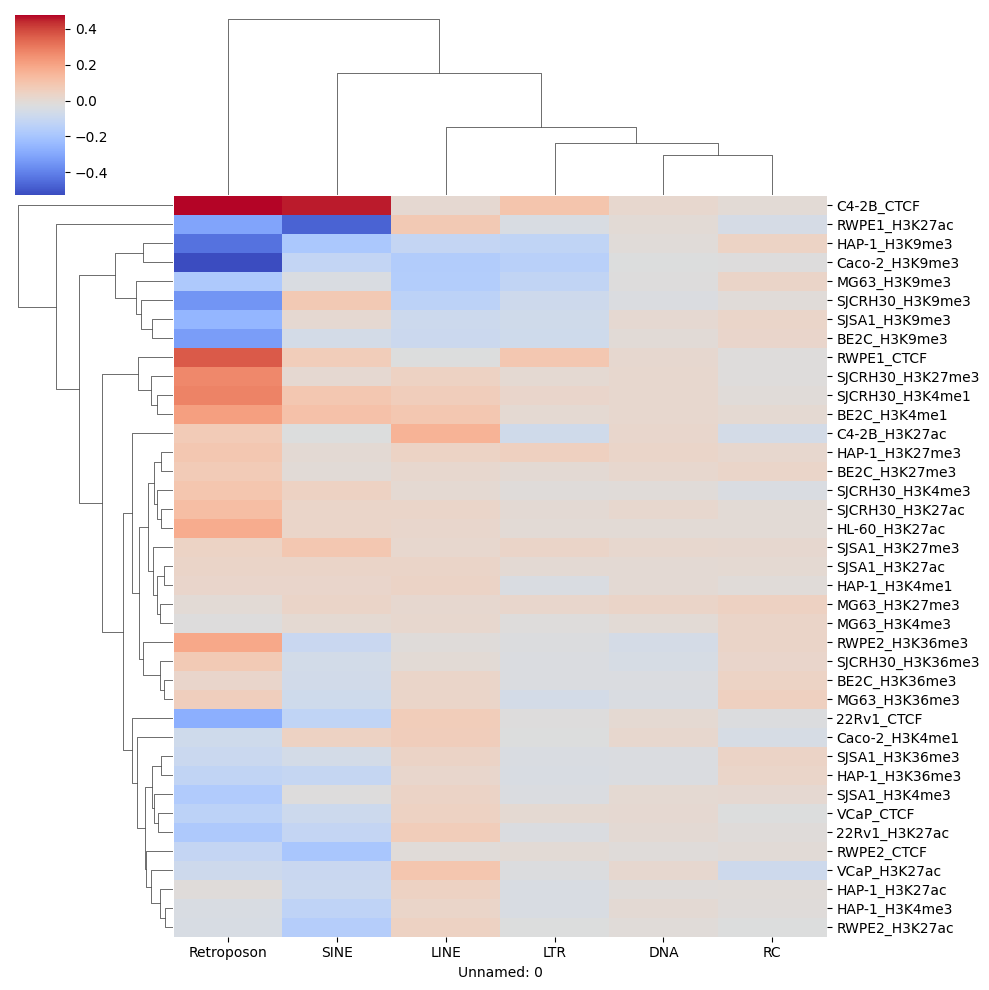

In [19]:
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]
sns.clustermap(
    correlation_df[class_names],
    cmap="coolwarm",
)

In [5]:
corr_coefs[0:8].set_index("Unnamed: 0")

,0
Unnamed: 0,
cell_line,VCaP
modification,CTCF
LINE,0.04296732303777025
LTR,0.004874568785685149
SINE,-0.08524257830201931
DNA,0.00797674737078927
Retroposon,-0.1346880649565564
RC,-0.026657456774885947


### Control of clustermap stability for different divergence thresholds

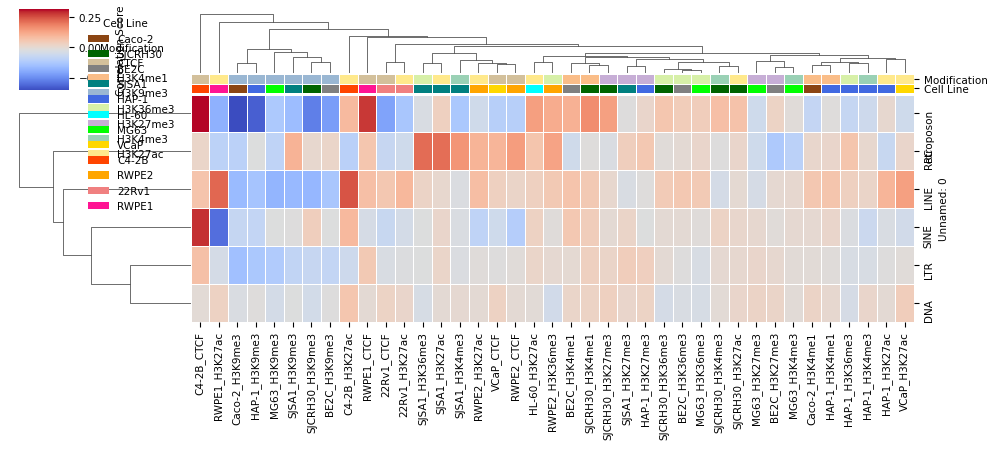

In [7]:
#div_threshold = 100
#div_threshold = 20
#div_threshold = 22.5
div_threshold = 25

corr_coefs = pd.read_csv(
    f"Signal_vs_divergence_correlation_by_lines_mods_classes_spearman_cut_{str(div_threshold)}.csv"
)


correlation_df_list = []
for i in range(0, 39):
    correlation_df_list.append(corr_coefs[8 * i : 8 * i + 8].set_index("Unnamed: 0"))

correlation_df = pd.concat(correlation_df_list, axis=1).T
correlation_df.index = correlation_df.cell_line + "_" + correlation_df.modification
correlation_df.to_csv(f"Signal_vs_div_corr_by_lines_mods_classes_spearman_cut_{str(div_threshold)}.csv")
correlation_df[class_names] = correlation_df[class_names].apply(
    pd.to_numeric, errors="coerce"
)
# correlation_df.to_csv("./supplementary/Supplementary table 3.csv")
correlation_df = correlation_df.dropna()

GLOBAL_FONT_SIZE = 7.5

# --- 3. Prepare Visual Mapping ---

# Map the metadata to colors
mapped_cell_colors = correlation_df["cell_line"].map(cell_line_p)
mapped_mod_colors = correlation_df["modification"].map(modification_p_richer)

# Create color annotation dataframe
# Note: Since the transpose .T is plotted, metadata describing the original rows
# now describes the columns of the transposed matrix.
col_colors_df = pd.DataFrame(
    {"Modification": mapped_mod_colors, "Cell Line": mapped_cell_colors}
)
col_colors_df.index = correlation_df.index

# Prepare data
data_to_plot = correlation_df[class_names].T

# --- 4. Plotting ---

g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    figsize=(10, 4.5),
    col_colors=col_colors_df[["Modification", "Cell Line"]],
    linewidths=0.5,
    cbar_kws={"label": "Correlation Score"},
    # Standardizing font sizes via keyword arguments where supported
    tree_kws={"linewidths": 0.5},
)

# --- 5. Unified Font Size Refactoring (Post-processing) ---

# A) Heatmap Tick Labels
g.ax_heatmap.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, fontsize=GLOBAL_FONT_SIZE)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=90, fontsize=GLOBAL_FONT_SIZE)

# B) Colorbar Styling
g.ax_cbar.set_ylabel("Correlation Score", fontsize=GLOBAL_FONT_SIZE)
g.ax_cbar.tick_params(labelsize=GLOBAL_FONT_SIZE)

# C) Column Color labels (Modification / Cell Line labels on the axis)
# FIXED: We removed the .axes.flatten() call which caused the AttributeError.
# Seaborn clustermap typically uses a single Axes object for col_colors.
if g.ax_col_colors is not None:
    g.ax_col_colors.tick_params(labelsize=GLOBAL_FONT_SIZE)
    # Update the axis labels (e.g., "Modification", "Cell Line")
    g.ax_col_colors.yaxis.label.set_size(GLOBAL_FONT_SIZE)
    # In some versions/configurations, these might be rendered as tick labels
    plt.setp(g.ax_col_colors.get_yticklabels(), fontsize=GLOBAL_FONT_SIZE)

# D) Manual Legends (Crucial for explaining the color strips)
cell_legend = [Patch(facecolor=c, label=l) for l, c in cell_line_p.items()]
mod_legend = [Patch(facecolor=c, label=l) for l, c in modification_p_richer.items()]

# Legend 1: Cell Line
l1 = plt.legend(
    handles=cell_legend,
    title="Cell Line",
    loc="upper left",
    bbox_to_anchor=(1.2, 1.0),
    frameon=False,
    fontsize=GLOBAL_FONT_SIZE,
    title_fontsize=GLOBAL_FONT_SIZE,
)
g.fig.add_artist(l1)

# Legend 2: Modification
plt.legend(
    handles=mod_legend,
    title="Modification",
    loc="upper left",
    bbox_to_anchor=(1.2, 0.7),
    frameon=False,
    fontsize=GLOBAL_FONT_SIZE,
    title_fontsize=GLOBAL_FONT_SIZE,
)

# --- 6. Saving ---
os.makedirs("./plots", exist_ok=True)
save_path = f"./plots/signal_to_divergence_corr_clustermap_spearman_cut_{str(div_threshold)}.svg"
g.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()

### Test for significant differences between correlation coefficients with divergence of different families 

That's an excellent question. The "pattern" you're looking for can be defined in a few different statistical ways.The most important first step, before any test, is to transform your correlation coefficients ($r$).The Prerequisite: Fisher $z$-TransformationYou should not perform statistical tests directly on the raw Pearson $r$ values. The distribution of $r$ is not normal and is bounded between -1 and 1 (it "bunches up" as it gets close to the ends).You must first convert every $r$ value in your set to a $z$-score using the Fisher $z$-transformation. This transformation "stretches" the values so they are approximately normally distributed, which is an assumption for many tests.The formula is:$$z = 0.5 \times \ln\left(\frac{1+r}{1-r}\right)$$In most software (like Python/Numpy or R), this is simply z = np.arctanh(r).From now on, all tests are performed on your set of $z$-scores, not the $r$-values.Here are the most common "patterns" you can test for, from simplest to most complex.1. Does the distribution follow a specific shape (e.g., normal)?This tests if the set itself has a recognizable structure.Your Question: "Is my set of $z$-scores normally distributed?" (This would imply the correlations are clustered around a single mean value in a standard way).How to Test:Visually: Plot a histogram or a Q-Q plot of your $z$-scores. This is often the most insightful step. A Q-Q plot will show you if the data follows a straight line (normal) or where it deviates (e.g., "heavy tails").Formally: Use a Shapiro-Wilk Test. The null hypothesis is that the data is normally distributed. A low p-value (e.g., $< 0.05$) suggests it is not normal.Interpretation: If it's not normal, the visual plot tells you the pattern. Is it bimodal (two peaks)? Is it skewed? This is a pattern in itself.2. Does the set of correlations relate to another variable?This is often the most powerful and common question. You have a list of correlations, $r_1, r_2, \dots, r_n$. Do you have another property for each of those $n$ vectors?Your Question: "Do the vectors that correlate highly with my target vector also share some other property?"Example:Your vectors are Gene 1, Gene 2, ... Gene 1000.Your target vector is Disease_Severity.Your set of $r$-values is [Corr(Gene1, Disease), Corr(Gene2, Disease), ...].Your other variable could be the "Average Expression Level" for each gene: [Avg(Gene1), Avg(Gene2), ...].The test answers: "Do genes that strongly correlate with the disease also have high average expression?"How to Test:Create your list of $z$-scores: $Z = [z_1, z_2, \dots, z_n]$.Create your list of the other property: $P = [p_1, p_2, \dots, p_n]$.Calculate a Spearman Rank Correlation between $Z$ and $P$.Interpretation: A significant Spearman correlation (e.g., $p < 0.05$) shows a monotonic pattern: as one value increases, the other tends to increase (or decrease). This is a very strong and common way to find a "pattern."3. Is the average correlation of the set different from zero?This tests if your "many vectors" have any relationship at all (on average) with the target vector.Your Question: "Is the mean of my correlation set significantly positive or negative?"How to Test:Get your set of $z$-scores.Run a one-sample t-test with a null hypothesis (mu) of 0.Interpretation: A low p-value means the average correlation is not zero. This confirms a general, set-wide pattern of a positive or negative relationship.4. Are the correlations different between groups?If your "many vectors" can be divided into pre-defined categories, you can test if the correlation pattern is different between them.Your Question: "Is the average correlation to the target vector different for Group A vs. Group B?"Example: "Is the correlation of 'kinase' genes with the target different from the correlation of 'transcription factor' genes with the target?"How to Test:Get your $z$-scores and label them by group (e.g., 'Group A', 'Group B').For 2 groups: Run a Welch's t-test (or a Mann-Whitney U test if the $z$-scores are still not normal) between the two groups.For 3+ groups: Run an ANOVA (or a Kruskal-Wallis test) across all groups.Interpretation: A low p-value shows that the "pattern" of correlation is not the same across your defined categories.

In [16]:
correlation_df

Unnamed: 0,cell_line,modification,LINE,LTR,SINE,DNA,Retroposon,RC
C4-2B_CTCF,C4-2B,CTCF,0.009998,0.098247,0.454619,0.016026,0.476818,-0.003273
C4-2B_H3K27ac,C4-2B,H3K27ac,0.157677,-0.075083,-0.027578,0.020479,0.076776,-0.060098
RWPE1_CTCF,RWPE1,CTCF,-0.027016,0.091049,0.067828,0.012202,0.362635,-0.018741
RWPE1_H3K27ac,RWPE1,H3K27ac,0.084852,-0.042943,-0.472827,-0.002017,-0.308410,-0.055940
VCaP_CTCF,VCaP,CTCF,0.042967,0.004875,-0.085243,0.007977,-0.134688,-0.026657
VCaP_H3K27ac,VCaP,H3K27ac,0.093152,-0.029601,-0.097658,0.013954,-0.080731,-0.080064
SJCRH30_H3K27ac,SJCRH30,H3K27ac,0.028271,0.002110,0.027018,0.017442,0.120396,-0.002547
SJCRH30_H3K4me1,SJCRH30,H3K4me1,0.061597,0.024282,0.089411,0.017317,0.279601,-0.011064
SJCRH30_H3K9me3,SJCRH30,H3K9me3,-0.136785,-0.080214,0.082468,-0.035219,-0.352966,-0.011485
SJCRH30_H3K36me3,SJCRH30,H3K36me3,-0.002530,-0.033646,-0.067044,-0.049434,0.080151,0.025043


In [4]:
correlation_df = (
    pd.read_csv(
        "Signal_vs_divergence_correlation_by_lines_mods_classes_spearman_cut_100.csv"
    )
    .set_index("Unnamed: 0")
    .T
)
correlation_df.index = correlation_df.cell_line + "_" + correlation_df.modification
correlation_df[class_names] = correlation_df[class_names].apply(
    pd.to_numeric, errors="coerce"
)

corrs_for_test = correlation_df.melt(
    id_vars=["cell_line", "modification"], value_vars=class_names
)
corrs_for_test.columns = ["cell_line", "modification", "TE_class", "correlation"]
corrs_for_test["transformed_corr"] = np.arctanh(corrs_for_test.correlation)
corrs_for_test

,cell_line,modification,TE_class,correlation,transformed_corr
0,Caco-2,H3K4me1,LINE,0.043044,0.043070
1,Caco-2,H3K9me3,LINE,-0.167569,-0.169164
2,SJCRH30,H3K4me1,LINE,0.046560,0.046594
3,SJCRH30,H3K9me3,LINE,-0.118742,-0.119305
4,SJCRH30,H3K36me3,LINE,-0.021790,-0.021793
...,...,...,...,...,...
229,RWPE2,H3K27ac,RC,-0.020182,-0.020185
230,22Rv1,CTCF,RC,-0.036557,-0.036573
231,22Rv1,H3K27ac,RC,-0.016435,-0.016437
232,RWPE1,CTCF,RC,0.000771,0.000771


<Axes: xlabel='correlation', ylabel='Count'>

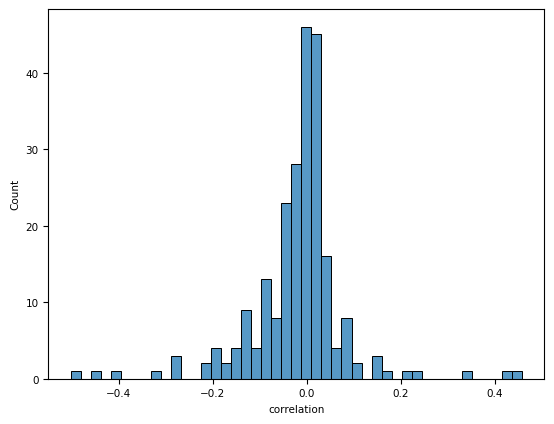

In [5]:
sns.histplot(corrs_for_test.correlation)

<Axes: xlabel='transformed_corr', ylabel='Count'>

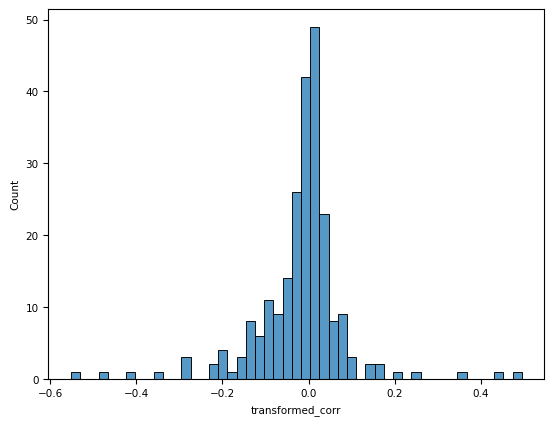

In [6]:
sns.histplot(corrs_for_test.transformed_corr)  # Fisher z-transformation

In [7]:
stats.shapiro(corrs_for_test.transformed_corr)

ShapiroResult(statistic=np.float64(0.8271131848670513), pvalue=np.float64(1.9962213760738535e-15))

In [8]:
stats.kurtosis(corrs_for_test.transformed_corr)

np.float64(7.988113051933002)

In [9]:
stats.kurtosistest(corrs_for_test.transformed_corr)

KurtosistestResult(statistic=np.float64(6.825508162100314), pvalue=np.float64(8.761461975131118e-12))

<Axes: xlabel='TE_class', ylabel='transformed_corr'>

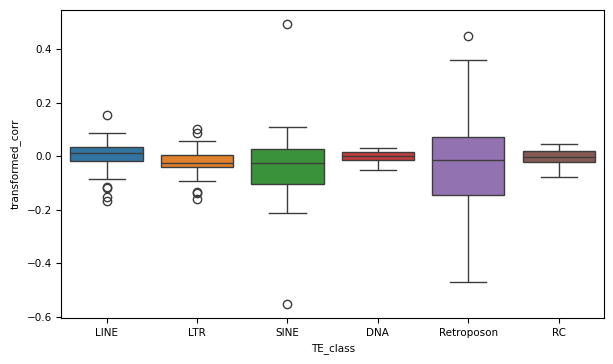

In [11]:
figure, ax = plt.subplots(
    figsize=(7, 4),
)
sns.boxplot(
    data=corrs_for_test, x="TE_class", y="transformed_corr", ax=ax, hue="TE_class"
)

<Axes: xlabel='modification', ylabel='transformed_corr'>

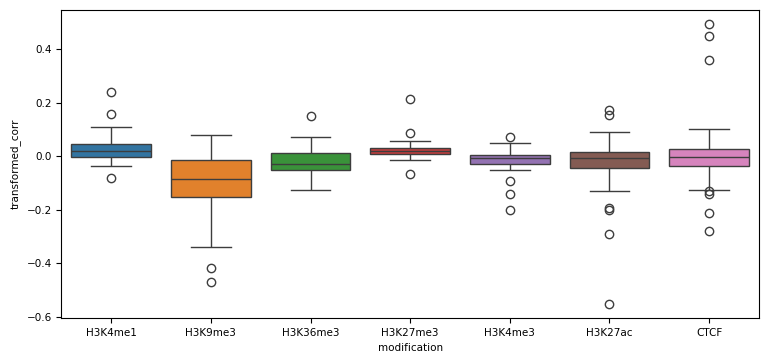

In [12]:
figure, ax = plt.subplots(
    figsize=(9, 4),
)
sns.boxplot(
    data=corrs_for_test,
    x="modification",
    y="transformed_corr",
    ax=ax,
    hue="modification",
)

<Axes: xlabel='cell_line', ylabel='transformed_corr'>

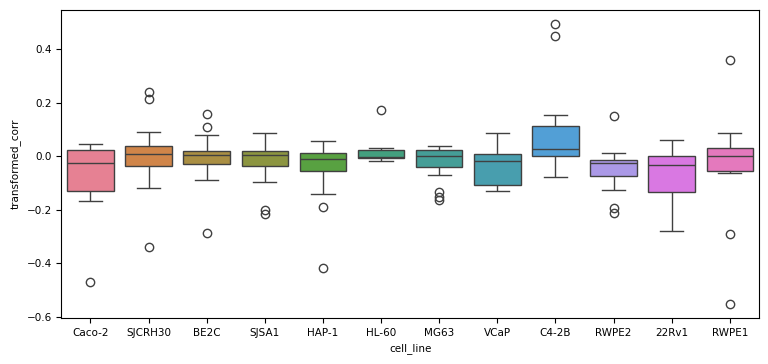

In [13]:
figure, ax = plt.subplots(
    figsize=(9, 4),
)
sns.boxplot(
    data=corrs_for_test, x="cell_line", y="transformed_corr", ax=ax, hue="cell_line"
)

#### Test for equality of variances

In [14]:
class_names

['LINE', 'LTR', 'SINE', 'DNA', 'Retroposon', 'RC']

In [15]:
from scipy.stats import levene

LINE = corrs_for_test["transformed_corr"][corrs_for_test["TE_class"] == "LINE"]
LTR = corrs_for_test["transformed_corr"][corrs_for_test["TE_class"] == "LTR"]
SINE = corrs_for_test["transformed_corr"][corrs_for_test["TE_class"] == "SINE"]
DNA = corrs_for_test["transformed_corr"][corrs_for_test["TE_class"] == "DNA"]
Retroposon = corrs_for_test["transformed_corr"][
    corrs_for_test["TE_class"] == "Retroposon"
]
RC = corrs_for_test["transformed_corr"][corrs_for_test["TE_class"] == "RC"]
non_sva = corrs_for_test["transformed_corr"][corrs_for_test["TE_class"] != "Retroposon"]


levene(LINE, LTR, SINE, DNA, Retroposon, RC)

LeveneResult(statistic=np.float64(19.510197090047825), pvalue=np.float64(3.6552466452171114e-16))

In [17]:
levene(Retroposon, non_sva)

LeveneResult(statistic=np.float64(64.01224727014252), pvalue=np.float64(5.880963711559801e-14))

In [12]:
from statsmodels.stats.oneway import anova_oneway

# Perform the Brown-Forsythe test
anova_oneway(
    data=corrs_for_test["transformed_corr"],
    groups=corrs_for_test["TE_class"],
    use_var="equal",
)

<class 'statsmodels.stats.base.HolderTuple'>
statistic = 0.973441784179152
pvalue = 0.434769566896286
df = (5.0, 228.0)
df_num = 5.0
df_denom = 228.0
nobs_t = 234.0
n_groups = 6
means = array([-0.00358074,  0.01162795, -0.02524657, -0.00058463, -0.02950687,
           -0.03262705])
nobs = array([39., 39., 39., 39., 39., 39.])
vars_ = array([0.00048486, 0.00484515, 0.00256809, 0.00101818, 0.05116082,
           0.01956039])
use_var = 'equal'
welch_correction = True
tuple = (0.973441784179152, 0.434769566896286)

In [9]:
??anova_oneway

Signature:
anova_oneway(
    data,
    groups=None,
    use_var='unequal',
    welch_correction=True,
    trim_frac=0,
)
Source:   
def anova_oneway(data, groups=None, use_var="unequal", welch_correction=True,
                 trim_frac=0):
    """Oneway Anova

    This implements standard anova, Welch and Brown-Forsythe, and trimmed
    (Yuen) variants of those.

    Parameters
    ----------
    data : tuple of array_like or DataFrame or Series
        Data for k independent samples, with k >= 2.
        The data can be provided as a tuple or list of arrays or in long
        format with outcome observations in ``data`` and group membership in
        ``groups``.
    groups : ndarray or Series
        If data is in long format, then groups is needed as indicator to which
        group or sample and observations belongs.
    use_var : {"unequal", "equal" or "bf"}
        `use_var` specified how to treat heteroscedasticity, unequal variance,
        across samples. Three approaches are

### Attempts of plot of signal vs Divergence correlation

In [16]:
from scipy import stats

In [ ]:
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=True,
    sharey=False,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(14, 8),
)

# Use zip to iterate over class names and the flattened axes array
# axs.flatten() converts the 2x3 array into a 1D array of 6 axes
for class_name, ax in zip(class_names, axs.flatten()):
    print(class_name)
    # Filter the data
    query_local = f'Class == "{class_name}"'
    sample_enrichment_local = sample_enrichment.query(query_local).dropna()
    corr_coef = np.corrcoef(
        sample_enrichment_local["Divergence"], sample_enrichment_local["Signal"]
    )[0, 1]
    # Use sns.histplot (axes-level) instead of sns.displot (figure-level)

    sns.kdeplot(  #
        data=sample_enrichment_local,
        x="Divergence",
        y="Signal",
        # alpha=0.01,
        ax=ax,
        fill=True,
        thresh=0,
        levels=100,
        cmap="mako",
    )

    # Use ax.set_title() to set the title for the subplot
    ax.set_title(class_name)

plt.show()
# Save the final figure
# plt.savefig("plots/Divergence_score_dist_by_class.svg")

LINE


LINE
LTR
SINE
DNA
Retroposon
RC


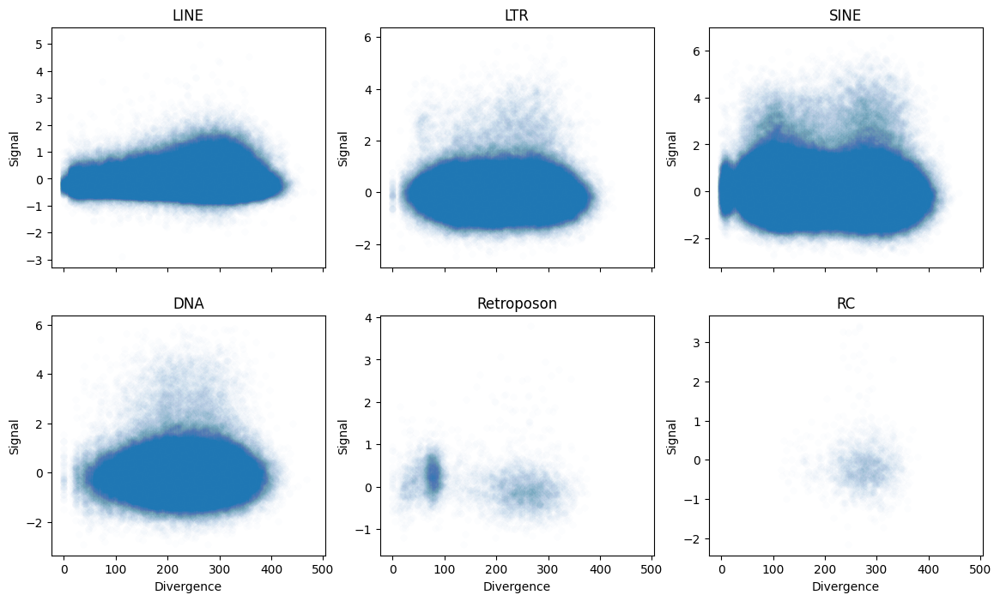

In [9]:
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]

figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=True,
    sharey=False,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(14, 8),
)

# Use zip to iterate over class names and the flattened axes array
# axs.flatten() converts the 2x3 array into a 1D array of 6 axes
for class_name, ax in zip(class_names, axs.flatten()):
    print(class_name)
    # Filter the data
    query_local = f'Class == "{class_name}"'
    sample_enrichment_local = sample_enrichment.query(query_local).dropna()

    # Use sns.histplot (axes-level) instead of sns.displot (figure-level)

    sns.scatterplot(  # kdeplot
        data=sample_enrichment_local,
        x="Divergence",
        y="Signal",
        alpha=0.01,
        ax=ax,
        # fill=True, thresh=0, levels=100, cmap="mako",
    )

    # Use ax.set_title() to set the title for the subplot
    ax.set_title(class_name)

plt.show()
# Save the final figure
# plt.savefig("plots/Divergence_score_dist_by_class.svg")

## Record correlation coefficients of individual families and subfamilies of TEs

In [ ]:
repeat_masker = pd.read_csv("T2T_repeat_masker_processed.csv")

In [9]:
repeat_masker.family_name.value_counts().to_csv("repeat_masker_family_name_counts.csv")

In [8]:
repeat_masker.individual_name.value_counts().to_csv(
    "repeat_masker_individual_name_counts.csv"
)

In [15]:
repeat_masker_family_name_counts = pd.read_csv("repeat_masker_family_name_counts.csv")[
    "Unnamed: 0"
]
repeat_masker_family_name_counts

0               Alu
1                L1
2               MIR
3                L2
4         ERVL-MaLR
5       hAT-Charlie
6              ERV1
7              ERVL
8      TcMar-Tigger
9        hAT-Tip100
10              CR1
11            Gypsy
12    hAT-Blackjack
13    TcMar-Mariner
14            RTE-X
15             ERVK
16        TcMar-Tc2
17              SVA
18         RTE-BovB
19         tRNA-RTE
20           hAT-Ac
21              hAT
22        MULE-MuDR
23         PiggyBac
24        5S-Deu-L2
25         Helitron
26         hAT-Tag1
27             tRNA
28         Penelope
29        TcMar-Tc1
30          Dong-R4
31         tRNA-Deu
32          Kolobok
33    PIF-Harbinger
34          Crypton
35           Merlin
36            TcMar
37           L1-Tx1
38        Crypton-A
39         I-Jockey
40      hAT-Tip100?
41       TcMar-Pogo
42             hAT?
43        hAT-hAT19
Name: Unnamed: 0, dtype: object

In [ ]:
import os

import numpy as np
import pandas as pd
from scipy import stats
from tqdm import tqdm  # For progress bars

DIV_THRESHOLD = 100


def spearmanr_ci(x, y, alpha=0.05):
    """
    Calculates Spearman rho, p-value, and confidence interval using
    Fisher z-transformation.

    Note: For Spearman's rho, the standard error of the Fisher-transformed
    value is typically approximated as SE = sqrt((1 + rho^2/2)/(n-3)).
    """
    # 1. Calculate Spearman rank correlation and p-value
    rho, p = stats.spearmanr(x, y)
    n = len(x)

    if n <= 3:
        return rho, p, np.nan, np.nan

    # 2. Fisher z-transformation
    # z = arctanh(rho)
    z = np.arctanh(rho)

    # 3. Standard error for Spearman's z
    # A widely accepted approximation for Spearman's SE_z (Bonett & Wright, 2000)
    se_z = np.sqrt((1 + (rho**2) / 2) / (n - 3))

    # 4. Get the critical z-score for the desired alpha level
    z_crit = stats.norm.ppf(1 - alpha / 2)

    # 5. Calculate CI in the z-domain
    z_low = z - z_crit * se_z
    z_high = z + z_crit * se_z

    # 6. Back-transform z CI to rho CI
    rho_low = np.tanh(z_low)
    rho_high = np.tanh(z_high)

    return rho, p, rho_low, rho_high


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        print(f"  -> {message}")


cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K27ac",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
]

family_names = pd.read_csv("repeat_masker_family_name_counts.csv")["Unnamed: 0"]
individual_names = pd.read_csv("repeat_masker_individual_name_counts.csv")["Unnamed: 0"]
repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)

# Name	Family	Class
# --- Main Script ---
Logger.info("Starting batch plot generation...")
families_stats_list = []

individuals_stats_list = []
# Use tqdm for the outer loop progress bar
for cell_line in tqdm(cell_lines, desc="Processing Cell Lines"):

    # Use a nested tqdm for the inner loop
    for modification in tqdm(
        modifications, desc=f"  Mods for {cell_line}", leave=False
    ):

        filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
        # --- Data Loading ---
        Logger.step(f"Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            Logger.success("File loaded successfully.")
        except FileNotFoundError:
            Logger.warning(f"File not found, skipping: {filepath}")
            continue  # Skip to the next modification
        except Exception as e:
            Logger.warning(
                f"An unexpected error occurred while reading {filepath}: {e}"
            )
            continue

        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            repeat_masker_average_true_div["kimura_divCpGMod_weighted_average"],
            errors="coerce",
        )
        sample_enrichment = sample_enrichment[
            sample_enrichment["Divergence"] < DIV_THRESHOLD
        ]
        for family_name in tqdm(family_names, desc="Processing Family Names"):

            # Filter the data for the current family
            query_local = f'Family == "{family_name}"'
            sample_enrichment_local = sample_enrichment.query(query_local)

            # Calculate correlation
            clean_data = sample_enrichment_local.dropna(subset=["Divergence", "Signal"])
            if len(clean_data) > 3:
                corr_coef, p_val, ci_low, ci_high = spearmanr_ci(
                    clean_data["Divergence"], clean_data["Signal"]
                )
            else:
                corr_coef, p_val, ci_low, ci_high = None, None, None, None

            families_stats_list.append(
                {
                    "cell_line": cell_line,
                    "modification": modification,
                    "family_name": family_name,
                    "r": corr_coef,
                    "p_value": p_val,
                    "ci_low": ci_low,
                    "ci_high": ci_high,
                }
            )

        for individual_name in tqdm(
            individual_names, desc="Processing Individual Names"
        ):

            # Filter the data for the current name
            query_local = f'Name == "{individual_name}"'
            sample_enrichment_local = sample_enrichment.query(query_local)

            # Calculate correlation
            clean_data = sample_enrichment_local.dropna(subset=["Divergence", "Signal"])
            if len(clean_data) > 3:
                corr_coef, p_val, ci_low, ci_high = spearmanr_ci(
                    clean_data["Divergence"], clean_data["Signal"]
                )
            else:
                corr_coef, p_val, ci_low, ci_high = None, None, None, None

            individuals_stats_list.append(
                {
                    "cell_line": cell_line,
                    "modification": modification,
                    "individual_name": individual_name,
                    "r": corr_coef,
                    "p_value": p_val,
                    "ci_low": ci_low,
                    "ci_high": ci_high,
                }
            )


correlation_df_families = pd.DataFrame(families_stats_list)
correlation_df_individuals = pd.DataFrame(individuals_stats_list)

correlation_df_families.to_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_families_cut_{str(DIV_THRESHOLD)}.csv",
    index=True,
)


correlation_df_individuals.to_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(DIV_THRESHOLD)}.csv",
    index=True,
)
Logger.info("All processing complete!")

### Record correlation coefficients of random control

In [ ]:
import os

import numpy as np
import pandas as pd
from scipy import stats
from tqdm import tqdm  # For progress bars

DIV_THRESHOLD = 100
import warnings

warnings.filterwarnings("ignore")


def spearmanr_ci(x, y, alpha=0.05):
    """
    Calculates Spearman rho, p-value, and confidence interval using
    Fisher z-transformation.

    Note: For Spearman's rho, the standard error of the Fisher-transformed
    value is typically approximated as SE = sqrt((1 + rho^2/2)/(n-3)).
    """
    # 1. Calculate Spearman rank correlation and p-value
    rho, p = stats.spearmanr(x, y)
    n = len(x)

    if n <= 3:
        return rho, p, np.nan, np.nan

    # 2. Fisher z-transformation
    # z = arctanh(rho)
    z = np.arctanh(rho)

    # 3. Standard error for Spearman's z
    # A widely accepted approximation for Spearman's SE_z (Bonett & Wright, 2000)
    se_z = np.sqrt((1 + (rho**2) / 2) / (n - 3))

    # 4. Get the critical z-score for the desired alpha level
    z_crit = stats.norm.ppf(1 - alpha / 2)

    # 5. Calculate CI in the z-domain
    z_low = z - z_crit * se_z
    z_high = z + z_crit * se_z

    # 6. Back-transform z CI to rho CI
    rho_low = np.tanh(z_low)
    rho_high = np.tanh(z_high)

    return rho, p, rho_low, rho_high


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        print(f"  -> {message}")


cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K27ac",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
]

family_names = pd.read_csv("repeat_masker_family_name_counts.csv")["Unnamed: 0"]
individual_names = pd.read_csv("repeat_masker_individual_name_counts.csv")["Unnamed: 0"]
repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)

# Name	Family	Class
# --- Main Script ---
Logger.info("Starting batch plot generation...")
for i in tqdm(range(1, 101)):
    families_stats_list = []

    individuals_stats_list = []
    # Use tqdm for the outer loop progress bar
    for cell_line in tqdm(cell_lines, desc="Processing Cell Lines"):

        # Use a nested tqdm for the inner loop
        for modification in tqdm(
            modifications, desc=f"  Mods for {cell_line}", leave=False
        ):

            filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
            # --- Data Loading ---
            # Logger.step(f"Loading data from: {filepath}")
            try:
                sample_enrichment = pd.read_csv(
                    filepath,
                    sep="\t",
                    header=None,
                )
                # Logger.success("File loaded successfully.")
            except FileNotFoundError:
                Logger.warning(f"File not found, skipping: {filepath}")
                continue  # Skip to the next modification
            except Exception as e:
                Logger.warning(
                    f"An unexpected error occurred while reading {filepath}: {e}"
                )
                continue

            sample_enrichment.columns = [
                "Chromosome",
                "Start",
                "End",
                "Divergence",
                "Name",
                "Family",
                "Class",
                "Signal",
            ]
            sample_enrichment["Signal"] = pd.to_numeric(
                sample_enrichment["Signal"], errors="coerce"
            )
            sample_enrichment["Divergence"] = pd.to_numeric(
                repeat_masker_average_true_div["kimura_divCpGMod_weighted_average"],
                errors="coerce",
            )
            sample_enrichment = sample_enrichment[
                sample_enrichment["Divergence"] < DIV_THRESHOLD
            ]
            for family_name in tqdm(family_names, desc="Processing Family Names"):

                # Filter the data for the current family
                query_local = f'Family == "{family_name}"'
                sample_enrichment_local = sample_enrichment.query(query_local)

                # Calculate correlation
                clean_data = sample_enrichment_local.dropna(
                    subset=["Divergence", "Signal"]
                )
                clean_data["Signal"] = (
                    clean_data["Signal"]
                    .sample(frac=1, random_state=i)
                    .set_axis(clean_data.index)
                )
                if len(clean_data) > 3:
                    corr_coef, p_val, ci_low, ci_high = spearmanr_ci(
                        clean_data["Divergence"], clean_data["Signal"]
                    )
                else:
                    corr_coef, p_val, ci_low, ci_high = None, None, None, None

                families_stats_list.append(
                    {
                        "cell_line": cell_line,
                        "modification": modification,
                        "family_name": family_name,
                        "r": corr_coef,
                        "p_value": p_val,
                        "ci_low": ci_low,
                        "ci_high": ci_high,
                    }
                )

            for individual_name in tqdm(
                individual_names, desc="Processing Individual Names"
            ):

                # Filter the data for the current name
                query_local = f'Name == "{individual_name}"'
                sample_enrichment_local = sample_enrichment.query(query_local)

                # Calculate correlation
                clean_data = sample_enrichment_local.dropna(
                    subset=["Divergence", "Signal"]
                )
                clean_data["Signal"] = (
                    clean_data["Signal"]
                    .sample(frac=1, random_state=i)
                    .set_axis(clean_data.index)
                )
                if len(clean_data) > 3:
                    corr_coef, p_val, ci_low, ci_high = spearmanr_ci(
                        clean_data["Divergence"], clean_data["Signal"]
                    )
                else:
                    corr_coef, p_val, ci_low, ci_high = None, None, None, None

                individuals_stats_list.append(
                    {
                        "cell_line": cell_line,
                        "modification": modification,
                        "individual_name": individual_name,
                        "r": corr_coef,
                        "p_value": p_val,
                        "ci_low": ci_low,
                        "ci_high": ci_high,
                    }
                )

    correlation_df_families = pd.DataFrame(families_stats_list)
    correlation_df_individuals = pd.DataFrame(individuals_stats_list)

    correlation_df_families.to_csv(
        f"Signal_vs_true_div_corr_by_lines_mods_families_random_{str(i)}.csv",
        index=True,
    )

    correlation_df_individuals.to_csv(
        f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_random_{str(i)}.csv",
        index=True,
    )
Logger.info("All processing complete!")

In [54]:
import os
import warnings

import numpy as np
import pandas as pd
from scipy import stats
from tqdm import tqdm  # For progress bars

DIV_THRESHOLD = 100
warnings.filterwarnings("ignore")


def spearmanr_ci(x, y, alpha=0.05):
    """
    Calculates Spearman rho, p-value, and confidence interval using
    Fisher z-transformation.

    Note: For Spearman's rho, the standard error of the Fisher-transformed
    value is typically approximated as SE = sqrt((1 + rho^2/2)/(n-3)).
    """
    # 1. Calculate Spearman rank correlation and p-value
    rho, p = stats.spearmanr(x, y)
    n = len(x)

    if n <= 3:
        return rho, p, np.nan, np.nan

    # 2. Fisher z-transformation
    # z = arctanh(rho)
    z = np.arctanh(rho)

    # 3. Standard error for Spearman's z
    # A widely accepted approximation for Spearman's SE_z (Bonett & Wright, 2000)
    se_z = np.sqrt((1 + (rho**2) / 2) / (n - 3))

    # 4. Get the critical z-score for the desired alpha level
    z_crit = stats.norm.ppf(1 - alpha / 2)

    # 5. Calculate CI in the z-domain
    z_low = z - z_crit * se_z
    z_high = z + z_crit * se_z

    # 6. Back-transform z CI to rho CI
    rho_low = np.tanh(z_low)
    rho_high = np.tanh(z_high)

    return rho, p, rho_low, rho_high


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        print(f"  -> {message}")


cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K27ac",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
]

family_names = pd.read_csv("repeat_masker_family_name_counts.csv")["Unnamed: 0"]
individual_names = pd.read_csv("repeat_masker_individual_name_counts.csv")["Unnamed: 0"]
repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
# Name	Family	Class
# --- Main Script ---

families_stats_list = []

individuals_stats_list = []
# Use tqdm for the outer loop progress bar
for cell_line in tqdm(cell_lines, desc="Processing Cell Lines"):

    # Use a nested tqdm for the inner loop
    for modification in tqdm(
        modifications, desc=f"  Mods for {cell_line}", leave=False
    ):

        filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
        # --- Data Loading ---
        Logger.step(f"Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            Logger.success("File loaded successfully.")
        except FileNotFoundError:
            Logger.warning(f"File not found, skipping: {filepath}")
            continue  # Skip to the next modification
        except Exception as e:
            Logger.warning(
                f"An unexpected error occurred while reading {filepath}: {e}"
            )
            continue

        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            repeat_masker_average_true_div["kimura_divCpGMod_weighted_average"],
            errors="coerce",
        )
        sample_enrichment = sample_enrichment[
            sample_enrichment["Divergence"] < DIV_THRESHOLD
        ]
        for family_name in tqdm(family_names, desc="Processing Family Names"):

            # Filter the data for the current family
            query_local = f'Family == "{family_name}"'
            sample_enrichment_local = sample_enrichment.query(query_local)

            # Calculate correlation
            clean_data = sample_enrichment_local.dropna(subset=["Divergence", "Signal"])
            clean_data["Signal"] = (
                clean_data["Signal"]
                .sample(frac=1, random_state=1)
                .set_axis(clean_data.index)
            )
            if len(clean_data) > 3:
                corr_coef, p_val, ci_low, ci_high = spearmanr_ci(
                    clean_data["Divergence"], clean_data["Signal"]
                )
            else:
                corr_coef, p_val, ci_low, ci_high = None, None, None, None

            families_stats_list.append(
                {
                    "cell_line": cell_line,
                    "modification": modification,
                    "family_name": family_name,
                    "r": corr_coef,
                    "p_value": p_val,
                    "ci_low": ci_low,
                    "ci_high": ci_high,
                }
            )

        for individual_name in tqdm(
            individual_names, desc="Processing Individual Names"
        ):

            # Filter the data for the current name
            query_local = f'Name == "{individual_name}"'
            sample_enrichment_local = sample_enrichment.query(query_local)

            # Calculate correlation
            clean_data = sample_enrichment_local.dropna(subset=["Divergence", "Signal"])
            clean_data["Signal"] = (
                clean_data["Signal"]
                .sample(frac=1, random_state=1)
                .set_axis(clean_data.index)
            )
            if len(clean_data) > 3:
                corr_coef, p_val, ci_low, ci_high = pearsonr_ci(
                    clean_data["Divergence"], clean_data["Signal"]
                )
            else:
                corr_coef, p_val, ci_low, ci_high = None, None, None, None

            individuals_stats_list.append(
                {
                    "cell_line": cell_line,
                    "modification": modification,
                    "individual_name": individual_name,
                    "r": corr_coef,
                    "p_value": p_val,
                    "ci_low": ci_low,
                    "ci_high": ci_high,
                }
            )


correlation_df_families = pd.DataFrame(families_stats_list)
correlation_df_individuals = pd.DataFrame(individuals_stats_list)

correlation_df_families.to_csv(
    "Signal_vs_divergence_correlation_by_lines_mods_families_detailed_random.csv",
    index=True,
)


correlation_df_individuals.to_csv(
    "Signal_vs_divergence_correlation_by_lines_mods_individuals_detailed_random.csv",
    index=True,
)
Logger.info("All processing complete!")

INFO: Starting batch plot generation...


ods for Caco-2:   0%|          | 0/7 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/Caco-2.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/Caco-2.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/Caco-2.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph
SUCCESS: File loaded successfully.




sing Family Names:   0%|          | 0/44 [00:00<?, ?it/s]

sing Family Names:   2%|▏         | 1/44 [00:00<00:10,  4.01it/s]

sing Family Names:   5%|▍         | 2/44 [00:00<00:08,  4.81it/s]

sing Family Names:   7%|▋         | 3/44 [00:00<00:08,  4.85it/s]

sing Family Names:   9%|▉         | 4/44 [00:00<00:07,  5.18it/s]

sing Family Names:  11%|█▏        | 5/44 [00:00<00:06,  5.86it/s]

sing Family Names:  14%|█▎        | 6/44 [00:01<00:05,  6.39it/s]

sing Family Names:  16%|█▌        | 7/44 [00:01<00:05,  6.98it/s]

sing Family Names:  18%|█▊        | 8/44 [00:01<00:05,  7.02it/s]

sing Family Names:  20%|██        | 9/44 [00:01<00:04,  7.04it/s]

sing Family Names:  23%|██▎       | 10/44 [00:01<00:04,  7.75it/s]

sing Family Names:  25%|██▌       | 11/44 [00:01<00:04,  7.34it/s]

sing Family Names:  30%|██▉       | 13/44 [00:01<00:03,  8.59it/s]

sing Family Names:  34%|███▍      | 15/44 [00:02<00:02,  9.77it/s]

sing Family Names:  36%|███▋      | 16/44 [00:02<00:02,  9.79it/

In [57]:
clean_data = sample_enrichment_local.dropna(subset=["Divergence", "Signal"])
clean_data["Signal"] = (
    clean_data["Signal"].sample(frac=1, random_state=1).set_axis(clean_data.index)
)
clean_data

,Chromosome,Start,End,Divergence,Name,Family,Class,Signal
102283,chr1,61104730,61105045,357,Eulor5A,Crypton-A,DNA,0.297555
122510,chr1,76877266,76877579,261,Eulor5A,Crypton-A,DNA,-0.784238
125857,chr1,79686754,79687074,320,Eulor5A,Crypton-A,DNA,0.308597
149474,chr1,99468436,99468753,214,Eulor5A,Crypton-A,DNA,0.371481
149475,chr1,99468854,99469170,281,Eulor5A,Crypton-A,DNA,0.993036
...,...,...,...,...,...,...,...,...
3618352,chrX,104305151,104305343,255,Eulor5B,Crypton-A,DNA,-0.137615
3641910,chrX,123493638,123493956,352,Eulor5A,Crypton-A,DNA,0.092282
3649949,chrX,130805191,130805507,297,Eulor5A,Crypton-A,DNA,-0.042158
3658785,chrX,137169812,137170127,250,Eulor5A,Crypton-A,DNA,0.664626


In [47]:
clean_data = sample_enrichment_local.dropna(subset=["Divergence", "Signal"])

clean_data

,Chromosome,Start,End,Divergence,Name,Family,Class,Signal
10,chr1,12271,12582,87,AluY,Alu,SINE,-0.713696
18,chr1,17318,17637,82,AluSx,Alu,SINE,0.740862
19,chr1,18206,18514,195,AluJb,Alu,SINE,0.238787
28,chr1,23673,23983,91,AluSg,Alu,SINE,-1.439814
33,chr1,26848,27155,118,AluSx,Alu,SINE,0.147994
...,...,...,...,...,...,...,...,...
3709396,chrY,62419240,62419553,143,AluJb,Alu,SINE,-0.132781
3709397,chrY,62419591,62419926,120,AluSz,Alu,SINE,1.000000
3709403,chrY,62424833,62425156,120,AluSx,Alu,SINE,-0.310859
3709420,chrY,62440718,62441055,120,AluSx,Alu,SINE,-0.900219


In [48]:
clean_data["Signal"].sample(frac=1, random_state=1).reset_index(drop=True)

0          0.492402
1         -0.021979
2          0.427362
3          0.574393
4          0.285753
             ...   
1130406   -0.812464
1130407    0.143005
1130408    2.159111
1130409    0.343075
1130410    0.120113
Name: Signal, Length: 1130411, dtype: float64

## Record averages and SDs of epigenetic signal by TE classes, families and individuals 

In [ ]:
import os

import numpy as np
import pandas as pd
from tqdm import tqdm  # For progress bars


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        print(f"  -> {message}")


cell_lines = [
    "Caco-2",
    "SJCRH30",
    "BE2C",
    "SJSA1",
    "HAP-1",
    "HL-60",
    "MG63",
    "VCaP",
    "C4-2B",
    "RWPE2",
    "22Rv1",
    "RWPE1",
]
modifications = [
    "CTCF",
    "H3K27ac",
    "H3K4me1",
    "H3K9me3",
    "H3K36me3",
    "H3K27me3",
    "H3K4me3",
]

family_names = pd.read_csv("repeat_masker_family_name_counts.csv")["Unnamed: 0"]
individual_names = pd.read_csv("repeat_masker_individual_name_counts.csv")["Unnamed: 0"]


# Name	Family	Class
# --- Main Script ---
Logger.info("Starting batch statistics calculation...")
means_df_list_classes = []
means_df_list_families = []
means_df_list_individuals = []

sds_df_list_classes = []
sds_df_list_families = []
sds_df_list_individuals = []

# Use tqdm for the outer loop progress bar
for cell_line in tqdm(cell_lines, desc="Processing Cell Lines"):

    # Use a nested tqdm for the inner loop
    for modification in tqdm(
        modifications, desc=f"  Mods for {cell_line}", leave=False
    ):

        filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"
        # --- Data Loading ---
        Logger.step(f"Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            Logger.success("File loaded successfully.")
        except FileNotFoundError:
            Logger.warning(f"File not found, skipping: {filepath}")
            continue  # Skip to the next modification
        except Exception as e:
            Logger.warning(
                f"An unexpected error occurred while reading {filepath}: {e}"
            )
            continue

        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            sample_enrichment["Divergence"], errors="coerce"
        )

        # --- Means ---
        class_means = sample_enrichment.groupby("Class")["Signal"].mean().to_dict()
        class_means.update({"cell_line": cell_line, "modification": modification})
        means_df_list_classes.append(class_means)

        family_means = sample_enrichment.groupby("Family")["Signal"].mean().to_dict()
        family_means.update({"cell_line": cell_line, "modification": modification})
        means_df_list_families.append(family_means)

        individual_means = sample_enrichment.groupby("Name")["Signal"].mean().to_dict()
        individual_means.update({"cell_line": cell_line, "modification": modification})
        means_df_list_individuals.append(individual_means)

        # --- Standard Deviations ---
        class_sds = sample_enrichment.groupby("Class")["Signal"].std().to_dict()
        class_sds.update({"cell_line": cell_line, "modification": modification})
        sds_df_list_classes.append(class_sds)

        family_sds = sample_enrichment.groupby("Family")["Signal"].std().to_dict()
        family_sds.update({"cell_line": cell_line, "modification": modification})
        sds_df_list_families.append(family_sds)

        individual_sds = sample_enrichment.groupby("Name")["Signal"].std().to_dict()
        individual_sds.update({"cell_line": cell_line, "modification": modification})
        sds_df_list_individuals.append(individual_sds)

# --- CORRECTED DataFrame construction ---
# Use pd.DataFrame() to build from a list of dicts (rows)
# Use index=False so you don't save the 0, 1, 2... row numbers
Logger.info("Assembling and saving DataFrames...")

pd.DataFrame(means_df_list_classes).to_csv(
    "Average_signal_by_lines_mods_TE_classes.csv", index=False
)

pd.DataFrame(means_df_list_families).to_csv(
    "Average_signal_by_lines_mods_TE_families.csv", index=False
)

pd.DataFrame(means_df_list_individuals).to_csv(
    "Average_signal_by_lines_mods_TE_individuals.csv", index=False
)

pd.DataFrame(sds_df_list_classes).to_csv(
    "SD_signal_by_lines_mods_TE_classes.csv", index=False
)

pd.DataFrame(sds_df_list_families).to_csv(
    "SD_signal_by_lines_mods_TE_families.csv", index=False
)

pd.DataFrame(sds_df_list_individuals).to_csv(
    "SD_signal_by_lines_mods_TE_individuals.csv", index=False
)

Logger.success("All processing complete!")

## Analyze correlation coefficients of inividual families of TEs

In [4]:
correlation_df_families = pd.read_csv(
    "Signal_vs_true_div_corr_by_lines_mods_families_cut_100.csv", index_col=0
)
correlation_df_families

,cell_line,modification,family_name,r,p_value,ci_low,ci_high
0,Caco-2,H3K4me1,Alu,-0.007505,3.402790e-15,-0.009373,-0.005637
1,Caco-2,H3K4me1,L1,0.037020,6.327697e-159,0.034321,0.039719
2,Caco-2,H3K4me1,MIR,-0.021463,1.109893e-53,-0.024189,-0.018736
3,Caco-2,H3K4me1,L2,-0.035311,9.822394e-99,-0.038591,-0.032032
4,Caco-2,H3K4me1,ERVL-MaLR,0.048997,9.178124e-132,0.045069,0.052923
...,...,...,...,...,...,...,...
1711,RWPE1,H3K27ac,I-Jockey,-0.239412,1.216576e-02,-0.411344,-0.051029
1712,RWPE1,H3K27ac,hAT-Tip100?,-0.108435,3.898939e-01,-0.343901,0.139860
1713,RWPE1,H3K27ac,TcMar-Pogo,-0.035557,8.468023e-01,-0.379644,0.317171
1714,RWPE1,H3K27ac,hAT?,-0.482964,3.813834e-03,-0.715725,-0.153635


In [22]:
sum(correlation_df_families.r.abs() < 0.2)

1645

### TE classes palette creation

In [39]:
class_names = ["LINE", "LTR", "SINE", "DNA", "Retroposon", "RC"]
class_names_p = {
    "LINE": "#cc660b",
    "LTR": "#70453c",
    "SINE": "#ab1f20",
    "DNA": "#195f90",
    "Retroposon": "#765297",
    "RC": "#238023",
}

cell_line_p = {
    "Caco-2": "saddlebrown",
    "SJCRH30": "darkgreen",
    "BE2C": "grey",
    "SJSA1": "teal",
    "HAP-1": "royalblue",
    "HL-60": "cyan",
    "MG63": "lime",
    "VCaP": "gold",
    "C4-2B": "orangered",
    "RWPE2": "orange",
    "22Rv1": "lightcoral",
    "RWPE1": "deeppink",
}

["#195f90", "#cc660b", "#238023", "#ab1f20", "#765297", "#70453c"]

['#195f90', '#cc660b', '#238023', '#ab1f20', '#765297', '#70453c']

In [4]:
import os

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

# 1. Create a list of 'Patch' objects for the legend handles
# A Patch is just a colored rectangle
patches = [
    mpatches.Patch(color=color, label=label) for label, color in class_names_p.items()
]

# 2. Create a figure and a single axis
# We can make the figure small, as we will crop it tightly
fig, ax = plt.subplots(figsize=(4, 2))

# 3. Create the legend on the axis
# We place it in the 'center' of the invisible axis
legend = ax.legend(
    handles=patches,
    loc="center",
    frameon=False,  # Remove the legend box frame
    fontsize=12,
    ncol=1,  # Arrange in a single column
)

# 4. Turn off the axis (spines, ticks, etc.)
ax.axis("off")

# 5. Define the save path
save_path = "./plots/class_names_legend.svg"

# Ensure the 'plots' directory exists (if you want to save it there)
# os.makedirs(os.path.dirname(save_path), exist_ok=True)

# 6. Save the figure as an SVG
# bbox_inches='tight' is the key to cropping the output
# to the legend's bounding box.
plt.savefig(
    save_path,
    format="svg",
    bbox_inches="tight",
    pad_inches=0.1,  # Add a small amount of padding
    transparent=True,  # Make the background transparent
)

plt.close(fig)  # Close the figure to free memory

print(f"Legend saved successfully to {save_path}")

Legend saved successfully to ./plots/class_names_legend.svg


In [5]:
1072 / 756

1.417989417989418

In [37]:
import matplotlib.colors as mcolors

cmap = matplotlib.cm.get_cmap("tab10")
# Access the .colors attribute (a list of RGBA tuples)
rgba_colors = cmap.colors

# Convert each RGBA tuple to a hex string
hex_colors = [mcolors.to_hex(c) for c in rgba_colors]

# Print the list of hex color strings
print(hex_colors)

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


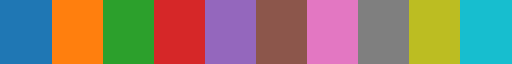

In [38]:
cmap

In [36]:
families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()

families_by_classes = families_by_classes.set_index("family_name").reindex(family_names)
# families_by_classes = families_by_classes[families_by_classes.index!='NaN']
#
families_by_classes

,Unnamed: 0,class_name
family_name,,
Alu,10,SINE
L1,0,LINE
MIR,14,SINE
L2,47,LINE
ERVL-MaLR,4,LTR
hAT-Charlie,20,DNA
ERV1,1,LTR
ERVL,74,LTR
TcMar-Tigger,25,DNA


### Clustermap of TE families epigenetic signal correlation with divergence

In [4]:
# OLD PEARSON
correlation_df_families = pd.read_csv(
    "Signal_vs_divergence_correlation_by_lines_mods_families.csv", index_col=0
).T
family_names = list(correlation_df_families.columns[2:])
correlation_df_families[family_names] = correlation_df_families[family_names].apply(
    pd.to_numeric, errors="coerce"
)
correlation_df_families.index = (
    correlation_df_families.cell_line + " " + correlation_df_families.modification
)

correlation_df_families

,cell_line,modification,Alu,L1,MIR,L2,ERVL-MaLR,hAT-Charlie,ERV1,ERVL,...,Crypton,Merlin,TcMar,L1-Tx1,Crypton-A,I-Jockey,hAT-Tip100?,TcMar-Pogo,hAT?,hAT-hAT19
Caco-2 H3K4me1,Caco-2,H3K4me1,-0.018999,0.039828,-0.026302,-0.038961,0.046021,0.005669,-0.066147,-0.012520,...,0.027711,-0.075347,-0.086243,0.017379,-0.069317,0.116690,-0.027092,0.096614,-0.211663,0.243772
Caco-2 H3K9me3,Caco-2,H3K9me3,-0.055464,-0.114642,0.025275,0.036340,-0.150697,-0.016158,-0.082342,-0.062872,...,-0.087752,-0.059357,0.046032,0.010203,-0.013074,0.105479,0.129788,0.043843,-0.250790,0.008245
SJCRH30 H3K27ac,SJCRH30,H3K27ac,0.004658,0.001126,-0.003323,-0.013861,-0.001626,0.001874,0.002776,0.010027,...,-0.013732,0.068116,0.068256,0.088740,0.002955,-0.122856,-0.050743,-0.270722,0.031531,-0.547277
SJCRH30 H3K4me1,SJCRH30,H3K4me1,0.025348,0.043100,-0.015347,-0.024799,0.031292,0.005338,0.008450,0.015652,...,-0.078451,-0.011970,-0.078868,0.120421,-0.173711,-0.018440,-0.018016,-0.129831,0.035511,-0.253199
SJCRH30 H3K9me3,SJCRH30,H3K9me3,0.046718,-0.139741,0.015748,0.052215,-0.088099,-0.003821,-0.050797,-0.023002,...,-0.076995,0.011064,-0.088146,-0.005165,-0.016046,0.142551,-0.037555,-0.004859,0.266456,0.036485
SJCRH30 H3K36me3,SJCRH30,H3K36me3,0.012634,0.050914,-0.019740,-0.020157,-0.039108,-0.034510,-0.004914,-0.048668,...,-0.064880,-0.125326,-0.021076,0.051247,-0.081348,-0.091567,-0.175213,-0.066469,0.177834,-0.038152
SJCRH30 H3K27me3,SJCRH30,H3K27me3,-0.003710,0.043250,0.005764,0.005116,0.005281,0.009759,-0.006299,0.014119,...,-0.034815,0.068136,-0.063760,-0.011381,0.070751,-0.191699,-0.016323,-0.204767,0.032937,0.264889
SJCRH30 H3K4me3,SJCRH30,H3K4me3,0.003112,-0.015858,-0.027011,-0.032358,0.000967,-0.007612,-0.006954,-0.006867,...,-0.071444,0.074966,0.001755,0.066325,-0.068680,-0.101589,-0.162822,-0.129648,-0.111509,0.067185
BE2C H3K4me1,BE2C,H3K4me1,0.041314,0.054200,-0.011134,-0.012436,-0.001139,0.000815,-0.001238,0.015808,...,-0.014154,0.016729,-0.052536,-0.080493,-0.093513,-0.003836,0.016871,-0.320122,-0.418834,0.316345
BE2C H3K9me3,BE2C,H3K9me3,-0.008656,-0.117563,-0.001378,0.016489,-0.081324,-0.007354,-0.071925,-0.009094,...,0.024083,-0.066273,0.007990,-0.161469,-0.091438,0.002622,0.106712,-0.326028,-0.045586,0.212522


In [5]:
correlation_df_families = (
    pd.read_csv(
        "Signal_vs_true_div_corr_by_lines_mods_families_cut_100.csv", index_col=0
    )
    .pivot_table(values="r", columns="family_name", index=["cell_line", "modification"])
    .reset_index()
)
correlation_df_families.index = (
    correlation_df_families.cell_line + " " + correlation_df_families.modification
)
correlation_df_families

family_name,cell_line,modification,5S-Deu-L2,Alu,CR1,Crypton,Crypton-A,Dong-R4,ERV1,ERVK,...,hAT-Blackjack,hAT-Charlie,hAT-Tag1,hAT-Tip100,hAT-Tip100?,hAT-hAT19,hAT?,tRNA,tRNA-Deu,tRNA-RTE
22Rv1 CTCF,22Rv1,CTCF,-0.071760,-0.062231,-0.041243,-0.026942,-0.078168,0.048389,-0.095827,-0.014669,...,-0.033115,-0.029322,-0.005905,-0.032785,0.034936,0.067647,-0.348510,-0.048784,-0.090174,-0.032463
22Rv1 H3K27ac,22Rv1,H3K27ac,-0.018673,-0.035189,-0.057834,-0.008276,0.102838,0.010792,-0.084557,-0.007979,...,-0.043622,-0.033804,-0.055512,-0.030106,0.188416,0.229412,-0.068296,-0.031605,-0.121135,-0.040452
BE2C H3K27me3,BE2C,H3K27me3,-0.028199,-0.011749,-0.015812,0.075779,-0.093950,-0.022264,-0.000557,-0.006322,...,-0.022424,0.014755,-0.014258,0.004654,0.120680,0.191176,0.166110,-0.034709,-0.033930,0.031596
BE2C H3K36me3,BE2C,H3K36me3,-0.029109,0.003377,-0.032392,-0.010099,-0.043803,-0.011514,-0.031812,0.007674,...,-0.000475,-0.032299,-0.038620,-0.006102,0.053667,0.273529,0.088235,-0.007455,-0.061205,0.007612
BE2C H3K4me1,BE2C,H3K4me1,0.013620,0.043969,-0.022527,-0.033849,-0.092602,-0.044125,0.014272,-0.014130,...,0.002292,-0.001865,-0.052370,0.013737,0.068068,0.117647,-0.150401,0.016668,0.018420,-0.002369
BE2C H3K9me3,BE2C,H3K9me3,-0.019544,-0.014321,0.014595,0.019057,-0.001577,-0.017002,-0.099402,0.083704,...,0.015989,-0.008542,-0.019877,0.005122,0.156442,0.052941,0.107286,0.002798,-0.050532,0.021652
C4-2B CTCF,C4-2B,CTCF,0.074413,0.260750,0.054674,0.028496,-0.110501,0.087212,0.184018,0.114199,...,0.073930,0.053085,0.077659,0.062127,0.222203,0.152941,0.269051,0.078944,-0.008652,0.079038
C4-2B H3K27ac,C4-2B,H3K27ac,-0.067378,0.096848,-0.057483,0.067951,-0.011831,-0.064079,-0.172882,-0.011507,...,-0.086829,-0.044898,-0.024081,-0.044955,-0.199176,0.045455,0.073529,-0.156724,-0.083933,-0.075529
Caco-2 H3K4me1,Caco-2,H3K4me1,0.018828,-0.007505,-0.035846,0.020730,-0.050273,-0.050886,-0.032818,0.093810,...,-0.032266,0.006815,-0.086531,-0.002760,0.098260,0.347059,-0.296791,-0.006201,0.038971,-0.036929
Caco-2 H3K9me3,Caco-2,H3K9me3,0.023514,-0.064759,0.040896,-0.034472,0.002242,-0.014842,-0.116179,0.073436,...,0.001382,-0.013068,0.001010,-0.018123,0.282280,0.344118,-0.217580,0.003934,0.028935,0.000672


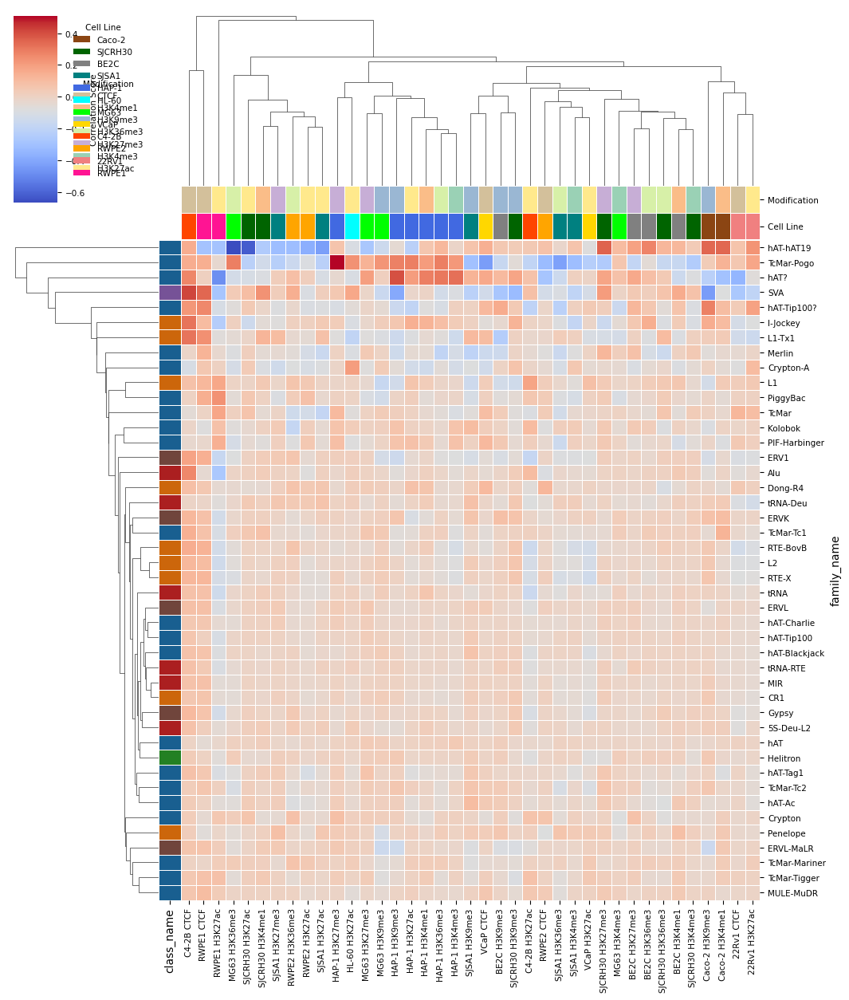

In [6]:
plt.rcParams["svg.fonttype"] = "none"
GLOBAL_FONT_SIZE = 7.5
# --- 1. Prepare Row Colors ---
# Map the 'cell_line' and 'modification' columns to their respective colors


mapped_cell_colors = correlation_df_families["cell_line"].map(cell_line_p)
mapped_mod_colors = correlation_df_families["modification"].map(modification_p_richer)

families_counts = pd.read_csv("repeat_masker_family_name_counts.csv")
# families_counts

families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()

families_by_classes = families_by_classes.set_index("family_name").reindex(family_names)
mapped_families_colors = families_by_classes["class_name"].map(class_names_p)

# Create a DataFrame for the row_colors argument
# The column names (e.g., 'Cell Line') will appear as labels.
row_colors_df = pd.DataFrame(
    {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
)
# Important: The index must align with the data being plotted
row_colors_df.index = correlation_df_families.index


# --- 2. Plot the Clustermap ---
data_to_plot = correlation_df_families[family_names].T
data_to_plot

g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    # Goal 1: Customize figsize
    figsize=(11, 13),
    # Goal 2 & 3: Add row colors using the mapped palettes
    # We use row_colors, as 'cell_line' and 'modification' describe the rows
    col_colors=row_colors_df[["Modification", "Cell Line"]],
    row_colors=mapped_families_colors,
    # Other aesthetic improvements
    # vmin=-1, vmax=1,          # Set colorbar limits for correlation
    linewidths=0.5,
    cbar_kws={"label": "Pearson Correlation"},
    # metric='correlation'      # Use correlation for clustering distance
)

# A) Heatmap Tick Labels
g.ax_heatmap.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, fontsize=GLOBAL_FONT_SIZE)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=GLOBAL_FONT_SIZE)

# B) Colorbar Styling
g.ax_cbar.set_ylabel("Correlation Score", fontsize=GLOBAL_FONT_SIZE)
g.ax_cbar.tick_params(labelsize=GLOBAL_FONT_SIZE)

# C) Column Color labels (Modification / Cell Line labels on the axis)
# FIXED: We removed the .axes.flatten() call which caused the AttributeError.
# Seaborn clustermap typically uses a single Axes object for col_colors.
if g.ax_col_colors is not None:
    g.ax_col_colors.tick_params(labelsize=GLOBAL_FONT_SIZE)
    # Update the axis labels (e.g., "Modification", "Cell Line")
    g.ax_col_colors.yaxis.label.set_size(GLOBAL_FONT_SIZE)
    # In some versions/configurations, these might be rendered as tick labels
    plt.setp(g.ax_col_colors.get_yticklabels(), fontsize=GLOBAL_FONT_SIZE)

# D) Manual Legends (Crucial for explaining the color strips)
cell_legend = [Patch(facecolor=c, label=l) for l, c in cell_line_p.items()]
mod_legend = [Patch(facecolor=c, label=l) for l, c in modification_p_richer.items()]

# Legend 1: Cell Line
l1 = plt.legend(
    handles=cell_legend,
    title="Cell Line",
    loc="upper left",
    bbox_to_anchor=(1.2, 1.0),
    frameon=False,
    fontsize=GLOBAL_FONT_SIZE,
    title_fontsize=GLOBAL_FONT_SIZE,
)
g.fig.add_artist(l1)

# Legend 2: Modification
plt.legend(
    handles=mod_legend,
    title="Modification",
    loc="upper left",
    bbox_to_anchor=(1.2, 0.7),
    frameon=False,
    fontsize=GLOBAL_FONT_SIZE,
    title_fontsize=GLOBAL_FONT_SIZE,
)

# --- 3. Save the Figure ---
save_path = "./plots/signal_to_true_div_spearman_clustermap_families.svg"


# Goal 4: Save as SVG
g.savefig(save_path, format="svg", transparent=True)


plt.show()

INFO: Setting up the data and palettes...
  -> Preparing row and column colors...
  -> Generating initial clustermap...
  -> Preparing data for bar plot...
  -> Resizing axes and adding bar plot...
  -> Tidying up final plot...
SUCCESS: Clustermap saved to ./plots/signal_to_divergence_corr_clustermap_families_with_barplot.svg


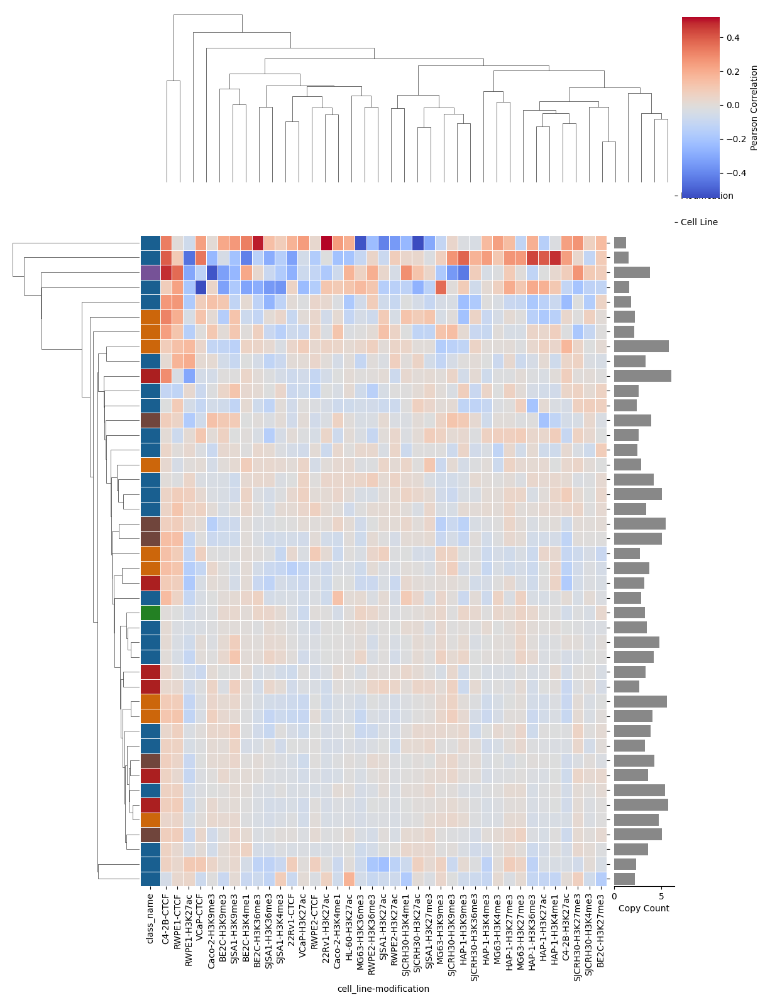

In [62]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec


# --- Setup: Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    @staticmethod
    def step(message):
        print(f"  -> {message}")


Logger.info("Setting up the data and palettes...")

families_counts = pd.read_csv("repeat_masker_family_name_counts.csv")
families_counts.columns = ["family_name", "count"]
families_counts["count"] = np.log10(families_counts["count"])

families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()

# --- 1. Prepare Row Colors ---
Logger.step("Preparing row and column colors...")
# Map the 'cell_line' and 'modification' columns to their respective colors
mapped_cell_colors = correlation_df_families["cell_line"].map(cell_line_p)
mapped_mod_colors = correlation_df_families["modification"].map(modification_p_richer)

families_by_classes = families_by_classes.set_index("family_name").reindex(family_names)
mapped_families_colors = families_by_classes["class_name"].map(class_names_p)

# Create a DataFrame for the row_colors argument
row_colors_df = pd.DataFrame(
    {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
)
row_colors_df.index = correlation_df_families.index

# --- 2. Plot the Clustermap ---
Logger.step("Generating initial clustermap...")
data_to_plot = correlation_df_families.set_index(["cell_line", "modification"])[
    family_names
].T

g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    figsize=(12, 16),
    # Column colors (for cell line and modification)
    col_colors=row_colors_df[["Modification", "Cell Line"]],
    # Row colors (for repeat class)
    row_colors=mapped_families_colors,
    linewidths=0.5,
    cbar_kws={"label": "Pearson Correlation"},
    # vmin=-1, vmax=1 # Good practice for correlation
)

# --- 3. Prepare Bar Plot Data ---
Logger.step("Preparing data for bar plot...")
# Get the reordered family names from the clustermap's row dendrogram
reordered_indices = g.dendrogram_row.reordered_ind
reordered_families = data_to_plot.index[reordered_indices]

# Load and prepare the counts data
# Set index to 'family_name' to allow reindexing
families_counts = families_counts.set_index("family_name")

# Reorder the counts to match the clustermap's row order
counts_reordered = families_counts.reindex(reordered_families)

# --- 4. Resize Axes and Add Bar Plot ---
Logger.step("Resizing axes and adding bar plot...")

# Get current positions
heatmap_pos = g.ax_heatmap.get_position()
cbar_pos = g.cax.get_position()

# Define new widths
bar_width = 0.08  # 8% of figure width for bars
space = 0.01

# Shrink heatmap to make space
new_heatmap_width = heatmap_pos.width - bar_width - space
g.ax_heatmap.set_position(
    [heatmap_pos.x0, heatmap_pos.y0, new_heatmap_width, heatmap_pos.height]
)

# Add new axis for the bar plot
bar_ax_left = heatmap_pos.x0 + new_heatmap_width + space
bar_ax = g.fig.add_axes([bar_ax_left, heatmap_pos.y0, bar_width, heatmap_pos.height])

# Move colorbar to the right of the new bar plot
new_cbar_left = bar_ax_left + bar_width + space
g.cax.set_position(
    [new_cbar_left, cbar_pos.y0, cbar_pos.width, cbar_pos.height]
)  # Keep original width

# --- 5. Plot the horizontal bar chart ---
sns.barplot(
    y=counts_reordered.index,
    x=counts_reordered["count"],  # Assumes 'count' column
    orient="h",
    ax=bar_ax,
    color="#888888",  # Neutral gray
)

# --- 6. Tidy up all axes ---
Logger.step("Tidying up final plot...")

# Tidy the new bar plot axis
bar_ax.set_yticks([])  # Remove y-tick labels
bar_ax.set_ylabel("")  # Remove y-axis label
bar_ax.set_xlabel("Copy Count")
bar_ax.spines["top"].set_visible(False)
bar_ax.spines["right"].set_visible(False)
bar_ax.spines["left"].set_visible(False)

# Tidy the main heatmap
g.ax_heatmap.set_yticklabels([])  # Remove family names (now redundant)
g.ax_heatmap.set_ylabel("")  # Remove row label

# --- 7. Save the Figure ---
save_path = "./plots/signal_to_divergence_corr_clustermap_families_with_barplot.svg"
os.makedirs(os.path.dirname(save_path), exist_ok=True)  # Ensure dir exists

# Save as SVG
g.savefig(save_path, format="svg")
Logger.success(f"Clustermap saved to {save_path}")

plt.show()

In [9]:
(correlation_df_families[family_names].abs() > 0.3).sum().sum()

33

### Clustering vs average divergence or counts barplot

In [9]:
reordered_indices = g.dendrogram_row.reordered_ind
reordered_families = data_to_plot.index[reordered_indices]
reordered_families

Index(['hAT-hAT19', 'hAT?', 'SVA', 'TcMar-Pogo', 'hAT-Tip100?', 'L1-Tx1',
       'I-Jockey', 'L1', 'PiggyBac', 'Alu', 'Kolobok', 'Merlin', 'ERVK',
       'PIF-Harbinger', 'Crypton', 'Penelope', 'TcMar-Mariner', 'TcMar-Tigger',
       'MULE-MuDR', 'ERVL-MaLR', 'ERV1', 'Dong-R4', 'RTE-BovB', 'tRNA',
       'TcMar-Tc1', 'Helitron', 'hAT', 'hAT-Tip100', 'hAT-Blackjack',
       '5S-Deu-L2', 'tRNA-Deu', 'L2', 'RTE-X', 'TcMar-Tc2', 'hAT-Tag1',
       'Gypsy', 'tRNA-RTE', 'hAT-Charlie', 'MIR', 'CR1', 'ERVL', 'hAT-Ac',
       'TcMar', 'Crypton-A'],
      dtype='object')

In [33]:
repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
divergence_average = pd.DataFrame(
    repeat_masker_average_true_div[["kimura_divCpGMod_weighted_average", "family_name"]]
    .groupby("family_name")
    .mean()["kimura_divCpGMod_weighted_average"]
)
divergence_average

,kimura_divCpGMod_weighted_average
family_name,
5S-Deu-L2,33.172935
Alu,8.573589
CR1,38.909164
Crypton,27.207282
Crypton-A,27.342308
Dong-R4,35.306294
ERV1,16.530684
ERVK,7.123898
ERVL,25.515311


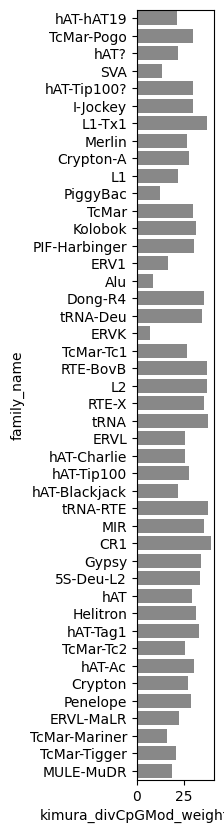

In [34]:
# Get the reordered family names from the clustermap's row dendrogram
reordered_indices = g.dendrogram_row.reordered_ind
reordered_families = data_to_plot.index[reordered_indices]

# Load and prepare the counts data
# Set index to 'family_name' to allow reindexing


# Reorder the counts to match the clustermap's row order
divergence_average = divergence_average.reindex(reordered_families)

# Define new widths
bar_width = 0.08  # 8% of figure width for bars
space = 0.01

fig, ax = plt.subplots(figsize=(1, 10))
# --- 5. Plot the horizontal bar chart ---
sns.barplot(
    y=divergence_average.index,
    x=divergence_average["kimura_divCpGMod_weighted_average"],  # Assumes 'count' column
    orient="h",
    # ax=bar_ax,
    color="#888888",  # Neutral gray
)

save_path = "./plots/average_true_div_families_barplot.svg"
# Save as SVG
plt.savefig(save_path, format="svg")

plt.show()

In [38]:
families_counts = pd.read_csv("repeat_masker_family_name_counts.csv").set_index(
    "Unnamed: 0"
)
families_counts.columns = ["count"]
families_counts["log10_count"] = np.log10(families_counts["count"])
families_counts

,count,log10_count
Unnamed: 0,,
Alu,1164096,6.065989
L1,565459,5.752401
MIR,534149,5.727662
L2,373176,5.571914
ERVL-MaLR,259882,5.414776
hAT-Charlie,232104,5.365683
ERV1,116610,5.066736
ERVL,116199,5.065202
TcMar-Tigger,106067,5.025580


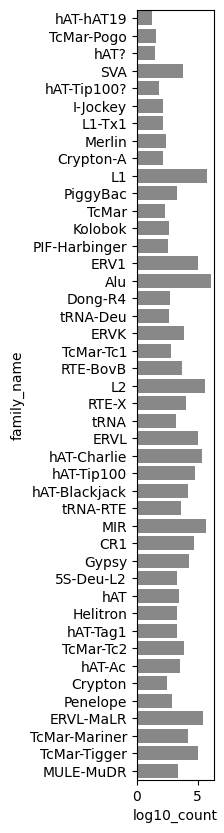

In [39]:
# Get the reordered family names from the clustermap's row dendrogram
reordered_indices = g.dendrogram_row.reordered_ind
reordered_families = data_to_plot.index[reordered_indices]

families_counts = families_counts.reindex(reordered_families)

# Define new widths
bar_width = 0.08  # 8% of figure width for bars
space = 0.01

fig, ax = plt.subplots(figsize=(1, 10))
# --- 5. Plot the horizontal bar chart ---
sns.barplot(
    y=families_counts.index,
    x=families_counts["log10_count"],  # Assumes 'count' column
    orient="h",
    # ax=bar_ax,
    color="#888888",  # Neutral gray
)

save_path = "./plots/counts_families_barplot.svg"
# Save as SVG
plt.savefig(save_path, format="svg")

plt.show()

### Clustermap stability control by different cut-offs by kimura divergence

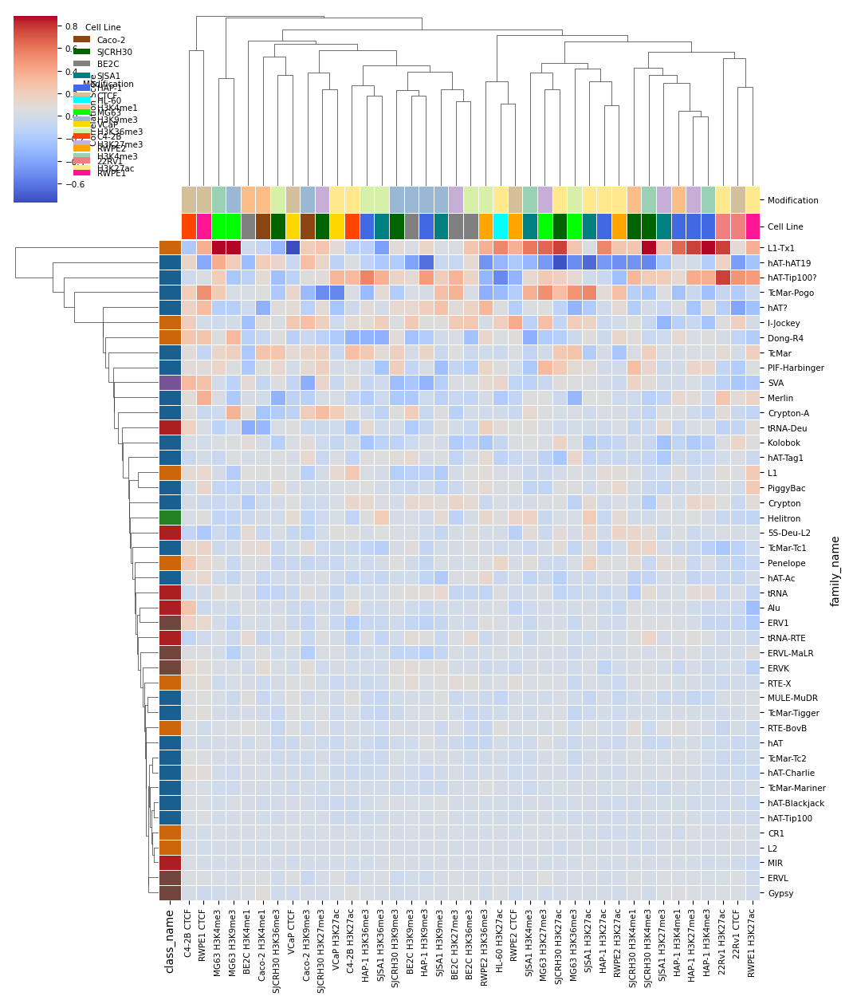

In [27]:
div_threshold = 25

correlation_df_families = (
    pd.read_csv(
        f"Signal_vs_true_div_corr_by_lines_mods_families_cut_{str(div_threshold)}.csv",
        index_col=0,
    )
    .pivot_table(values="r", columns="family_name", index=["cell_line", "modification"])
    .reset_index()
)
correlation_df_families.index = (
    correlation_df_families.cell_line + " " + correlation_df_families.modification
)
family_names = list(correlation_df_families.columns[2:])


plt.rcParams["svg.fonttype"] = "none"
GLOBAL_FONT_SIZE = 7.5
# --- 1. Prepare Row Colors ---
# Map the 'cell_line' and 'modification' columns to their respective colors


mapped_cell_colors = correlation_df_families["cell_line"].map(cell_line_p)
mapped_mod_colors = correlation_df_families["modification"].map(modification_p_richer)

families_counts = pd.read_csv("repeat_masker_family_name_counts.csv")
# families_counts

families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()

families_by_classes = families_by_classes.set_index("family_name").reindex(family_names)
mapped_families_colors = families_by_classes["class_name"].map(class_names_p)

# Create a DataFrame for the row_colors argument
# The column names (e.g., 'Cell Line') will appear as labels.
row_colors_df = pd.DataFrame(
    {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
)
# Important: The index must align with the data being plotted
row_colors_df.index = correlation_df_families.index


# --- 2. Plot the Clustermap ---
data_to_plot = correlation_df_families[family_names].T
data_to_plot

g_cut = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    # Goal 1: Customize figsize
    figsize=(11, 13),
    # Goal 2 & 3: Add row colors using the mapped palettes
    # We use row_colors, as 'cell_line' and 'modification' describe the rows
    col_colors=row_colors_df[["Modification", "Cell Line"]],
    row_colors=mapped_families_colors,
    # Other aesthetic improvements
    # vmin=-1, vmax=1,          # Set colorbar limits for correlation
    linewidths=0.5,
    cbar_kws={"label": "Pearson Correlation"},
    # metric='correlation'      # Use correlation for clustering distance
)

# A) Heatmap Tick Labels
g_cut.ax_heatmap.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
plt.setp(g_cut.ax_heatmap.get_xticklabels(), rotation=90, fontsize=GLOBAL_FONT_SIZE)
plt.setp(g_cut.ax_heatmap.get_yticklabels(), rotation=0, fontsize=GLOBAL_FONT_SIZE)

# B) Colorbar Styling
g_cut.ax_cbar.set_ylabel("Correlation Score", fontsize=GLOBAL_FONT_SIZE)
g_cut.ax_cbar.tick_params(labelsize=GLOBAL_FONT_SIZE)

# C) Column Color labels (Modification / Cell Line labels on the axis)
# FIXED: We removed the .axes.flatten() call which caused the AttributeError.
# Seaborn clustermap typically uses a single Axes object for col_colors.
if g_cut.ax_col_colors is not None:
    g_cut.ax_col_colors.tick_params(labelsize=GLOBAL_FONT_SIZE)
    # Update the axis labels (e.g., "Modification", "Cell Line")
    g_cut.ax_col_colors.yaxis.label.set_size(GLOBAL_FONT_SIZE)
    # In some versions/configurations, these might be rendered as tick labels
    plt.setp(g_cut.ax_col_colors.get_yticklabels(), fontsize=GLOBAL_FONT_SIZE)

# D) Manual Legends (Crucial for explaining the color strips)
cell_legend = [Patch(facecolor=c, label=l) for l, c in cell_line_p.items()]
mod_legend = [Patch(facecolor=c, label=l) for l, c in modification_p_richer.items()]

# Legend 1: Cell Line
l1 = plt.legend(
    handles=cell_legend,
    title="Cell Line",
    loc="upper left",
    bbox_to_anchor=(1.2, 1.0),
    frameon=False,
    fontsize=GLOBAL_FONT_SIZE,
    title_fontsize=GLOBAL_FONT_SIZE,
)
g_cut.fig.add_artist(l1)

# Legend 2: Modification
plt.legend(
    handles=mod_legend,
    title="Modification",
    loc="upper left",
    bbox_to_anchor=(1.2, 0.7),
    frameon=False,
    fontsize=GLOBAL_FONT_SIZE,
    title_fontsize=GLOBAL_FONT_SIZE,
)

# --- 3. Save the Figure ---
save_path = f"./plots/signal_to_true_div_spearman_clustermap_families_cut_{str(div_threshold)}.svg"


# Goal 4: Save as SVG
g_cut.savefig(save_path, format="svg", transparent=True)


plt.show()

#### Comparison of dengrogram between clustermaps

In [12]:
g

In [15]:
len(g.dendrogram_row.reordered_ind)

44

In [16]:
len(g_cut.dendrogram_row.reordered_ind)

41

Comparing trees based on 44 common terminal nodes.
Running 499 permutations on common leaf subset...
Observed Congruence: -0.1738
P-value: 0.9180


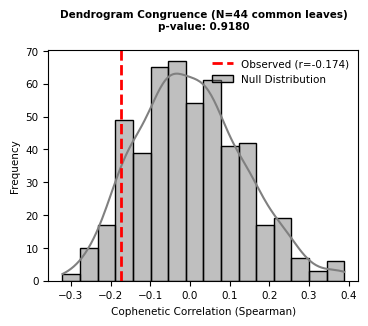

Success: Permutation test plot saved to plots/dendrogram_congruence_test_all_vs_25_cut.svg


In [28]:
results = test_dendrogram_congruence(g, g_cut, method="spearman", n_permutations=499)

print(f"Observed Congruence: {results['observed_correlation']:.4f}")
print(f"P-value: {results['p_value']:.4f}")

plot_test_results(
    results, output_path="plots/dendrogram_congruence_test_all_vs_25_cut.svg"
)

### Connection of correlation with average divergence, average length and count by family

In [5]:
repeat_masker_average_true_div["length"] = (
    repeat_masker_average_true_div["end"] - repeat_masker_average_true_div["start"]
)
repeat_masker_average_true_div

,Unnamed: 0.1,Unnamed: 0,chromosome,start,end,score,subfamily_name,family_name,class_name,rep_chromosome,...,gap_init_rate,avg_gap_size,kimura_divCpGMod,cpg_sites,kimura_unadjusted,perc_div_weighted_average,ts_tv_ratio_weighted_average,kimura_divCpGMod_weighted_average,kimura_unadjusted_weighted_average,length
0,0,0,chr1,0,7536,223,L1MC3,L1,LINE,"chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,chr1,c...",...,"0.07,0.04,0.03,0.09","2.33,1.0,2.96,1.33","17.61,29.4,29.4,23.5","23.0,159.0,159.0,41.0","17.61,30.43,30.43,24.22",22.354286,1.282471,26.404275,27.216867,7536
1,1,1,chr1,4082,4796,273,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1",...,"0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07",25.821562,1.765625,28.833437,33.202813,714
2,2,2,chr1,4082,4837,205,LTR60B,ERV1,LTR,"chr1,chr1,chr1,chr1",...,"0.05,0.03","2.77,2.5","30.73,22.06","81.0,13.0","35.76,24.07",25.821562,1.765625,28.833437,33.202813,755
3,3,3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,"chr1,chr1,chr1",...,0.02,1.4,16.85,28.0,16.85,14.680000,3.110000,16.850000,16.850000,583
4,4,4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,"chr1,chr1",...,0.03,2.13,13.51,46.0,17.06,14.800000,2.420000,13.510000,17.060000,446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3709424,3709424,3709424,chrY,62443446,62449578,84,L1P1,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",...,0.0,6.5,6.87,73.0,9.06,8.420000,1.740000,6.870000,9.060000,6132
3709425,3709425,3709425,chrY,62445666,62449071,338,L2a,L2,LINE,"chrY,chrY,chrY,chrY,chrY,chrY",...,0.04,3.5,41.04,32.0,47.82,33.800000,2.000000,41.040000,47.820000,3405
3709426,3709426,3709426,chrY,62446656,62452812,204,L1MC5a,L1,LINE,"chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY,chrY",...,0.08,2.77,23.11,24.0,23.11,19.200000,3.000000,23.110000,23.110000,6156
3709427,3709427,3709427,chrY,62448384,62448649,230,MIR3,MIR,SINE,"chrY,chrY",...,0.03,1.5,26.46,13.0,28.3,22.500000,2.600000,26.460000,28.300000,265


In [23]:
div_threshold = 100
correlation_df_families = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_families_cut_{str(div_threshold)}.csv",
    index_col=0,
)
correlation_df_families["abs_r"] = correlation_df_families.r.abs()
corrs_average = (
    correlation_df_families[["family_name", "abs_r"]].groupby(["family_name"]).mean()
)


repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
repeat_masker_average_true_div["length"] = (
    repeat_masker_average_true_div["end"] - repeat_masker_average_true_div["start"]
)

divergence_average = pd.DataFrame(
    repeat_masker_average_true_div[["kimura_divCpGMod_weighted_average", "family_name"]]
    .groupby("family_name")
    .mean()["kimura_divCpGMod_weighted_average"]
)

length_average = pd.DataFrame(
    repeat_masker_average_true_div[["length", "family_name"]]
    .groupby("family_name")
    .mean()["length"]
)

families_counts = pd.read_csv("repeat_masker_family_name_counts.csv")
families_counts.columns = ["family_name", "count"]
families_counts["log10_count"] = np.log10(families_counts["count"])
families_counts = families_counts.set_index("family_name").reindex(corrs_average.index)


families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()

families_by_classes = families_by_classes.set_index("family_name").reindex(
    corrs_average.index
)

data_to_plot = pd.concat(
    [
        corrs_average,
        divergence_average,
        length_average,
        families_counts[["count", "log10_count"]],
        families_by_classes["class_name"],
    ],
    axis=1,
)
data_to_plot.columns = [
    "average_abs_corr",
    "average_divergence",
    "average_length",
    "count",
    "log10_count",
    "class_name",
]
data_relevant = data_to_plot.copy()
data_to_plot

,average_abs_corr,average_divergence,average_length,count,log10_count,class_name
family_name,,,,,,
5S-Deu-L2,0.025963,33.172935,582.342249,2019,3.305136,SINE
Alu,0.040911,8.573589,316.017310,1164096,6.065989,SINE
CR1,0.031553,38.909164,3814.418352,49193,4.691903,LINE
Crypton,0.038752,27.207282,339.711475,305,2.484300,DNA
Crypton-A,0.071438,27.342308,280.286667,150,2.176091,DNA
Dong-R4,0.039933,35.306294,3873.834990,503,2.701568,LINE
ERV1,0.063349,16.530684,1700.077395,116610,5.066736,LTR
ERVK,0.036864,7.123898,1733.813977,7870,3.895975,LTR
ERVL,0.028364,25.515311,1259.079502,116199,5.065202,LTR


In [33]:
data_to_plot.T["hAT-hAT19"]

average_abs_corr        0.193699
average_divergence     21.446875
average_length        121.944444
count                         18
log10_count             1.255273
class_name                   DNA
Name: hAT-hAT19, dtype: object

<AxesSubplot:xlabel='log10_count', ylabel='average_abs_corr'>

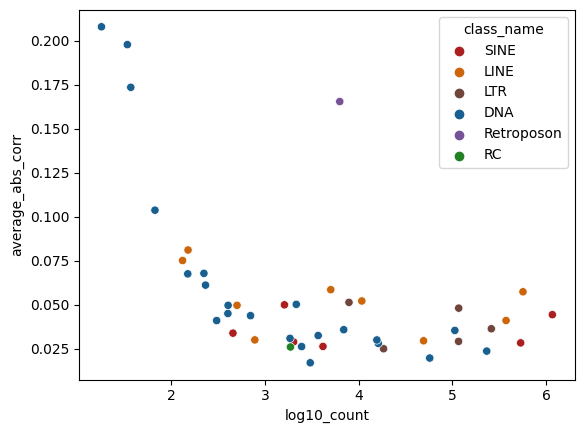

In [9]:
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x="log10_count",
    y="average_abs_corr",
    palette=class_names_p,
)

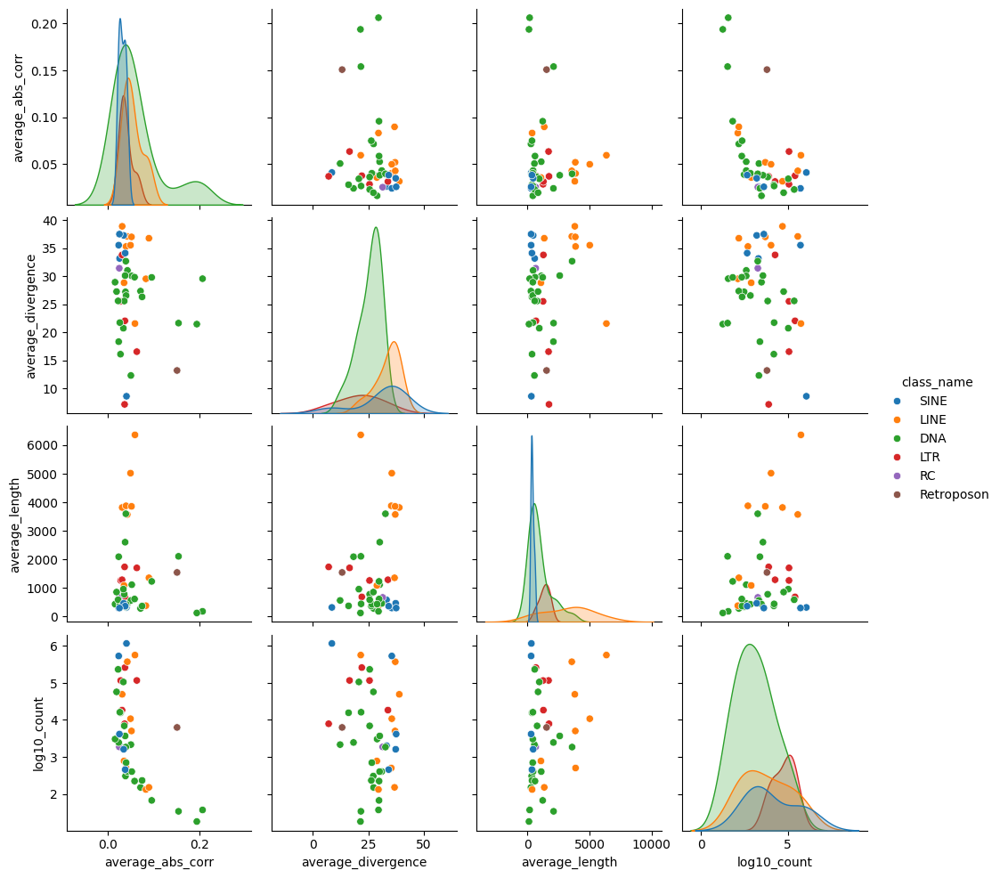

In [4]:
sns.pairplot(
    data=data_to_plot[
        [
            "average_abs_corr",
            "average_divergence",
            "average_length",
            "log10_count",
            "class_name",
        ]
    ],
    hue="class_name",
)

Fitting sigmoidal curve...
0.9334745312546141
-0.012956686050482997
Generating plot...
Plot saved to ./plots/average_abs_corr_vs_average_length_spearman_true_TE_families.svg


/tmp/ipykernel_147/176008729.py:35: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(sigmoid, x_data, y_data, p0=p0, maxfev=5000)


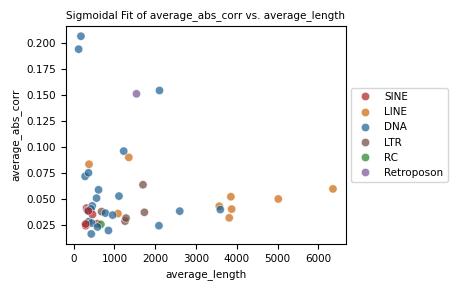

In [7]:
x_column = "average_length"
y_column = "average_abs_corr"

GLOBAL_FONT_SIZE = 7.5


# --- 2. Define the sigmoidal function ---
def sigmoid(x, L, k, x0):
    """
    Sigmoidal (logistic) function.
    L: maximum value (the asymptote)
    k: steepness of the curve
    x0: the x-value of the sigmoid's midpoint
    """
    return L / (1 + np.exp(-k * (x - x0)))


# --- 3. Prepare data and perform the fit ---
print("Fitting sigmoidal curve...")


# Drop NaNs to ensure alignment and prevent errors
fit_data = data_to_plot[[x_column, y_column]].dropna()
x_data = fit_data[x_column]
y_data = fit_data[y_column]

# Provide initial guesses for the parameters [L, k, x0]
# L: guess the max value of y
# k: guess 1 (steepness)
# x0: guess the median value of x
p0 = [y_data.max(), 1, x_data.median()]

try:
    # Fit the curve
    popt, pcov = curve_fit(sigmoid, x_data, y_data, p0=p0, maxfev=5000)
    L, k, x0 = popt
    fit_successful = True

    # --- 4. Calculate Statistics (R-squared and p-value) ---
    # Get the predicted y-values from the fit
    y_pred = sigmoid(x_data, *popt)

    # Calculate R-squared
    # (using Pearson correlation between actual and predicted)
    corr, p_value = stats.spearmanr(y_data, y_pred)
    r_squared = corr**2

    # Format p-value for display
    if p_value < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_value:.3f}"

    # Create the equation string for the plot
    equation_text = (
        f"y = {L:.2f} / (1 + exp(-{k:.2f} $\\cdot$ (x - {x0:.2f})))\n"
        f"$R^2$ = {r_squared:.3f}\n"
        f"{p_val_str}"
    )
    print(p_value)
    print(corr)

except RuntimeError:
    # This happens if the curve fit fails to converge
    print("Sigmoidal curve fit failed to converge.")
    fit_successful = False
    equation_text = "Fit failed to converge"


# --- 5. Create the Plot ---
print("Generating plot...")
# Create the figure and axes (for figsize customization)
fig, ax = plt.subplots(figsize=(5.5, 3))

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x=x_column,
    y=y_column,
    palette=class_names_p,
    ax=ax,
    alpha=0.7,
)

if fit_successful and False:
    # --- 6. Plot the Fitted Curve ---
    # Create a smooth x-axis for the curve
    x_fit = np.linspace(x_data.min(), x_data.max(), 200)
    y_fit = sigmoid(x_fit, *popt)

    # Plot the curve
    ax.plot(x_fit, y_fit, color="black", ls="--", lw=2.5, label="Sigmoid Fit")

    # --- 7. Add the Equation Textbox ---
    ax.text(
        0.05,
        0.95,  # Position in (x, y) coordinates (0.05=5% from left, 0.95=95% from top)
        equation_text,
        transform=ax.transAxes,  # Use axis-relative coordinates
        fontsize=GLOBAL_FONT_SIZE,
        verticalalignment="top",
        ha="left",
        # Add a light background box
        bbox=dict(facecolor="white", alpha=0.7, boxstyle="round,pad=0.5"),
    )

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=GLOBAL_FONT_SIZE)
ax.set_title(f"Sigmoidal Fit of {y_column} vs. {x_column}", fontsize=GLOBAL_FONT_SIZE)
ax.set_xlabel(x_column, fontsize=GLOBAL_FONT_SIZE)
ax.set_ylabel(y_column, fontsize=GLOBAL_FONT_SIZE)
ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
# ax.set_ylim((0, 0.225))


plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{y_column}_vs_{x_column}_spearman_true_TE_families.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

In [ ]:
GLOBAL_FONT_SIZE = 7.5


# --- 2. Define the sigmoidal function ---
def sigmoid(x, L, k, x0):
    """
    Sigmoidal (logistic) function.
    L: maximum value (the asymptote)
    k: steepness of the curve
    x0: the x-value of the sigmoid's midpoint
    """
    return L / (1 + np.exp(-k * (x - x0)))


# --- 3. Prepare data and perform the fit ---
print("Fitting sigmoidal curve...")

# Drop NaNs to ensure alignment and prevent errors
fit_data = data_to_plot[["log10_count", "average_abs_corr"]].dropna()
x_data = fit_data["log10_count"]
y_data = fit_data["average_abs_corr"]

# Provide initial guesses for the parameters [L, k, x0]
# L: guess the max value of y
# k: guess 1 (steepness)
# x0: guess the median value of x
p0 = [y_data.max(), 1, x_data.median()]

try:
    # Fit the curve
    popt, pcov = curve_fit(sigmoid, x_data, y_data, p0=p0, maxfev=5000)
    L, k, x0 = popt
    fit_successful = True

    # --- 4. Calculate Statistics (R-squared and p-value) ---
    # Get the predicted y-values from the fit
    y_pred = sigmoid(x_data, *popt)

    # Calculate R-squared
    # (using Pearson correlation between actual and predicted)
    corr, p_value = stats.pearsonr(y_data, y_pred)
    r_squared = corr**2

    # Format p-value for display
    if p_value < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_value:.3f}"

    # Create the equation string for the plot
    equation_text = (
        f"y = {L:.2f} / (1 + exp(-{k:.2f} $\\cdot$ (x - {x0:.2f})))\n"
        f"$R^2$ = {r_squared:.3f}\n"
        f"{p_val_str}"
    )
    print(p_value)

except RuntimeError:
    # This happens if the curve fit fails to converge
    print("Sigmoidal curve fit failed to converge.")
    fit_successful = False
    equation_text = "Fit failed to converge"


# --- 5. Create the Plot ---
print("Generating plot...")
# Create the figure and axes (for figsize customization)
fig, ax = plt.subplots(figsize=(5.5, 3))

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x="log10_count",
    y="average_abs_corr",
    palette=class_names_p,
    ax=ax,
    alpha=0.7,
)

if fit_successful:
    # --- 6. Plot the Fitted Curve ---
    # Create a smooth x-axis for the curve
    x_fit = np.linspace(x_data.min(), x_data.max(), 200)
    y_fit = sigmoid(x_fit, *popt)

    # Plot the curve
    ax.plot(x_fit, y_fit, color="black", ls="--", lw=2.5, label="Sigmoid Fit")

    # --- 7. Add the Equation Textbox ---
    ax.text(
        0.05,
        0.95,  # Position in (x, y) coordinates (0.05=5% from left, 0.95=95% from top)
        equation_text,
        transform=ax.transAxes,  # Use axis-relative coordinates
        fontsize=GLOBAL_FONT_SIZE,
        verticalalignment="top",
        ha="left",
        # Add a light background box
        bbox=dict(facecolor="white", alpha=0.7, boxstyle="round,pad=0.5"),
    )

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=GLOBAL_FONT_SIZE)
ax.set_title("Sigmoidal Fit of Correlation vs. Count", fontsize=GLOBAL_FONT_SIZE)
ax.set_xlabel("Count", fontsize=GLOBAL_FONT_SIZE)
ax.set_ylabel("Average Absolute Correlation", fontsize=GLOBAL_FONT_SIZE)
ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
ax.set_ylim((0, 0.225))


plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = "./plots/abs_average_spearman_corr_vs_count_TE.svg"
fig.savefig(save_path, format="svg")
print(f"Plot saved to {save_path}")

plt.show()

#### Random correlations

In [25]:
files = !ls Signal_vs_true_div_corr_by_lines_mods_families_random*
corrs_average_list = []

repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
divergence_average = pd.DataFrame(
    repeat_masker_average_true_div[["kimura_divCpGMod_weighted_average", "family_name"]]
    .groupby("family_name")
    .mean()["kimura_divCpGMod_weighted_average"]
)

families_counts = pd.read_csv("repeat_masker_family_name_counts.csv")
families_counts.columns = ["family_name", "count"]
families_counts["log10_count"] = np.log10(families_counts["count"])
families_counts = families_counts.set_index("family_name")


families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()
families_by_classes = families_by_classes.set_index("family_name")


for i, file in enumerate(files[:100]):
    correlation_df_families_local = pd.read_csv(
    file,
    index_col=0
    )
    correlation_df_families_local["abs_r"] = correlation_df_families_local.r.abs()
    corrs_average = (
    correlation_df_families_local[["family_name", "abs_r"]].groupby(["family_name"]).mean()
    )
    corrs_average_ann = pd.concat(
    [
        corrs_average,
        divergence_average,
        families_counts[["count", "log10_count"]],
        families_by_classes["class_name"],
    ],
    axis=1,
)
    corrs_average_ann.columns = [
        "average_abs_corr",
        "average_divergence",
        "count",
        "log10_count",
        "class_name",
    ]
    corrs_average_ann['random_repeat_number'] = i
    corrs_average_list.append(corrs_average_ann)
corrs_averages_random = pd.concat(corrs_average_list)
corrs_averages_random

,average_abs_corr,average_divergence,count,log10_count,class_name,random_repeat_number
family_name,,,,,,
5S-Deu-L2,0.017457,33.172935,2019,3.305136,SINE,0
Alu,0.000861,8.573589,1164096,6.065989,SINE,0
CR1,0.003836,38.909164,49193,4.691903,LINE,0
Crypton,0.037450,27.207282,305,2.484300,DNA,0
Crypton-A,0.077554,27.342308,150,2.176091,DNA,0
...,...,...,...,...,...,...
hAT-hAT19,0.199760,21.446875,18,1.255273,DNA,99
hAT?,0.165717,21.628089,34,1.531479,DNA,99
tRNA,0.019420,37.287610,1612,3.207365,SINE,99


Fitting sigmoidal curve...
6.29764828627607e-55
Generating plot...
Plot saved to ./plots/average_abs_corr_vs_average_divergence_spearman_true_TE_families_random.svg


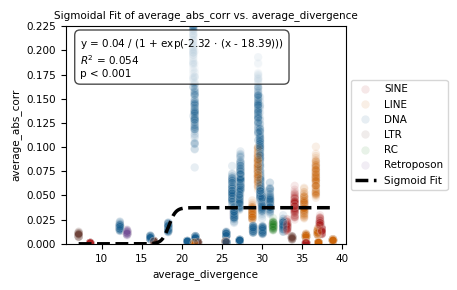

In [13]:
data_to_plot = corrs_averages_random


x_column = "average_divergence"
y_column = "average_abs_corr"

GLOBAL_FONT_SIZE = 7.5


# --- 2. Define the sigmoidal function ---
def sigmoid(x, L, k, x0):
    """
    Sigmoidal (logistic) function.
    L: maximum value (the asymptote)
    k: steepness of the curve
    x0: the x-value of the sigmoid's midpoint
    """
    return L / (1 + np.exp(-k * (x - x0)))


# --- 3. Prepare data and perform the fit ---
print("Fitting sigmoidal curve...")


# Drop NaNs to ensure alignment and prevent errors
fit_data = data_to_plot[[x_column, y_column]].dropna()
x_data = fit_data[x_column]
y_data = fit_data[y_column]

# Provide initial guesses for the parameters [L, k, x0]
# L: guess the max value of y
# k: guess 1 (steepness)
# x0: guess the median value of x
p0 = [y_data.max(), 1, x_data.median()]

try:
    # Fit the curve
    popt, pcov = curve_fit(sigmoid, x_data, y_data, p0=p0, maxfev=5000)
    L, k, x0 = popt
    fit_successful = True

    # --- 4. Calculate Statistics (R-squared and p-value) ---
    # Get the predicted y-values from the fit
    y_pred = sigmoid(x_data, *popt)

    # Calculate R-squared
    # (using Pearson correlation between actual and predicted)
    corr, p_value = stats.pearsonr(y_data, y_pred)
    r_squared = corr**2

    # Format p-value for display
    if p_value < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_value:.3f}"

    # Create the equation string for the plot
    equation_text = (
        f"y = {L:.2f} / (1 + exp(-{k:.2f} $\\cdot$ (x - {x0:.2f})))\n"
        f"$R^2$ = {r_squared:.3f}\n"
        f"{p_val_str}"
    )
    print(p_value)

except RuntimeError:
    # This happens if the curve fit fails to converge
    print("Sigmoidal curve fit failed to converge.")
    fit_successful = False
    equation_text = "Fit failed to converge"


# --- 5. Create the Plot ---
print("Generating plot...")
# Create the figure and axes (for figsize customization)
fig, ax = plt.subplots(figsize=(5.5, 3))

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x=x_column,
    y=y_column,
    palette=class_names_p,
    ax=ax,
    alpha=0.1,
)

if fit_successful:
    # --- 6. Plot the Fitted Curve ---
    # Create a smooth x-axis for the curve
    x_fit = np.linspace(x_data.min(), x_data.max(), 200)
    y_fit = sigmoid(x_fit, *popt)

    # Plot the curve
    ax.plot(x_fit, y_fit, color="black", ls="--", lw=2.5, label="Sigmoid Fit")

    # --- 7. Add the Equation Textbox ---
    ax.text(
        0.05,
        0.95,  # Position in (x, y) coordinates (0.05=5% from left, 0.95=95% from top)
        equation_text,
        transform=ax.transAxes,  # Use axis-relative coordinates
        fontsize=GLOBAL_FONT_SIZE,
        verticalalignment="top",
        ha="left",
        # Add a light background box
        bbox=dict(facecolor="white", alpha=0.7, boxstyle="round,pad=0.5"),
    )

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=GLOBAL_FONT_SIZE)
ax.set_title(f"Sigmoidal Fit of {y_column} vs. {x_column}", fontsize=GLOBAL_FONT_SIZE)
ax.set_xlabel(x_column, fontsize=GLOBAL_FONT_SIZE)
ax.set_ylabel(y_column, fontsize=GLOBAL_FONT_SIZE)
ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
ax.set_ylim((0, 0.225))


plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{y_column}_vs_{x_column}_spearman_true_TE_families_random.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

#### Compare random and relevant via F-Test for Nested Models - acknowledge the reviewers feedback

In [9]:
def sigmoid_decay(x, L, k, x0):
    """
    Sigmoidal decay (inverse logistic) function.
    L: maximum value (the asymptote)
    k: steepness of the curve
    x0: the x-value of the sigmoid's midpoint
    """
    return L / (1 + np.exp(k * (x - x0)))


def get_rss(y_true, y_pred):
    """Calculates the Residual Sum of Squares."""
    return np.sum((y_true - y_pred) ** 2)


def fit_sigmoid(x_data, y_data):
    """
    Fits a sigmoid_decay curve to X and Y data.
    Returns the optimal parameters and the RSS.
    """
    # Provide initial guesses for [L, k, x0]
    # L: guess the max value of y
    # k: guess 1.0 (steepness)
    # x0: guess the median value of x
    p0 = [np.max(y_data), 1.0, np.median(x_data)]

    try:
        popt, _ = curve_fit(sigmoid_decay, x_data, y_data, p0=p0, maxfev=5000)
        # Calculate RSS
        y_pred = sigmoid_decay(x_data, *popt)
        rss = get_rss(y_data, y_pred)
        return popt, rss
    except RuntimeError as e:
        print(f"Error: Curve fitting failed - {e}")
        return None, np.inf


# --- 2. Combine Datasets ---

data_control = corrs_averages_random.copy()
data_relevant["group"] = "relevant"
data_control["group"] = "control"
data_all = pd.concat([data_relevant, data_control]).reset_index(drop=True)

# Define X and Y for all datasets
x_all = data_all["log10_count"]
y_all = data_all["average_abs_corr"]

x_rel = data_relevant["log10_count"]
y_rel = data_relevant["average_abs_corr"]

x_con = data_control["log10_count"]
y_con = data_control["average_abs_corr"]

N_all = len(data_all)
N_rel = len(data_relevant)
N_con = len(data_control)

# --- 3. Fit the Null Model (H₀) ---
# H₀: One single curve fits all data.
print("--- Fitting Null Model (H₀) ---")
popt_null, RSS_null = fit_sigmoid(x_all, y_all)
if RSS_null == np.inf:
    print("FATAL: Could not fit the Null Model. Stopping.")
else:
    K_null = 3  # 3 parameters (L, k, x0)
    df_null = N_all - K_null
    print(f"  - RSS_null: {RSS_null:.4f}")
    print(f"  - df_null (N - K_null): {df_null}")

    # --- 4. Fit the Alternative Model (H₁) ---
    # H₁: Two separate curves (one for each group) fit the data.
    print("\n--- Fitting Alternative Model (H₁) ---")
    popt_rel, RSS_relevant = fit_sigmoid(x_rel, y_rel)
    popt_con, RSS_control = fit_sigmoid(x_con, y_con)

    if RSS_relevant == np.inf or RSS_control == np.inf:
        print("FATAL: Could not fit one of the alternative models. Stopping.")
    else:
        RSS_alt = RSS_relevant + RSS_control
        K_alt = 6  # 3 params for 'relevant' + 3 params for 'control'
        df_alt = N_all - K_alt  # (or (N_rel - 3) + (N_con - 3))

        print(f"  - RSS_relevant: {RSS_relevant:.4f}")
        print(f"  - RSS_control: {RSS_control:.4f}")
        print(f"  - RSS_alt (combined): {RSS_alt:.4f}")
        print(f"  - df_alt (N - K_alt): {df_alt}")

        # --- 5. Perform the F-Test ---
        print("\n--- F-Test Results ---")

        # Degrees of freedom for the test
        df1 = df_null - df_alt  # Number of *extra* parameters (K_alt - K_null = 3)
        df2 = df_alt  # Degrees of freedom of the full (alternative) model

        # Calculate the F-statistic
        F_statistic = ((RSS_null - RSS_alt) / df1) / (RSS_alt / df2)

        # Get the p-value from the F-distribution
        # stats.f.sf is the survival function (1 - cdf), which is what we want
        p_value = stats.f.sf(F_statistic, df1, df2)

        print(f"  - F-statistic: {F_statistic:.4f}")
        print(f"  - p-value: {p_value:.4e}")  # Scientific notation

        print("\n--- Conclusion ---")
        if p_value < 0.05:
            print(f"p < 0.05. We REJECT the null hypothesis.")
            print("The two sigmoid curves are STATISTICALLY SIGNIFICANTLY DIFFERENT.")
        else:
            print(f"p >= 0.05. We FAIL to reject the null hypothesis.")
            print("The two curves are NOT statistically different.")

--- Fitting Null Model (H₀) ---
  - RSS_null: 0.3314
  - df_null (N - K_null): 4441

--- Fitting Alternative Model (H₁) ---
  - RSS_relevant: 0.0379
  - RSS_control: 0.2818
  - RSS_alt (combined): 0.3197
  - df_alt (N - K_alt): 4438

--- F-Test Results ---
  - F-statistic: 54.2614
  - p-value: 1.9379e-34

--- Conclusion ---
p < 0.05. We REJECT the null hypothesis.
The two sigmoid curves are STATISTICALLY SIGNIFICANTLY DIFFERENT.


This is an excellent statistical question. The situation you're in—where even your "random" control shows a pattern—is a very common and important finding.Your images are perfect examples. The "Sigmoidal Fit" (Image 2, $R^2 = 0.989$) fits beautifully, while your "Biologically Relevant" data (Image 1, $R^2 = 0.579$) is much, much noisier.The core question is: "Is the relationship between Count and Correlation in my relevant data significantly different from the relationship in my control data?"You can't just compare p-values or $R^2$ values directly. You need to test if the parameters that define the curves are statistically different.Here is the most rigorous method to do this, often called a Sum-of-Squares F-test for non-linear model comparison.The "Gold Standard" Method: F-Test for Nested ModelsThis method tests whether fitting two separate sigmoid curves (one for "Relevant" and one for "Control") is significantly better than fitting just one curve to all the data combined.Here is the step-by-step logic:1. Combine Your DataFirst, combine both datasets into a single, larger dataset. You must add a "dummy" or "indicator" variable to keep track of which group each data point belongs to.log10_countaverage_abs_corrgroup2.10.125'relevant'3.40.045'relevant'.........2.20.115'control'3.50.030'control'.........2. Fit the "Null" Model (H₀)The "Null Hypothesis" (H₀) is that there is no difference between the groups.To model this, you fit one single sigmoid curve to all the data combined, ignoring the group column.y = L / (1 + exp(-k * (x - x0)))After fitting, you calculate the Residual Sum of Squares (RSS) for this one model. Let's call it RSS_null.You also record the degrees of freedom: df_null = (total_N) - 3 (where N is the total number of points, and 3 is the number of parameters: L, k, x0).3. Fit the "Alternative" Model (H₁)The "Alternative Hypothesis" (H₁) is that the groups are different.To model this, you fit two separate sigmoid curves:Fit one curve only to the 'relevant' data. Get its RSS_relevant.Fit another curve only to the 'control' data. Get its RSS_control.Your total residual sum of squares is the sum of these two: RSS_alt = RSS_relevant + RSS_control.You record the degrees of freedom: df_alt = (n_relevant - 3) + (n_control - 3) or simply (total_N) - 6.4. Compare the Models with an F-TestYou now test if the reduction in error (from RSS_null to RSS_alt) is statistically significant.You calculate an F-statistic:$$F = \frac{(RSS_{null} - RSS_{alt}) / (df_{null} - df_{alt})}{(RSS_{alt}) / (df_{alt})}$$RSS_null - RSS_alt = The improvement in fit.df_null - df_alt = The number of extra parameters you used. (e.g., 6 parameters in the 'alt' model - 3 in the 'null' model = 3).(RSS_alt) / (df_alt) = The variance of the full model.You then calculate a p-value from this F-statistic (using the F-distribution with df1 = (df_null - df_alt) and df2 = df_alt).InterpretationIf p-value < 0.05: You have a statistically significant result. You can reject the null hypothesis. This proves that fitting two separate curves is significantly better than fitting one. You can conclude the two sigmoid curves are statistically different.If p-value > 0.05: You cannot conclude the curves are different. The extra complexity of the two-curve model was not justified by the data.

#### Compare random and observed correlations by boxplots

In [32]:
(
    data_relevant[["average_abs_corr", "class_name"]].groupby(["class_name"]).median()
    - data_control[["average_abs_corr", "class_name"]].groupby(["class_name"]).median()
)

,average_abs_corr
class_name,
DNA,0.015125
LINE,0.037740
LTR,0.034224
RC,0.006364
Retroposon,0.139501
SINE,0.015321


Plot saved to ./plots/average_abs_corr_vs_group_spearman_vs_random.svg


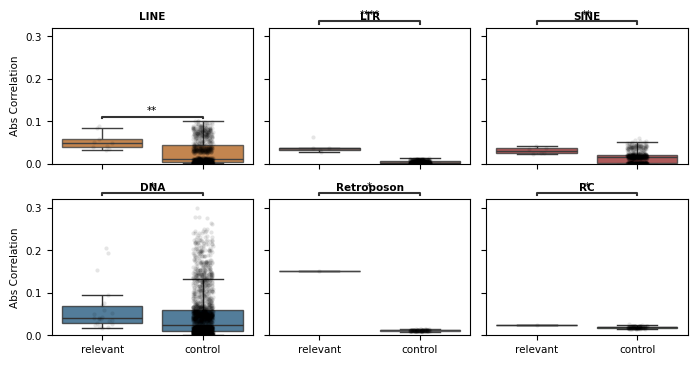

In [26]:
x_name = "group"
y_name = "average_abs_corr"

data_control = corrs_averages_random.copy()
data_relevant["group"] = "relevant"
data_control["group"] = "control"
data_all = pd.concat([data_relevant, data_control]).reset_index(drop=True)


plot_order = ["relevant", "control"]
box_pairs = [("relevant", "control")]

# --- 3. Multiple Hypothesis Correction (FDR) ---
# We must calculate p-values for ALL pairs across ALL subplots first to apply FDR
raw_p_values = []
ordered_classes = []

for class_name in class_names:
    group_rel = data_all[
        (data_all["class_name"] == class_name) & (data_all["group"] == "relevant")
    ][y_name]
    group_ctrl = data_all[
        (data_all["class_name"] == class_name) & (data_all["group"] == "control")
    ][y_name]

    if not group_rel.empty and not group_ctrl.empty:
        # Perform Mann-Whitney U test
        stat, p = mannwhitneyu(group_rel, group_ctrl, alternative="two-sided")
        raw_p_values.append(p)
        ordered_classes.append(class_name)

# Apply Benjamini-Hochberg correction
if raw_p_values:
    _, adj_p_values, _, _ = multipletests(raw_p_values, method="fdr_bh")
    # Map corrected p-values back to class names for easy lookup
    class_to_corrected_p = dict(zip(ordered_classes, adj_p_values))
else:
    class_to_corrected_p = {}

# --- 4. Visualization ---

figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=True,
    sharey=True,
    figsize=(7, 4),
)

for class_name, ax in zip(class_names, axs.flatten()):
    data_to_plot_local = data_all[data_all["class_name"] == class_name]

    if data_to_plot_local.empty:
        continue

    # Plot Boxplot
    sns.boxplot(
        data=data_to_plot_local,
        x=x_name,
        y=y_name,
        order=plot_order,
        ax=ax,
        color=class_names_p.get(class_name, "gray"),
        boxprops={"alpha": 0.8},
        showfliers=False,
        linewidth=1,
    )

    # Plot Stripplot
    sns.stripplot(
        data=data_to_plot_local,
        x=x_name,
        y=y_name,
        order=plot_order,
        ax=ax,
        color="black",
        size=3,
        alpha=0.1,
        jitter=True,
    )

    # --- 5. Statistical Annotation with Corrected P-values ---
    if class_name in class_to_corrected_p:
        corrected_p = class_to_corrected_p[class_name]

        annotator = Annotator(
            ax,
            box_pairs,
            data=data_to_plot_local,
            x=x_name,
            y=y_name,
            order=plot_order,
        )

        # Pass the pre-calculated corrected p-value
        annotator.configure(
            test=None,  # Set to None because we provide custom p-values
            text_format="star",
            loc="outside",
            verbose=0,
            fontsize=GLOBAL_FONT_SIZE,
        )

        # Manually set the p-values for this specific subplot
        annotator.set_pvalues([corrected_p])
        annotator.annotate()

    # Facet styling
    ax.set_title(class_name, fontsize=GLOBAL_FONT_SIZE, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("Abs Correlation", fontsize=GLOBAL_FONT_SIZE)
    ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
    ax.set_ylim((0, 0.32))

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Save to SVG
save_path = f"./plots/{y_name}_vs_{x_name}_spearman_vs_random.svg"

figure.savefig(save_path, format="svg", transparent=True)


print(f"Plot saved to {save_path}")

plt.show()

In [23]:
1

1

MOVE TO METHODS

### Analyze correlation coefficients with limits

In [39]:
div_threshold = 100
correlation_df_families = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_families_cut_{str(div_threshold)}.csv",
    index_col=0,
)
correlation_df_families["abs_r"] = correlation_df_families.r.abs()


reject, p_adjusted, _, _ = multipletests(
    correlation_df_families["p_value"], alpha=0.05, method="fdr_bh"
)

correlation_df_families["q_value"] = p_adjusted
correlation_df_families

,cell_line,modification,family_name,r,p_value,ci_low,ci_high,abs_r,q_value
0,Caco-2,H3K4me1,Alu,-0.007505,3.402790e-15,-0.009373,-0.005637,0.007505,1.883609e-14
1,Caco-2,H3K4me1,L1,0.037020,6.327697e-159,0.034321,0.039719,0.037020,1.167562e-157
2,Caco-2,H3K4me1,MIR,-0.021463,1.109893e-53,-0.024189,-0.018736,0.021463,1.126969e-52
3,Caco-2,H3K4me1,L2,-0.035311,9.822394e-99,-0.038591,-0.032032,0.035311,1.381576e-97
4,Caco-2,H3K4me1,ERVL-MaLR,0.048997,9.178124e-132,0.045069,0.052923,0.048997,1.458302e-130
...,...,...,...,...,...,...,...,...,...
1711,RWPE1,H3K27ac,I-Jockey,-0.239412,1.216576e-02,-0.411344,-0.051029,0.239412,3.374089e-02
1712,RWPE1,H3K27ac,hAT-Tip100?,-0.108435,3.898939e-01,-0.343901,0.139860,0.108435,5.853526e-01
1713,RWPE1,H3K27ac,TcMar-Pogo,-0.035557,8.468023e-01,-0.379644,0.317171,0.035557,9.285065e-01
1714,RWPE1,H3K27ac,hAT?,-0.482964,3.813834e-03,-0.715725,-0.153635,0.482964,1.158326e-02


In [40]:
correlation_df_families[correlation_df_families["ci_low"] > 0.2]

,cell_line,modification,family_name,r,p_value,ci_low,ci_high,abs_r,q_value
149,SJCRH30,H3K4me1,SVA,0.236518,4.794406e-63,0.209485,0.263189,0.236518,5.240255e-62
1320,C4-2B,CTCF,Alu,0.260750,0.000000e+00,0.258979,0.262519,0.260750,0.000000e+00
1337,C4-2B,CTCF,SVA,0.420540,1.296245e-208,0.396155,0.444332,0.420540,2.815640e-207
1645,RWPE1,CTCF,SVA,0.343485,1.093931e-136,0.317908,0.368562,0.343485,1.787796e-135


In [46]:
correlation_df_families[correlation_df_families["ci_high"] < -0.2]

,cell_line,modification,family_name,r,p_value,ci_low,ci_high
61,Caco-2,H3K9me3,SVA,-0.438770,2.512116e-229,-0.462163,-0.414766
193,SJCRH30,H3K9me3,SVA,-0.325958,2.455574e-121,-0.351435,-0.299999
413,BE2C,H3K9me3,SVA,-0.280786,3.543761e-89,-0.306915,-0.254233
853,HAP-1,H3K9me3,SVA,-0.396344,6.496966e-183,-0.420650,-0.371470
1143,MG63,H3K36me3,hAT-hAT19,-0.667647,4.711982e-03,-0.886987,-0.202518
1557,22Rv1,CTCF,SVA,-0.271959,1.889397e-84,-0.298063,-0.245449
1672,RWPE1,H3K27ac,Alu,-0.271806,0.000000e+00,-0.273563,-0.270047
1689,RWPE1,H3K27ac,SVA,-0.282044,6.760956e-91,-0.308025,-0.255642


In [42]:
len(correlation_df_families[correlation_df_families["r"].abs() > 0.2])

71

In [16]:
len(correlation_df_families)

1716

In [36]:
76 / 1716

0.04428904428904429

### Visualize top and bottom correlations for families, marks and cell lines

In [4]:
div_threshold = 100
correlation_df_families = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_families_cut_{str(div_threshold)}.csv",
    index_col=0,
)

reject, p_adjusted, _, _ = multipletests(
    correlation_df_families["p_value"], alpha=0.05, method="fdr_bh"
)

correlation_df_families["q_value"] = p_adjusted


top_corrs = pd.concat(
    [
        correlation_df_families[correlation_df_families["ci_low"] > 0.2],
        correlation_df_families[correlation_df_families["ci_high"] < -0.2],
    ]
)

top_corrs

,cell_line,modification,family_name,r,p_value,ci_low,ci_high,q_value
149,SJCRH30,H3K4me1,SVA,0.236518,4.794406e-63,0.209485,0.263189,5.240255e-62
1320,C4-2B,CTCF,Alu,0.260750,0.000000e+00,0.258979,0.262519,0.000000e+00
1337,C4-2B,CTCF,SVA,0.420540,1.296245e-208,0.396155,0.444332,2.815640e-207
1645,RWPE1,CTCF,SVA,0.343485,1.093931e-136,0.317908,0.368562,1.787796e-135
61,Caco-2,H3K9me3,SVA,-0.438770,2.512116e-229,-0.462163,-0.414766,5.987210e-228
193,SJCRH30,H3K9me3,SVA,-0.325958,2.455574e-121,-0.351435,-0.299999,3.728996e-120
413,BE2C,H3K9me3,SVA,-0.280786,3.543761e-89,-0.306915,-0.254233,4.642056e-88
853,HAP-1,H3K9me3,SVA,-0.396344,6.496966e-183,-0.420650,-0.371470,1.327237e-181
1143,MG63,H3K36me3,hAT-hAT19,-0.667647,4.711982e-03,-0.886987,-0.202518,1.410935e-02
1557,22Rv1,CTCF,SVA,-0.271959,1.889397e-84,-0.298063,-0.245449,2.366574e-83


In [22]:
div_threshold = 100
correlation_df_families = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_families_cut_{str(div_threshold)}.csv",
    index_col=0,
)


top_corrs = pd.concat(
    [
        correlation_df_families[correlation_df_families["ci_low"] > 0.2],
        correlation_df_families[correlation_df_families["ci_high"] < -0.2],
    ]
)
top_corrs = top_corrs[
    ~(
        (top_corrs["cell_line"] == "C4-2B")
        & (top_corrs["modification"] == "CTCF")
        & (top_corrs["family_name"] == "SVA")
    )
]

top_corrs = top_corrs[
    ~(
        (top_corrs["cell_line"] == "RWPE1")
        & (top_corrs["modification"] == "H3K27ac")
        & (top_corrs["family_name"] == "SVA")
    )
]

top_corrs

,cell_line,modification,family_name,r,p_value,ci_low,ci_high
149,SJCRH30,H3K4me1,SVA,0.236518,4.794406e-63,0.209485,0.263189
1320,C4-2B,CTCF,Alu,0.260750,0.000000e+00,0.258979,0.262519
1645,RWPE1,CTCF,SVA,0.343485,1.093931e-136,0.317908,0.368562
61,Caco-2,H3K9me3,SVA,-0.438770,2.512116e-229,-0.462163,-0.414766
193,SJCRH30,H3K9me3,SVA,-0.325958,2.455574e-121,-0.351435,-0.299999
413,BE2C,H3K9me3,SVA,-0.280786,3.543761e-89,-0.306915,-0.254233
853,HAP-1,H3K9me3,SVA,-0.396344,6.496966e-183,-0.420650,-0.371470
1143,MG63,H3K36me3,hAT-hAT19,-0.667647,4.711982e-03,-0.886987,-0.202518
1557,22Rv1,CTCF,SVA,-0.271959,1.889397e-84,-0.298063,-0.245449
1672,RWPE1,H3K27ac,Alu,-0.271806,0.000000e+00,-0.273563,-0.270047


In [23]:
def spearman_ci(x, y, alpha=0.05):
    """
    Calculates Spearman r, p-value, and 95% CI using Fisher z-transformation.
    This works on all versions of SciPy.
    """
    # Calculate r and p-value
    r, p = stats.spearmanr(x, y)
    n = len(x)

    # Fisher z-transformation
    z = np.arctanh(r)

    # Standard error of z
    se_z = 1.0 / np.sqrt(n - 3)

    # Get the z-score for the desired confidence level
    z_crit = stats.norm.ppf(1 - alpha / 2)  # This is 1.96 for 95% CI

    # Calculate CI for z
    z_low = z - z_crit * se_z
    z_high = z + z_crit * se_z

    # Back-transform z CI to r CI
    r_low = np.tanh(z_low)
    r_high = np.tanh(z_high)

    return r, p, r_low, r_high

Plotting Top 10:   0%|          | 0/10 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/SJCRH30.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_157/1637588987.py:79: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(
Plotting Top 10:   0%|          | 0/10 [00:07<?, ?it/s]

SUCCESS: File loaded and cached.


Plotting Top 10:  10%|█         | 1/10 [00:08<01:12,  8.02s/it]

  -> Loading data from: ./epigenomic_files/C4-2B.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top 10:  10%|█         | 1/10 [00:12<01:12,  8.02s/it]

SUCCESS: File loaded and cached.


Plotting Top 10:  20%|██        | 2/10 [00:13<00:53,  6.71s/it]

  -> Loading data from: ./epigenomic_files/RWPE1.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_157/1637588987.py:79: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(
Plotting Top 10:  20%|██        | 2/10 [00:21<00:53,  6.71s/it]

SUCCESS: File loaded and cached.


Plotting Top 10:  30%|███       | 3/10 [00:21<00:51,  7.36s/it]

  -> Loading data from: ./epigenomic_files/Caco-2.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top 10:  30%|███       | 3/10 [00:28<00:51,  7.36s/it]

SUCCESS: File loaded and cached.


Plotting Top 10:  40%|████      | 4/10 [00:29<00:45,  7.56s/it]

  -> Loading data from: ./epigenomic_files/SJCRH30.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_157/1637588987.py:79: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(
Plotting Top 10:  40%|████      | 4/10 [00:37<00:45,  7.56s/it]

SUCCESS: File loaded and cached.


Plotting Top 10:  50%|█████     | 5/10 [00:37<00:38,  7.74s/it]

  -> Loading data from: ./epigenomic_files/BE2C.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top 10:  50%|█████     | 5/10 [00:45<00:38,  7.74s/it]

SUCCESS: File loaded and cached.


Plotting Top 10:  60%|██████    | 6/10 [00:45<00:31,  7.83s/it]

  -> Loading data from: ./epigenomic_files/HAP-1.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top 10:  60%|██████    | 6/10 [00:50<00:31,  7.83s/it]

SUCCESS: File loaded and cached.


Plotting Top 10:  70%|███████   | 7/10 [00:51<00:21,  7.06s/it]

  -> Loading data from: ./epigenomic_files/MG63.H3K36me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top 10:  70%|███████   | 7/10 [00:58<00:21,  7.06s/it]

SUCCESS: File loaded and cached.


Plotting Top 10:  80%|████████  | 8/10 [00:59<00:14,  7.36s/it]

  -> Loading data from: ./epigenomic_files/22Rv1.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top 10:  80%|████████  | 8/10 [01:06<00:14,  7.36s/it]

SUCCESS: File loaded and cached.


Plotting Top 10:  90%|█████████ | 9/10 [01:07<00:07,  7.61s/it]

  -> Loading data from: ./epigenomic_files/RWPE1.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top 10:  90%|█████████ | 9/10 [01:14<00:07,  7.61s/it]

SUCCESS: File loaded and cached.


Plotting Top 10: 100%|██████████| 10/10 [01:16<00:00,  7.64s/it]
/tmp/ipykernel_157/1637588987.py:172: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  figure.tight_layout()  # Add tight_layout to prevent label overlap


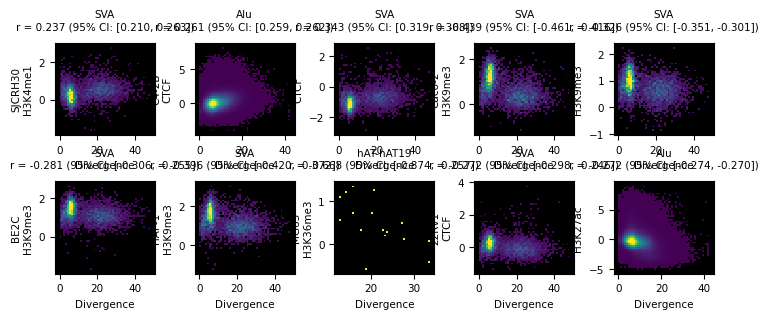

SUCCESS: Plot saved to plots/Divergence_vs_Signal_by_families_sign_correlations_spearman.svg


In [24]:
plt.rcParams["svg.fonttype"] = "none"


# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    # Note: Use tqdm.write() for all logging inside loops
    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")

    # Static versions to return the string for tqdm.write()
    @staticmethod
    def s_success(message):
        return f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}"

    @staticmethod
    def s_warning(message):
        return f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}"


save_path_svg = f"plots/Divergence_vs_Signal_by_families_sign_correlations_spearman.svg"

figure = plt.figure(figsize=(8.5, 3))

N_ROWS = 2
N_COLS = 5

repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)

# Increased spacing for independent labels
outer_grid = GridSpec(N_ROWS, N_COLS, figure=figure, wspace=0.4, hspace=0.5)

# --- Removed shared axes lists ---

# --- Add a cache for data loading ---
data_cache = {}

# --- Use a more Pythonic loop ---
for i, (idx, row) in enumerate(
    tqdm(top_corrs.iterrows(), total=len(top_corrs), desc="Plotting Top 10")
):

    # Calculate grid position
    r = i // N_COLS
    c = i % N_COLS

    # Get data from the row
    family_name = row["family_name"]
    cell_line = row["cell_line"]
    modification = row["modification"]

    filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"

    # --- Check cache before loading ---
    if filepath in data_cache:
        tqdm.write(f"  -> Found in cache: {filepath}")
        sample_enrichment = data_cache[filepath]
    else:
        # --- Data Loading ---
        tqdm.write(f"  -> Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            data_cache[filepath] = sample_enrichment
            tqdm.write(Logger.s_success("File loaded and cached."))

        except FileNotFoundError:
            tqdm.write(Logger.s_warning(f"File not found, skipping: {filepath}"))
            ax = figure.add_subplot(outer_grid[r, c])
            ax.axis("off")
            continue
        except Exception as e:
            tqdm.write(
                Logger.s_warning(
                    f"An unexpected error occurred while reading {filepath}: {e}"
                )
            )
            ax = figure.add_subplot(outer_grid[r, c])
            ax.axis("off")
            continue

        # --- Process data (only needs to be done once, on load) ---
        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            repeat_masker_average_true_div["kimura_divCpGMod_weighted_average"],
            errors="coerce",
        )

        data_cache[filepath] = sample_enrichment

    # --- Query must be done every time ---
    query_local = f'Family == "{family_name}"'
    sample_enrichment_local = sample_enrichment.query(query_local)

    # --- Create *single* axis for this plot ---
    ax_main = figure.add_subplot(outer_grid[r, c])

    # --- Plot the data ---
    sns.histplot(
        data=sample_enrichment_local,
        x="Divergence",
        y="Signal",
        bins=48,
        pmax=0.9,
        cmap="viridis",
        ax=ax_main,
    )

    # --- Tidy up: Main plot ticks/labels ---
    ax_main.set_facecolor("black")
    ax_main.set_xlabel("Divergence")  # , fontsize=10)
    ax_main.set_ylabel(f"{cell_line}\n{modification}")  # , fontsize=10)

    # Set spine colors to white

    # --- Calculate correlation ---
    clean_data = sample_enrichment_local.dropna(subset=["Divergence", "Signal"])
    if len(clean_data) > 3:  # Need n > 3 for the 1/sqrt(n-3) formula
        try:
            # Use the new helper function
            corr_coef, p_val, ci_low, ci_high = spearman_ci(
                clean_data["Divergence"], clean_data["Signal"]
            )

            # Create the string for the title
            corr_str = f"r = {corr_coef:.3f} (95% CI: [{ci_low:.3f}, {ci_high:.3f}])"
        except Exception as e:
            # Catch any math errors (e.g., if variance is zero)
            corr_coef = np.nan
            corr_str = "r = N/A (calc error)"
    else:
        corr_coef = np.nan  # Set to nan
        corr_str = "r = N/A (n <= 3)"
    # --- Set the title on the main axis ---
    ax_main.set_title(f"{family_name}\n{corr_str}", pad=10)  # fontsize=10,


# --- Ensure plots directory exists ---
os.makedirs(os.path.dirname(save_path_svg), exist_ok=True)
figure.tight_layout()  # Add tight_layout to prevent label overlap
figure.savefig(save_path_svg, format="svg", facecolor="white", transparent=False)
plt.show()

Logger.success(f"Plot saved to {save_path_svg}")

In [55]:
figure.savefig(save_path_svg, format="svg", facecolor="white", transparent=False)

### Evaluate stability of top and bottom correlations for families, marks and cell lines via supervenn

In [10]:
sets = []
labels = []

for div_threshold in [100, 20, 22.5, 25]:

    correlation_df_families = pd.read_csv(
        f"Signal_vs_true_div_corr_by_lines_mods_families_cut_{str(div_threshold)}.csv",
        index_col=0,
    )

    top_corrs = correlation_df_families[correlation_df_families["ci_low"] > 0.2]
    bottom_corrs = correlation_df_families[correlation_df_families["ci_high"] < -0.2]
    sets.append(
        set(
            top_corrs["cell_line"]
            + "_"
            + top_corrs["modification"]
            + "_"
            + top_corrs["family_name"]
        )
    )
    labels.append(f"divergence_{str(div_threshold)}_top")

    sets.append(
        set(
            bottom_corrs["cell_line"]
            + "_"
            + bottom_corrs["modification"]
            + "_"
            + bottom_corrs["family_name"]
        )
    )
    labels.append(f"divergence_{str(div_threshold)}_bottom")

sets

[{'C4-2B_CTCF_Alu', 'C4-2B_CTCF_SVA', 'RWPE1_CTCF_SVA', 'SJCRH30_H3K4me1_SVA'},
 {'22Rv1_CTCF_SVA',
  'BE2C_H3K9me3_SVA',
  'Caco-2_H3K9me3_SVA',
  'HAP-1_H3K9me3_SVA',
  'MG63_H3K36me3_hAT-hAT19',
  'RWPE1_H3K27ac_Alu',
  'RWPE1_H3K27ac_SVA',
  'SJCRH30_H3K9me3_SVA'},
 {'C4-2B_CTCF_Alu',
  'C4-2B_H3K27ac_L1',
  'RWPE1_H3K27ac_L1',
  'SJCRH30_H3K4me3_PIF-Harbinger'},
 {'MG63_H3K36me3_Merlin', 'RWPE1_H3K27ac_Alu'},
 {'C4-2B_CTCF_Alu',
  'C4-2B_CTCF_SVA',
  'C4-2B_H3K27ac_L1',
  'RWPE1_CTCF_SVA',
  'RWPE1_H3K27ac_L1'},
 {'Caco-2_H3K9me3_L1-Tx1',
  'Caco-2_H3K9me3_SVA',
  'HAP-1_H3K4me1_TcMar-Pogo',
  'HAP-1_H3K9me3_SVA',
  'HAP-1_H3K9me3_TcMar-Pogo',
  'RWPE1_H3K27ac_Alu',
  'SJCRH30_H3K9me3_SVA',
  'VCaP_H3K27ac_L1-Tx1'},
 {'22Rv1_H3K27ac_hAT-Tip100?',
  'C4-2B_CTCF_Alu',
  'C4-2B_CTCF_SVA',
  'C4-2B_H3K27ac_L1',
  'RWPE1_CTCF_SVA',
  'RWPE1_H3K27ac_L1'},
 {'Caco-2_H3K9me3_SVA',
  'HAP-1_H3K9me3_SVA',
  'RWPE1_H3K27ac_Alu',
  'SJCRH30_H3K27ac_hAT-hAT19',
  'SJCRH30_H3K9me3_SVA'}]

In [23]:
??supervenn

Signature:
supervenn(
    sets,
    set_annotations=None,
    figsize=None,
    side_plots=True,
    chunks_ordering='minimize gaps',
    sets_ordering=None,
    reverse_chunks_order=True,
    reverse_sets_order=True,
    max_bruteforce_size=8,
    seeds=10000,
    noise_prob=0.0075,
    side_plot_width=1,
    min_width_for_annotation=1,
    widths_minmax_ratio=None,
    side_plot_color='gray',
    dpi=None,
    ax=None,
    **kw,
)
Source:   
def supervenn(sets, set_annotations=None, figsize=None, side_plots=True,
              chunks_ordering='minimize gaps', sets_ordering=None,
              reverse_chunks_order=True, reverse_sets_order=True,
              max_bruteforce_size=DEFAULT_MAX_BRUTEFORCE_SIZE, seeds=DEFAULT_SEEDS, noise_prob=DEFAULT_NOISE_PROB,
              side_plot_width=1, min_width_for_annotation=1, widths_minmax_ratio=None, side_plot_color='gray',
              dpi=None, ax=None, **kw):
    """
    Plot a diagram visualizing relationship of multiple sets.
    :param

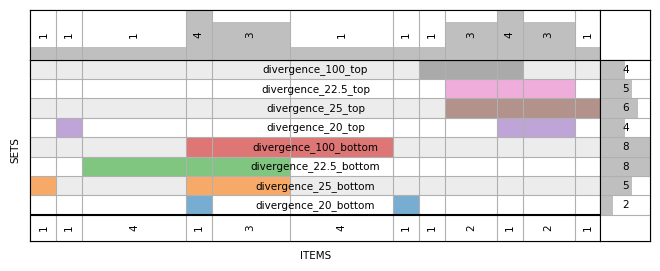

Success: SuperVenn plot with manually applied custom colors saved to plots/divergence_thresholds_top_bottom_correlations_supervenn.svg


In [24]:
fig = plt.figure(figsize=(8, 3))
# Generate the supervenn plot with unified font sizes
sv = supervenn(
    sets,
    labels,
    sets_ordering="minimize gaps",
    rotate_col_annotations=True,
    min_width_for_annotation=1,
    widths_minmax_ratio=0.05,
    side_plot_width=0.5,
    col_annotations_area_height=0.5,
)

# --- 4. Post-processing font sizes via the 'sv' object attributes ---
# The supervenn object 'sv' contains an 'axes' dictionary: 'main', 'side', 'top'.
# We iterate through all generated axes to force the GLOBAL_FONT_SIZE on all text objects.

for ax_name, ax in sv.axes.items():
    # Set size for tick labels (set names and side plot counts)
    ax.tick_params(axis="both", which="both", labelsize=GLOBAL_FONT_SIZE)

    # Set size for text annotations (numbers inside the grid and column widths)
    for text_obj in ax.texts:
        text_obj.set_fontsize(GLOBAL_FONT_SIZE)

    # Set size for axis labels if any were generated
    ax.xaxis.label.set_size(GLOBAL_FONT_SIZE)
    ax.yaxis.label.set_size(GLOBAL_FONT_SIZE)

# Add a title with unified font size
plt.title(
    "SuperVenn Diagram of TE Gene Set Overlaps",
    fontsize=GLOBAL_FONT_SIZE,
    pad=20,
    fontweight="bold",
)

# --- 5. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/divergence_thresholds_top_bottom_correlations_supervenn.svg"

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()


print(
    f"Success: SuperVenn plot with manually applied custom colors saved to {save_path}"
)

In [25]:
labels

['divergence_100_top',
 'divergence_100_bottom',
 'divergence_20_top',
 'divergence_20_bottom',
 'divergence_22.5_top',
 'divergence_22.5_bottom',
 'divergence_25_top',
 'divergence_25_bottom']

In [27]:
sets[0] & sets[2] & sets[4] & sets[6]

{'C4-2B_CTCF_Alu'}

In [28]:
sets[1] & sets[3] & sets[5] & sets[7]

{'RWPE1_H3K27ac_Alu'}

### Compare correlations by class, cell line, modification

In [6]:
families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()


div_threshold = 100
correlation_df_families = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_families_cut_{str(div_threshold)}.csv",
    index_col=0,
).merge(families_by_classes[["class_name", "family_name"]])

reject, p_adjusted, _, _ = multipletests(
    correlation_df_families["p_value"], alpha=0.05, method="fdr_bh"
)

correlation_df_families["q_value"] = p_adjusted


correlation_df_families["transformed_corr"] = np.arctanh(correlation_df_families.r)
correlation_df_families["r_abs"] = correlation_df_families.r.abs()
correlation_df_families

,cell_line,modification,family_name,r,p_value,ci_low,ci_high,class_name,q_value,transformed_corr,r_abs
0,Caco-2,H3K4me1,Alu,-0.007505,3.402790e-15,-0.009373,-0.005637,SINE,1.883609e-14,-0.007505,0.007505
1,Caco-2,H3K4me1,L1,0.037020,6.327697e-159,0.034321,0.039719,LINE,1.167562e-157,0.037037,0.037020
2,Caco-2,H3K4me1,MIR,-0.021463,1.109893e-53,-0.024189,-0.018736,SINE,1.126969e-52,-0.021466,0.021463
3,Caco-2,H3K4me1,L2,-0.035311,9.822394e-99,-0.038591,-0.032032,LINE,1.381576e-97,-0.035326,0.035311
4,Caco-2,H3K4me1,ERVL-MaLR,0.048997,9.178124e-132,0.045069,0.052923,LTR,1.458302e-130,0.049036,0.048997
...,...,...,...,...,...,...,...,...,...,...,...
1711,RWPE1,H3K27ac,I-Jockey,-0.239412,1.216576e-02,-0.411344,-0.051029,LINE,3.374089e-02,-0.244151,0.239412
1712,RWPE1,H3K27ac,hAT-Tip100?,-0.108435,3.898939e-01,-0.343901,0.139860,DNA,5.853526e-01,-0.108863,0.108435
1713,RWPE1,H3K27ac,TcMar-Pogo,-0.035557,8.468023e-01,-0.379644,0.317171,DNA,9.285065e-01,-0.035572,0.035557
1714,RWPE1,H3K27ac,hAT?,-0.482964,3.813834e-03,-0.715725,-0.153635,DNA,1.158326e-02,-0.526843,0.482964


/tmp/ipykernel_150/2016733372.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


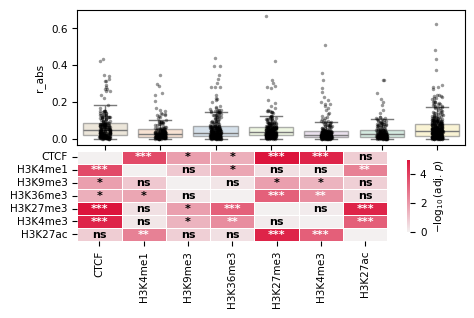

Success: Adjusted significance plot saved to ./plots/boxplot_with_matrix_r_abs_modification_families.svg


In [25]:
x_name = "modification"
y_name = "r_abs"
# Use categorical order to ensure alignment

data_to_plot = correlation_df_families
plot_order = modifications
palette_to_use = modification_p

# --- 2. Calculate All-vs-All Statistics with BH Correction ---
# Generate every unique pair
box_pairs = list(itertools.combinations(plot_order, 2))
pair_results = []

for g1, g2 in box_pairs:
    d1 = data_to_plot[data_to_plot[x_name] == g1][y_name]
    d2 = data_to_plot[data_to_plot[x_name] == g2][y_name]
    _, p = stats.mannwhitneyu(d1, d2)
    pair_results.append({"g1": g1, "g2": g2, "p_raw": p})

# Perform Benjamini-Hochberg adjustment
raw_p_values = [res["p_raw"] for res in pair_results]
_, adj_p_values, _, _ = multipletests(raw_p_values, method="fdr_bh")

# Construct the adjusted p-value matrix
p_matrix_adj = pd.DataFrame(index=plot_order, columns=plot_order, dtype=float)
np.fill_diagonal(p_matrix_adj.values, 1.0)

for i, res in enumerate(pair_results):
    g1, g2 = res["g1"], res["g2"]
    p_adj = adj_p_values[i]
    p_matrix_adj.loc[g1, g2] = p_adj
    p_matrix_adj.loc[g2, g1] = p_adj

# Apply -log10 transformation for the heatmap colors
neg_log_p = -np.log10(p_matrix_adj.astype(float) + 1e-300)

# --- 3. Visualization ---
# GridSpec: aligned horizontally by using the same column in the grid
fig = plt.figure(figsize=(5, 3))
gs = GridSpec(2, 1, height_ratios=[1.5, 1], hspace=0.05)

ax_box = fig.add_subplot(gs[0])
ax_heat = fig.add_subplot(gs[1])

# --- A) The Boxplot ---
sns.boxplot(
    data=data_to_plot,
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    palette=palette_to_use,
    boxprops={"alpha": 0.6},
    showfliers=False,
)

# Layer A: Significant points (Circles)
sns.stripplot(
    data=data_to_plot,
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    color="black",
    marker="o",
    size=2.5,
    alpha=0.4,
    jitter=True,
    zorder=3,
)

# ax_box.set_yscale("log")
# ax_box.set_title(f"{y_name} by {x_name}", fontsize=14, pad=10)
ax_box.set_xlabel("")
# Hide x-labels on the boxplot to let the heatmap labels serve both
ax_box.tick_params(labelbottom=False)

# --- B) The Significance Heatmap (Matrix) ---
cmap = sns.light_palette("crimson", as_cmap=True)
# square=False ensures it spans the same horizontal width as the boxplot
sns.heatmap(
    neg_log_p,
    ax=ax_heat,
    cmap=cmap,
    cbar=True,
    annot=False,
    square=False,
    linewidths=0.5,
    linecolor="white",
    vmin=0,
    vmax=5,
    cbar_kws={"label": r"$-\log_{10}(\text{adj. } p)$", "shrink": 0.8},
)

# Add Stars/ns as annotations inside the heatmap cells (using adjusted p)
for i in range(len(plot_order)):
    for j in range(len(plot_order)):
        p_adj = p_matrix_adj.iloc[i, j]
        if i == j:
            text = ""
        elif p_adj < 0.001:
            text = "***"
        elif p_adj < 0.01:
            text = "**"
        elif p_adj < 0.05:
            text = "*"
        else:
            text = "ns"
        ax_heat.text(
            j + 0.5,
            i + 0.5,
            text,
            ha="center",
            va="center",
            fontsize=8,
            weight="bold",
            color="white" if p_adj < 0.01 else "black",
        )

# ax_heat.set_title("Pairwise Significance Matrix (Mann-Whitney U + BH FDR)", fontsize=12)

# --- 4. Tidy Up and Save ---
save_path = f"./plots/boxplot_with_matrix_{y_name}_{x_name}_families.svg"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
fig.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()
print(f"Success: Adjusted significance plot saved to {save_path}")

/tmp/ipykernel_150/1983038510.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


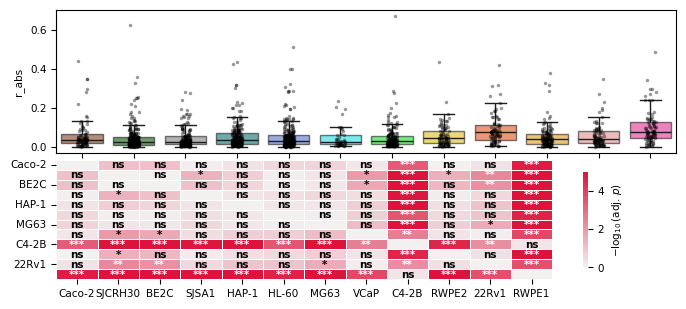

Success: Adjusted significance plot saved to ./plots/boxplot_with_matrix_r_abs_cell_line_families.svg


In [27]:
x_name = "cell_line"
y_name = "r_abs"
# Use categorical order to ensure alignment

data_to_plot = correlation_df_families
plot_order = cell_lines
palette_to_use = cell_line_p

# --- 2. Calculate All-vs-All Statistics with BH Correction ---
# Generate every unique pair
box_pairs = list(itertools.combinations(plot_order, 2))
pair_results = []

for g1, g2 in box_pairs:
    d1 = data_to_plot[data_to_plot[x_name] == g1][y_name]
    d2 = data_to_plot[data_to_plot[x_name] == g2][y_name]
    _, p = stats.mannwhitneyu(d1, d2)
    pair_results.append({"g1": g1, "g2": g2, "p_raw": p})

# Perform Benjamini-Hochberg adjustment
raw_p_values = [res["p_raw"] for res in pair_results]
_, adj_p_values, _, _ = multipletests(raw_p_values, method="fdr_bh")

# Construct the adjusted p-value matrix
p_matrix_adj = pd.DataFrame(index=plot_order, columns=plot_order, dtype=float)
np.fill_diagonal(p_matrix_adj.values, 1.0)

for i, res in enumerate(pair_results):
    g1, g2 = res["g1"], res["g2"]
    p_adj = adj_p_values[i]
    p_matrix_adj.loc[g1, g2] = p_adj
    p_matrix_adj.loc[g2, g1] = p_adj

# Apply -log10 transformation for the heatmap colors
neg_log_p = -np.log10(p_matrix_adj.astype(float) + 1e-300)

# --- 3. Visualization ---
# GridSpec: aligned horizontally by using the same column in the grid
fig = plt.figure(figsize=(8, 3.5))
gs = GridSpec(2, 1, height_ratios=[1.0, 1], hspace=0.05)

ax_box = fig.add_subplot(gs[0])
ax_heat = fig.add_subplot(gs[1])

# --- A) The Boxplot ---
sns.boxplot(
    data=data_to_plot,
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    palette=palette_to_use,
    boxprops={"alpha": 0.6},
    showfliers=False,
)

# Layer A: Significant points (Circles)
sns.stripplot(
    data=data_to_plot,
    x=x_name,
    y=y_name,
    ax=ax_box,
    order=plot_order,
    color="black",
    marker="o",
    size=2.5,
    alpha=0.4,
    jitter=True,
    zorder=3,
)

# ax_box.set_yscale("log")
# ax_box.set_title(f"{y_name} by {x_name}", fontsize=14, pad=10)
ax_box.set_xlabel("")
# Hide x-labels on the boxplot to let the heatmap labels serve both
ax_box.tick_params(labelbottom=False)

# --- B) The Significance Heatmap (Matrix) ---
cmap = sns.light_palette("crimson", as_cmap=True)
# square=False ensures it spans the same horizontal width as the boxplot
sns.heatmap(
    neg_log_p,
    ax=ax_heat,
    cmap=cmap,
    cbar=True,
    annot=False,
    square=False,
    linewidths=0.5,
    linecolor="white",
    vmin=0,
    vmax=5,
    cbar_kws={"label": r"$-\log_{10}(\text{adj. } p)$", "shrink": 0.8},
)

# Add Stars/ns as annotations inside the heatmap cells (using adjusted p)
for i in range(len(plot_order)):
    for j in range(len(plot_order)):
        p_adj = p_matrix_adj.iloc[i, j]
        if i == j:
            text = ""
        elif p_adj < 0.001:
            text = "***"
        elif p_adj < 0.01:
            text = "**"
        elif p_adj < 0.05:
            text = "*"
        else:
            text = "ns"
        ax_heat.text(
            j + 0.5,
            i + 0.5,
            text,
            ha="center",
            va="center",
            # fontsize=8,
            weight="bold",
            color="white" if p_adj < 0.01 else "black",
        )

# ax_heat.set_title("Pairwise Significance Matrix (Mann-Whitney U + BH FDR)", fontsize=12)

# --- 4. Tidy Up and Save ---
save_path = f"./plots/boxplot_with_matrix_{y_name}_{x_name}_families.svg"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
fig.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()
print(f"Success: Adjusted significance plot saved to {save_path}")

/tmp/ipykernel_721/1277181717.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Caco-2 vs. SJCRH30: Mann-Whitney-Wilcoxon test two-sided, P_val:2.472e-02 U_stat=1.347e+04
SJCRH30 vs. BE2C: Mann-Whitney-Wilcoxon test two-sided, P_val:6.927e-01 U_stat=2.272e+04
BE2C vs. SJSA1: Mann-Whitney-Wilcoxon test two-sided, P_val:2.298e-02 U_stat=1.679e+04
SJSA1 vs. HAP-1: Mann-Whitney-Wilcoxon test two-sided, P_val:8.522e-01 U_stat=2.933e+04
HAP-1 vs. HL-60: Mann-Whitney-Wilcoxon test two-sided, P_val:1.575e-03 U_stat=7.537e+03
HL-60 vs. MG63: Mann-Whitney-Wilcoxon test two-sided, P_val:1.132e-02 U_stat=2.915e+03
MG63 vs. VCaP: Mann-Whitney-Wilcoxon test two-sided, P_val:7.137e-02 U_stat=6.689e+03
VCaP vs. C4-2B: Mann-Whitney-Wilcoxon test two-sided, P_val:8.129e-03 U_stat=2.977e+03
C4-2B vs. RWPE2: Mann-Whitney-Wilcoxon test two-sided, P_val:9.735e-05 U_stat=7.611e+03
RWPE2 vs. 22Rv1: 

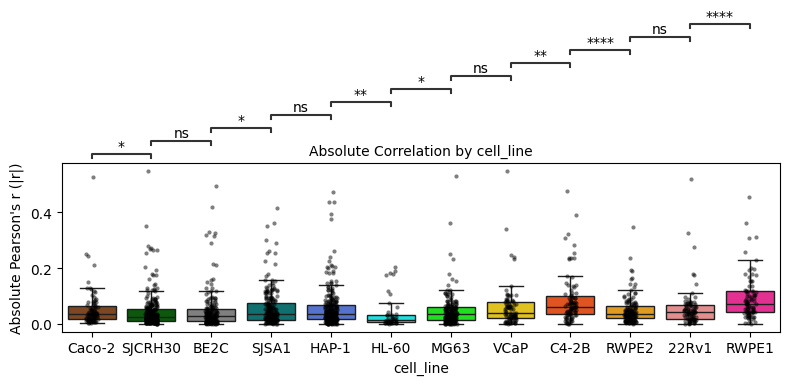

In [24]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats  # We need this for the stats test
from statannotations.Annotator import Annotator

# Set the font type for a clean SVG
plt.rcParams["svg.fonttype"] = "none"

x_name = "cell_line"
# --- 2. Create the Plot ---
figure, ax = plt.subplots(
    figsize=(8, 7),  # Increased height for stats
)

# --- 3. Plot the Boxplot ---
sns.boxplot(
    data=correlation_df_families,
    x=x_name,
    y="r_abs",
    ax=ax,
    palette=cell_line_p,
    boxprops={"alpha": 1},  # Make boxes slightly transparent,
    showfliers=False,
)

# --- 4. Add the Scatter Plot (Stripplot) ---
# This plots the individual points over the boxes
sns.stripplot(
    data=correlation_df_families,
    x=x_name,
    y="r_abs",
    ax=ax,
    color="black",  # Color for the points
    size=3,  # Size of the points
    alpha=0.5,  # Transparency
    jitter=True,  # Spread points horizontally
    # hue='modification',
    # palette=modification_p_richer
)

# Get the order of boxes as they appear on the plot
plot_order = [tick.get_text() for tick in ax.get_xticklabels()]

# Define the pairs you want to compare.
# This example compares all groups to the first group ("CTCF")

box_pairs = [(plot_order[i], plot_order[i + 1]) for i in range(0, len(plot_order) - 1)]

# You can also define custom pairs, e.g.:
# box_pairs = [
#     ("CTCF", "H3K27ac"),
#     ("H3K27ac", "H3K4me3")
# ]

annotator = Annotator(
    ax,
    box_pairs,
    data=correlation_df_families,
    x=x_name,
    y="r_abs",
    order=plot_order,  # Pass the plot order
)

annotator.configure(
    test="Mann-Whitney",  # Specify the test
    text_format="star",  # Use stars for significance
    loc="outside",  # Place annotations outside the plot area
    verbose=2,  # Show p-values in the console
)

# Apply the test and draw the annotations
annotator.apply_and_annotate()
# --- 6. Tidy Up and Save ---

ax.set_title(f"Absolute Correlation by {x_name}", fontsize=10)
ax.set_xlabel(x_name, fontsize=10)
ax.set_ylabel("Absolute Pearson's r (|r|)", fontsize=10)

# Rotate x-axis labels for better readability
plt.xticks(rotation=0, ha="center")

# Ensure the plot layout is clean
figure.tight_layout()

# Save to SVG
save_path = f"./plots/corrs_boxplot_{x_name}.svg"
figure.savefig(save_path, format="svg", bbox_inches="tight", transparent=True)

plt.show()

In [1]:
1

1

In [ ]:
figure, ax = plt.subplots(
    figsize=(9, 4),
)
sns.boxplot(
    data=correlation_df_families,
    x="modification",
    y="r_abs",
    ax=ax,
    # hue='TE_class'
)

<AxesSubplot:xlabel='class_name', ylabel='r_abs'>

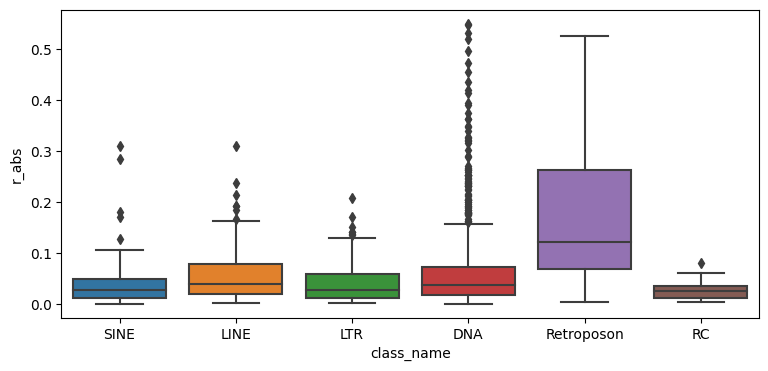

In [25]:
figure, ax = plt.subplots(
    figsize=(9, 4),
)
sns.boxplot(
    data=correlation_df_families,
    x="class_name",
    y="r_abs",
    ax=ax,
    # hue='TE_class'
)

<AxesSubplot:xlabel='cell_line', ylabel='r_abs'>

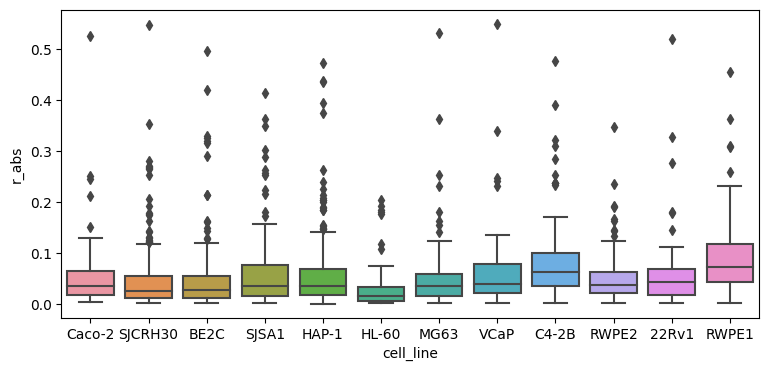

In [27]:
figure, ax = plt.subplots(
    figsize=(9, 4),
)
sns.boxplot(
    data=correlation_df_families,
    x="cell_line",
    y="r_abs",
    ax=ax,
    # hue='TE_class'
)

In [14]:
import scipy

scipy.stats.pearsonr(clean_data["Divergence"], clean_data["Signal"])

(-0.31007382325631855, 0.0)

#### Curtosis and Shapiro test

<Axes: xlabel='transformed_corr', ylabel='Count'>

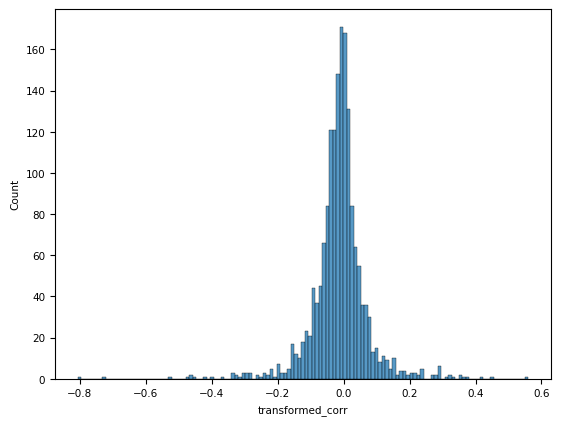

In [7]:
sns.histplot(correlation_df_families.transformed_corr)

In [8]:
stats.shapiro(correlation_df_families.transformed_corr)

ShapiroResult(statistic=np.float64(0.846326374691167), pvalue=np.float64(6.862088257321408e-38))

In [9]:
stats.kurtosistest(correlation_df_families.transformed_corr)

KurtosistestResult(statistic=np.float64(18.470380308709444), pvalue=np.float64(3.5755639521632385e-76))

In [11]:
stats.kurtosis(correlation_df_families.transformed_corr)

np.float64(11.892485055335719)

#### Levene test for comparison of variances

In [9]:
LINE = correlation_df_families["transformed_corr"][
    correlation_df_families["class_name"] == "LINE"
]
LTR = correlation_df_families["transformed_corr"][
    correlation_df_families["class_name"] == "LTR"
]
SINE = correlation_df_families["transformed_corr"][
    correlation_df_families["class_name"] == "SINE"
]
DNA = correlation_df_families["transformed_corr"][
    correlation_df_families["class_name"] == "DNA"
]
Retroposon = correlation_df_families["transformed_corr"][
    correlation_df_families["class_name"] == "Retroposon"
]
RC = correlation_df_families["transformed_corr"][
    correlation_df_families["class_name"] == "RC"
]
non_sva = correlation_df_families["transformed_corr"][
    correlation_df_families["class_name"] != "Retroposon"
]


levene(LINE, LTR, SINE, DNA, Retroposon, RC)

LeveneResult(statistic=np.float64(28.15803406304614), pvalue=np.float64(1.688803651837443e-27))

In [9]:
correlation_df_families

,cell_line,modification,family_name,r,p_value,ci_low,ci_high,class_name,transformed_corr,r_abs
0,Caco-2,H3K4me1,Alu,-0.018999,9.413005e-91,-0.020842,-0.017156,SINE,-0.019002,0.018999
1,Caco-2,H3K9me3,Alu,-0.055464,0.000000e+00,-0.057301,-0.053627,SINE,-0.055521,0.055464
2,SJCRH30,H3K27ac,Alu,0.004658,7.115618e-07,0.002817,0.006499,SINE,0.004658,0.004658
3,SJCRH30,H3K4me1,Alu,0.025348,3.643438e-160,0.023506,0.027189,SINE,0.025353,0.025348
4,SJCRH30,H3K9me3,Alu,0.046718,0.000000e+00,0.044879,0.048556,SINE,0.046752,0.046718
...,...,...,...,...,...,...,...,...,...,...
1711,RWPE2,H3K36me3,hAT-hAT19,-0.235570,3.466930e-01,-0.632840,0.259882,DNA,-0.240078,0.235570
1712,22Rv1,CTCF,hAT-hAT19,0.177126,4.819784e-01,-0.315864,0.594809,DNA,0.179014,0.177126
1713,22Rv1,H3K27ac,hAT-hAT19,0.519456,2.715174e-02,0.069422,0.793812,DNA,0.575594,0.519456
1714,RWPE1,CTCF,hAT-hAT19,0.000184,9.994222e-01,-0.466726,0.467014,DNA,0.000184,0.000184


In [10]:
compare_list = [
    correlation_df_families["transformed_corr"][
        correlation_df_families["class_name"] == class_name
    ]
    for class_name in correlation_df_families["class_name"].unique()
]

levene(*compare_list)

LeveneResult(statistic=np.float64(28.158034063046138), pvalue=np.float64(1.688803651837443e-27))

In [11]:
compare_list = [
    correlation_df_families["transformed_corr"][
        correlation_df_families["cell_line"] == cell_line
    ]
    for cell_line in correlation_df_families["cell_line"].unique()
]

levene(*compare_list)

LeveneResult(statistic=np.float64(6.547035153335785), pvalue=np.float64(8.902341251857789e-11))

In [12]:
compare_list = [
    correlation_df_families["transformed_corr"][
        correlation_df_families["modification"] == modification
    ]
    for modification in correlation_df_families["modification"].unique()
]

levene(*compare_list)

LeveneResult(statistic=np.float64(5.414525408919562), pvalue=np.float64(1.4808187213575549e-05))

## Visualize means and SDs for families, their epigenetic signal

In [44]:
data_by_family = pd.read_csv(
    "Average_signal_by_lines_mods_TE_families.csv", index_col=None
)
family_names = list(data_by_family.columns[:-2])
data_by_family[family_names] = data_by_family[family_names].apply(
    pd.to_numeric, errors="coerce"
)

data_by_family.index = data_by_family.cell_line + " " + data_by_family.modification
data_by_family

,5S-Deu-L2,Alu,CR1,Crypton,Crypton-A,Dong-R4,ERV1,ERVK,ERVL,ERVL-MaLR,...,hAT-Tag1,hAT-Tip100,hAT-Tip100?,hAT-hAT19,hAT?,tRNA,tRNA-Deu,tRNA-RTE,cell_line,modification
Caco-2 H3K4me1,0.320740,0.192451,0.258062,0.275429,0.304539,0.258146,0.312185,0.371935,0.205223,0.182053,...,0.290851,0.251841,0.202228,0.251832,0.243015,0.300132,0.341603,0.304592,Caco-2,H3K4me1
Caco-2 H3K9me3,0.284788,0.441999,0.344387,0.295155,0.315570,0.355845,0.512210,0.754319,0.390554,0.456819,...,0.345330,0.349315,0.360898,0.303545,0.383283,0.269079,0.303770,0.272808,Caco-2,H3K9me3
SJCRH30 H3K27ac,0.522521,0.305006,0.352603,0.413410,0.456858,0.351930,0.342557,0.343433,0.348306,0.345348,...,0.337438,0.344288,0.303220,0.567978,0.278075,0.474178,0.414671,0.395133,SJCRH30,H3K27ac
SJCRH30 H3K4me1,0.775154,0.490795,0.607022,0.683245,0.835651,0.630977,0.540008,0.552567,0.545097,0.556265,...,0.622190,0.597854,0.604485,0.892934,0.621784,0.714772,0.699556,0.679826,SJCRH30,H3K4me1
SJCRH30 H3K9me3,0.588988,0.525853,0.620012,0.638764,0.670254,0.668007,0.721676,0.851566,0.657647,0.743989,...,0.649587,0.636605,0.697858,0.433135,0.751556,0.597975,0.667480,0.650512,SJCRH30,H3K9me3
SJCRH30 H3K36me3,0.297161,0.455739,0.348668,0.303720,0.245351,0.296746,0.248429,0.280839,0.233524,0.268660,...,0.509837,0.252107,0.295496,0.173818,0.323418,0.282034,0.349288,0.362714,SJCRH30,H3K36me3
SJCRH30 H3K27me3,0.521002,0.584931,0.579860,0.606307,0.491396,0.585863,0.614528,0.574707,0.617601,0.606406,...,0.511679,0.636456,0.656493,0.709703,0.705194,0.533791,0.600856,0.546688,SJCRH30,H3K27me3
SJCRH30 H3K4me3,-0.102354,-0.256626,-0.192138,-0.189490,-0.139660,-0.211010,-0.179683,-0.190820,-0.225262,-0.212420,...,-0.175528,-0.203766,-0.182243,-0.224581,-0.203692,-0.145020,-0.118251,-0.177651,SJCRH30,H3K4me3
BE2C H3K4me1,1.253378,0.997566,1.142072,1.206211,1.342629,1.183467,1.080902,1.158770,1.088253,1.108216,...,1.161623,1.127632,1.168319,0.942666,1.128342,1.239482,1.187380,1.215442,BE2C,H3K4me1
BE2C H3K9me3,1.023639,1.114990,1.028507,0.981198,1.052058,1.022442,1.152385,1.260736,1.108247,1.159521,...,1.005819,1.057594,1.049577,0.378693,1.009337,1.035454,1.028430,1.041212,BE2C,H3K9me3


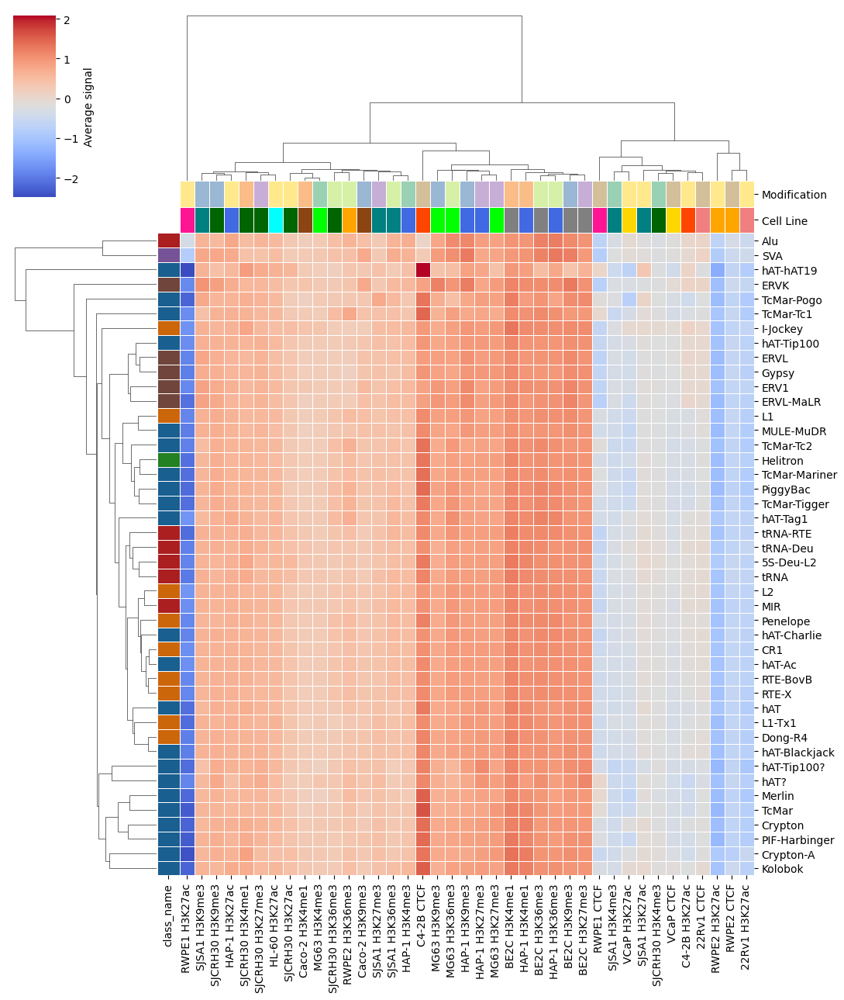

In [46]:
mapped_cell_colors = data_by_family["cell_line"].map(cell_line_p)
mapped_mod_colors = data_by_family["modification"].map(modification_p_richer)

families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()

families_by_classes = families_by_classes.set_index("family_name").reindex(family_names)
mapped_families_colors = families_by_classes["class_name"].map(class_names_p)

# Create a DataFrame for the row_colors argument
# The column names (e.g., 'Cell Line') will appear as labels.
row_colors_df = pd.DataFrame(
    {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
)
# Important: The index must align with the data being plotted
row_colors_df.index = data_by_family.index


# --- 2. Plot the Clustermap ---
data_to_plot = data_by_family[family_names].T
data_to_plot

g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    # Goal 1: Customize figsize
    figsize=(11, 13),
    # Goal 2 & 3: Add row colors using the mapped palettes
    # We use row_colors, as 'cell_line' and 'modification' describe the rows
    col_colors=row_colors_df[["Modification", "Cell Line"]],
    row_colors=mapped_families_colors,
    # Other aesthetic improvements
    # vmin=-1, vmax=1,          # Set colorbar limits for correlation
    linewidths=0.5,
    cbar_kws={"label": "Average signal"},
    # metric='correlation'      # Use correlation for clustering distance
)

# --- 3. Save the Figure ---
save_path = "./plots/signal_clustermap_families.svg"

# Goal 4: Save as SVG
g.savefig(save_path, format="svg")

plt.show()

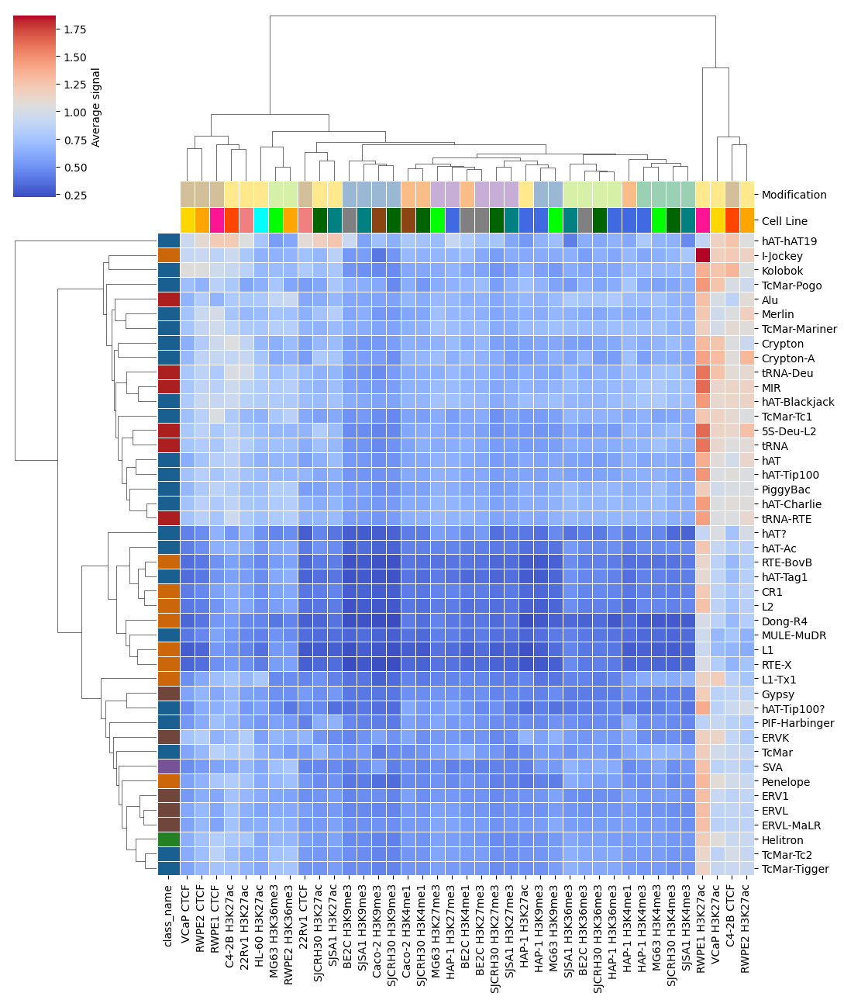

In [49]:
data_by_family = pd.read_csv("SD_signal_by_lines_mods_TE_families.csv", index_col=None)
family_names = list(data_by_family.columns[:-2])
data_by_family[family_names] = data_by_family[family_names].apply(
    pd.to_numeric, errors="coerce"
)

data_by_family.index = data_by_family.cell_line + " " + data_by_family.modification
data_by_family

mapped_cell_colors = data_by_family["cell_line"].map(cell_line_p)
mapped_mod_colors = data_by_family["modification"].map(modification_p_richer)

families_by_classes = pd.read_csv("families_by_classes_TE.csv").dropna()

families_by_classes = families_by_classes.set_index("family_name").reindex(family_names)
mapped_families_colors = families_by_classes["class_name"].map(class_names_p)

# Create a DataFrame for the row_colors argument
# The column names (e.g., 'Cell Line') will appear as labels.
row_colors_df = pd.DataFrame(
    {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
)
# Important: The index must align with the data being plotted
row_colors_df.index = data_by_family.index


# --- 2. Plot the Clustermap ---
data_to_plot = data_by_family[family_names].T
data_to_plot

g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    # Goal 1: Customize figsize
    figsize=(11, 13),
    # Goal 2 & 3: Add row colors using the mapped palettes
    # We use row_colors, as 'cell_line' and 'modification' describe the rows
    col_colors=row_colors_df[["Modification", "Cell Line"]],
    row_colors=mapped_families_colors,
    # Other aesthetic improvements
    # vmin=-1, vmax=1,          # Set colorbar limits for correlation
    linewidths=0.5,
    cbar_kws={"label": "Average signal"},
    # metric='correlation'      # Use correlation for clustering distance
)

# --- 3. Save the Figure ---
save_path = "./plots/signal_clustermap_families.svg"

# Goal 4: Save as SVG
g.savefig(save_path, format="svg")

plt.show()

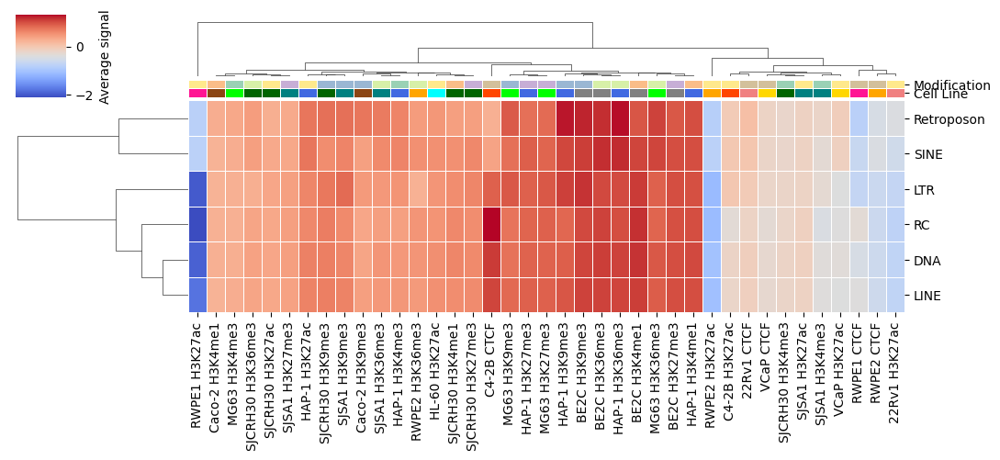

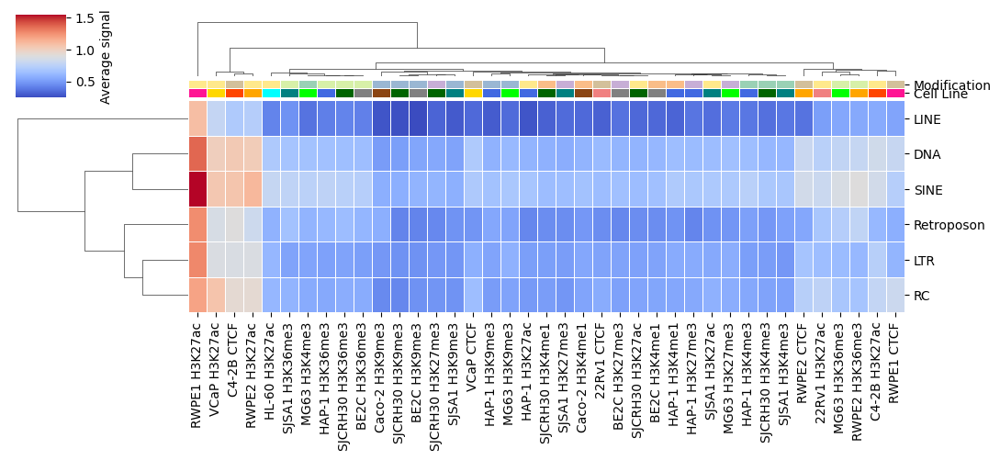

In [53]:
data_by_class = pd.read_csv(
    "Average_signal_by_lines_mods_TE_classes.csv", index_col=None
)
class_names = list(data_by_class.columns[:-2])
data_by_class[class_names] = data_by_class[class_names].apply(
    pd.to_numeric, errors="coerce"
)

data_by_class.index = data_by_class.cell_line + " " + data_by_class.modification

mapped_cell_colors = data_by_class["cell_line"].map(cell_line_p)
mapped_mod_colors = data_by_class["modification"].map(modification_p_richer)

# --- 2. Plot the Clustermap ---
data_to_plot = data_by_class[class_names].T
data_to_plot

g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    figsize=(11, 5),
    col_colors=row_colors_df[["Modification", "Cell Line"]],
    linewidths=0.5,
    cbar_kws={"label": "Average signal"},
)

plt.show()

data_by_class = pd.read_csv("SD_signal_by_lines_mods_TE_classes.csv", index_col=None)
class_names = list(data_by_class.columns[:-2])
data_by_class[class_names] = data_by_class[class_names].apply(
    pd.to_numeric, errors="coerce"
)

data_by_class.index = data_by_class.cell_line + " " + data_by_class.modification

mapped_cell_colors = data_by_class["cell_line"].map(cell_line_p)
mapped_mod_colors = data_by_class["modification"].map(modification_p_richer)

# --- 2. Plot the Clustermap ---
data_to_plot = data_by_class[class_names].T
data_to_plot

g = sns.clustermap(
    data_to_plot,
    cmap="coolwarm",
    figsize=(11, 5),
    col_colors=row_colors_df[["Modification", "Cell Line"]],
    linewidths=0.5,
    cbar_kws={"label": "Average signal"},
)

plt.show()

### Build PCA/UMAP/tSNE for subfamilies by cell lines and modifications?

## Analyze correlation coefficients of subfamily copies of TEs

### Connection of correlation with average divergence and count by subfamily

In [7]:
div_threshold = 100
correlation_df_subfamilies = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
    index_col=0,
)
correlation_df_subfamilies["abs_r"] = correlation_df_subfamilies.r.abs()
corrs_average = (
    correlation_df_subfamilies[["individual_name", "abs_r"]]
    .groupby(["individual_name"])
    .mean()
)


repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
repeat_masker_average_true_div["length"] = (
    repeat_masker_average_true_div["end"] - repeat_masker_average_true_div["start"]
)

divergence_average = pd.DataFrame(
    repeat_masker_average_true_div[
        ["kimura_divCpGMod_weighted_average", "subfamily_name"]
    ]
    .groupby("subfamily_name")
    .mean()["kimura_divCpGMod_weighted_average"]
)

length_average = pd.DataFrame(
    repeat_masker_average_true_div[["length", "subfamily_name"]]
    .groupby("subfamily_name")
    .mean()["length"]
)

subfamilies_counts = pd.read_csv("repeat_masker_individual_name_counts.csv")
subfamilies_counts.columns = ["subfamily_name", "count"]
subfamilies_counts["log10_count"] = np.log10(subfamilies_counts["count"])
subfamilies_counts = subfamilies_counts.set_index("subfamily_name").reindex(
    corrs_average.index
)


subfamilies_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

subfamilies_by_classes = subfamilies_by_classes.set_index("individual_name").reindex(
    corrs_average.index
)

subfamilies_by_families = (
    repeat_masker_average_true_div[["family_name", "subfamily_name"]]
    .value_counts()
    .reset_index()
    .drop_duplicates("subfamily_name")
    .set_index("subfamily_name")
    .reindex(corrs_average.index)
)


data_to_plot = pd.concat(
    [
        corrs_average,
        divergence_average,
        length_average,
        subfamilies_counts[["count", "log10_count"]],
        subfamilies_by_classes["class_name"],
        subfamilies_by_families["family_name"],
    ],
    axis=1,
)
data_to_plot.columns = [
    "average_abs_corr",
    "average_divergence",
    "average_length",
    "count",
    "log10_count",
    "class_name",
    "family_name",
]
data_relevant = data_to_plot.copy()
data_to_plot

,average_abs_corr,average_divergence,average_length,count,log10_count,class_name,family_name
Alu,NaN,NaN,264.585984,7106,3.851625,SINE,Alu
Alu-VAR_rnd-5_family-1084,NaN,NaN,67.636364,11,1.041393,SINE,Alu
AluJb,0.036771,12.864931,339.913978,251692,5.400869,SINE,Alu
AluJo,0.021511,11.181294,313.587668,15650,4.194514,SINE,Alu
AluJr,0.023130,11.755427,313.772526,14661,4.166164,SINE,Alu
...,...,...,...,...,...,...,...
hAT-1_Mam,0.042999,33.177402,3592.432990,1164,3.065953,DNA,hAT-Tag1
hAT-4b_Ther,0.068467,32.848108,1335.119318,176,2.245513,DNA,hAT-Tip100
hAT-5_Mam,0.046290,31.779747,3599.383942,685,2.835691,DNA,hAT-Tag1
hAT-N1_Mam,0.048210,32.993352,346.392523,214,2.330414,DNA,hAT-Tip100


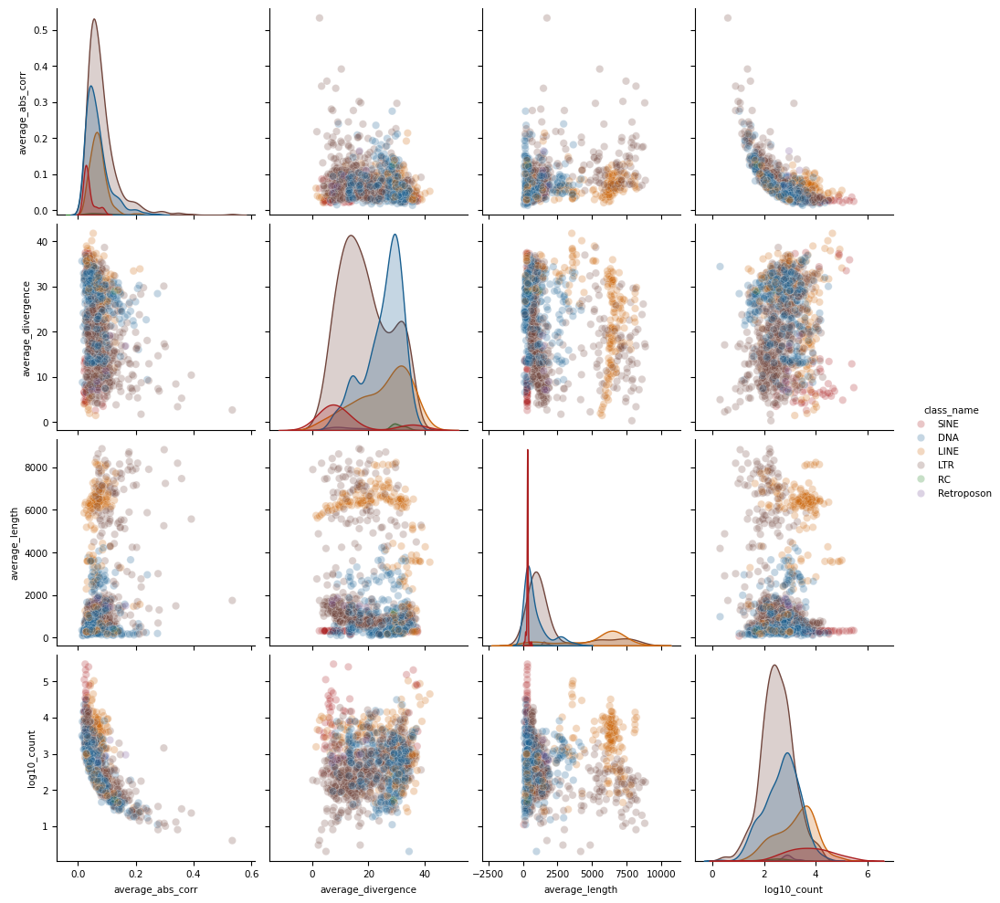

In [47]:
sns.pairplot(
    data=data_to_plot[
        [
            "average_abs_corr",
            "average_divergence",
            "average_length",
            "log10_count",
            "class_name",
        ]
    ],
    hue="class_name",
    palette=class_names_p,
    plot_kws={"alpha": 0.25},
)

In [15]:
from random import random

In [20]:
random()

0.7664287401595202

#### Connection with length for subfamilies by classes

LINE 4.291785206083628e-07
LTR 9.519260027462849e-145
SINE 3.0064614320786747e-05
DNA 1.9291171345337617e-67
Retroposon 0.1107871720116617
RC 0.03738607346849874
Success: Scatter plot with family-level jittered coloring saved to plots/average_abs_corr_vs_log10_count_subfamilies_by_class_jittered.svg


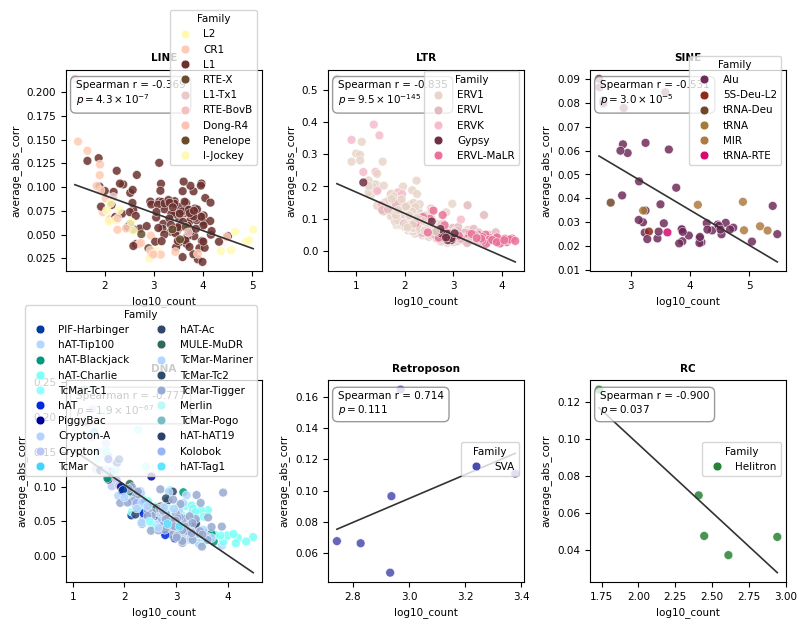

In [44]:
column1 = "log10_count"
column2 = "average_abs_corr"

# --- 2. Helper Functions ---


def get_jittered_color(hex_color, seed_name, amount=0.5):
    """
    Creates a multidimensional color variation based on a base hex color.
    Now allows wider Hue swings (e.g., Blue -> Cyan/Violet) and
    varied Lightness/Saturation to ensure distinct colors for many families.
    """
    try:
        # 1. Convert hex to RGB then to HLS
        rgb = mcolors.to_rgb(hex_color)
        h, l, s = colorsys.rgb_to_hls(*rgb)

        # 2. Deterministic seed based on family name
        seed = zlib.crc32(str(seed_name).encode("utf-8")) & 0xFFFFFFFF
        rng = np.random.default_rng(seed)

        # 3. Multidimensional Jittering
        # Hue: +/- 0.12 allows a blue base to reach Cyan or Purple/Violet
        h_jitter = rng.uniform(-0.12, 0.12)

        # Lightness: wider range for deep vs sky-blue variants
        l_jitter = rng.uniform(-amount, amount)

        # Saturation: vary intensity from muted to vibrant
        s_jitter = rng.uniform(-amount, amount)

        # 4. Apply and Clip
        # Hue wraps around 0-1
        new_h = (h + h_jitter) % 1.0

        # Lightness: keep between 0.3 (visible) and 0.85 (not washed out)
        new_l = np.clip(l + l_jitter, 0.3, 0.85)

        # Saturation: keep between 0.4 (colored) and 1.0 (vivid)
        new_s = np.clip(s + s_jitter, 0.4, 1.0)

        # 5. Convert back
        new_rgb = colorsys.hls_to_rgb(new_h, new_l, new_s)
        return mcolors.to_hex(new_rgb)
    except Exception:
        return hex_color


figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=False,
    sharey=False,
    figsize=(9, 6.5),
)

for class_name, ax in zip(class_names, axs.flatten()):
    data_to_plot_local = data_to_plot[data_to_plot["class_name"] == class_name].copy()
    corr_data = data_to_plot_local.dropna(subset=[column1, column2])

    if corr_data.empty:
        ax.set_title(f"{class_name} (No Data)")
        continue

    # 1. Calculate Statistics
    corr_result = stats.spearmanr(corr_data[column1], corr_data[column2])
    corr_r = corr_result.statistic
    corr_p = corr_result.pvalue

    # Use the new scientific formatter
    p_val_str = format_p_value(corr_p)
    stats_text = f"Spearman r = {corr_r:.3f}\n{p_val_str}"

    # 1. Build Multidimensional Palette
    base_color = class_names_p.get(class_name, "#808080")
    unique_families = data_to_plot_local["family_name"].unique()
    # The amount parameter here increases the 'depth' of variation
    if class_name == "LTR":
        amount = 0.9
    elif class_name == "LINE":
        amount = 10
    else:
        amount = len(unique_families) / 21

    family_palette = {
        fam: get_jittered_color(base_color, amount=amount, seed_name=str(random()))
        for fam in unique_families
    }

    # 2. Draw the scatterplot
    sns.scatterplot(
        data=data_to_plot_local,
        x=column1,
        y=column2,
        hue="family_name",
        palette=family_palette,
        ax=ax,
        alpha=0.85,
        edgecolor="white",
        linewidth=0.4,
        s=40,
        legend=True,
    )

    # 3. Legend formatting
    leg = ax.legend(
        title="Family",
        fontsize=GLOBAL_FONT_SIZE,
        title_fontsize=GLOBAL_FONT_SIZE,
        frameon=True,
        loc="lower right",
        bbox_to_anchor=(1, 0.5),  # Place outside if many families
        ncol=1 if len(unique_families) < 15 else 2,  # Two columns for DNA-like cases
    )
    # Set legend markers to be opaque
    for lh in leg.legend_handles:
        lh.set_alpha(1)

    # 4. Statistics and Trend
    slope, intercept, r_val, p_val, _ = stats.linregress(
        corr_data[column1], corr_data[column2]
    )
    x_fit = np.linspace(corr_data[column1].min(), corr_data[column1].max(), 100)
    y_fit = slope * x_fit + intercept
    ax.plot(x_fit, y_fit, color="#333333", linestyle="-", linewidth=1.2)

    print(class_name, corr_p)

    ax.text(
        0.05,
        0.95,
        stats_text,
        transform=ax.transAxes,
        verticalalignment="top",
        fontsize=GLOBAL_FONT_SIZE,
        bbox=dict(
            boxstyle="round,pad=0.5", facecolor="white", edgecolor="gray", alpha=0.8
        ),
    )

    # Styling
    ax.set_title(class_name, fontsize=GLOBAL_FONT_SIZE, fontweight="bold")
    #    ax.set_xlabel("Average Length (bp)")
    #    ax.set_ylabel("Avg. Abs Correlation")
    ax.tick_params(labelsize=GLOBAL_FONT_SIZE)

# Extra spacing for external legends
plt.tight_layout(rect=[0, 0, 0.9, 0.95])

# Save the final figure
os.makedirs("plots", exist_ok=True)
save_path = f"plots/{column2}_vs_{column1}_subfamilies_by_class_jittered.svg"
figure.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

print(f"Success: Scatter plot with family-level jittered coloring saved to {save_path}")
plt.show()

1.8569897458340861e-09
./plots/average_abs_corr_vs_average_divergence_TE_subfamilies_scatterplot.svg


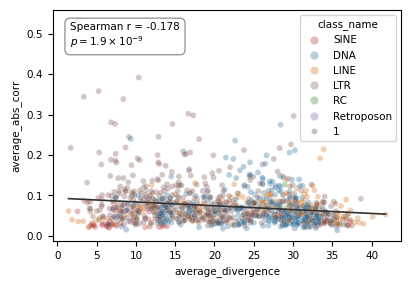

In [48]:
column1 = "average_divergence"
column2 = "average_abs_corr"


corr_data = data_to_plot.dropna(subset=[column1, column2])

if corr_data.empty:
    ax.set_title(f"{class_name} (No Data)")

# 1. Calculate Statistics
corr_result = stats.spearmanr(corr_data[column1], corr_data[column2])
corr_r = corr_result.statistic
corr_p = corr_result.pvalue

# Use the new scientific formatter
p_val_str = format_p_value(corr_p)
stats_text = f"Spearman r = {corr_r:.3f}\n{p_val_str}"

fig, ax = plt.subplots(figsize=(4.5, 3))
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x=column1,
    y=column2,
    palette=class_names_p,
    ax=ax,
    alpha=0.3,
    size=1,
)

# 4. Statistics and Trend
slope, intercept, r_val, p_val, _ = stats.linregress(
    corr_data[column1], corr_data[column2]
)
x_fit = np.linspace(corr_data[column1].min(), corr_data[column1].max(), 100)
y_fit = slope * x_fit + intercept
ax.plot(x_fit, y_fit, color="#333333", linestyle="-", linewidth=1.2)

print(corr_p)

ax.text(
    0.05,
    0.95,
    stats_text,
    transform=ax.transAxes,
    verticalalignment="top",
    fontsize=GLOBAL_FONT_SIZE,
    bbox=dict(boxstyle="round,pad=0.5", facecolor="white", edgecolor="gray", alpha=0.8),
)


save_path = f"./plots/{column2}_vs_{column1}_TE_subfamilies_scatterplot.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(save_path)
plt.show()

LINE 0.07210784524127616 0.34019618955128883
LTR 0.45382062302240456 2.3979768177075454e-29
SINE 0.06339755873274984 0.6456363164543424
DNA 0.07949629783862079 0.1508552589137607
Retroposon -0.566396549972237 0.2412566123240291
RC -0.21120053878901246 0.7331038592780209
Plot saved to ./plots/average_abs_corr_vs_average_length_subfamilies_by_class.svg


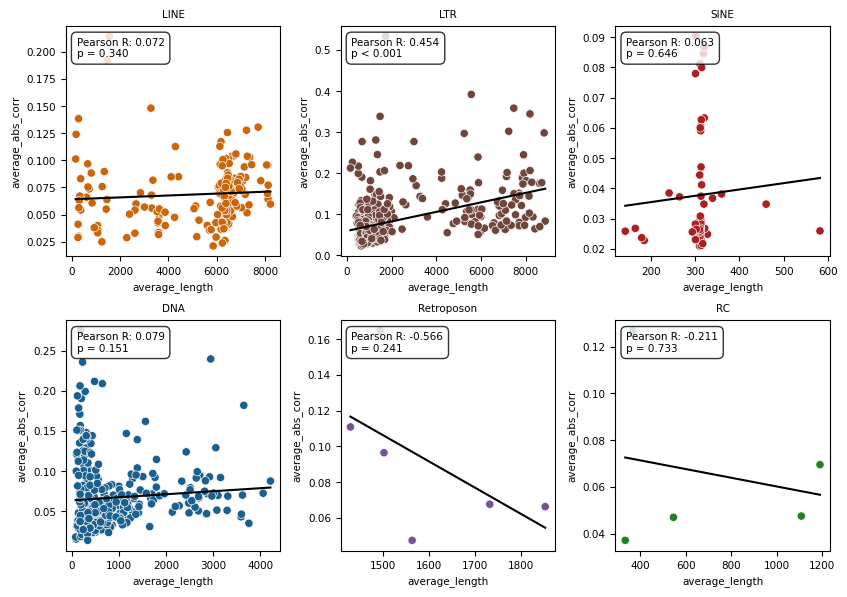

In [53]:
column1 = "average_length"
column2 = "average_abs_corr"

figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=False,
    sharey=False,
    squeeze=True,
    # width_ratios=None,
    # height_ratios=[1, 1, 1, 1, 1, 1, 0.3, 0.3],
    figsize=(10, 6),
)


for class_name, ax in zip(class_names, axs.flatten()):
    data_to_plot_local = data_to_plot[data_to_plot["class_name"] == class_name]
    corr_data = data_to_plot_local.dropna(subset=[column1, column2])
    corr_result = stats.pearsonr(corr_data[column1], corr_data[column2])
    corr_r = corr_result.statistic

    corr_p = corr_result.pvalue
    print(class_name, corr_r, corr_p)
    # Format the statistics string
    if corr_p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {corr_p:.3f}"

    stats_text = f"Pearson R: {corr_r:.3f}\n{p_val_str}"

    # Use ax.set_title() to set the title for the subplot
    ax.set_title(class_name)

    # Draw the scatterplot onto the axis
    sns.scatterplot(
        data=data_to_plot_local,
        hue="class_name",
        x=column1,
        y=column2,
        palette=class_names_p,
        ax=ax,
        alpha=1,
        legend=False,
    )
    ax.text(
        0.05,
        0.95,  # Position: 5% from left, 95% from bottom
        stats_text,
        transform=ax.transAxes,
        verticalalignment="top",
        bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
    )
    # Perform linear regression: y = slope * x + intercept
    slope, intercept = np.polyfit(
        corr_data[column1], corr_data[column2], 1  # Degree 1 for linear fit
    )
    # Create the line coordinates
    x_fit = np.linspace(corr_data[column1].min(), corr_data[column1].max(), 100)
    y_fit = slope * x_fit + intercept

    # Plot the line
    ax.plot(
        x_fit,
        y_fit,
        color="black",
        linestyle="-",
        linewidth=1.5,
        label=f"Linear Trend (R={corr_r:.2f})",
    )
#    ax.set(yscale="log")

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{column2}_vs_{column1}_subfamilies_by_class.svg"
figure.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

Take subfamilies by families for LTR and color them, add color jitter by families

In [56]:
repeat_masker_average_true_div[
    ["family_name", "subfamily_name"]
].drop_duplicates().to_csv("subfamilies_by_families_TE.csv")

#### Sigmoid curves of correlation vs number with random data

Fitting sigmoidal curve...
95th percentile of relative error: +27.55%
Generating plot...


/tmp/ipykernel_157/3777477198.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fit_data["average_abs_corr_random_95_top"] = sigmoid_decay(


Plot saved to ./plots/abs_average_corr_vs_count_TE_subfamilies_with_random.svg


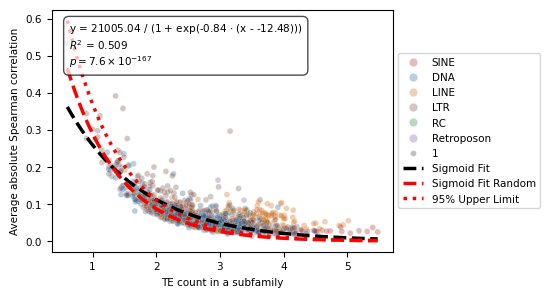

In [7]:
plt.rcParams["svg.fonttype"] = "none"  # For clean SVG text


# --- 2. Define the sigmoidal function ---
def sigmoid_decay(x, L, k, x0):
    """
    Sigmoidal decay function (inverse logistic).
    L: maximum value (the asymptote)
    k: steepness of the curve
    x0: the x-value of the sigmoid's midpoint
    """
    # Note: The sign on k is positive for a decay curve
    return L / (1 + np.exp(k * (x - x0)))


# --- 3. Prepare data and perform the fit ---
print("Fitting sigmoidal curve...")

# Drop NaNs to ensure alignment and prevent errors
fit_data = (
    data_to_plot.dropna()
)  # [["log10_count", "average_abs_corr", "average_abs_corr_random"]]
x_data = fit_data["log10_count"]
y_data = fit_data["average_abs_corr"]

fit_data_random = corrs_averages_random.copy().dropna()
x_data_random = fit_data_random["log10_count"]
y_data_random = fit_data_random["average_abs_corr"]

# Provide initial guesses for the parameters [L, k, x0]
# L: guess the max value of y
# k: guess 1 (steepness)
# x0: guess the median value of x
p0 = [y_data.max(), 1, x_data.median()]
p0_random = [y_data_random.max(), 1, x_data_random.median()]
try:
    # Fit the curve
    popt, pcov = curve_fit(sigmoid_decay, x_data, y_data, p0=p0, maxfev=5000)
    L, k, x0 = popt
    popt_random, pcov_random = curve_fit(
        sigmoid_decay, x_data_random, y_data_random, p0=p0_random, maxfev=5000
    )
    L_random, k_random, x0_random = popt_random

    fit_successful = True
    y_pred = sigmoid_decay(x_data, *popt)
    corr, p_value = stats.spearmanr(y_data, y_pred)
    r_squared = corr**2
    p_val_str = format_p_value(p_value)
    equation_text = (
        f"y = {L:.2f} / (1 + exp(-{k:.2f} $\\cdot$ (x - {x0:.2f})))\n"
        f"$R^2$ = {r_squared:.3f}\n"
        f"{p_val_str}"
    )

    # --- 5. NEW: Calculate 95% Upper Limit ---
    # Calculate relative residuals: (actual - predicted) / predicted
    # This handles the changing variance (heteroscedasticity)
    y_pred_random = sigmoid_decay(x_data_random, *popt_random)
    relative_residuals = (y_data_random - y_pred_random) / y_pred_random

    # Find the 95th percentile of these relative residuals
    rel_resid_95th = np.percentile(relative_residuals, 95)

    print(f"95th percentile of relative error: +{rel_resid_95th * 100:.2f}%")


except RuntimeError:
    # This happens if the curve fit fails to converge
    print("Sigmoidal curve fit failed to converge.")
    fit_successful = False
    equation_text = "Fit failed to converge"


# --- 5. Create the Plot ---
print("Generating plot...")
# Create the figure and axes (for figsize customization)
fig, ax = plt.subplots(figsize=(6.5, 3))

# Draw the scatterplot onto the axis
sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x="log10_count",
    y="average_abs_corr",
    palette=class_names_p,
    ax=ax,
    alpha=0.3,
    size=1,
)

if fit_successful:

    x_fit = np.linspace(x_data.min(), x_data.max(), 200)
    y_fit = sigmoid_decay(x_fit, *popt)
    ax.plot(x_fit, y_fit, color="black", ls="--", lw=2.5, label="Sigmoid Fit")

    y_fit_random = sigmoid_decay(x_fit, *popt_random)
    ax.plot(
        x_fit, y_fit_random, color="red", ls="--", lw=2.5, label="Sigmoid Fit Random"
    )
    # Plot the new 95% upper limit curve
    y_upper_limit_random = y_fit_random * (1 + rel_resid_95th)

    ax.plot(
        x_fit,
        y_upper_limit_random,
        color="red",
        ls=":",
        lw=2.5,
        label="95% Upper Limit",
    )

    fit_data["average_abs_corr_random_95_top"] = sigmoid_decay(
        fit_data["log10_count"], *popt_random
    ) * (1 + rel_resid_95th)

    # --- 7. Add the Equation Textbox ---
    ax.text(
        0.05,
        0.95,  # Position in (x, y) coordinates (0.05=5% from left, 0.95=95% from top)
        equation_text,
        transform=ax.transAxes,  # Use axis-relative coordinates
        verticalalignment="top",
        ha="left",
        # Add a light background box
        bbox=dict(facecolor="white", alpha=0.7, boxstyle="round,pad=0.5"),
    )

# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_xlabel("TE count in a subfamily")
ax.set_ylabel("Average absolute Spearman correlation")
# ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = "./plots/abs_average_corr_vs_count_TE_subfamilies_with_random.svg"
fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

In [8]:
rel_resid_95th

np.float64(0.2755489384109853)

In [62]:
fit_data.sort_values("average_abs_corr")

,average_abs_corr,average_divergence,average_length,count,log10_count,class_name,family_name,average_abs_corr_random_95_top
Tigger19a,0.013707,35.627367,340.888116,3164,3.500236,DNA,TcMar-Tigger,0.018501
MADE1,0.015331,8.775313,98.184909,7766,3.890197,DNA,TcMar-Mariner,0.011597
MADE2,0.017769,21.058083,85.562092,2754,3.439964,DNA,TcMar-Mariner,0.019886
MER5A1,0.018481,24.110063,190.432574,14349,4.156822,DNA,hAT-Charlie,0.008427
Charlie15a,0.018621,30.226618,237.668125,2971,3.472903,DNA,hAT-Charlie,0.019117
...,...,...,...,...,...,...,...,...
HERV-Fc1_LTR1,0.338358,8.399559,1486.307692,13,1.113943,LTR,ERV1,0.322418
HERVK11D-int,0.344322,3.365196,8186.375000,8,0.903090,LTR,ERVK,0.415040
HERVK14C-int,0.358260,5.255077,7464.400000,30,1.477121,LTR,ERVK,0.208697
HERVKC4-int,0.391740,10.373150,5562.782609,23,1.361728,LTR,ERVK,0.239628


/tmp/ipykernel_157/838221344.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fit_data["status_95"] = "above"
/tmp/ipykernel_157/838221344.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single s

<Axes: xlabel='log10_count', ylabel='average_abs_corr'>

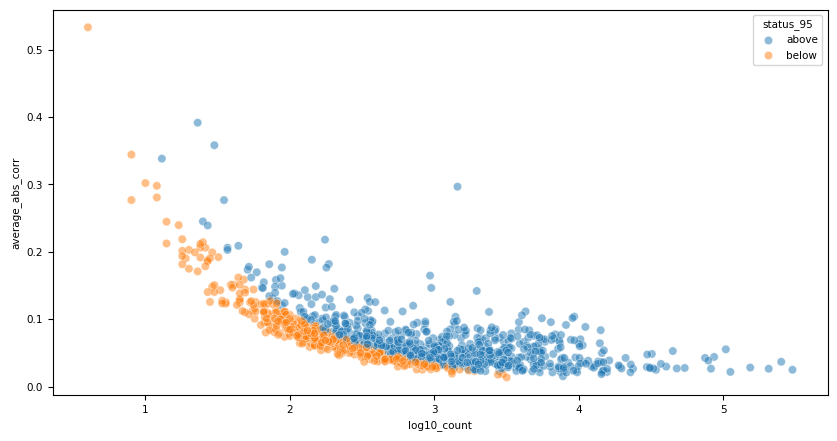

In [14]:
fit_data["status_95"] = "above"
fit_data["status_95"][
    fit_data["average_abs_corr"] < fit_data["average_abs_corr_random_95_top"]
] = "below"
fig, ax = plt.subplots(figsize=(10, 5))
sns.scatterplot(
    data=fit_data,
    hue="status_95",
    x="log10_count",
    y="average_abs_corr",
    ax=ax,
    alpha=0.5,
)

In [17]:
fit_data.to_csv("average_corrs_divergence_random_status_subfamilies.csv")

In [9]:
fit_data

,average_abs_corr,average_divergence,average_length,count,log10_count,class_name,family_name,average_abs_corr_random_95_top
AluJb,0.036771,12.864931,339.913978,251692,5.400869,SINE,Alu,0.001899
AluJo,0.021511,11.181294,313.587668,15650,4.194514,SINE,Alu,0.008055
AluJr,0.023130,11.755427,313.772526,14661,4.166164,SINE,Alu,0.008333
AluJr4,0.021894,12.952660,314.909201,7434,3.871223,SINE,Alu,0.011864
AluSc,0.026450,5.710995,311.621383,23710,4.374932,SINE,Alu,0.006490
...,...,...,...,...,...,...,...,...
hAT-1_Mam,0.042999,33.177402,3592.432990,1164,3.065953,DNA,hAT-Tag1,0.031123
hAT-4b_Ther,0.068467,32.848108,1335.119318,176,2.245513,DNA,hAT-Tip100,0.083146
hAT-5_Mam,0.046290,31.779747,3599.383942,685,2.835691,DNA,hAT-Tag1,0.041007
hAT-N1_Mam,0.048210,32.993352,346.392523,214,2.330414,DNA,hAT-Tip100,0.075107


#### Random correlations

In [8]:
files = !ls Signal_vs_true_div_corr_by_lines_mods_subfamilies_random*
corrs_average_list = []

repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)
divergence_average = pd.DataFrame(
    repeat_masker_average_true_div[["kimura_divCpGMod_weighted_average", "subfamily_name"]]
    .groupby("subfamily_name")
    .mean()["kimura_divCpGMod_weighted_average"]
)

subfamilies_counts = pd.read_csv("repeat_masker_individual_name_counts.csv")
subfamilies_counts.columns = ["subfamily_name", "count"]
subfamilies_counts["log10_count"] = np.log10(subfamilies_counts["count"])
subfamilies_counts = subfamilies_counts.set_index("subfamily_name")


subfamilies_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()
subfamilies_by_classes = subfamilies_by_classes.set_index("individual_name")

subfamilies_by_families = (
    repeat_masker_average_true_div[["family_name", "subfamily_name"]]
    .value_counts()
    .reset_index()
    .drop_duplicates("subfamily_name")
    .set_index("subfamily_name")
    .reindex(corrs_average.index)
)

for i, file in enumerate(files[:100]):
    correlation_df_subfamilies_local = pd.read_csv(
    file,
    index_col=0
    )
    correlation_df_subfamilies_local["abs_r"] = correlation_df_subfamilies_local.r.abs()
    corrs_average = (
    correlation_df_subfamilies_local[["individual_name", "abs_r"]].groupby(["individual_name"]).mean()
    )
    corrs_average_ann = pd.concat(
    [
        corrs_average,
        divergence_average,
        subfamilies_counts[["count", "log10_count"]],
        subfamilies_by_classes["class_name"],
        subfamilies_by_families["family_name"]
    ],
    axis=1,
)
    corrs_average_ann.columns = [
        "average_abs_corr",
        "average_divergence",
        "count",
        "log10_count",
        "class_name",
        "family_name"
    ]
    corrs_average_ann['random_repeat_number'] = i
    corrs_average_list.append(corrs_average_ann)
corrs_averages_random = pd.concat(corrs_average_list).reset_index(names='subfamily_name')

corrs_averages_random

,subfamily_name,average_abs_corr,average_divergence,count,log10_count,class_name,family_name,random_repeat_number
0,Alu,NaN,NaN,7106,3.851625,SINE,Alu,0
1,Alu-VAR_rnd-5_family-1084,NaN,NaN,11,1.041393,SINE,Alu,0
2,AluJb,0.001474,12.864931,251692,5.400869,SINE,Alu,0
3,AluJo,0.007847,11.181294,15650,4.194514,SINE,Alu,0
4,AluJr,0.005354,11.755427,14661,4.166164,SINE,Alu,0
...,...,...,...,...,...,...,...,...
114295,hAT-1_Mam,0.024378,33.177402,1164,3.065953,DNA,hAT-Tag1,99
114296,hAT-4b_Ther,0.062879,32.848108,176,2.245513,DNA,hAT-Tip100,99
114297,hAT-5_Mam,0.025304,31.779747,685,2.835691,DNA,hAT-Tag1,99
114298,hAT-N1_Mam,0.058855,32.993352,214,2.330414,DNA,hAT-Tip100,99


Fitting sigmoidal curve...
0.0
Generating plot...
Plot saved to ./plots/average_abs_corr_vs_log10_count_spearman_true_TE_subfamilies_random.svg


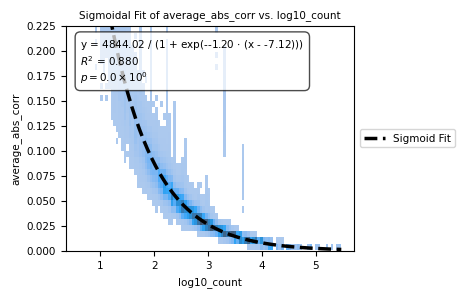

In [56]:
data_to_plot = corrs_averages_random


x_column = "log10_count"
y_column = "average_abs_corr"

GLOBAL_FONT_SIZE = 7.5


# --- 2. Define the sigmoidal function ---
def sigmoid(x, L, k, x0):
    """
    Sigmoidal (logistic) function.
    L: maximum value (the asymptote)
    k: steepness of the curve
    x0: the x-value of the sigmoid's midpoint
    """
    return L / (1 + np.exp(-k * (x - x0)))


# --- 3. Prepare data and perform the fit ---
print("Fitting sigmoidal curve...")


# Drop NaNs to ensure alignment and prevent errors
fit_data = data_to_plot[[x_column, y_column]].dropna()
x_data = fit_data[x_column]
y_data = fit_data[y_column]

# Provide initial guesses for the parameters [L, k, x0]
# L: guess the max value of y
# k: guess 1 (steepness)
# x0: guess the median value of x
p0 = [y_data.max(), 1, x_data.median()]

try:
    # Fit the curve
    popt, pcov = curve_fit(sigmoid, x_data, y_data, p0=p0, maxfev=5000)
    L, k, x0 = popt
    fit_successful = True

    # --- 4. Calculate Statistics (R-squared and p-value) ---
    # Get the predicted y-values from the fit
    y_pred = sigmoid(x_data, *popt)

    # Calculate R-squared
    # (using Pearson correlation between actual and predicted)
    corr, p_value = stats.pearsonr(y_data, y_pred)
    r_squared = corr**2

    # Format p-value for display
    if p_value < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_value:.3f}"

    p_val_str = format_p_value(p_value)

    # Create the equation string for the plot
    equation_text = (
        f"y = {L:.2f} / (1 + exp(-{k:.2f} $\\cdot$ (x - {x0:.2f})))\n"
        f"$R^2$ = {r_squared:.3f}\n"
        f"{p_val_str}"
    )
    print(p_value)

except RuntimeError:
    # This happens if the curve fit fails to converge
    print("Sigmoidal curve fit failed to converge.")
    fit_successful = False
    equation_text = "Fit failed to converge"


# --- 5. Create the Plot ---
print("Generating plot...")
# Create the figure and axes (for figsize customization)
fig, ax = plt.subplots(figsize=(5.5, 3))

# Draw the scatterplot onto the axis
sns.histplot(
    data=data_to_plot,
    bins=100,
    # hue="class_name",
    x=x_column,
    y=y_column,
    # palette=class_names_p,
    ax=ax,
    # alpha=0.01,
)

if fit_successful:
    # --- 6. Plot the Fitted Curve ---
    # Create a smooth x-axis for the curve
    x_fit = np.linspace(x_data.min(), x_data.max(), 200)
    y_fit = sigmoid(x_fit, *popt)

    # Plot the curve
    ax.plot(x_fit, y_fit, color="black", ls="--", lw=2.5, label="Sigmoid Fit")

    # --- 7. Add the Equation Textbox ---
    ax.text(
        0.05,
        0.95,  # Position in (x, y) coordinates (0.05=5% from left, 0.95=95% from top)
        equation_text,
        transform=ax.transAxes,  # Use axis-relative coordinates
        fontsize=GLOBAL_FONT_SIZE,
        verticalalignment="top",
        ha="left",
        # Add a light background box
        bbox=dict(facecolor="white", alpha=0.7, boxstyle="round,pad=0.5"),
    )


# --- 8. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=GLOBAL_FONT_SIZE)
ax.set_title(f"Sigmoidal Fit of {y_column} vs. {x_column}", fontsize=GLOBAL_FONT_SIZE)
ax.set_xlabel(x_column, fontsize=GLOBAL_FONT_SIZE)
ax.set_ylabel(y_column, fontsize=GLOBAL_FONT_SIZE)
ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
ax.set_ylim((0, 0.225))


plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for the legend

# Save to SVG
save_path = f"./plots/{y_column}_vs_{x_column}_spearman_true_TE_subfamilies_random.svg"
save_path = f"./plots/{y_column}_vs_{x_column}_spearman_true_TE_subfamilies_random.svg"

fig.savefig(save_path, format="svg", transparent=True)
print(f"Plot saved to {save_path}")

plt.show()

In [ ]:
plt.rcParams["svg.fonttype"] = "none"  # For clean SVG text


# --- 2. Define the *CORRECTED* sigmoidal decay function ---
def sigmoid_decay(x, L, k, x0):
    """
    Sigmoidal decay function (inverse logistic).
    L: maximum value (the asymptote)
    k: steepness of the curve
    x0: the x-value of the sigmoid's midpoint
    """
    # Note: The sign on k is positive for a decay curve
    return L / (1 + np.exp(k * (x - x0)))


# --- 3. Prepare data and perform the fit ---
print("Fitting sigmoidal curve...")

fit_data = data_to_plot[["log10_count", "average_abs_corr"]].dropna()
x_data = fit_data["log10_count"]
y_data = fit_data["average_abs_corr"]

# Provide initial guesses [L, k, x0] for the *decay* curve
p0 = [y_data.max(), 1.0, x_data.median()]

try:
    popt, pcov = curve_fit(sigmoid_decay, x_data, y_data, p0=p0, maxfev=5000)
    L, k, x0 = popt
    popt_random = list(popt)
    fit_successful = True

    # --- 4. Calculate Statistics (R-squared and p-value) ---
    y_pred = sigmoid_decay(x_data, *popt)
    corr, p_value = stats.pearsonr(y_data, y_pred)
    r_squared = corr**2

    if p_value < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_value:.3f}"

    # Create the *corrected* equation string for the plot
    equation_text = (
        f"y = {L:.2f} / (1 + exp({k:.2f} $\\cdot$ (x - {x0:.2f})))\n"
        f"$R^2$ = {r_squared:.3f}\n"
        f"{p_val_str}"
    )

    # --- 5. NEW: Calculate 95% Upper Limit ---

    # Calculate relative residuals: (actual - predicted) / predicted
    # This handles the changing variance (heteroscedasticity)
    relative_residuals = (y_data - y_pred) / y_pred

    # Find the 95th percentile of these relative residuals
    rel_resid_95th = np.percentile(relative_residuals, 95)

    print(f"95th percentile of relative error: +{rel_resid_95th * 100:.2f}%")

except RuntimeError:
    print("Sigmoidal curve fit failed to converge.")
    fit_successful = False
    equation_text = "Fit failed to converge"


# --- 6. Create the Plot ---
print("Generating plot...")
fig, ax = plt.subplots(figsize=(7, 4))

sns.scatterplot(
    data=data_to_plot,
    hue="class_name",
    x="log10_count",
    y="average_abs_corr",
    palette=class_names_p,
    ax=ax,
    alpha=0.3,
)

if fit_successful:
    # --- 7. Plot the Mean Fit and 95% Upper Limit ---
    x_fit = np.linspace(x_data.min(), x_data.max(), 200)
    y_fit_random = sigmoid_decay(x_fit, *popt)

    # Calculate the upper limit curve using the relative residual
    y_upper_limit = y_fit * (1 + rel_resid_95th)

    # Plot the mean curve
    ax.plot(
        x_fit, y_fit_random, color="black", ls="--", lw=2.5, label="Mean Fit (Control)"
    )
    x_fit_upper = np.array(x_fit)
    # Plot the new 95% upper limit curve
    ax.plot(x_fit, y_upper_limit, color="red", ls=":", lw=2.5, label="95% Upper Limit")

    # --- 8. Add the Equation Textbox ---
    ax.text(
        0.05,
        0.95,
        equation_text,
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment="top",
        ha="left",
        bbox=dict(facecolor="white", alpha=0.7, boxstyle="round,pad=0.5"),
    )

# --- 9. Tidy Up and Save ---
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title("Sigmoidal Fit of Correlation vs. Count", fontsize=16)
ax.set_xlabel("log10(Count)", fontsize=12)  # Changed label
ax.set_ylabel("Average Absolute Correlation", fontsize=12)
ax.set_ylim((0, 0.225))

plt.tight_layout(rect=[0, 0, 0.85, 1])

save_path = "./plots/abs_average_corr_vs_count_TE_individuals_random.svg"
fig.savefig(save_path, format="svg")
print(f"Plot saved to {save_path}")

plt.show()

#### Compare correlations to random control

In [58]:
correlation_df_subfamilies

,cell_line,modification,individual_name,r,p_value,ci_low,ci_high,abs_r
0,Caco-2,H3K4me1,AluSx,-0.023583,3.484427e-37,-0.027210,-0.019956,0.023583
1,Caco-2,H3K4me1,AluJb,-0.015518,1.785875e-14,-0.019486,-0.011551,0.015518
2,Caco-2,H3K4me1,MIRb,-0.026459,2.255033e-32,-0.030834,-0.022082,0.026459
3,Caco-2,H3K4me1,MIR,-0.033242,6.082002e-38,-0.038298,-0.028184,0.033242
4,Caco-2,H3K4me1,AluY,-0.012128,9.676865e-05,-0.018224,-0.006031,0.012128
...,...,...,...,...,...,...,...,...
44572,RWPE1,H3K27ac,HERV-Fc1_LTR3,-0.800000,2.000000e-01,-0.997543,0.818816,0.800000
44573,RWPE1,H3K27ac,HERV-Fc2_LTR,NaN,NaN,NaN,NaN,NaN
44574,RWPE1,H3K27ac,HERV-Fc1-int,NaN,NaN,NaN,NaN,NaN
44575,RWPE1,H3K27ac,Chompy-6_Croc,NaN,NaN,NaN,NaN,NaN


In [59]:
data_relevant

,average_abs_corr,average_divergence,average_length,count,log10_count,class_name,family_name
Alu,NaN,NaN,264.585984,7106,3.851625,SINE,Alu
Alu-VAR_rnd-5_family-1084,NaN,NaN,67.636364,11,1.041393,SINE,Alu
AluJb,0.036771,12.864931,339.913978,251692,5.400869,SINE,Alu
AluJo,0.021511,11.181294,313.587668,15650,4.194514,SINE,Alu
AluJr,0.023130,11.755427,313.772526,14661,4.166164,SINE,Alu
...,...,...,...,...,...,...,...
hAT-1_Mam,0.042999,33.177402,3592.432990,1164,3.065953,DNA,hAT-Tag1
hAT-4b_Ther,0.068467,32.848108,1335.119318,176,2.245513,DNA,hAT-Tip100
hAT-5_Mam,0.046290,31.779747,3599.383942,685,2.835691,DNA,hAT-Tag1
hAT-N1_Mam,0.048210,32.993352,346.392523,214,2.330414,DNA,hAT-Tip100


In [61]:
(
    data_relevant[["average_abs_corr", "class_name"]].groupby(["class_name"]).median()
    - data_control[["average_abs_corr", "class_name"]].groupby(["class_name"]).median()
)

,average_abs_corr
class_name,
DNA,0.021611
LINE,0.049752
LTR,0.020430
RC,-0.000488
Retroposon,0.052332
SINE,0.017899


Plot saved to ./plots/average_abs_corr_vs_group_spearman_vs_random_subfamilies.svg


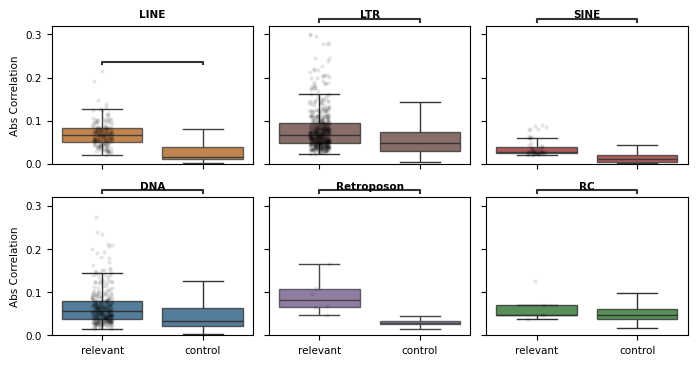

In [60]:
x_name = "group"
y_name = "average_abs_corr"

data_control = corrs_averages_random.copy()
data_relevant["group"] = "relevant"
data_control["group"] = "control"
data_all = pd.concat([data_relevant, data_control]).reset_index(drop=True)


plot_order = ["relevant", "control"]
box_pairs = [("relevant", "control")]

# --- 3. Multiple Hypothesis Correction (FDR) ---
# We must calculate p-values for ALL pairs across ALL subplots first to apply FDR
raw_p_values = []
ordered_classes = []

for class_name in class_names:
    group_rel = data_all[
        (data_all["class_name"] == class_name) & (data_all["group"] == "relevant")
    ][y_name]
    group_ctrl = data_all[
        (data_all["class_name"] == class_name) & (data_all["group"] == "control")
    ][y_name]

    if not group_rel.empty and not group_ctrl.empty:
        # Perform Mann-Whitney U test
        stat, p = mannwhitneyu(group_rel, group_ctrl, alternative="two-sided")
        raw_p_values.append(p)
        ordered_classes.append(class_name)

# Apply Benjamini-Hochberg correction
if raw_p_values:
    _, adj_p_values, _, _ = multipletests(raw_p_values, method="fdr_bh")
    # Map corrected p-values back to class names for easy lookup
    class_to_corrected_p = dict(zip(ordered_classes, adj_p_values))
else:
    class_to_corrected_p = {}

# --- 4. Visualization ---

figure, axs = plt.subplots(
    nrows=2,
    ncols=3,
    sharex=True,
    sharey=True,
    figsize=(7, 4),
)

for class_name, ax in zip(class_names, axs.flatten()):
    data_to_plot_local = data_all[data_all["class_name"] == class_name]

    if data_to_plot_local.empty:
        continue

    # Plot Boxplot
    sns.boxplot(
        data=data_to_plot_local,
        x=x_name,
        y=y_name,
        order=plot_order,
        ax=ax,
        color=class_names_p.get(class_name, "gray"),
        boxprops={"alpha": 0.8},
        showfliers=False,
        linewidth=1,
    )

    # Plot Stripplot
    sns.stripplot(
        data=data_to_plot_local[data_to_plot_local.group == "relevant"],
        x=x_name,
        y=y_name,
        order=plot_order,
        ax=ax,
        color="black",
        size=3,
        alpha=0.1,
        jitter=True,
    )

    # --- 5. Statistical Annotation with Corrected P-values ---
    if class_name in class_to_corrected_p:
        corrected_p = class_to_corrected_p[class_name]

        annotator = Annotator(
            ax,
            box_pairs,
            data=data_to_plot_local,
            x=x_name,
            y=y_name,
            order=plot_order,
        )

        # Pass the pre-calculated corrected p-value
        annotator.configure(
            test=None,  # Set to None because we provide custom p-values
            text_format="star",
            loc="outside",
            verbose=0,
            fontsize=GLOBAL_FONT_SIZE,
        )

        # Manually set the p-values for this specific subplot
        annotator.set_pvalues([corrected_p])
        annotator.annotate()

    # Facet styling
    ax.set_title(class_name, fontsize=GLOBAL_FONT_SIZE, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("Abs Correlation", fontsize=GLOBAL_FONT_SIZE)
    ax.tick_params(axis="both", which="major", labelsize=GLOBAL_FONT_SIZE)
    ax.set_ylim((0, 0.32))

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Save to SVG
save_path = f"./plots/{y_name}_vs_{x_name}_spearman_vs_random_subfamilies.svg"

figure.savefig(save_path, format="svg", transparent=True)


print(f"Plot saved to {save_path}")

plt.show()

In [11]:
class_to_corrected_p

{'LINE': np.float64(nan),
 'LTR': np.float64(nan),
 'SINE': np.float64(nan),
 'DNA': np.float64(nan),
 'Retroposon': np.float64(nan),
 'RC': np.float64(nan)}

### Visualize top and bottom correlations for individuals, marks and cell lines

In [9]:
correlation_df_subfamilies = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
    index_col=0,
).dropna()
correlation_df_subfamilies["abs_r"] = correlation_df_subfamilies.r.abs()

average_corrs_random_check = pd.read_csv(
    "average_corrs_divergence_random_status_subfamilies.csv", index_col=0
).dropna()

reject, p_adjusted, _, _ = multipletests(
    correlation_df_subfamilies["p_value"], alpha=0.05, method="fdr_bh"
)

correlation_df_subfamilies["q_value"] = p_adjusted
top_corrs = pd.concat(
    [
        correlation_df_subfamilies[correlation_df_subfamilies["ci_low"] > 0.4],
        correlation_df_subfamilies[correlation_df_subfamilies["ci_high"] < -0.4],
    ]
)
top_corrs = top_corrs[
    top_corrs["individual_name"].isin(
        average_corrs_random_check.index[
            average_corrs_random_check["status_95"] == "above"
        ]
    )
]
top_corrs.reset_index()

,index,cell_line,modification,individual_name,r,p_value,ci_low,ci_high,abs_r,q_value
0,14022,SJSA1,H3K27ac,HERV16-int,0.928878,2.945258e-04,0.599802,0.989189,0.928878,2.757351e-03
1,22026,HAP-1,H3K9me3,MER11C,0.464440,4.397862e-75,0.419829,0.506812,0.464440,1.374583e-72
2,22822,HAP-1,H3K9me3,LTR43-int,0.723201,6.527991e-05,0.408612,0.884201,0.723201,7.063596e-04
3,34443,C4-2B,CTCF,AluYb8,0.527662,2.579037e-262,0.502286,0.552131,0.527662,5.129704e-259
4,35007,C4-2B,CTCF,AluYb9,0.502655,8.804085e-20,0.404838,0.589097,0.502655,4.490083e-18
5,901,Caco-2,H3K4me1,HERVE-int,-0.576468,5.800089e-13,-0.688046,-0.438264,0.576468,1.771112e-11
6,5681,SJCRH30,H3K9me3,LTR22C,-0.809023,1.567826e-05,-0.931795,-0.520150,0.809023,1.920631e-04
7,20099,HAP-1,H3K27ac,LTR5_Hs,-0.568769,7.569719e-30,-0.642353,-0.484795,0.568769,6.857884e-28
8,34689,C4-2B,CTCF,HERVIP10FH-int,-0.574315,1.332617e-23,-0.657120,-0.477813,0.574315,8.588017e-22


In [10]:
subfamilies_by_classes[subfamilies_by_classes.class_name == 'LTR']

,Unnamed: 0,class_name
individual_name,,
ERV24B_Prim-int,17164,LTR
ERV24_Prim-int,22768,LTR
ERV3-16A3_I,1560,LTR
ERV3-16A3_LTR,1688,LTR
ERVL-B4-int,9535,LTR
...,...,...
THE1D,188,LTR
THE1D-int,58075,LTR
UCON103,146955,LTR


In [11]:
subfamilies_by_classes[(subfamilies_by_classes.class_name == 'LTR') & (subfamilies_by_classes.index.str.endswith('int'))]



,Unnamed: 0,class_name
individual_name,,
ERV24B_Prim-int,17164,LTR
ERV24_Prim-int,22768,LTR
ERVL-B4-int,9535,LTR
ERVL-E-int,157,LTR
ERVL-int,1628,LTR
...,...,...
PRIMA4-int,16478,LTR
PRIMA41-int,16289,LTR
PRIMAX-int,16710,LTR


In [10]:
subfamilies_by_classes[(subfamilies_by_classes.index.str.startswith('SVA'))]


,Unnamed: 0,class_name
individual_name,,
SVA_E,212,Retroposon
SVA_D,387,Retroposon
SVA_A,774,Retroposon
SVA_C,5105,Retroposon
SVA_B,5372,Retroposon
SVA_F,5768,Retroposon


In [15]:
correlation_df_subfamilies[correlation_df_subfamilies["individual_name"].str.startswith('SVA')].sort_values('abs_r')[-10:]


,cell_line,modification,individual_name,r,p_value,ci_low,ci_high,abs_r,q_value
4975,SJCRH30,H3K9me3,SVA_E,-0.301574,2.483410e-16,-0.368581,-0.231450,0.301574,1.002482e-14
21942,HAP-1,H3K9me3,SVA_A,-0.306320,1.722185e-34,-0.352139,-0.259037,0.306320,1.907832e-32
5002,SJCRH30,H3K9me3,SVA_B,-0.310308,1.140426e-17,-0.376102,-0.241400,0.310308,5.056004e-16
1368,Caco-2,H3K9me3,SVA_A,-0.312580,4.272671e-36,-0.358112,-0.265564,0.312580,5.108294e-34
1573,Caco-2,H3K9me3,SVA_B,-0.314083,5.126780e-18,-0.379857,-0.245150,0.314083,2.331992e-16
42694,RWPE1,CTCF,SVA_E,0.338027,1.946098e-20,0.269269,0.403357,0.338027,1.029714e-18
43837,RWPE1,H3K27ac,SVA_E,-0.345405,2.525464e-21,-0.410403,-0.276915,0.345405,1.407761e-19
22147,HAP-1,H3K9me3,SVA_B,-0.364048,4.780706e-24,-0.427654,-0.296855,0.364048,3.179242e-22
1546,Caco-2,H3K9me3,SVA_E,-0.422146,6.355521e-32,-0.483384,-0.356797,0.422146,6.334963e-30
34693,C4-2B,CTCF,SVA_E,0.455195,2.362555e-37,0.391459,0.514584,0.455195,2.962197e-35


In [11]:
correlation_df_subfamilies[correlation_df_subfamilies["individual_name"].str.startswith('SVA')][['abs_r', 'individual_name']].groupby('individual_name').mean()





,abs_r
individual_name,
SVA_A,0.110833
SVA_B,0.096395
SVA_C,0.067556
SVA_D,0.047342
SVA_E,0.164729
SVA_F,0.066197


In [16]:
correlation_df_subfamilies[correlation_df_subfamilies["individual_name"].str.startswith('AluY')]['abs_r'].std()

np.float64(0.06229695240046224)

In [6]:
correlation_df_subfamilies[(correlation_df_subfamilies["individual_name"].isin(
        average_corrs_random_check.index[
            average_corrs_random_check["status_95"] == "above"
        ]
    )) & (correlation_df_subfamilies["individual_name"].str.startswith('SVA')) & (correlation_df_subfamilies["ci_high"] < -0.4)
]

NameError: name 'correlation_df_subfamilies' is not defined

In [18]:
correlation_df_subfamilies.individual_name.unique()

array(['AluSx', 'AluJb', 'MIRb', ..., 'HERVK11D-int', 'HERV1_LTRb',
       'HERV-Fc1_LTR3'], shape=(1122,), dtype=object)

In [24]:
2286 / 43758

0.052241875771287534

In [23]:
2660 - 374

2286

In [22]:
correlation_df_subfamilies[correlation_df_subfamilies.abs_r > 0.2]

,cell_line,modification,individual_name,r,p_value,ci_low,ci_high,abs_r,q_value
306,Caco-2,H3K4me1,HERV16-int,0.510465,0.160267,-0.279669,0.888349,0.510465,0.403902
649,Caco-2,H3K4me1,LTR5B,0.248683,0.000002,0.147743,0.344496,0.248683,0.000025
665,Caco-2,H3K4me1,LTR7C,-0.213097,0.010609,-0.366116,-0.048858,0.213097,0.059008
686,Caco-2,H3K4me1,MER41-int,-0.221381,0.000221,-0.332482,-0.104218,0.221381,0.002133
745,Caco-2,H3K4me1,MER84,-0.201066,0.001219,-0.316996,-0.079216,0.201066,0.009628
...,...,...,...,...,...,...,...,...,...
44565,RWPE1,H3K27ac,HERV1_LTRd,0.447552,0.144586,-0.200853,0.823273,0.447552,0.379738
44566,RWPE1,H3K27ac,HERV1_I,-0.245455,0.466922,-0.741535,0.424150,0.245455,0.726532
44569,RWPE1,H3K27ac,HERV-Fc2-int,0.474166,0.166192,-0.259802,0.860886,0.474166,0.413406
44570,RWPE1,H3K27ac,HERVK11D-int,0.404762,0.319889,-0.448152,0.871924,0.404762,0.599844


Plotting Top:   0%|          | 0/9 [00:00<?, ?it/s]

  -> Loading data from: ./epigenomic_files/SJSA1.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top:   0%|          | 0/9 [00:02<?, ?it/s]

File loaded and cached.


Plotting Top:  11%|█         | 1/9 [00:03<00:28,  3.56s/it]

  -> Loading data from: ./epigenomic_files/HAP-1.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top:  11%|█         | 1/9 [00:06<00:28,  3.56s/it]

File loaded and cached.


Plotting Top:  33%|███▎      | 3/9 [00:07<00:11,  1.95s/it]

  -> Found in cache: ./epigenomic_files/HAP-1.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/C4-2B.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top:  33%|███▎      | 3/9 [00:09<00:11,  1.95s/it]

File loaded and cached.


Plotting Top:  44%|████▍     | 4/9 [00:10<00:12,  2.55s/it]

  -> Found in cache: ./epigenomic_files/C4-2B.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph
  -> Loading data from: ./epigenomic_files/Caco-2.H3K4me1.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top:  44%|████▍     | 4/9 [00:13<00:12,  2.55s/it]

File loaded and cached.


Plotting Top:  67%|██████▋   | 6/9 [00:14<00:06,  2.16s/it]

  -> Loading data from: ./epigenomic_files/SJCRH30.H3K9me3.chm13v2.0.mapped_on_repeat_masker.bedGraph


/tmp/ipykernel_155/2843422410.py:45: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  sample_enrichment = pd.read_csv(
Plotting Top:  67%|██████▋   | 6/9 [00:16<00:06,  2.16s/it]

File loaded and cached.


Plotting Top:  78%|███████▊  | 7/9 [00:17<00:04,  2.48s/it]

  -> Loading data from: ./epigenomic_files/HAP-1.H3K27ac.chm13v2.0.mapped_on_repeat_masker.bedGraph


Plotting Top:  78%|███████▊  | 7/9 [00:20<00:04,  2.48s/it]

File loaded and cached.


Plotting Top: 100%|██████████| 9/9 [00:20<00:00,  2.32s/it]
/tmp/ipykernel_155/2843422410.py:121: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  figure.tight_layout()  # Add tight_layout to prevent label overlap


  -> Found in cache: ./epigenomic_files/C4-2B.CTCF.chm13v2.0.mapped_on_repeat_masker.bedGraph


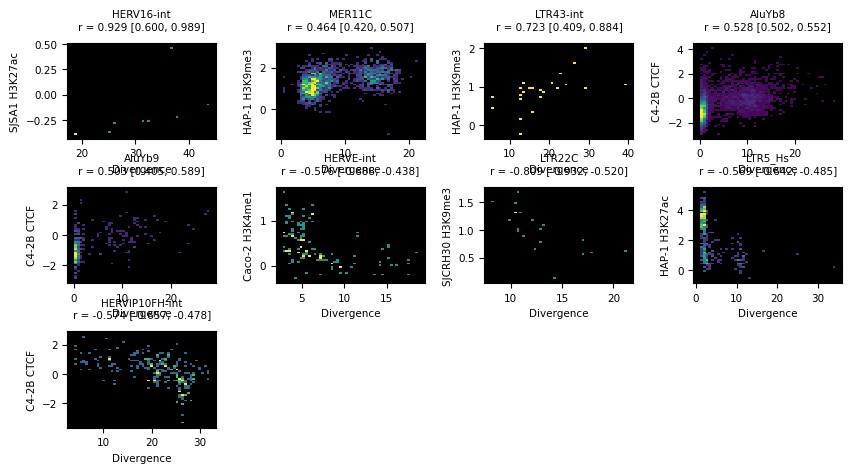

Plot saved to plots/Divergence_vs_Signal_by_subfamilies_sign_correlations.svg


In [15]:
save_path_svg = f"plots/Divergence_vs_Signal_by_subfamilies_sign_correlations.svg"

figure = plt.figure(figsize=(10, 5))

N_ROWS = 3
N_COLS = 4

# Increased spacing for independent labels
outer_grid = GridSpec(N_ROWS, N_COLS, figure=figure, wspace=0.4, hspace=0.5)

# --- Removed shared axes lists ---

# --- Add a cache for data loading ---
data_cache = {}

repeat_masker_average_true_div = pd.read_csv(
    "repeat_masker_with_div_filtered_average.csv"
)



# --- Use a more Pythonic loop ---
for i, (idx, row) in enumerate(
    tqdm(top_corrs.iterrows(), total=len(top_corrs), desc="Plotting Top")
):

    # Calculate grid position
    r = i // N_COLS
    c = i % N_COLS

    # Get data from the row
    individual_name = row["individual_name"]
    cell_line = row["cell_line"]
    modification = row["modification"]

    filepath = f"./epigenomic_files/{cell_line}.{modification}.chm13v2.0.mapped_on_repeat_masker.bedGraph"

    # --- Check cache before loading ---
    if filepath in data_cache:
        tqdm.write(f"  -> Found in cache: {filepath}")
        sample_enrichment = data_cache[filepath]
    else:
        # --- Data Loading ---
        tqdm.write(f"  -> Loading data from: {filepath}")
        try:
            sample_enrichment = pd.read_csv(
                filepath,
                sep="\t",
                header=None,
            )
            data_cache[filepath] = sample_enrichment
            tqdm.write("File loaded and cached.")

        except FileNotFoundError:
            tqdm.write(f"File not found, skipping: {filepath}")
            ax = figure.add_subplot(outer_grid[r, c])
            ax.axis("off")
            continue
        except Exception as e:
            tqdm.write(f"An unexpected error occurred while reading {filepath}: {e}")
            ax = figure.add_subplot(outer_grid[r, c])
            ax.axis("off")
            continue

        # --- Process data (only needs to be done once, on load) ---
        sample_enrichment.columns = [
            "Chromosome",
            "Start",
            "End",
            "Divergence",
            "Name",
            "Family",
            "Class",
            "Signal",
        ]
        sample_enrichment["Signal"] = pd.to_numeric(
            sample_enrichment["Signal"], errors="coerce"
        )
        sample_enrichment["Divergence"] = pd.to_numeric(
            repeat_masker_average_true_div["kimura_divCpGMod_weighted_average"],
            errors="coerce",
        )
        data_cache[filepath] = sample_enrichment

    # --- Query must be done every time ---
    query_local = f'Name == "{individual_name}"'
    sample_enrichment_local = sample_enrichment.query(query_local)

    # --- Create *single* axis for this plot ---
    ax_main = figure.add_subplot(outer_grid[r, c])

    # --- Plot the data ---
    sns.histplot(
        data=sample_enrichment_local,
        x="Divergence",
        y="Signal",
        bins=48,
        pmax=0.9,
        cmap="viridis",
        ax=ax_main,
    )

    # --- Tidy up: Main plot ticks/labels ---
    ax_main.set_facecolor("black")
    ax_main.set_xlabel("Divergence")
    ax_main.set_ylabel(f"{cell_line} {modification}")

    # Set spine colors to white

    corr_coef, p_val, ci_low, ci_high = (
        row["r"],
        row["p_value"],
        row["ci_low"],
        row["ci_high"],
    )

    corr_str = f"r = {corr_coef:.3f} [{ci_low:.3f}, {ci_high:.3f}]"

    ax_main.set_title(f"{individual_name}\n{corr_str}", pad=10)


figure.tight_layout()  # Add tight_layout to prevent label overlap
figure.savefig(save_path_svg, format="svg", facecolor="white", transparent=True)
plt.show()

print(f"Plot saved to {save_path_svg}")

In [41]:
top

,Chromosome,Start,End,Divergence,Name,Family,Class,Signal
0,chr1,0,7536,223,L1MC3,L1,LINE,-0.056950
1,chr1,4082,4796,273,LTR60B,ERV1,LTR,2.292738
2,chr1,4082,4837,205,LTR60B,ERV1,LTR,2.292738
3,chr1,5267,5850,147,MER34C_v,ERV1,LTR,-1.262659
4,chr1,5685,6131,148,MSTA1,ERVL-MaLR,LTR,-0.955075
...,...,...,...,...,...,...,...,...
3709424,chrY,62443446,62449578,84,L1P1,L1,LINE,NaN
3709425,chrY,62445666,62449071,338,L2a,L2,LINE,NaN
3709426,chrY,62446656,62452812,204,L1MC5a,L1,LINE,2.663848
3709427,chrY,62448384,62448649,230,MIR3,MIR,SINE,NaN


### Stability of top correlating subfamilies by divergence cut-off via supervenn

In [33]:
sets = []
labels = []

for div_threshold in [100, 20, 22.5, 25]:

    correlation_df_subfamilies = pd.read_csv(
        f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
        index_col=0,
    )

    top_corrs = correlation_df_subfamilies[correlation_df_subfamilies["ci_low"] > 0.4]
    bottom_corrs = correlation_df_subfamilies[
        correlation_df_subfamilies["ci_high"] < -0.4
    ]
    sets.append(
        set(
            top_corrs["cell_line"]
            + "_"
            + top_corrs["modification"]
            + "_"
            + top_corrs["individual_name"]
        )
    )
    labels.append(f"divergence_{str(div_threshold)}_top")

    sets.append(
        set(
            bottom_corrs["cell_line"]
            + "_"
            + bottom_corrs["modification"]
            + "_"
            + bottom_corrs["individual_name"]
        )
    )
    labels.append(f"divergence_{str(div_threshold)}_bottom")

sets

[{'C4-2B_CTCF_AluYb8',
  'C4-2B_CTCF_AluYb9',
  'HAP-1_H3K9me3_LTR43-int',
  'HAP-1_H3K9me3_MER11C',
  'RWPE2_H3K36me3_HERVK11D-int',
  'SJSA1_H3K27ac_HERV16-int'},
 {'C4-2B_CTCF_HERVIP10FH-int',
  'Caco-2_H3K4me1_HERVE-int',
  'HAP-1_H3K27ac_LTR5_Hs',
  'SJCRH30_H3K36me3_HERV-Fc1_LTR3',
  'SJCRH30_H3K9me3_LTR22C'},
 {'22Rv1_H3K27ac_UCON8',
  '22Rv1_H3K27ac_X4b_DNA',
  'BE2C_H3K27me3_UCON62',
  'BE2C_H3K4me1_Charlie13a',
  'BE2C_H3K9me3_UCON29',
  'C4-2B_CTCF_AluYb8',
  'C4-2B_CTCF_AmnHarb1',
  'C4-2B_CTCF_CR1-L3A_Croc',
  'C4-2B_H3K27ac_LTR108b_Mam',
  'Caco-2_H3K4me1_UCON8',
  'Caco-2_H3K9me3_X23_DNA',
  'HAP-1_H3K27ac_Tigger21a',
  'HAP-1_H3K27ac_X21_LINE',
  'HAP-1_H3K27ac_X4b_DNA',
  'HAP-1_H3K27me3_UCON9B',
  'HAP-1_H3K27me3_X1_LINE',
  'HAP-1_H3K4me1_Charlie13b',
  'HAP-1_H3K4me1_Tigger21a',
  'HAP-1_H3K4me1_UCON8',
  'HAP-1_H3K4me3_Eulor6E',
  'HAP-1_H3K4me3_hAT-N1_Mam',
  'HAP-1_H3K9me3_MER11C',
  'HAP-1_H3K9me3_MER129',
  'HL-60_H3K27ac_Tigger11a',
  'MG63_H3K36me3_Eulor11',


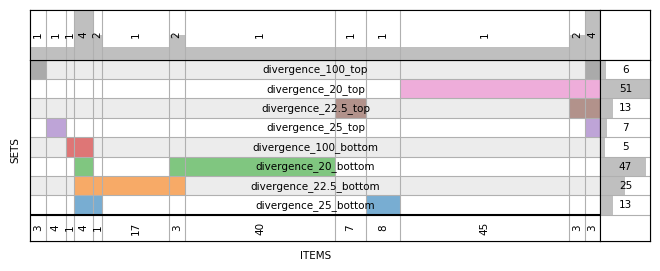

Success: SuperVenn plot with manually applied custom colors saved to plots/divergence_thresholds_top_bottom_corr_supervenn_subfamilies.svg


In [34]:
fig = plt.figure(figsize=(8, 3))
# Generate the supervenn plot with unified font sizes
sv = supervenn(
    sets,
    labels,
    sets_ordering="minimize gaps",
    rotate_col_annotations=True,
    min_width_for_annotation=1,
    widths_minmax_ratio=0.05,
    side_plot_width=0.5,
    col_annotations_area_height=0.5,
)

# --- 4. Post-processing font sizes via the 'sv' object attributes ---
# The supervenn object 'sv' contains an 'axes' dictionary: 'main', 'side', 'top'.
# We iterate through all generated axes to force the GLOBAL_FONT_SIZE on all text objects.

for ax_name, ax in sv.axes.items():
    # Set size for tick labels (set names and side plot counts)
    ax.tick_params(axis="both", which="both", labelsize=GLOBAL_FONT_SIZE)

    # Set size for text annotations (numbers inside the grid and column widths)
    for text_obj in ax.texts:
        text_obj.set_fontsize(GLOBAL_FONT_SIZE)

    # Set size for axis labels if any were generated
    ax.xaxis.label.set_size(GLOBAL_FONT_SIZE)
    ax.yaxis.label.set_size(GLOBAL_FONT_SIZE)

# Add a title with unified font size
plt.title(
    "SuperVenn Diagram of TE Gene Set Overlaps",
    fontsize=GLOBAL_FONT_SIZE,
    pad=20,
    fontweight="bold",
)

# --- 5. Saving ---

os.makedirs("plots", exist_ok=True)
save_path = "plots/divergence_thresholds_top_bottom_corr_supervenn_subfamilies.svg"

plt.savefig(save_path, format="svg", transparent=True, bbox_inches="tight")

plt.show()


print(
    f"Success: SuperVenn plot with manually applied custom colors saved to {save_path}"
)

In [36]:
sets[0] & sets[2] & sets[4] & sets[6]

{'C4-2B_CTCF_AluYb8', 'HAP-1_H3K9me3_MER11C', 'RWPE2_H3K36me3_HERVK11D-int'}

In [37]:
sets[1] & sets[3] & sets[5] & sets[7]

{'Caco-2_H3K4me1_HERVE-int',
 'HAP-1_H3K27ac_LTR5_Hs',
 'SJCRH30_H3K36me3_HERV-Fc1_LTR3',
 'SJCRH30_H3K9me3_LTR22C'}

### Clustermap of correlation coefficients

In [62]:
div_threshold = 100
correlation_df_subfamilies = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
    index_col=0,
)

correlation_df_subfamilies = pd.pivot_table(
    correlation_df_subfamilies,
    values="r",
    index=["cell_line", "modification"],
    columns=["individual_name"],
    aggfunc="sum",
    fill_value=0,
).reset_index()
correlation_df_subfamilies.index = (
    correlation_df_subfamilies.cell_line + " " + correlation_df_subfamilies.modification
)
correlation_df_subfamilies

individual_name,cell_line,modification,Alu,Alu-VAR_rnd-5_family-1084,AluJb,AluJo,AluJr,AluJr4,AluSc,AluSc5,...,Zaphod2,Zaphod3,Zaphod4a,Zaphod5a,Zaphod5b,hAT-1_Mam,hAT-4b_Ther,hAT-5_Mam,hAT-N1_Mam,hAT-N1a_Mam
22Rv1 CTCF,22Rv1,CTCF,0.0,0.0,-0.052245,-0.018577,-0.024741,0.005122,-0.014639,-0.028376,...,-0.114691,-0.117020,-0.084626,0.216028,-0.124390,-0.007133,0.013952,-0.027650,0.019866,-0.039343
22Rv1 H3K27ac,22Rv1,H3K27ac,0.0,0.0,-0.054341,-0.016633,-0.025518,-0.018957,-0.031311,-0.034245,...,-0.150835,-0.092323,-0.153207,-0.049186,-0.246341,-0.053949,0.010847,-0.066026,-0.100621,-0.031041
BE2C H3K27me3,BE2C,H3K27me3,0.0,0.0,-0.016602,-0.005981,-0.014214,-0.015312,-0.002478,0.006620,...,-0.048324,-0.121259,0.034769,-0.030324,0.019325,-0.005698,-0.089289,-0.070365,0.006767,-0.079707
BE2C H3K36me3,BE2C,H3K36me3,0.0,0.0,-0.026240,-0.020085,-0.016347,-0.040368,-0.039967,0.005529,...,0.004235,-0.046194,-0.083610,0.048779,-0.319700,-0.041689,-0.041621,-0.014509,-0.006483,-0.058340
BE2C H3K4me1,BE2C,H3K4me1,0.0,0.0,0.016839,0.000179,0.011177,-0.007821,0.004001,0.016983,...,0.040218,-0.090958,0.032214,0.112989,-0.041088,-0.040702,-0.045539,-0.062689,-0.103672,-0.059588
BE2C H3K9me3,BE2C,H3K9me3,0.0,0.0,0.014030,0.009402,0.017046,-0.002084,0.018780,-0.002779,...,0.008037,-0.018258,0.215767,0.081193,-0.004690,-0.027342,-0.032529,-0.022815,-0.051500,-0.011814
C4-2B CTCF,C4-2B,CTCF,0.0,0.0,0.212016,0.072791,0.069625,0.049481,0.084987,0.151820,...,0.198203,0.132076,0.062307,0.071331,0.066979,0.071106,0.102222,0.093216,-0.074924,-0.071134
C4-2B H3K27ac,C4-2B,H3K27ac,0.0,0.0,0.016024,0.008303,-0.015973,0.008102,0.004517,0.052279,...,-0.135021,-0.116282,-0.103604,-0.060378,-0.245869,0.002241,-0.153380,-0.081650,0.037690,-0.017013
Caco-2 H3K4me1,Caco-2,H3K4me1,0.0,0.0,-0.015518,-0.006736,-0.006661,-0.024107,-0.012528,-0.011910,...,0.017639,0.000553,-0.009164,-0.121806,-0.089869,-0.072873,-0.065391,-0.107805,0.011141,-0.010228
Caco-2 H3K9me3,Caco-2,H3K9me3,0.0,0.0,0.015538,0.015926,0.022011,0.002556,0.000431,-0.024735,...,0.069646,0.087347,0.033029,-0.220030,-0.005629,0.033381,-0.022260,-0.049246,0.047890,-0.032844


In [36]:
correlation_df_subfamilies[
    correlation_df_subfamilies.columns[
        correlation_df_subfamilies.columns.str.startswith("AluY")
    ]
]

individual_name,AluY,AluYa5,AluYa8,AluYb8,AluYb9,AluYc,AluYc3,AluYd8,AluYe5,AluYe6,...,AluYh9,AluYi6,AluYi6_4d,AluYj4,AluYk11,AluYk12,AluYk2,AluYk3,AluYk4,AluYm1
22Rv1 CTCF,-0.028259,-0.017490,-0.035747,-0.037719,-0.032801,-0.022515,-0.116963,-0.015911,-0.056725,-0.122331,...,0.023469,-0.081930,0.0,0.0,-0.025030,-0.141863,0.0,-0.056455,-0.084490,-0.002274
22Rv1 H3K27ac,-0.024179,-0.016447,-0.026353,-0.018324,-0.019732,0.024149,-0.124401,0.072890,0.005133,0.005693,...,-0.009763,-0.074337,0.0,0.0,0.073186,-0.002063,0.0,-0.027784,-0.038484,-0.028894
BE2C H3K27me3,-0.004755,-0.004357,0.014139,0.004859,0.013836,0.039613,-0.028613,-0.049948,0.010608,0.039721,...,-0.027036,-0.011328,0.0,0.0,-0.037966,0.024838,0.0,-0.022173,-0.005780,0.007448
BE2C H3K36me3,-0.013707,0.043825,0.075941,0.100352,0.120872,0.021519,-0.066047,-0.053757,0.053585,0.105120,...,0.038290,0.033672,0.0,0.0,0.032422,0.097519,0.0,-0.015600,0.005887,0.017250
BE2C H3K4me1,0.023267,0.073299,0.097396,0.115283,0.124591,0.029446,0.063221,0.071227,0.052663,0.005149,...,0.003402,0.040681,0.0,0.0,0.010060,0.098454,0.0,0.015914,-0.008608,0.052151
BE2C H3K9me3,0.013648,0.068791,-0.002057,0.028466,0.017754,0.034010,-0.029687,-0.066269,-0.036366,-0.138462,...,-0.011822,-0.019540,0.0,0.0,-0.130565,-0.005203,0.0,0.024094,-0.012336,0.015593
C4-2B CTCF,0.117266,0.416078,0.262071,0.527662,0.502655,0.102574,0.334180,0.438384,0.189742,0.215627,...,0.117487,0.389572,0.0,0.0,0.353865,0.244468,0.0,0.094521,0.112353,0.116047
C4-2B H3K27ac,0.011183,0.135797,0.121541,0.179442,0.224244,-0.005223,0.081242,0.195834,0.128231,0.089931,...,0.119196,0.154493,0.0,0.0,0.158975,0.113842,0.0,0.035541,0.005343,-0.016435
Caco-2 H3K4me1,-0.012128,0.016940,0.010345,0.028773,0.136478,-0.024142,0.057323,0.045288,0.025542,-0.025117,...,0.050487,0.030597,0.0,0.0,-0.001747,0.046565,0.0,-0.021993,0.015769,-0.028101
Caco-2 H3K9me3,-0.016428,-0.015188,-0.085727,-0.150538,-0.083058,-0.041924,-0.093771,-0.191330,-0.083159,-0.138673,...,0.002831,-0.111330,0.0,0.0,-0.146388,-0.123296,0.0,-0.006542,-0.021817,-0.035220


In [19]:
repeat_masker_average_true_div.subfamily_name.value_counts().reindex(
    subfamilies_names
)

subfamily_name
HERV16-int        1446
MER11C            1431
LTR43-int           27
HERVE-int          142
LTR22C              25
LTR5_Hs            345
HERVIP10FH-int     952
Name: count, dtype: int64

In [16]:
subfamilies_counts = pd.read_csv("repeat_masker_individual_name_counts.csv")
subfamilies_counts.columns = ["subfamily_name", "count"]

subfamilies_names = subfamilies_counts["subfamily_name"][:500]
# subfamilies_names = correlation_df_subfamilies.columns[
#    correlation_df_subfamilies.columns.str.startswith("AluY")
# ]
subfamilies_names = ["HERV16-int", "MER11C", "LTR43-int", "HERVE-int", "LTR22C", "LTR5_Hs", "HERVIP10FH-int"]
subfamilies_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

subfamilies_by_classes = subfamilies_by_classes.set_index("individual_name").reindex(
    subfamilies_names
)


subfamilies_by_classes

,Unnamed: 0,class_name
individual_name,,
HERV16-int,446,LTR
MER11C,276,LTR
LTR43-int,16296,LTR
HERVE-int,16862,LTR
LTR22C,243392,LTR
LTR5_Hs,817,LTR
HERVIP10FH-int,923,LTR


In [19]:
len(individual_names)

4

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


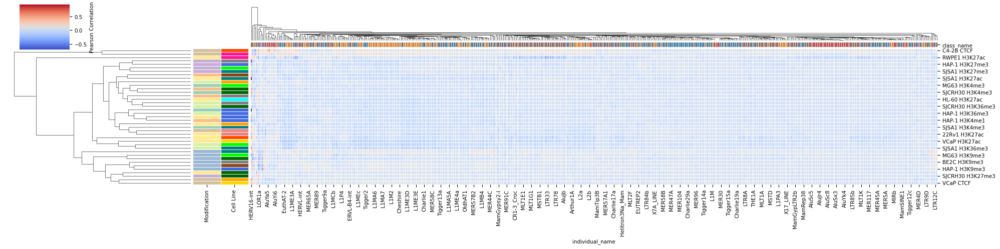

In [64]:
# plt.rcParams.update({"font.size": 16})

# --- 1. Prepare Row Colors ---
# Map the 'cell_line' and 'modification' columns to their respective colors
mapped_cell_colors = correlation_df_subfamilies["cell_line"].map(cell_line_p)
mapped_mod_colors = correlation_df_subfamilies["modification"].map(
    modification_p_richer
)

subfamilies_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

subfamilies_by_classes = subfamilies_by_classes.set_index("individual_name").reindex(
    subfamilies_names
)
mapped_subfamilies_colors = subfamilies_by_classes["class_name"].map(class_names_p)

# Create a DataFrame for the row_colors argument
# The column names (e.g., 'Cell Line') will appear as labels.
row_colors_df = pd.DataFrame(
    {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
)
# Important: The index must align with the data being plotted
row_colors_df.index = correlation_df_subfamilies.index


# --- 2. Plot the Clustermap ---
data_to_plot = correlation_df_subfamilies[subfamilies_names].T


g = sns.clustermap(
    data_to_plot.T,
    cmap="coolwarm",
    # Goal 1: Customize figsize
    figsize=(20, 5),
    # Goal 2 & 3: Add row colors using the mapped palettes
    # We use row_colors, as 'cell_line' and 'modification' describe the rows
    row_colors=row_colors_df[["Modification", "Cell Line"]],
    col_colors=mapped_subfamilies_colors,
    # Other aesthetic improvements
    # vmin=-1, vmax=1,          # Set colorbar limits for correlation
    linewidths=0.5,
    cbar_kws={"label": "Pearson Correlation"},
    # xticklabels=False, yticklabels=False
    # metric='correlation'      # Use correlation for clustering distance
)
# g.ax_col_dendrogram.set_visible(False)

# --- 3. Save the Figure ---
save_path = "./plots/signal_to_divergence_corr_clustermap_subfamilies.svg"
save_path_png = "./plots/signal_to_divergence_corr_clustermap_subfamilies.png"

# Goal 4: Save as SVG
g.savefig(save_path, format="svg")
g.savefig(save_path_png, format="png")

plt.show()

#### Clustermaps for different divergence cut-offs

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


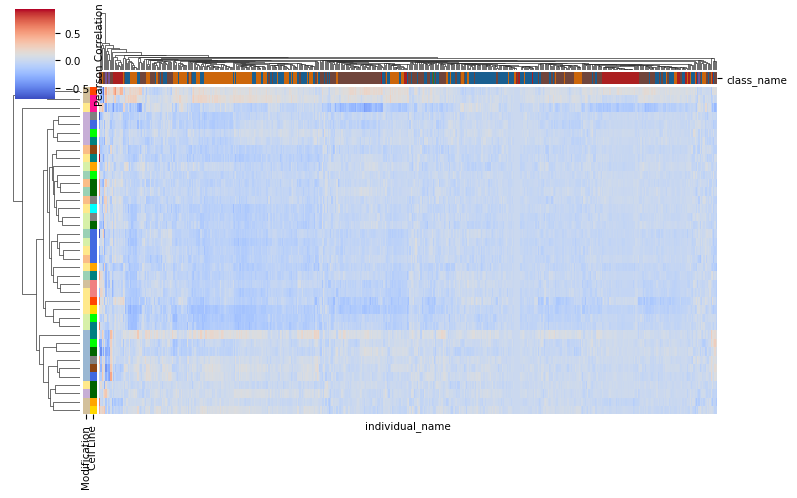

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


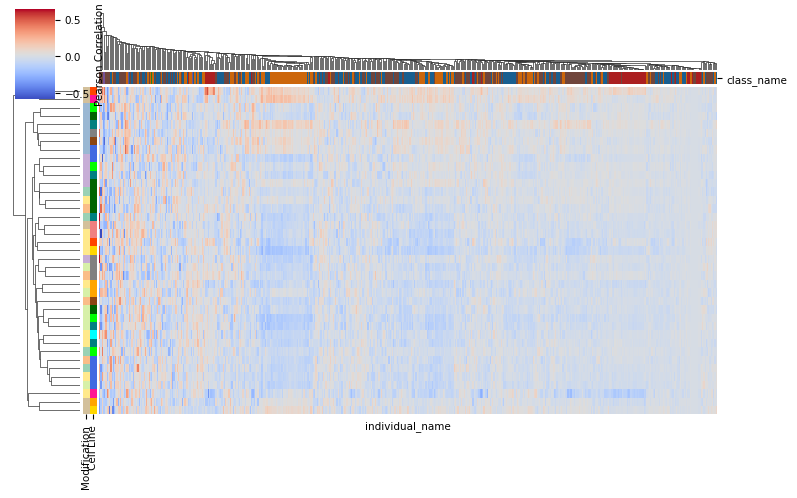

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


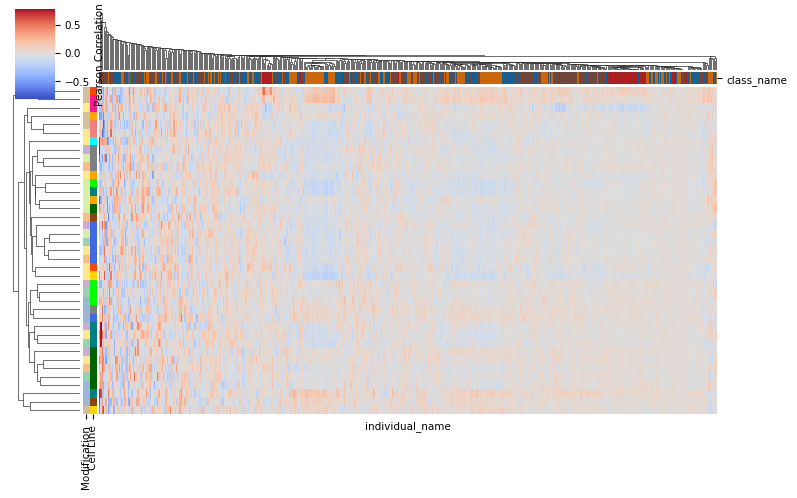

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


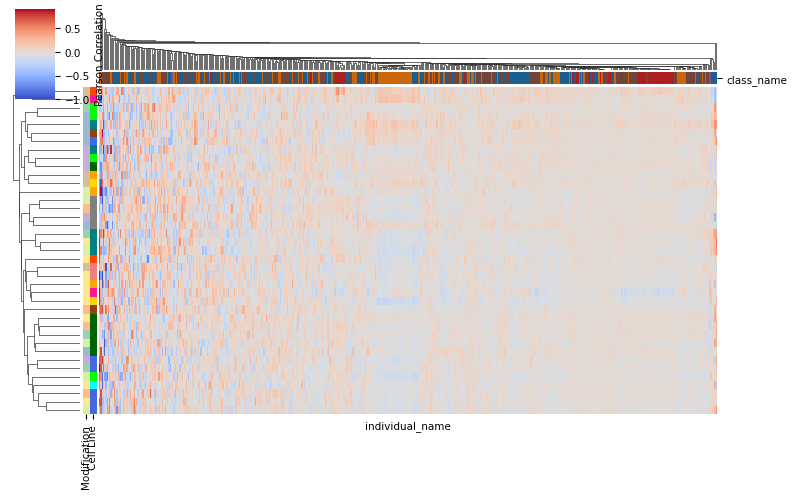

In [5]:
clustermap_dict = {}

for div_threshold in [100, 25, 22.5, 20]:
    correlation_df_subfamilies = pd.read_csv(
        f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
        index_col=0,
    )

    correlation_df_subfamilies = pd.pivot_table(
        correlation_df_subfamilies,
        values="r",
        index=["cell_line", "modification"],
        columns=["individual_name"],
        aggfunc="sum",
        fill_value=0,
    ).reset_index()
    correlation_df_subfamilies.index = (
        correlation_df_subfamilies.cell_line
        + " "
        + correlation_df_subfamilies.modification
    )

    subfamilies_counts = pd.read_csv("repeat_masker_individual_name_counts.csv")
    subfamilies_counts.columns = ["subfamily_name", "count"]

    subfamilies_names = subfamilies_counts["subfamily_name"][:500]

    mapped_cell_colors = correlation_df_subfamilies["cell_line"].map(cell_line_p)
    mapped_mod_colors = correlation_df_subfamilies["modification"].map(
        modification_p_richer
    )

    subfamilies_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

    subfamilies_by_classes = subfamilies_by_classes.set_index(
        "individual_name"
    ).reindex(subfamilies_names)
    mapped_subfamilies_colors = subfamilies_by_classes["class_name"].map(class_names_p)

    # Create a DataFrame for the row_colors argument
    # The column names (e.g., 'Cell Line') will appear as labels.
    row_colors_df = pd.DataFrame(
        {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
    )
    # Important: The index must align with the data being plotted
    row_colors_df.index = correlation_df_subfamilies.index

    # --- 2. Plot the Clustermap ---
    data_to_plot = correlation_df_subfamilies[subfamilies_names].T

    g = sns.clustermap(
        data_to_plot.T,
        cmap="coolwarm",
        # Goal 1: Customize figsize
        figsize=(8, 5),
        # Goal 2 & 3: Add row colors using the mapped palettes
        # We use row_colors, as 'cell_line' and 'modification' describe the rows
        row_colors=row_colors_df[["Modification", "Cell Line"]],
        col_colors=mapped_subfamilies_colors,
        # Other aesthetic improvements
        # vmin=-1, vmax=1,          # Set colorbar limits for correlation
        linewidths=0.0,
        cbar_kws={"label": "Pearson Correlation"},
        colors_ratio=(0.01, 0.03),
        xticklabels=False,
        yticklabels=False,
        dendrogram_ratio=(0.1, 0.15),
        # metric='correlation'      # Use correlation for clustering distance
    )
    clustermap_dict.update({div_threshold: g})
    # g.ax_col_dendrogram.set_visible(False)

    # --- 3. Save the Figure ---
    save_path = f"./plots/signal_to_divergence_corr_clustermap_subfamilies_{str(div_threshold)}.svg"
    save_path_png = f"./plots/signal_to_divergence_corr_clustermap_subfamilies_{str(div_threshold)}.png"

    # Goal 4: Save as SVG
    g.savefig(save_path, format="svg")
    g.savefig(save_path_png, format="png", transparent=True)

    plt.show()

#### Permutation test

In [43]:
# Calculate pairwise Euclidean distances
# Ensure you select only the numerical columns for distance calculation
distances = pdist(data_matrix, metric="euclidean")
# Convert the condensed distance matrix to a squareform matrix
distance_matrix_raw = squareform(distances)
pd.DataFrame(distance_matrix)

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,0.000000,3.341558,4.289003,4.512617,4.371045,4.374652,5.927663,4.162818,4.261968,4.716334,...,4.445020,3.943663,4.955950,4.666926,4.294769,4.728140,3.858442,5.242384,3.694132,4.054882
1,3.341558,0.000000,4.906209,4.471973,4.552365,4.790406,6.521843,4.024258,3.944025,4.994731,...,4.482028,3.817613,5.250252,4.440402,4.718574,4.531653,3.848679,5.733588,4.750366,3.498066
2,4.289003,4.906209,0.000000,3.879622,3.732190,4.026916,5.632108,4.676502,4.321334,5.104962,...,4.219353,3.958621,4.404336,4.497592,3.412029,4.635339,4.265205,5.723786,4.420380,4.503232
3,4.512617,4.471973,3.879622,0.000000,3.162112,4.004290,5.647819,4.712453,4.423120,5.339567,...,4.180300,4.033444,4.473580,4.308048,4.517751,3.428587,4.225612,5.991632,4.847122,3.986880
4,4.371045,4.552365,3.732190,3.162112,0.000000,4.174062,5.047177,4.658695,4.297796,5.513014,...,3.720543,3.773578,4.416836,4.384725,4.155414,4.294796,4.434526,5.817238,4.638159,4.153921
5,4.374652,4.790406,4.026916,4.004290,4.174062,0.000000,5.584284,5.268336,4.793225,3.911761,...,4.911809,4.279575,4.218596,4.982498,4.468346,5.080235,4.512022,4.040016,4.173435,5.370381
6,5.927663,6.521843,5.632108,5.647819,5.047177,5.584284,0.000000,6.306933,5.980029,6.019536,...,5.334640,5.378986,4.995142,5.834928,5.412828,6.308572,6.176165,5.812013,5.279033,6.496084
7,4.162818,4.024258,4.676502,4.712453,4.658695,5.268336,6.306933,0.000000,4.332514,5.622321,...,4.707282,4.421052,5.311185,4.905517,4.843486,4.687128,4.234725,6.139185,5.006609,3.713422
8,4.261968,3.944025,4.321334,4.423120,4.297796,4.793225,5.980029,4.332514,0.000000,4.682782,...,3.875040,3.887141,4.696567,4.019843,4.227735,4.364126,4.240597,5.692901,5.048505,4.108675
9,4.716334,4.994731,5.104962,5.339567,5.513014,3.911761,6.019536,5.622321,4.682782,0.000000,...,5.279568,4.885872,4.212825,5.042249,4.770713,5.565349,4.839004,4.041719,4.853149,5.755064


In [ ]:
skbio.stats.distance.SymmetricMatrix

In [65]:
# --- Helper Class for Colored Logging ---
class Logger:
    """A simple logger for pretty, colored console output."""

    BLUE = "\033[94m"
    GREEN = "\033[92m"
    YELLOW = "\033[93m"
    ENDC = "\033[0m"

    @staticmethod
    def info(message):
        print(f"{Logger.BLUE}INFO: {message}{Logger.ENDC}")

    @staticmethod
    def success(message):
        print(f"{Logger.GREEN}SUCCESS: {message}{Logger.ENDC}")

    @staticmethod
    def warning(message):
        print(f"{Logger.YELLOW}WARNING: {message}{Logger.ENDC}")


# --- 1. Load the Data ---
# (This logic is copied from your plotting script)
Logger.info("Loading correlation data...")
div_threshold = 100
try:

    correlation_df_individuals = pd.read_csv(
        f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
        index_col=0,
    )

    correlation_df_individuals = pd.pivot_table(
        correlation_df_individuals,
        values="r",
        index=["cell_line", "modification"],
        columns=["individual_name"],
        aggfunc="sum",
        fill_value=0,
    ).reset_index()
    correlation_df_individuals.index = (
        correlation_df_individuals.cell_line
        + " "
        + correlation_df_individuals.modification
    )
    # Get the list of TE names (all columns except the first two)
    individual_names = list(correlation_df_individuals.columns[2:])

except FileNotFoundError:
    Logger.warning(
        "Error: Data file not found. This script must run after the correlation script."
    )
    exit()

# --- 2. Prepare Data for PERMANOVA ---
Logger.info("Preparing data for PERMANOVA test...")

data_matrix = correlation_df_individuals[individual_names]
grouping_df = correlation_df_individuals[["cell_line", "modification"]]

# --- 3. Calculate the Distance Matrix ---
# We use 'euclidean' as it's the default metric for sns.clustermap.
# This ensures we are testing the same clustering the user is seeing.
Logger.info("Calculating Euclidean distance matrix...")
distances = pdist(data_matrix, metric="euclidean")
# Convert the condensed distance matrix to a squareform matrix
distance_matrix_raw = squareform(distances)

# Convert to skbio's DistanceMatrix object, using the index
# (This is good practice, though not strictly required)
# dist_matrix = DistanceMatrix(dist_matrix_raw, ids=grouping_df.index)
dist_matrix = DistanceMatrix(PairwiseMatrix(distance_matrix_raw), ids=grouping_df.index)

# We use 9999 permutations for a robust p-value.
Logger.info("Running PERMANOVA (9999 permutations)...")

# Test 'Modification' alone
results_mod = permanova(dist_matrix, grouping_df["modification"], permutations=1000000)

# Test 'Cell Line' alone
results_cell = permanova(dist_matrix, grouping_df["cell_line"], permutations=1000000)


# --- 5. Print the Results ---
Logger.success("\n--- PERMANOVA Test Results ---")

print("\n--- Test 1: Clustering by 'Modification' ---")
print(f"  R-squared: {results_mod['R^2']:.4f}")
print(f"  p-value:   {results_mod['p-value']:.4f}")
if results_mod["p-value"] < 0.05:
    print("  RESULT: Clustering by 'Modification' is STATISTICALLY SIGNIFICANT.")
else:
    print("  RESULT: Clustering by 'Modification' is NOT significant.")

print("\n--- Test 2: Clustering by 'Cell Line' ---")
print(f"  R-squared: {results_cell['R^2']:.4f}")
print(f"  p-value:   {results_cell['p-value']:.4f}")
if results_cell["p-value"] < 0.05:
    print("  RESULT: Clustering by 'Cell Line' is STATISTICALLY SIGNIFICANT.")
else:
    print("  RESULT: Clustering by 'Cell Line' is NOT significant.")


print("\n--- Interpretation ---")
print("R-squared (R^2) is the effect size. It shows how much of the variation")
print("in the distance matrix is 'explained' by the grouping variable(s).")
print("A high R^2 for 'Cell Line' and a low R^2 for 'Modification'")
print(
    "would suggest that the primary clustering is driven by cell line, not modification."
)

INFO: Loading correlation data...
INFO: Preparing data for PERMANOVA test...
INFO: Calculating Euclidean distance matrix...
INFO: Running PERMANOVA (9999 permutations)...
SUCCESS: 
--- PERMANOVA Test Results ---

--- Test 1: Clustering by 'Modification' ---


KeyError: 'R^2'

In [66]:
results_mod

method name               PERMANOVA
test statistic name        pseudo-F
sample size                      39
number of groups                  7
test statistic             2.586387
p-value                    0.000001
number of permutations      1000000
Name: PERMANOVA results, dtype: object

In [67]:
results_cell

method name               PERMANOVA
test statistic name        pseudo-F
sample size                      39
number of groups                 12
test statistic             1.701999
p-value                    0.000001
number of permutations      1000000
Name: PERMANOVA results, dtype: object

In [68]:
r2 = 1 - 1 / (
    1 + results_mod[4] * results_mod[3] / (results_mod[2] - results_mod[3] - 1)
)
r2

/tmp/ipykernel_144/2508986845.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  1 + results_mod[4] * results_mod[3] / (results_mod[2] - results_mod[3] - 1)


np.float64(0.3686959748816967)

In [69]:
r2 = 1 - 1 / (
    1 + results_cell[4] * results_cell[3] / (results_cell[2] - results_cell[3] - 1)
)
r2

/tmp/ipykernel_144/343711713.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  1 + results_cell[4] * results_cell[3] / (results_cell[2] - results_cell[3] - 1)


np.float64(0.43994477263545995)

In [10]:
np.allclose(distance_matrix_raw, distance_matrix_raw.T, rtol=1e-05, atol=1e-08)

True

In [11]:
pd.DataFrame(distance_matrix_raw).dropna()

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,0.000000,3.430279,4.337724,4.562592,4.470592,4.437788,6.215937,4.271469,4.393714,5.007887,...,4.959864,4.104978,5.228166,4.542612,4.486948,4.690136,4.130797,5.527233,4.243054,4.387917
1,3.430279,0.000000,4.732378,4.749592,4.752731,5.140769,6.728204,4.391848,4.307307,5.497472,...,4.987656,4.411091,5.658375,4.674512,4.907784,4.791058,4.240117,6.169763,5.160496,3.978885
2,4.337724,4.732378,0.000000,4.234775,4.056008,4.708797,5.702540,4.661976,4.376619,5.265558,...,4.773962,4.388408,4.682123,4.638003,4.185466,5.003764,4.720007,6.236455,5.134641,4.540386
3,4.562592,4.749592,4.234775,0.000000,3.119273,4.072829,5.729932,4.848953,4.616668,5.179190,...,4.575866,4.443029,4.681706,4.497196,4.803131,4.083631,4.439183,6.038106,5.265258,4.529244
4,4.470592,4.752731,4.056008,3.119273,0.000000,4.349227,5.269801,4.878800,4.332091,5.416691,...,4.080766,4.183451,4.616135,4.528003,4.492026,4.699303,4.633715,5.940723,5.035826,4.581902
5,4.437788,5.140769,4.708797,4.072829,4.349227,0.000000,5.728134,5.438854,5.095651,3.782027,...,5.280940,4.500001,4.678802,5.191281,4.727890,5.224815,4.461452,4.063564,4.475364,5.873387
6,6.215937,6.728204,5.702540,5.729932,5.269801,5.728134,0.000000,6.588798,6.045175,5.936491,...,5.541074,5.411766,5.524578,5.823206,5.592922,6.602975,6.388285,5.952594,5.298899,7.025180
7,4.271469,4.391848,4.661976,4.848953,4.878800,5.438854,6.588798,0.000000,4.584346,5.735666,...,5.138668,4.857855,5.525296,4.756087,5.076007,4.731148,4.584093,6.453420,5.250256,3.988759
8,4.393714,4.307307,4.376619,4.616668,4.332091,5.095651,6.045175,4.584346,0.000000,5.050893,...,4.258487,4.113443,4.918923,4.301166,4.392920,4.524651,4.436705,6.015490,5.390936,4.431965
9,5.007887,5.497472,5.265558,5.179190,5.416691,3.782027,5.936491,5.735666,5.050893,0.000000,...,5.769274,5.048563,4.461656,5.358773,4.982490,5.440222,4.931231,4.231361,4.893455,6.206388


### Clustermap dendrogram comparison by divergence cut-off (cophenetic distance)

In [5]:
clustermap_dict

{100: <seaborn.matrix.ClusterGrid at 0x7f9afa0c3340>,
 25: <seaborn.matrix.ClusterGrid at 0x7f9afa0c3640>,
 22.5: <seaborn.matrix.ClusterGrid at 0x7f9afa0c3f70>,
 20: <seaborn.matrix.ClusterGrid at 0x7f9af79dda80>}

In [18]:
len(clustermap_dict[20].dendrogram_col.reordered_ind)

500

Comparing trees based on 39 common terminal nodes.
Running 499 permutations on common leaf subset...
Observed Congruence: 0.0481
P-value: 0.2820


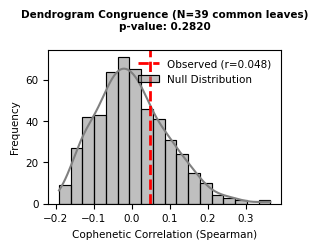

Success: Permutation test plot saved to plots/dendrogram_congruence_subfamilies_all_vs_25_cut.svg


In [7]:
results = test_dendrogram_congruence(
    clustermap_dict[100], clustermap_dict[25], method="spearman", n_permutations=499
)

print(f"Observed Congruence: {results['observed_correlation']:.4f}")
print(f"P-value: {results['p_value']:.4f}")

plot_test_results(
    results, output_path="plots/dendrogram_congruence_subfamilies_all_vs_25_cut.svg"
)

Comparing trees based on 39 common terminal nodes.
Running 499 permutations on common leaf subset...
Observed Congruence: -0.1712
P-value: 0.9760


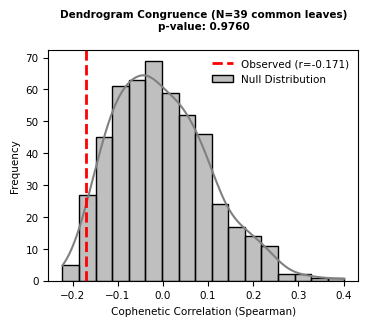

Success: Permutation test plot saved to plots/dendrogram_congruence_subfamilies_all_vs_225_cut.svg


In [20]:
results = test_dendrogram_congruence(
    clustermap_dict[100], clustermap_dict[22.5], method="spearman", n_permutations=499
)

print(f"Observed Congruence: {results['observed_correlation']:.4f}")
print(f"P-value: {results['p_value']:.4f}")

plot_test_results(
    results, output_path="plots/dendrogram_congruence_subfamilies_all_vs_225_cut.svg"
)

Comparing trees based on 39 common terminal nodes.
Running 499 permutations on common leaf subset...
Observed Congruence: 0.0803
P-value: 0.1780


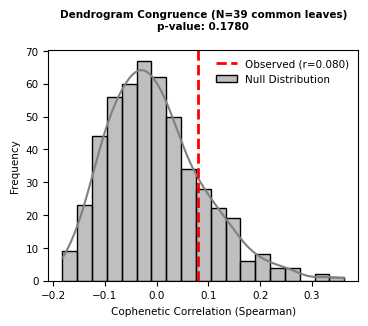

Success: Permutation test plot saved to plots/dendrogram_congruence_subfamilies_all_vs_20_cut.svg


In [23]:
results = test_dendrogram_congruence(
    clustermap_dict[100], clustermap_dict[20], method="spearman", n_permutations=499
)

print(f"Observed Congruence: {results['observed_correlation']:.4f}")
print(f"P-value: {results['p_value']:.4f}")

plot_test_results(
    results, output_path="plots/dendrogram_congruence_subfamilies_all_vs_20_cut.svg"
)

Comparing trees based on 39 common terminal nodes.
Running 499 permutations on common leaf subset...
Observed Congruence: -0.1063
P-value: 0.8780


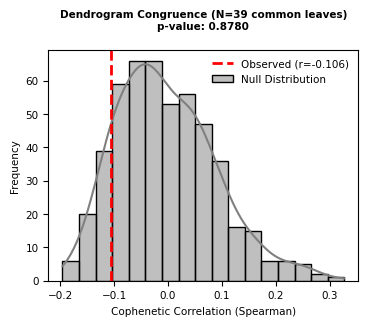

Success: Permutation test plot saved to plots/dendrogram_congruence_subfamilies_25_vs_20_cut.svg


In [24]:
results = test_dendrogram_congruence(
    clustermap_dict[25], clustermap_dict[20], method="spearman", n_permutations=499
)

print(f"Observed Congruence: {results['observed_correlation']:.4f}")
print(f"P-value: {results['p_value']:.4f}")

plot_test_results(
    results, output_path="plots/dendrogram_congruence_subfamilies_25_vs_20_cut.svg"
)

Comparing trees based on 39 common terminal nodes.
Running 499 permutations on common leaf subset...
Observed Congruence: 0.0230
P-value: 0.3960


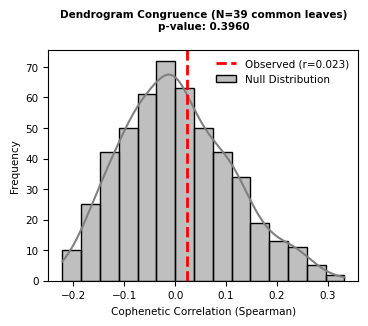

Success: Permutation test plot saved to plots/dendrogram_congruence_subfamilies_25_vs_225_cut.svg


In [25]:
results = test_dendrogram_congruence(
    clustermap_dict[25], clustermap_dict[22.5], method="spearman", n_permutations=499
)

print(f"Observed Congruence: {results['observed_correlation']:.4f}")
print(f"P-value: {results['p_value']:.4f}")

plot_test_results(
    results, output_path="plots/dendrogram_congruence_subfamilies_25_vs_225_cut.svg"
)

Comparing trees based on 39 common terminal nodes.
Running 499 permutations on common leaf subset...
Observed Congruence: -0.0446
P-value: 0.6140


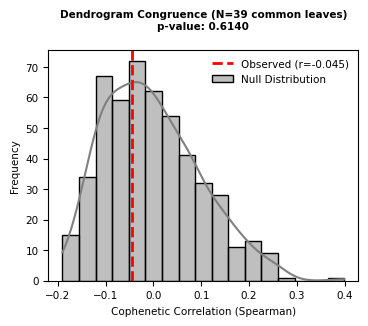

Success: Permutation test plot saved to plots/dendrogram_congruence_subfamilies_225_vs_20_cut.svg


In [26]:
results = test_dendrogram_congruence(
    clustermap_dict[22.5], clustermap_dict[20], method="spearman", n_permutations=499
)

print(f"Observed Congruence: {results['observed_correlation']:.4f}")
print(f"P-value: {results['p_value']:.4f}")

plot_test_results(
    results, output_path="plots/dendrogram_congruence_subfamilies_225_vs_20_cut.svg"
)

### Clustermaps by TE class

In [6]:
individuals_by_classes

,Unnamed: 0,class_name
individual_name,,
L1MC3,0,LINE
LTR60B,1,LTR
MER34C_v,3,LTR
MSTA1,4,LTR
MER4A1,5,LTR
...,...,...
HERV1_I,979458,LTR
HERV1_LTRe,1080619,LTR
HERV1_LTRb,1353517,LTR


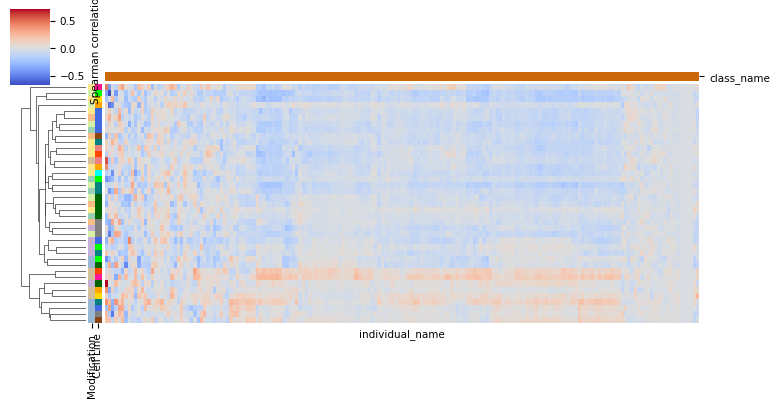

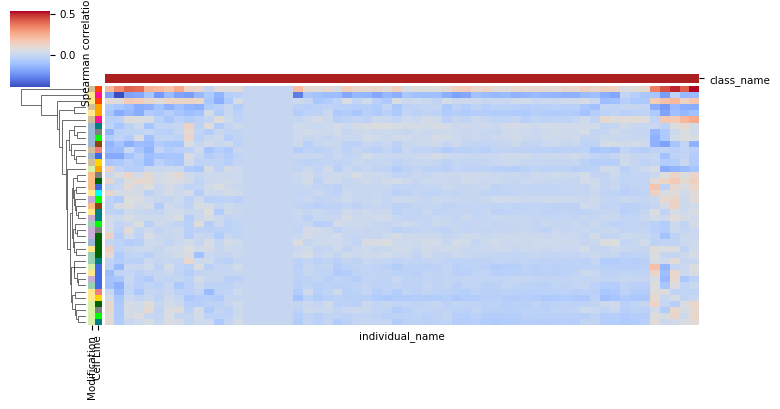

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


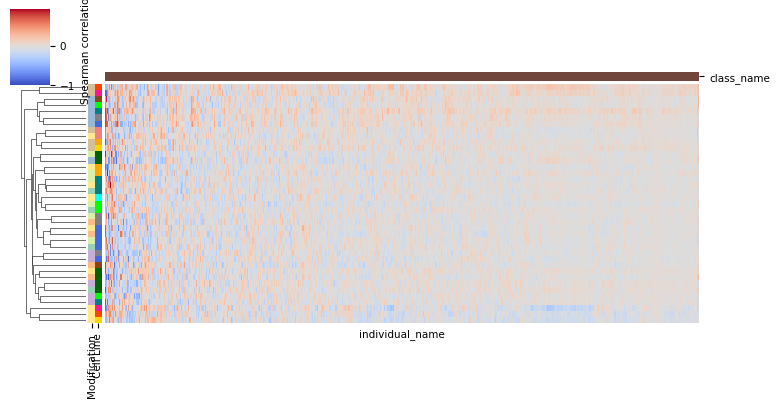

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


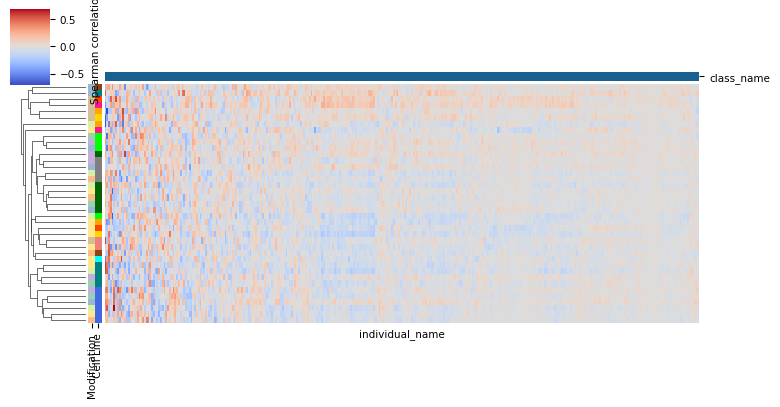

In [19]:
div_threshold = 100
correlation_df_subfamilies = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
    index_col=0,
)

correlation_df_subfamilies = pd.pivot_table(
    correlation_df_subfamilies,
    values="r",
    index=["cell_line", "modification"],
    columns=["individual_name"],
    aggfunc="sum",
    fill_value=0,
).reset_index()
correlation_df_subfamilies.index = (
    correlation_df_subfamilies.cell_line + " " + correlation_df_subfamilies.modification
)


clustermap_dict = {}

for class_name in ["LINE", "SINE", "LTR", "DNA"]:
    correlation_df_individuals = correlation_df_subfamilies.copy()
    individuals_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

    individuals_by_classes = individuals_by_classes.set_index("individual_name")
    individual_names = individuals_by_classes.index[
        individuals_by_classes["class_name"] == class_name
    ]

    plt.rcParams.update({"font.size": 16})

    # --- 1. Prepare Row Colors ---
    # Map the 'cell_line' and 'modification' columns to their respective colors
    mapped_cell_colors = correlation_df_individuals["cell_line"].map(cell_line_p)
    mapped_mod_colors = correlation_df_individuals["modification"].map(
        modification_p_richer
    )

    individuals_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

    individuals_by_classes = individuals_by_classes.set_index(
        "individual_name"
    ).reindex(individual_names)
    mapped_individuals_colors = individuals_by_classes["class_name"].map(class_names_p)

    # Create a DataFrame for the row_colors argument
    # The column names (e.g., 'Cell Line') will appear as labels.
    row_colors_df = pd.DataFrame(
        {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
    )
    # Important: The index must align with the data being plotted
    row_colors_df.index = correlation_df_individuals.index

    # --- 2. Plot the Clustermap ---
    data_to_plot = correlation_df_individuals[individual_names].T

    g = sns.clustermap(
        data_to_plot.T,
        cmap="coolwarm",
        # Goal 1: Customize figsize
        figsize=(8, 4.2),
        # Goal 2 & 3: Add row colors using the mapped palettes
        # We use row_colors, as 'cell_line' and 'modification' describe the rows
        row_colors=row_colors_df[["Modification", "Cell Line"]],
        col_colors=mapped_individuals_colors,
        # Other aesthetic improvements
        # vmin=-1, vmax=1,          # Set colorbar limits for correlation
        cbar_kws={"label": "Spearman correlation"},
        xticklabels=False,
        yticklabels=False,
        linewidths=0.0,
        colors_ratio=(0.01, 0.03),
        dendrogram_ratio=(0.1, 0.15),
        # metric='correlation'      # Use correlation for clustering distance
    )
    clustermap_dict.update({class_name: g})
    g.ax_col_dendrogram.set_visible(False)

    # --- 3. Save the Figure ---
    save_path = (
        f"./plots/signal_to_divergence_corr_clustermap_subfamilies_{class_name}.svg"
    )
    save_path_png = (
        f"./plots/signal_to_divergence_corr_clustermap_subfamilies_{class_name}.png"
    )

    # Goal 4: Save as SVG
    g.savefig(save_path, format="svg", transparent=True)
    g.savefig(save_path_png, format="png")

    plt.show()

/home/jovyan/venvs/bioreactor/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/jovyan/venvs/bioreactor/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


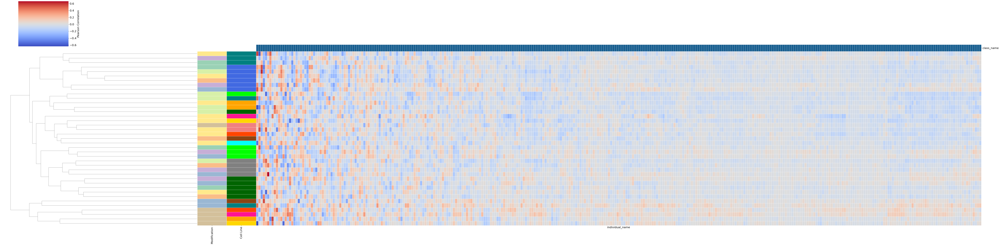

In [10]:
class_name = "DNA"

individuals_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

individuals_by_classes = individuals_by_classes.set_index("individual_name")
individual_names = individuals_by_classes.index[
    individuals_by_classes["class_name"] == class_name
]


plt.rcParams.update({"font.size": 16})

# --- 1. Prepare Row Colors ---
# Map the 'cell_line' and 'modification' columns to their respective colors
mapped_cell_colors = correlation_df_individuals["cell_line"].map(cell_line_p)
mapped_mod_colors = correlation_df_individuals["modification"].map(
    modification_p_richer
)

individuals_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()

individuals_by_classes = individuals_by_classes.set_index("individual_name").reindex(
    individual_names
)
mapped_individuals_colors = individuals_by_classes["class_name"].map(class_names_p)

# Create a DataFrame for the row_colors argument
# The column names (e.g., 'Cell Line') will appear as labels.
row_colors_df = pd.DataFrame(
    {"Cell Line": mapped_cell_colors, "Modification": mapped_mod_colors}
)
# Important: The index must align with the data being plotted
row_colors_df.index = correlation_df_individuals.index


# --- 2. Plot the Clustermap ---
data_to_plot = correlation_df_individuals[individual_names].T


g = sns.clustermap(
    data_to_plot.T,
    cmap="coolwarm",
    # Goal 1: Customize figsize
    figsize=(80, 20),
    # Goal 2 & 3: Add row colors using the mapped palettes
    # We use row_colors, as 'cell_line' and 'modification' describe the rows
    row_colors=row_colors_df[["Modification", "Cell Line"]],
    col_colors=mapped_individuals_colors,
    # Other aesthetic improvements
    # vmin=-1, vmax=1,          # Set colorbar limits for correlation
    linewidths=0.5,
    cbar_kws={"label": "Pearson Correlation"},
    xticklabels=False,
    yticklabels=False,
    # metric='correlation'      # Use correlation for clustering distance
)
g.ax_col_dendrogram.set_visible(False)

# --- 3. Save the Figure ---
save_path = f"./plots/signal_to_divergence_corr_clustermap_individuals_{class_name}.svg"
save_path_png = (
    f"./plots/signal_to_divergence_corr_clustermap_individuals_{class_name}.png"
)

# Goal 4: Save as SVG
g.savefig(save_path, format="svg")
g.savefig(save_path_png, format="png")

plt.show()

### Curtosis etc

In [32]:
div_threshold = 100
correlation_df_subfamilies = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
    index_col=0,
)
correlation_df_subfamilies["abs_r"] = correlation_df_subfamilies.r.abs()
correlation_df_subfamilies["transformed_corr"] = np.arctanh(
    correlation_df_subfamilies.r
)

correlation_df_subfamilies = correlation_df_subfamilies.dropna()
correlation_df_subfamilies

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in arctanh
  result = getattr(ufunc, method)(*inputs, **kwargs)


,cell_line,modification,individual_name,r,p_value,ci_low,ci_high,abs_r,transformed_corr
0,Caco-2,H3K4me1,AluSx,-0.023583,3.484427e-37,-0.027210,-0.019956,0.023583,-0.023588
1,Caco-2,H3K4me1,AluJb,-0.015518,1.785875e-14,-0.019486,-0.011551,0.015518,-0.015520
2,Caco-2,H3K4me1,MIRb,-0.026459,2.255033e-32,-0.030834,-0.022082,0.026459,-0.026465
3,Caco-2,H3K4me1,MIR,-0.033242,6.082002e-38,-0.038298,-0.028184,0.033242,-0.033254
4,Caco-2,H3K4me1,AluY,-0.012128,9.676865e-05,-0.018224,-0.006031,0.012128,-0.012128
...,...,...,...,...,...,...,...,...,...
44568,RWPE1,H3K27ac,Eulor7,-0.200000,5.795840e-01,-0.740191,0.497091,0.200000,-0.202733
44569,RWPE1,H3K27ac,HERV-Fc2-int,0.474166,1.661919e-01,-0.259802,0.860886,0.474166,0.515431
44570,RWPE1,H3K27ac,HERVK11D-int,0.404762,3.198886e-01,-0.448152,0.871924,0.404762,0.429331
44571,RWPE1,H3K27ac,HERV1_LTRb,-0.119048,7.788857e-01,-0.761274,0.641082,0.119048,-0.119615


In [26]:
correlation_df_subfamilies[correlation_df_subfamilies["r"].abs() > 0.2]

,cell_line,modification,individual_name,r,p_value,ci_low,ci_high,abs_r,transformed_corr
306,Caco-2,H3K4me1,HERV16-int,0.510465,0.160267,-0.279669,0.888349,0.510465,0.563358
649,Caco-2,H3K4me1,LTR5B,0.248683,0.000002,0.147743,0.344496,0.248683,0.254009
665,Caco-2,H3K4me1,LTR7C,-0.213097,0.010609,-0.366116,-0.048858,0.213097,-0.216414
686,Caco-2,H3K4me1,MER41-int,-0.221381,0.000221,-0.332482,-0.104218,0.221381,-0.225107
745,Caco-2,H3K4me1,MER84,-0.201066,0.001219,-0.316996,-0.079216,0.201066,-0.203843
...,...,...,...,...,...,...,...,...,...
44565,RWPE1,H3K27ac,HERV1_LTRd,0.447552,0.144586,-0.200853,0.823273,0.447552,0.481635
44566,RWPE1,H3K27ac,HERV1_I,-0.245455,0.466922,-0.741535,0.424150,0.245455,-0.250570
44569,RWPE1,H3K27ac,HERV-Fc2-int,0.474166,0.166192,-0.259802,0.860886,0.474166,0.515431
44570,RWPE1,H3K27ac,HERVK11D-int,0.404762,0.319889,-0.448152,0.871924,0.404762,0.429331


In [27]:
correlation_df_subfamilies[correlation_df_subfamilies["r"].abs() > 0.4]

,cell_line,modification,individual_name,r,p_value,ci_low,ci_high,abs_r,transformed_corr
306,Caco-2,H3K4me1,HERV16-int,0.510465,1.602667e-01,-0.279669,0.888349,0.510465,0.563358
901,Caco-2,H3K4me1,HERVE-int,-0.576468,5.800089e-13,-0.688046,-0.438264,0.576468,-0.657157
985,Caco-2,H3K4me1,HERVL18-int,0.409699,6.692794e-05,0.211949,0.575219,0.409699,0.435250
1045,Caco-2,H3K4me1,Eulor12,-0.421603,2.552425e-03,-0.635858,-0.147018,0.421603,-0.449640
1058,Caco-2,H3K4me1,HERVS71-int,-0.453058,4.864471e-03,-0.686603,-0.134759,0.453058,-0.488542
...,...,...,...,...,...,...,...,...,...
44551,RWPE1,H3K27ac,HERV15-int,0.434066,1.383424e-01,-0.181407,0.805201,0.434066,0.464896
44565,RWPE1,H3K27ac,HERV1_LTRd,0.447552,1.445863e-01,-0.200853,0.823273,0.447552,0.481635
44569,RWPE1,H3K27ac,HERV-Fc2-int,0.474166,1.661919e-01,-0.259802,0.860886,0.474166,0.515431
44570,RWPE1,H3K27ac,HERVK11D-int,0.404762,3.198886e-01,-0.448152,0.871924,0.404762,0.429331


<Axes: xlabel='transformed_corr', ylabel='Count'>

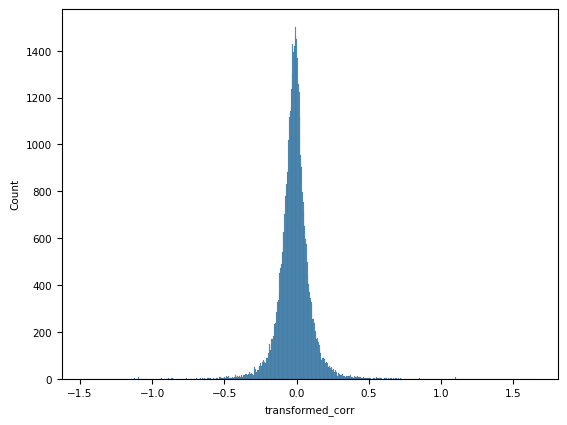

In [28]:
sns.histplot(correlation_df_subfamilies.transformed_corr)

In [43]:

clean_transformed_r = correlation_df_subfamilies.transformed_corr[np.isfinite(correlation_df_subfamilies.transformed_corr)]

clean_transformed_r


0       -0.023588
1       -0.015520
2       -0.026465
3       -0.033254
4       -0.012128
           ...   
44568   -0.202733
44569    0.515431
44570    0.429331
44571   -0.119615
44572   -1.098612
Name: transformed_corr, Length: 43757, dtype: float64

In [44]:
stats.shapiro(clean_transformed_r)

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 43757.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.8821565766459223), pvalue=np.float64(4.3894956198744816e-98))

In [46]:
stats.kurtosistest(clean_transformed_r)

KurtosistestResult(statistic=np.float64(96.82036749226256), pvalue=np.float64(0.0))

In [31]:
stats.kurtosis(correlation_df_subfamilies.transformed_corr)

np.float64(nan)

### Levene test for variances comparison between multiple groups

In [51]:
div_threshold = 100
correlation_df_subfamilies = pd.read_csv(
    f"Signal_vs_true_div_corr_by_lines_mods_subfamilies_cut_{str(div_threshold)}.csv",
    index_col=0,
)
correlation_df_subfamilies["transformed_corr"] = np.arctanh(
    correlation_df_subfamilies.r
)
correlation_df_subfamilies.replace([np.inf, -np.inf], np.nan, inplace=True)
correlation_df_subfamilies = correlation_df_subfamilies.dropna()


individuals_by_classes = pd.read_csv("individuals_by_classes_TE.csv").dropna()
correlation_df_subfamilies = correlation_df_subfamilies.merge(individuals_by_classes)

correlation_df_subfamilies

/home/jovyan/venvs/retroelements/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in arctanh
  result = getattr(ufunc, method)(*inputs, **kwargs)


,cell_line,modification,individual_name,r,p_value,ci_low,ci_high,transformed_corr,Unnamed: 0,class_name
0,Caco-2,H3K4me1,AluSx,-0.023583,3.484427e-37,-0.027210,-0.019956,-0.023588,18,SINE
1,Caco-2,H3K4me1,AluJb,-0.015518,1.785875e-14,-0.019486,-0.011551,-0.015520,16,SINE
2,Caco-2,H3K4me1,MIRb,-0.026459,2.255033e-32,-0.030834,-0.022082,-0.026465,14,SINE
3,Caco-2,H3K4me1,MIR,-0.033242,6.082002e-38,-0.038298,-0.028184,-0.033254,75,SINE
4,Caco-2,H3K4me1,AluY,-0.012128,9.676865e-05,-0.018224,-0.006031,-0.012128,10,SINE
...,...,...,...,...,...,...,...,...,...,...
43752,RWPE1,H3K27ac,Eulor7,-0.200000,5.795840e-01,-0.740191,0.497091,-0.202733,135375,DNA
43753,RWPE1,H3K27ac,HERV-Fc2-int,0.474166,1.661919e-01,-0.259802,0.860886,0.515431,168614,LTR
43754,RWPE1,H3K27ac,HERVK11D-int,0.404762,3.198886e-01,-0.448152,0.871924,0.429331,304201,LTR
43755,RWPE1,H3K27ac,HERV1_LTRb,-0.119048,7.788857e-01,-0.761274,0.641082,-0.119615,1353517,LTR


In [7]:
compare_list

[0       -0.023588
 1       -0.015520
 2       -0.026465
 3       -0.033254
 4       -0.012128
            ...   
 21313    0.127967
 21314    0.122186
 21315    0.023814
 21316    0.143841
 21317   -1.098612
 Name: transformed_corr, Length: 4488, dtype: float64,
 1122    -0.002499
 1123     0.015539
 1124     0.030995
 1125     0.025744
 1126    -0.016429
            ...   
 28045   -0.237712
 28046   -0.228838
 28047   -0.119615
 28048   -0.023814
 28049   -0.693147
 Name: transformed_corr, Length: 6732, dtype: float64,
 2244     0.006663
 2245     0.010523
 2246    -0.005114
 2247     0.008000
 2248     0.007567
            ...   
 43753   -0.202733
 43754    0.515431
 43755    0.429331
 43756   -0.119615
 43757   -1.098612
 Name: transformed_corr, Length: 10098, dtype: float64,
 5610    -0.021760
 5611    -0.008814
 5612    -0.020816
 5613    -0.039421
 5614    -0.021228
            ...   
 39265   -0.861383
 39266    0.410691
 39267    1.497866
 39268   -0.071550
 39269   -0.69314

In [53]:
from scipy.stats import levene

compare_list = [
    correlation_df_subfamilies["transformed_corr"][
        correlation_df_subfamilies["class_name"] == class_name
    ]
    for class_name in correlation_df_subfamilies["class_name"].unique()
]

levene(*compare_list)

LeveneResult(statistic=np.float64(160.92612773865636), pvalue=np.float64(4.334339133214774e-170))

In [54]:
from scipy.stats import levene

compare_list = [
    correlation_df_subfamilies["transformed_corr"][
        correlation_df_subfamilies["modification"] == modification
    ]
    for modification in correlation_df_subfamilies["modification"].unique()
]

levene(*compare_list)

LeveneResult(statistic=np.float64(28.732323288369603), pvalue=np.float64(1.6419742888918076e-34))

In [55]:
from scipy.stats import levene

compare_list = [
    correlation_df_subfamilies["transformed_corr"][
        correlation_df_subfamilies["cell_line"] == cell_line
    ]
    for cell_line in correlation_df_subfamilies["cell_line"].unique()
]

levene(*compare_list)

LeveneResult(statistic=np.float64(56.53177006317891), pvalue=np.float64(2.482756800976951e-125))

# Epigenetic signals, GRE/NGRE - separate notebook and article
